### Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import dates as mdates
from matplotlib.dates import MonthLocator, DateFormatter
import warnings
import random 
import numpy as np
warnings.filterwarnings('ignore')
from sklearn.linear_model import LinearRegression
import seaborn as sns
import scipy.stats as sp

### Reading from csv and converting the object to necessary data type

In [2]:
# df.to_csv('{}.csv'.format(ticker),index=None)
myData = pd.read_csv("Water_Consumption_And_Cost__2013_-_Feb_2022_.csv",index_col=False)
myData['Current Charges']=myData['Current Charges'].str.replace(',', '').astype(float)
myData['Consumption (HCF)']=myData['Consumption (HCF)'].str.replace(',', '').astype(float)
myData["Revenue Month"] = pd.to_datetime(myData["Revenue Month"])
myData["Consumption (H gallons)"] = myData['Consumption (HCF)']*7.4805194805 #converting HCF to H gallons

Note: The intial data set were in the form of object. Because it is hard to deal with the object we first converted those variables to required data types. For example: we converted the Revenue Month column which was intially object to date and time column which will be easier for the analyis in our data. Similarly, we converted Current charges, Consumption(HCF) Column as well to float data type. After that, to be more familier with the data set, we converted Consumption column measurement scale from hundred cubic feet to Hundred gallons. 

**Duplicate data cleaning**

In [3]:
print('Total number of data:', len(myData))
# Remove all duplicate rows 
myData = myData.drop_duplicates(keep=False)
print('Total number of Final data after cleaning:',len(myData))

Total number of data: 46747
Total number of Final data after cleaning: 36397


Note: While dealing with data set, it is possibale that data set can have multiple duplicates rows. So, we need to be careful with those duplicate values which may lead us to false results. Thus, we can remove those duplicates value and kepp the original values only for precise results. In our data set, we have total number of 46,747 number of rows. After cleaning or removing the duplicate row, we will be now working with 36,397 data set for our our further analysis.  

### Seperating the values in terms of borough

In [4]:
manhattan_df= myData.loc[myData['Borough']=='MANHATTAN']
print(len(manhattan_df))
queens_df= myData.loc[myData['Borough']=='QUEENS']
print(len(queens_df))
brooklyn_df= myData.loc[myData['Borough']=='BROOKLYN']
print(len(brooklyn_df))
bronx_df= myData.loc[myData['Borough']=='BRONX']
print(len(bronx_df))
fha_df=myData.loc[myData['Borough']=='FHA']
print(len(fha_df))
staten_island_df= myData.loc[myData['Borough']=='STATEN ISLAND']
print(len(staten_island_df))
non_development_facility_df = myData.loc[myData['Borough']=='NON DEVELOPMENT FACILITY']
print(len(non_development_facility_df))

5962
3054
6598
3586
17083
85
29


Note: Now, we will be seperating the rows in terms of borough of New York City to analyze each data set closly. Also, we will be able to see the patterns of each borough of NYC and we will compare them to find their consumption and charges pattern. Eventhough NYC has five borough, our data set is representing two extra informations as borough. They are FHA and Non-Development Facility with 17083 and 29 rows respectively. We will also analyze them. Similarly, Manhattan, Queens, brooklyn, Bronx and Staten Island have 5962, 3054,6598,3586, and 85 rows respectivly. Now, Lets us view each of the borough individually, 

### 1. Brooklyn 

 **a. Calculating Mean and Std**

In [5]:
brooklyn_df_imp = brooklyn_df[["Revenue Month",'Meter Number','Current Charges','Consumption (H gallons)']]
print(brooklyn_df_imp.describe())

brooklyn_std_current_charge_df = brooklyn_df_imp['Current Charges'].std()
brooklyn_std_consumption_df = brooklyn_df_imp['Consumption (H gallons)'].std()
brooklyn_mean_current_charge_df = brooklyn_df_imp['Current Charges'].mean()
brooklyn_mean_consumption_df = brooklyn_df_imp['Consumption (H gallons)'].mean()

print('Standard deviation of Brooklyn current charges is:',brooklyn_std_current_charge_df)
print('Standard deviation of Brooklyn consumption (H gallons) is:',brooklyn_std_consumption_df)
print('Mean of Brooklyn current charges is:',brooklyn_mean_current_charge_df)
print('Mean of Brooklyn consumption (H gallons) is:',brooklyn_mean_consumption_df)

       Current Charges  Consumption (H gallons)
count      6598.000000              6598.000000
mean       2820.557026              2195.617499
std        7683.779646              6163.343459
min           0.000000                 0.000000
25%         197.360000               149.610390
50%        1564.515000              1226.805195
75%        3305.750000              2543.376623
max      392036.460000            327212.883116
Standard deviation of Brooklyn current charges is: 7683.779645875682
Standard deviation of Brooklyn consumption (H gallons) is: 6163.343459115904
Mean of Brooklyn current charges is: 2820.557026371633
Mean of Brooklyn consumption (H gallons) is: 2195.6174991971025


Note: For the manhattan data set, we first filter the essential column from the original data set. Here we are only accounting Revenue Month, Meter Number, Current Charges, and Consumption (H gallons) for our Manhattan dataset. After that, we first find the standard deviation of Current Charges and Consumption (H gallons) as 7769.281384008849, and 42349.558941954994 respectively. We also find the mean of Current Charges and Consumption (H gallons) as 4165.275474672943 and 3695.287539689868 respectively. 

**b. Finiding the unique Meter numbers in Manhattan**

In [6]:
uniqueMeterNumbers = brooklyn_df_imp['Meter Number'].unique()
print('Total number of unique building are:', len(uniqueMeterNumbers))
print('List of unique building is: ',uniqueMeterNumbers)

Total number of unique building are: 177
List of unique building is:  ['O78610289' 'O78610321' 'V84000259' 'V84013509' 'E17250205' 'K14211457'
 'K14211460' 'K14211459' 'N31959108' 'O78363626' 'V31959109' 'O78779274'
 'V31960320' 'O78363667' 'V31960443' 'E15282911' 'K14164112' 'K15846673'
 'G13039449' 'K96279887' 'G13039139' 'E14251943' 'K94606993' 'E13304661'
 'H71904113' 'E13293677' 'H71904571' 'E13262195' 'H07052143' 'E99343083'
 'E13304205' 'V84009581' 'E14293103' 'V84009832' 'O78997344' 'E19238750'
 'O78610291' 'V84009884' 'O77816972' 'I15001931' 'V83033257' 'O78610327'
 'E20527605' 'E20290493' 'E20507100' 'E22317869' 'E20372610' 'E20290494'
 'E20453242' 'E20291369' 'E20290495' 'E20172597' 'E20308398' 'E20312472'
 'E20290492' 'E20231894' 'E20179084' 'E20333760' 'E21207684' 'N70527406'
 'E20290719' 'E20453240' 'E20527603' 'O78779254' 'N31904092' 'E11310572'
 'N31904087' 'O78997367' 'V31847551' 'V84010247' 'O78590128' 'K16805260'
 'E13304667' 'E19234645' 'E14020164' 'V84010341' 'O787

In [7]:
len(brooklyn_df_imp)

6598

Note: In manhattan, we found out that, there are total number of 130 meter numbers. These are the building, we will be using for analysis. 

In [8]:
brooklyn_df_imp = brooklyn_df_imp[brooklyn_df_imp['Meter Number'] != 'V84003679']
# manhattan_df_imp = manhattan_df_imp[manhattan_df_imp['Meter Number'] != 'V31987647']

**C. Setting outliers and finding Normal Values**

**i. For Consumption**

In [9]:
brooklyn_imp_df_ci = pd.DataFrame()
for i in range(len(uniqueMeterNumbers)):
    building_df = brooklyn_df_imp.loc[brooklyn_df_imp['Meter Number']==uniqueMeterNumbers[i]]
    
   
    building_std_consumption_df = building_df['Consumption (H gallons)'].std()
    building_mean_consumption_df = building_df['Consumption (H gallons)'].mean()
    
    building_df['Normal Consumption'] = ((building_df['Consumption (H gallons)'] - building_mean_consumption_df)/building_std_consumption_df)
    
#     column = building_df['Normal Consumption'] #Finding Normals
#     count1 = column[column < -3].count() #Count the total number of values smaller than -3
#     print(column[column < -3])
#     count2 = column[column > 3].count() #Count the total number of values greater than 3
#     print(column[column > 3])
#     print('Total number of out of range value are: ',count1+count2)

    #Removing normal consumption out of range value
    building_df = building_df[ (building_df['Normal Consumption'] < 10) & (building_df['Normal Consumption'] > -10)]
    
#     column = building_df['Normal Consumption']
#     count1 = column[column < -3].count()
#     # print(column[column < -3])
#     count2 = column[column > 3].count()
#     # print(column[column > 3])
#     print('Total number of out of range value are: ',count1+count2)

      #graphing after removing out of range value

#     # pd.set_option('display.max_rows', manhattan_sort_df.shape[0]+1)
#     plt.rcParams['figure.figsize'] = (20, 10)
#     # plt.rcParams['axes.unicode_minus'] = True
#     building_df.plot(x="Revenue Month", y='Normal Consumption')
#     plt.ylim(-0.15, 1.4)
#     plt.show() 
#     # building_df
    
    brooklyn_imp_df_ci = brooklyn_imp_df_ci.append(building_df)

    

In [10]:
len(brooklyn_imp_df_ci)

6388

In [11]:
print('Total number of left over rows are: ',len(brooklyn_df_imp)-len(brooklyn_imp_df_ci) )

Total number of left over rows are:  105


**ii. For Current Charges**

In [12]:
brooklyn_imp_df_cii = pd.DataFrame()
for i in range(len(uniqueMeterNumbers)):
    building_df = brooklyn_imp_df_ci.loc[brooklyn_imp_df_ci['Meter Number']==uniqueMeterNumbers[i]]
    
    building_std_current_charge_df = building_df['Current Charges'].std()
    building_mean_current_charge_df = building_df['Current Charges'].mean()
   
    
    building_df['Normal Charges'] = ((building_df['Current Charges'] - building_mean_current_charge_df)/building_std_current_charge_df)
    
#     column = building_df['Normal Consumption'] #Finding Normals
#     count1 = column[column < -3].count() #Count the total number of values smaller than -3
#     print(column[column < -3])
#     count2 = column[column > 3].count() #Count the total number of values greater than 3
#     print(column[column > 3])
#     print('Total number of out of range value are: ',count1+count2)

    #Removing normal consumption out of range value
    building_df = building_df[ (building_df['Normal Charges'] < 10) & (building_df['Normal Charges'] > -10)]
    
#     column = building_df['Normal Consumption']
#     count1 = column[column < -3].count()
#     # print(column[column < -3])
#     count2 = column[column > 3].count()
#     # print(column[column > 3])
#     print('Total number of out of range value are: ',count1+count2)

      #graphing after removing out of range value

#     # pd.set_option('display.max_rows', manhattan_sort_df.shape[0]+1)
#     plt.rcParams['figure.figsize'] = (20, 10)
#     # plt.rcParams['axes.unicode_minus'] = True
#     building_df.plot(x="Revenue Month", y='Normal Consumption')
#     plt.ylim(-0.15, 1.4)
#     plt.show() 
#     # building_df
    
    brooklyn_imp_df_cii = brooklyn_imp_df_cii.append(building_df)

In [13]:
len(brooklyn_imp_df_cii)

6380

In [14]:
print('Total number of left over rows are: ',len(brooklyn_df_imp)-len(brooklyn_imp_df_cii) )

Total number of left over rows are:  113


In [15]:
uniqueMeterNumbers1 = brooklyn_imp_df_cii['Meter Number'].unique()
len(uniqueMeterNumbers1)

164

In [16]:
set(uniqueMeterNumbers).difference(uniqueMeterNumbers1)

{'E19532293',
 'E21089825',
 'E21089826',
 'K10339940',
 'O78610245',
 'O78610277',
 'R21345895',
 'R21345896',
 'R22742332',
 'R32896781',
 'UN-METERED',
 'V52268305',
 'V84003679'}

In [17]:
pd.set_option('display.max_rows', brooklyn_df.shape[0]+1)
pd.set_option('display.max_colum', brooklyn_df.shape[0]+1)

**Note:** In our Data set, each building might have high variation in their values, which will results us to faulty conclusion in our analysis. To prevent from faulty analysis we set outliers as 10 standard deviation and get the normal value from each of the building in the data set. On doing this, we will have precise result in our analysis.  For further analysis, we work from normal values. 
<br>
 

**D. For each building: if they have same date entry: Take a average of two rows**

In [18]:
brooklyn_imp_df_d = pd.DataFrame()
for i in range(len(uniqueMeterNumbers1)):
    building_df = brooklyn_imp_df_cii.loc[brooklyn_imp_df_cii['Meter Number']==uniqueMeterNumbers1[i]]
    #Taking the average of two rows if they have same date entery values in the data set. 
    building_df = building_df.set_index('Revenue Month').groupby(pd.Grouper(freq='d')).mean().dropna(how='all')
    #Saving index as column
    building_df.reset_index(inplace=True)
    #Add back our Meter Number column
    building_df['Meter Number']=uniqueMeterNumbers1[i]
    #Getting the new values from each building and storing them seperatly
    brooklyn_imp_df_d = brooklyn_imp_df_d.append(building_df) 

In [19]:
len(brooklyn_imp_df_d)

6257

**Note** In each building, some of the data set are entered in same day, which might create problem while analyzing the graphs. So, to prevent from error and have clear analysis, we take the avaerage of two rows and save the values for that date. 

**E. Selecting the data between two dates**

In [20]:
start_date = '2013-01-01'
end_date = '2021-12-31'
# Select DataFrame rows between two dates
mask = (brooklyn_imp_df_d['Revenue Month'] >= start_date) & (brooklyn_imp_df_d['Revenue Month'] <= end_date)
brooklyn_imp_df_e = brooklyn_imp_df_d.loc[mask]

In [21]:
len(brooklyn_imp_df_e)

6189

Check How many meter numbers we have now: 

In [22]:
uniqueMeterNumbers_e = brooklyn_imp_df_e['Meter Number'].unique()
print('Total number of unique building are:', len(uniqueMeterNumbers_e))

Total number of unique building are: 164


In [23]:
result = [i for i in uniqueMeterNumbers1 if i not in uniqueMeterNumbers_e]
print(result)

[]


**Note:** Initial availabe data for analysis is from Jan 2013 to Jun 2020, but we don't have full data available for 2020. Thus, we only take our range as nine years starting from 2013 to 2021. It will be the range for our analysis. 

**F. For each building: Remove all the building if they don't have sufficient amount of data for analysis**

In [24]:
brooklyn_imp_df_f = pd.DataFrame()
for i in range(len(uniqueMeterNumbers_e)):
    building_df = brooklyn_imp_df_e.loc[brooklyn_imp_df_e['Meter Number']==uniqueMeterNumbers_e[i]]
    building_df['month1'] = pd.DatetimeIndex(building_df['Revenue Month']).month
    building_df['year1'] = pd.DatetimeIndex(building_df['Revenue Month']).year
    if(len(building_df)>40):
        #Getting the new values from each building and storing them seperatly
        brooklyn_imp_df_f = brooklyn_imp_df_f.append(building_df)

In [25]:
uniqueMeterNumbers_f = brooklyn_imp_df_f['Meter Number'].unique()
print(len(uniqueMeterNumbers_f))
print(len(brooklyn_imp_df_f))

63
4248


**Lets find the missing meter numbers**

In [26]:
result = set(uniqueMeterNumbers_e).difference(uniqueMeterNumbers_f)
print('Total number of missing Meter number from last dataset is:', len(result))
print(result)

Total number of missing Meter number from last dataset is: 101
{'K14211460', 'K14093448', 'O78363626', 'E19234635', 'O78610280', 'E13262195', 'V84018854', 'O78610316', 'O78610312', 'O78997328', 'G13039449', 'V83018626', 'I15002192', 'E20395938', 'K98767542', 'V84013195', 'V52268306', 'E15220551', 'V52268790', 'E15210326', 'O78610290', 'I03016458', 'I13011371', 'V31847551', 'E13293677', 'V84018851', 'V52268788', 'K14211042', 'H71904113', 'H71904571', 'O78610327', 'E19234645', 'O78610291', 'V52268798', 'V84013075', 'V52268830', 'N31959108', 'V52268832', 'E13304206', 'O78779274', 'E20523355', 'O78997367', 'E20556463', 'V83029972', 'O78779238', 'V84009884', 'O78610318', 'E14293103', 'V84000259', 'R42117750', 'K14211457', 'E13304661', 'O78363667', 'E17250205', 'K15846673', 'O78610279', 'O77903108', 'E13304630', 'O78779254', 'O78610335', 'E15220559', 'V52268303', 'E15282911', 'N70527406', 'O78997344', 'E13304205', 'V52270579', 'E13304667', 'O78610319', 'O78610289', 'V83029967', 'V52268815', 

In [27]:
uniqueMeterNumbers_f

array(['V31959109', 'V31960320', 'K14164112', 'K94606993', 'H07052143',
       'E99343083', 'V84009581', 'V84009832', 'E19238750', 'O77816972',
       'I15001931', 'V83033257', 'E20527605', 'E20290493', 'E22317869',
       'E20372610', 'E20290494', 'E20453242', 'E20291369', 'E20290495',
       'E20308398', 'E20312472', 'E20290492', 'E20231894', 'E20179084',
       'E20333760', 'E21207684', 'E20290719', 'E20453240', 'E20527603',
       'E11310572', 'N31904087', 'O78590128', 'K16805260', 'O78777952',
       'E19234608', 'I15002044', 'I15002043', 'D60034850', 'E14262604',
       'V83028864', 'V84010220', 'V84003315', 'N84003201', 'V83033049',
       'V84005705', 'V83029959', 'V84008562', 'V83020691', 'K98974961',
       'E17792841', 'I13013828', 'I13013834', 'E12092566', 'K17791618',
       'N31655214', 'I13006127', 'I13014299', 'O78590242', 'O78778150',
       'K14211089', 'K10916574', 'V52268797'], dtype=object)

In [28]:
len(uniqueMeterNumbers_f)

63

**Note:** After looking at each data set, we found out that, not all of the data set have full data which means all the data from 2013 to 2021 is not provided. Some of them are starting from 2019/2020/2021 or their data span is not long as expected. Hence, it will be hard to analyze those sorts of data. Also they may lead us to false result. So, we discard those types of data whose span is not that long. We try our data be atlest five years of span so, that we have enough resolution to compute statistics. After removing these data set we now only have ...

In [29]:
# i = brooklyn_imp_df_f[((brooklyn_imp_df_f['Meter Number'] == 'G13031843') )].index
# brooklyn_imp_df_f.drop(i)

**G. Adding the missing months from 2013 to 2021 in our sata set**

In [30]:
brooklyn_imp_df_g = pd.DataFrame()
for i in range(len(uniqueMeterNumbers_f)):
    building_df = brooklyn_imp_df_f.loc[brooklyn_imp_df_f['Meter Number']==uniqueMeterNumbers_f[i]]  
    #date insertion for missing dates
    f = lambda x: x.reindex(pd.date_range('2013-01-01','2021-12-31', freq='MS', name='Revenue Month'))
    building_df = building_df.set_index('Revenue Month').groupby('Meter Number').apply(f).drop('Meter Number', axis=1)
    building_df = building_df.reset_index()
    #Getting the new values from each building and storing them seperatly
    #Add back our Meter Number column
    building_df['Meter Number']=uniqueMeterNumbers_f[i]
    brooklyn_imp_df_g = brooklyn_imp_df_g.append(building_df) 
    #Adding the Month Column to identify the month of each row. 
    brooklyn_imp_df_g['month'] = pd.DatetimeIndex(brooklyn_imp_df_g['Revenue Month']).month
    brooklyn_imp_df_g['year'] = pd.DatetimeIndex(brooklyn_imp_df_g['Revenue Month']).year

**Note:** We have many missing month in our dataset even we get rid of less number of rows from our data. So, to have clear vitualization, we will initially add all the missing months for each buildings with NaN values. 

In [31]:
pd.set_option('display.max_rows', brooklyn_imp_df_g.shape[0]+1)
pd.set_option('display.max_colum', brooklyn_imp_df_g.shape[0]+1)
# brooklyn_imp_df_g


**H. Adding the value for missing months in our data Set**

In [32]:
brooklyn_imp_df_h = pd.DataFrame()
for k in range(len(uniqueMeterNumbers_f)):
    aa = uniqueMeterNumbers_f[k]
    building_df = brooklyn_imp_df_g.loc[brooklyn_imp_df_g['Meter Number']== aa]
    building_df1 = brooklyn_imp_df_f.loc[brooklyn_imp_df_f['Meter Number']== aa]
    for i in range(12):
        if(i==0):
            building_month = building_df.loc[building_df['month']== 1]
            building_month1 = building_df1.loc[building_df1['month1']== 1]
            building_month2 = building_df1.loc[building_df1['month1']== 12]
            building_month3 = building_df1.loc[building_df1['month1']== 2]

            building_three_months_df = pd.DataFrame()

            building_three_months_df = building_three_months_df.append(building_month1)
            building_three_months_df = building_three_months_df.append(building_month2)
            building_three_months_df = building_three_months_df.append(building_month3)


            for j in range(9):
                building_year = building_month.loc[building_month['year']== 2013+j]

                bulding_random = building_three_months_df.sample()


                consumption_val = bulding_random['Consumption (H gallons)'].iat[0]
                charges_val = bulding_random['Current Charges'].iat[0]
                Normal_consumption_val = bulding_random['Normal Consumption'].iat[0]
                Normal_charges_val = bulding_random['Normal Charges'].iat[0]

                building_year['Consumption (H gallons)']=building_year['Consumption (H gallons)'].fillna(consumption_val)
                building_year['Current Charges']= building_year['Current Charges'].fillna(charges_val)
                building_year['Normal Consumption']=building_year['Normal Consumption'].fillna(Normal_consumption_val)
                building_year['Normal Charges']= building_year['Normal Charges'].fillna(Normal_charges_val)
                brooklyn_imp_df_h = brooklyn_imp_df_h.append(building_year)



        elif(i==11): 
            building_month = building_df.loc[building_df['month']== 12]
            building_month1 = building_df1.loc[building_df1['month1']== 12]
            building_month2 = building_df1.loc[building_df1['month1']== 11]
            building_month3 = building_df1.loc[building_df1['month1']== 1]

            building_three_months_df = pd.DataFrame()

            building_three_months_df = building_three_months_df.append(building_month1)
            building_three_months_df = building_three_months_df.append(building_month2)
            building_three_months_df = building_three_months_df.append(building_month3)

            for j in range(9):
                building_year = building_month.loc[building_month['year']== 2013+j]

                bulding_random = building_three_months_df.sample()

                consumption_val = bulding_random['Consumption (H gallons)'].iat[0]
                charges_val = bulding_random['Current Charges'].iat[0]
                Normal_consumption_val = bulding_random['Normal Consumption'].iat[0]
                Normal_charges_val = bulding_random['Normal Charges'].iat[0]

                building_year['Consumption (H gallons)']=building_year['Consumption (H gallons)'].fillna(consumption_val)
                building_year['Current Charges']= building_year['Current Charges'].fillna(charges_val)
                building_year['Normal Consumption']=building_year['Normal Consumption'].fillna(Normal_consumption_val)
                building_year['Normal Charges']= building_year['Normal Charges'].fillna(Normal_charges_val)
                brooklyn_imp_df_h = brooklyn_imp_df_h.append(building_year)




        else:
            building_month = building_df.loc[building_df['month']== i+1]
            building_month1 = building_df1.loc[building_df1['month1']== i+1]
            building_month2 = building_df1.loc[building_df1['month1']== i]
            building_month3 = building_df1.loc[building_df1['month1']== i+2]

            building_three_months_df = pd.DataFrame()

            building_three_months_df = building_three_months_df.append(building_month1)
            building_three_months_df = building_three_months_df.append(building_month2)
            building_three_months_df = building_three_months_df.append(building_month3)

            for j in range(9):
                building_year = building_month.loc[building_month['year']== 2013+j]

                bulding_random = building_three_months_df.sample()

                consumption_val = bulding_random['Consumption (H gallons)'].iat[0]
                charges_val = bulding_random['Current Charges'].iat[0]
                Normal_consumption_val = bulding_random['Normal Consumption'].iat[0]
                Normal_charges_val = bulding_random['Normal Charges'].iat[0]


                building_year['Consumption (H gallons)']=building_year['Consumption (H gallons)'].fillna(consumption_val)
                building_year['Current Charges']= building_year['Current Charges'].fillna(charges_val)
                building_year['Normal Consumption']=building_year['Normal Consumption'].fillna(Normal_consumption_val)
                building_year['Normal Charges']= building_year['Normal Charges'].fillna(Normal_charges_val)
                brooklyn_imp_df_h = brooklyn_imp_df_h.append(building_year)

In [33]:
brooklyn_imp_df_h=brooklyn_imp_df_h.sort_values(by='year')
brooklyn_imp_df_h

,Meter Number,Revenue Month,Current Charges,Consumption (H gallons),Normal Consumption,Normal Charges,month1,year1,month,year
0,V31959109,2013-01-01,1706.080000,1376.415584,-2.756366e-01,-0.282739,NaN,NaN,1,2013
6,I15002043,2013-07-01,3313.540000,2707.948052,2.668839e-01,0.108105,7.0,2013.0,7,2013
5,I15002043,2013-06-01,3090.600000,2633.142857,1.605942e-01,-0.160122,6.0,2013.0,6,2013
5,E99343083,2013-06-01,4741.250000,4039.480519,5.228718e-01,0.322711,6.0,2013.0,6,2013
10,O78590242,2013-11-01,1134.810000,860.259740,-8.174023e-01,-0.822534,NaN,NaN,11,2013
11,E20308398,2013-12-01,118.410000,89.766234,-6.938727e-01,-0.733553,NaN,NaN,12,2013
4,I15002043,2013-05-01,2853.530000,2431.168831,-1.263882e-01,-0.445350,5.0,2013.0,5,2013
0,E20312472,2013-01-01,39.340000,22.441558,-1.278889e+00,-1.261306,NaN,NaN,1,2013
3,I15002043,2013-04-01,3274.980000,2790.233766,3.838026e-01,0.061712,4.0,2013.0,4,2013
2,I15002043,2013-03-01,2892.930000,2333.922078,-2.645649e-01,-0.397946,NaN,NaN,3,2013


In [34]:
brooklyn_imp_df_h = brooklyn_imp_df_h.drop(columns=['month1', 'year1'])

**Note:** Snice, all the dataset is not available to compute our analysis. we need to insert the value to make analysis with less error. Here we insert the value in each buildings in such way that missing value for each month will get the random value from previous, present and next month values from own building dataset. On doing this, they will not have high variation in data and we will have less error in our value assumption. 

**I. Taking the average of each month in the data set**

For Consumption: 


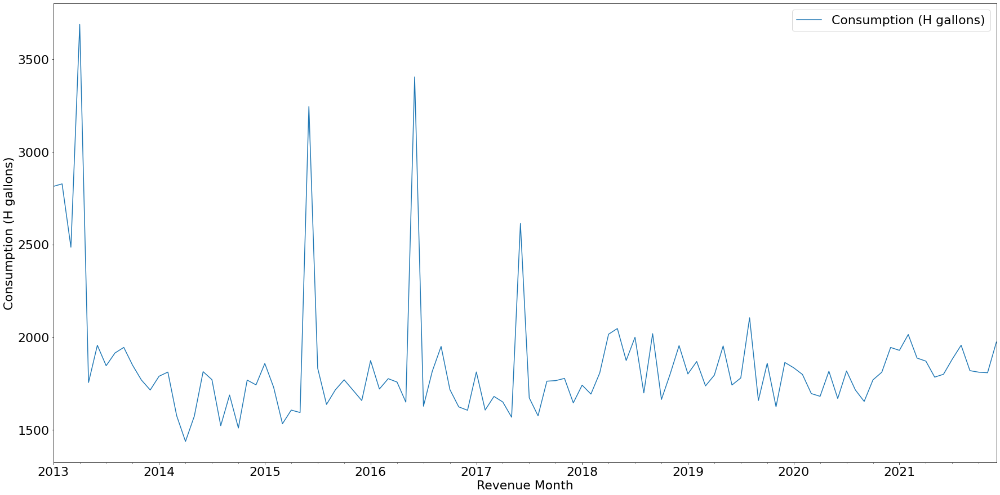

For Current Charges: 


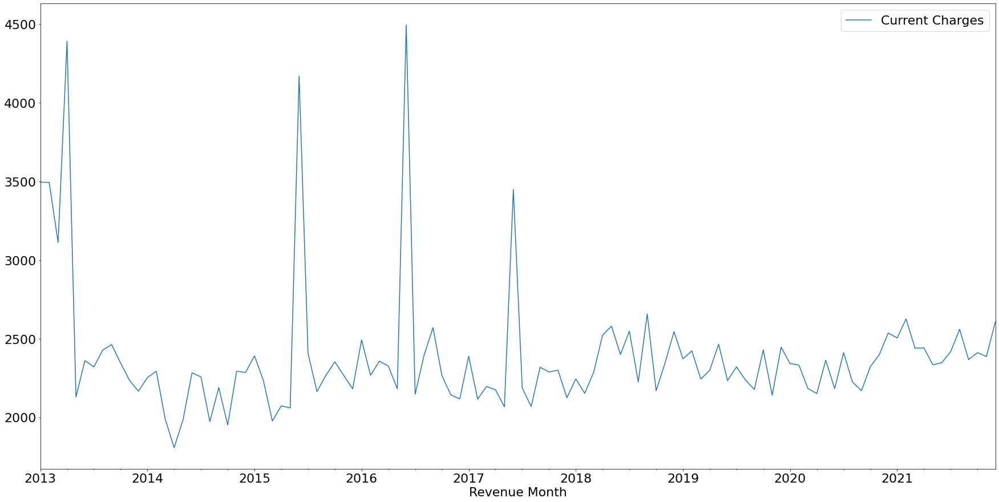

In [78]:
#Taking the average of two rows if they have same date entery values in the data set. 
brooklyn_average_df_I = brooklyn_imp_df_h.set_index('Revenue Month').groupby(pd.Grouper(freq='M')).mean().dropna(how='all')
brooklyn_average_df_I['Revenue Month'] = brooklyn_average_df_I.index

#Saving index as column
# building_df.reset_index(inplace=True)

plt.rcParams['figure.figsize'] = (30, 15)

print('For Consumption: ')
brooklyn_average_df_I.plot(x="Revenue Month", y="Consumption (H gallons)")
plt.ylabel("Consumption (H gallons)")
plt.show() # Graphing show of Current Charges
print('For Current Charges: ')
brooklyn_average_df_I.plot(x="Revenue Month", y="Current Charges")
plt.show() # Graphing show of Current Charges

In [36]:
brooklyn_average_df_I

,Current Charges,Consumption (H gallons),Normal Consumption,Normal Charges,month,year,Revenue Month
Revenue Month,,,,,,,
2013-01-31,3494.741349,2813.328386,0.768746,0.737762,1.0,2013.0,2013-01-31
2013-02-28,3494.205873,2827.042672,1.206268,1.159798,2.0,2013.0,2013-02-28
2013-03-31,3111.430635,2485.432282,0.648099,0.666181,3.0,2013.0,2013-03-31
2013-04-30,4391.051429,3686.827458,1.453827,1.331142,4.0,2013.0,2013-04-30
2013-05-31,2129.056667,1755.784787,-0.151809,-0.251445,5.0,2013.0,2013-05-31
2013-06-30,2361.594444,1956.571429,0.123288,-0.052240,6.0,2013.0,2013-06-30
2013-07-31,2320.455714,1846.263451,0.029234,-0.030701,7.0,2013.0,2013-07-31
2013-08-31,2428.012698,1915.012987,0.068250,0.002336,8.0,2013.0,2013-08-31
2013-09-30,2463.108730,1945.053803,0.123214,0.085605,9.0,2013.0,2013-09-30


**Note** We are taking mean of each month from 2013 to 2021 which will help us see which month had highest number of consumption or how each month are acting on average from 2013 to 2021. 

**J. Monthly average of Manhattan dataset**

For Consumption: 


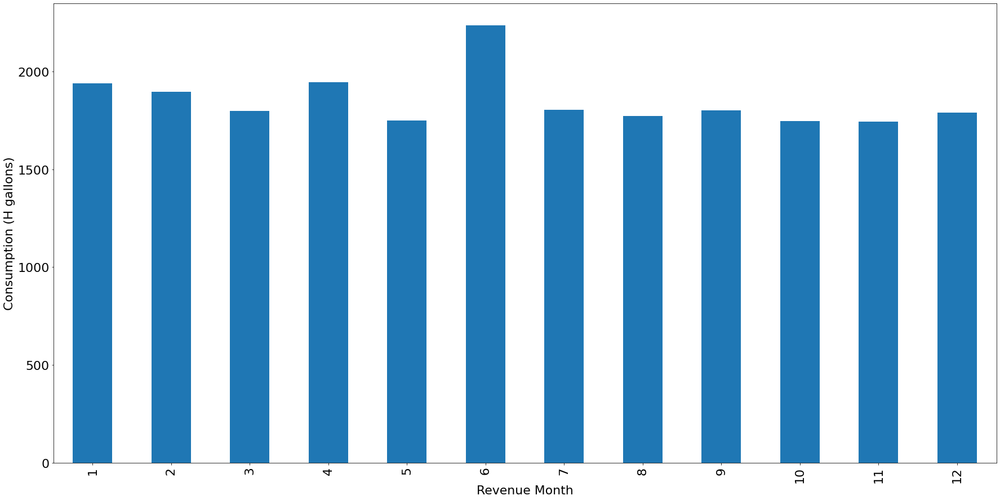

For Current Charges: 


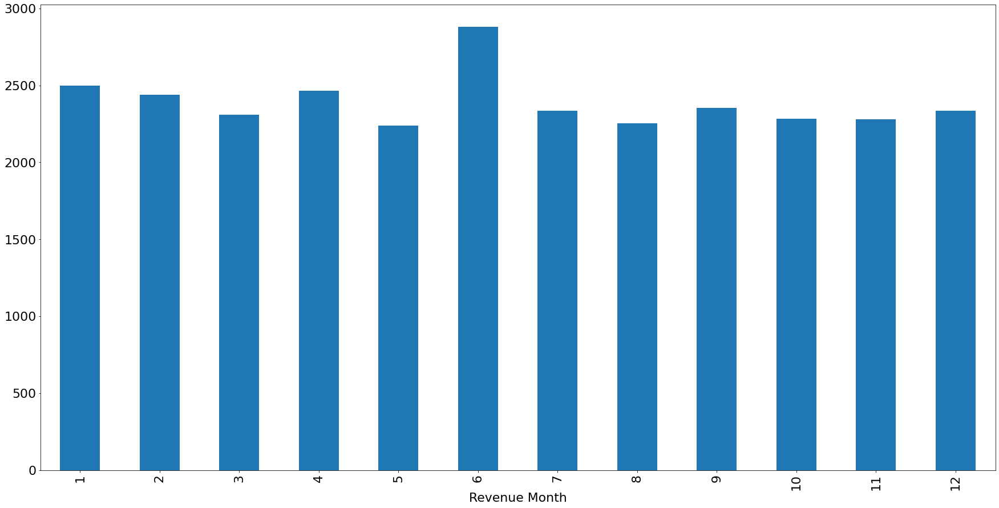

In [80]:
print('For Consumption: ')
brooklyn_average_df_J = brooklyn_average_df_I.groupby(brooklyn_average_df_I['Revenue Month'].dt.month)['Consumption (H gallons)'].mean()
brooklyn_average_df_J.plot.bar(x="Revenue Month", y="Consumption (H gallons)")
plt.ylabel("Consumption (H gallons)")
plt.show()


print('For Current Charges: ')
brooklyn_average_df_J = brooklyn_average_df_I.groupby(brooklyn_average_df_I['Revenue Month'].dt.month)['Current Charges'].mean()
brooklyn_average_df_J.plot.bar(x="Revenue Month", y="Current Charges")
plt.show()

**Note** Here we are analysisng the avaerage monthly behaviour of the manhattan data base. It will lead us to see how each boroughs are behaving in each sesons. Their nature migh differ in Fall, Spring, summer, and Winter. Hence, seasonality analsysis will give us analysis of consumption of water interms of season. 

**k. Manhattan Dataset: Normal Value view of consumption and current charges**

For Consumption: 


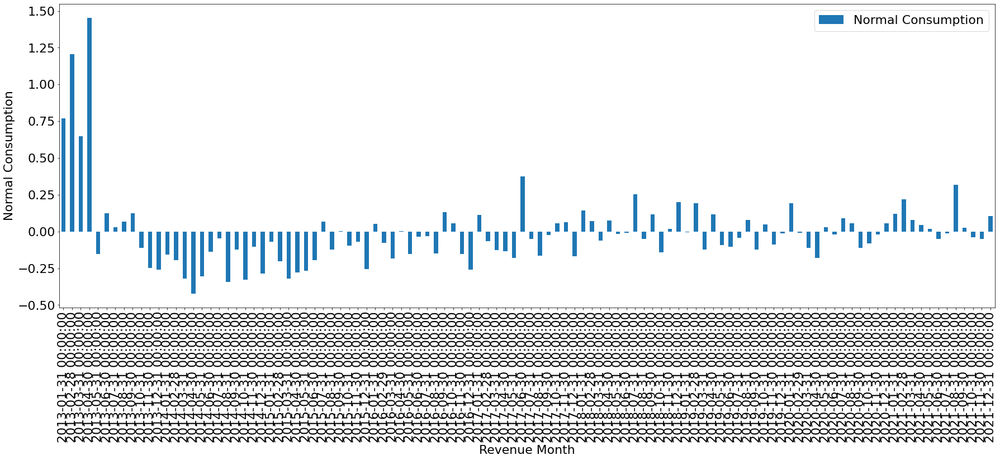

For Current Charges: 


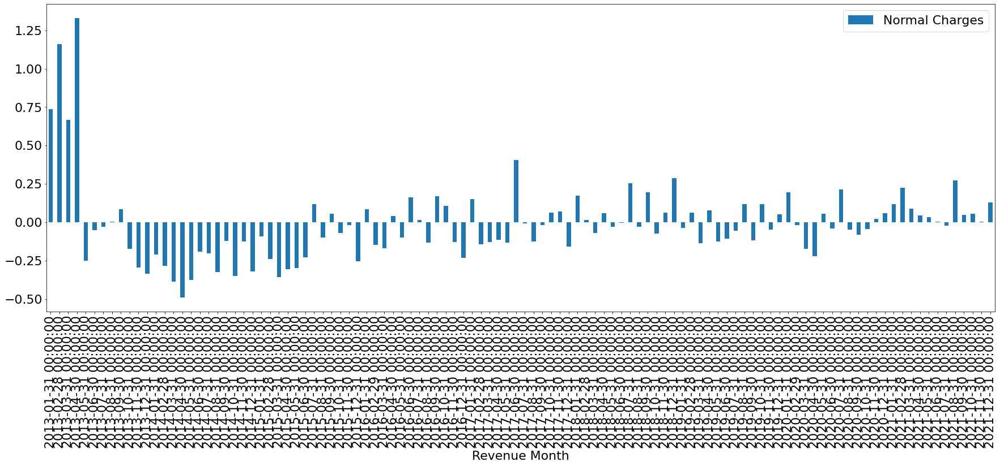

In [82]:
plt.rcParams['figure.figsize'] = (30, 10)
print('For Consumption: ')
brooklyn_average_df_I.plot.bar(x="Revenue Month", y="Normal Consumption")
plt.ylabel("Normal Consumption")
plt.show() # Graphing show of Current Charges
print('For Current Charges: ')
brooklyn_average_df_I.plot.bar(x="Revenue Month", y="Normal Charges")
plt.show() # Graphing show of Current Charges

**L.  monthly mean analysis for Normal values.**

For Consumption: 


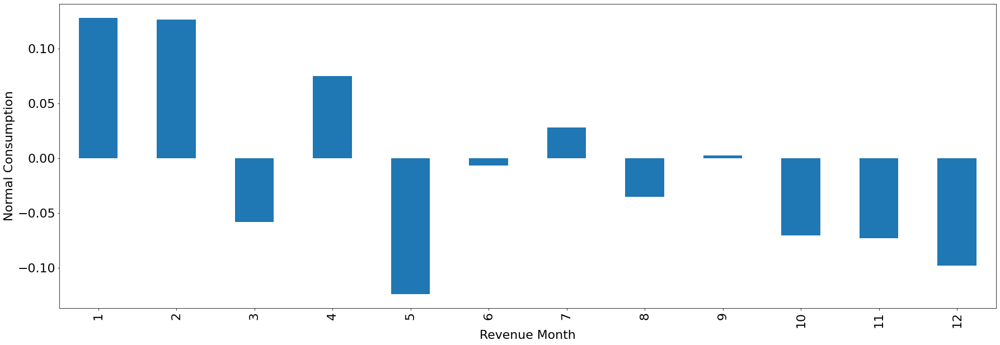

For Current Charges: 


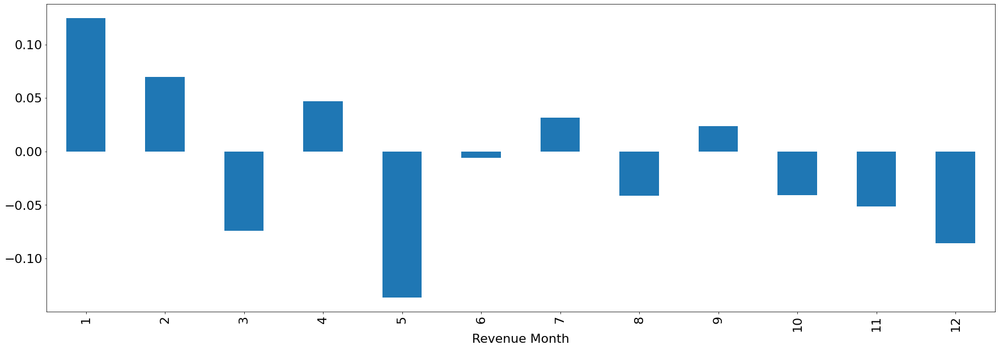

In [83]:
print('For Consumption: ')
brooklyn_average_df_L = brooklyn_average_df_I.groupby(brooklyn_average_df_I['Revenue Month'].dt.month)['Normal Consumption'].mean()
brooklyn_average_df_L.plot.bar(x="Revenue Month", y="Normal Consumption")
plt.ylabel("Normal Consumption")
plt.show()


print('For Current Charges: ')
brooklyn_average_df_L = brooklyn_average_df_I.groupby(brooklyn_average_df_I['Revenue Month'].dt.month)['Normal Charges'].mean()
brooklyn_average_df_L.plot.bar(x="Revenue Month", y="Normal Charges")
plt.show()

**M. Lets see nature of each Building**

For Meter Number:  V31959109
For Consumption: 


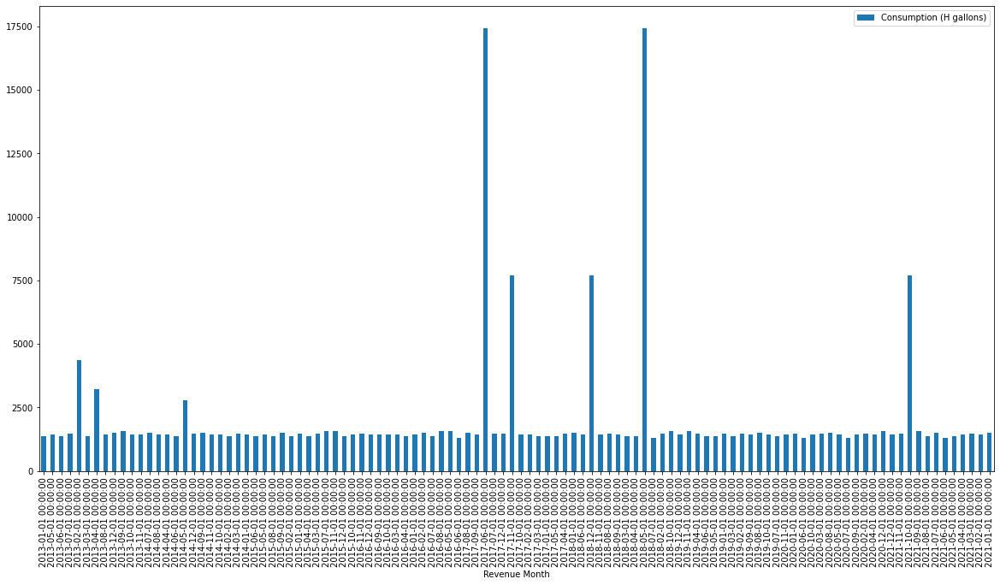

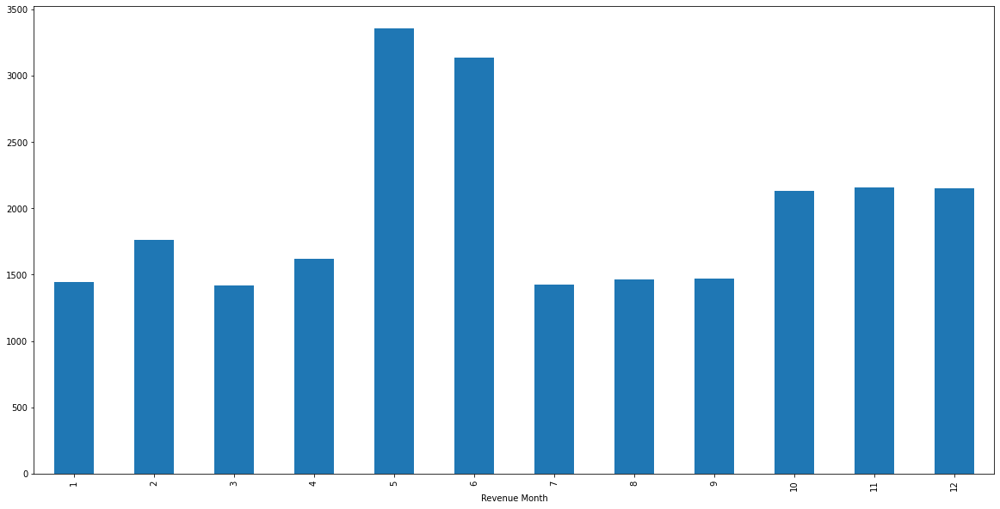

For Current Charges: 


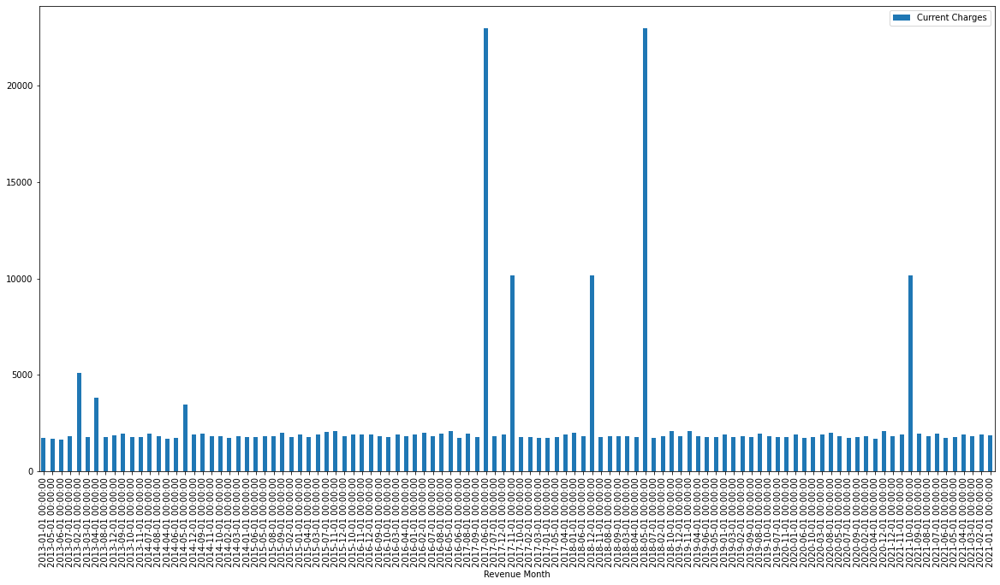

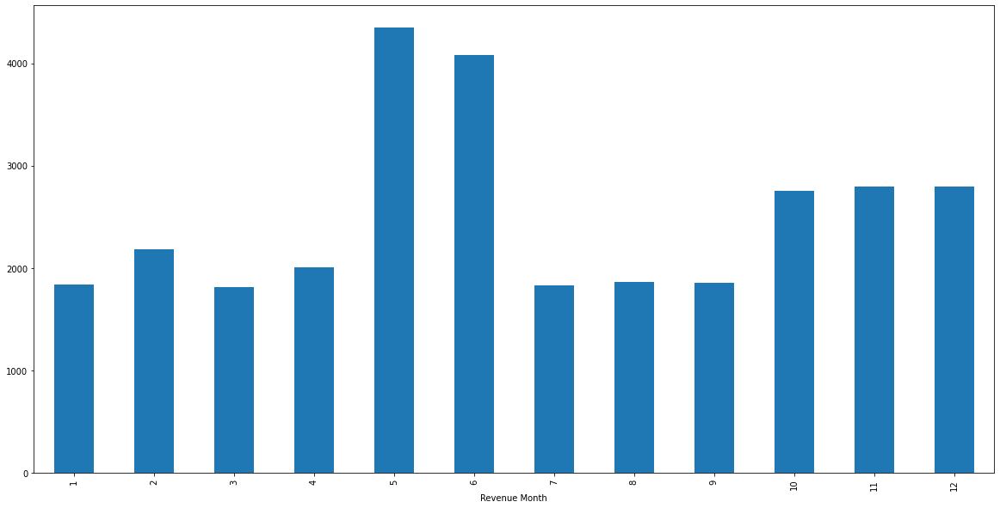

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V31960320
For Consumption: 


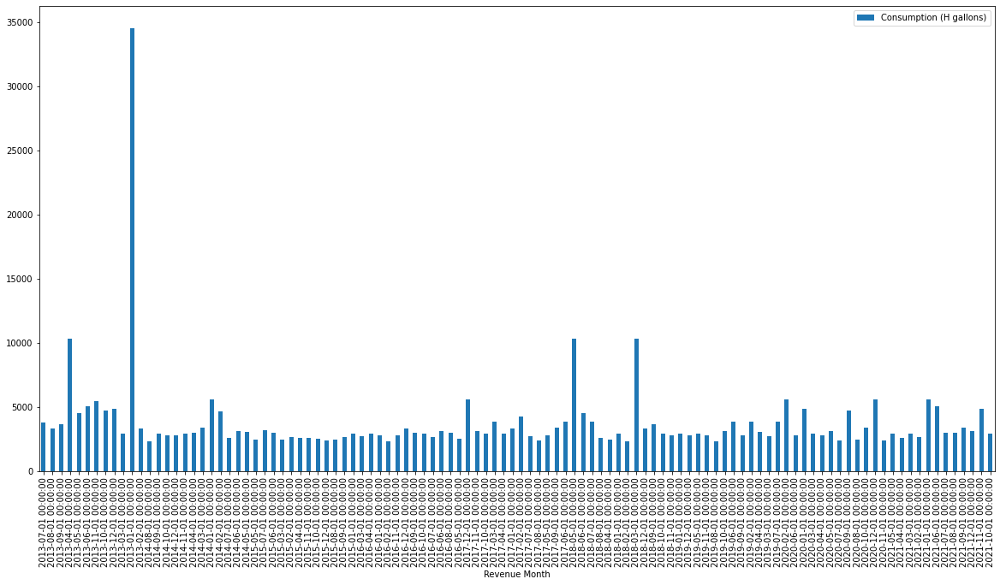

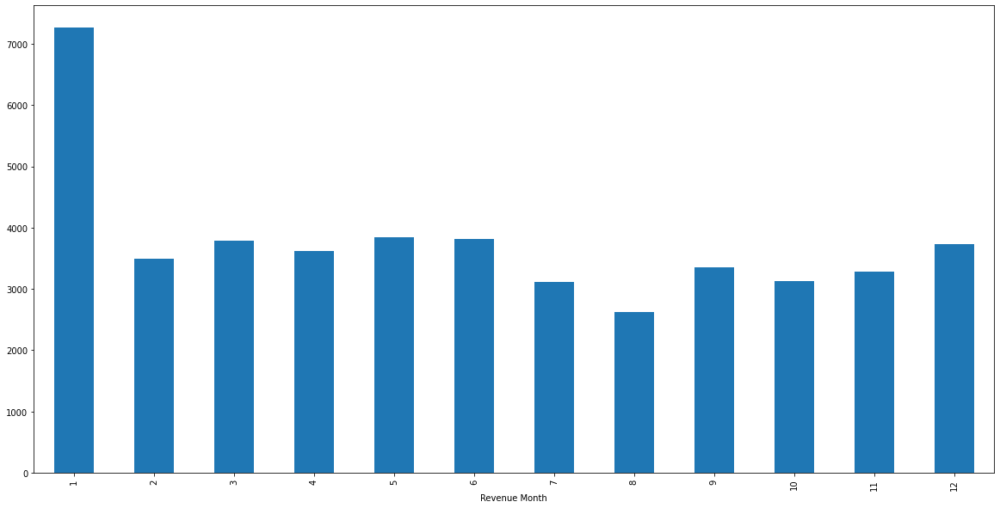

For Current Charges: 


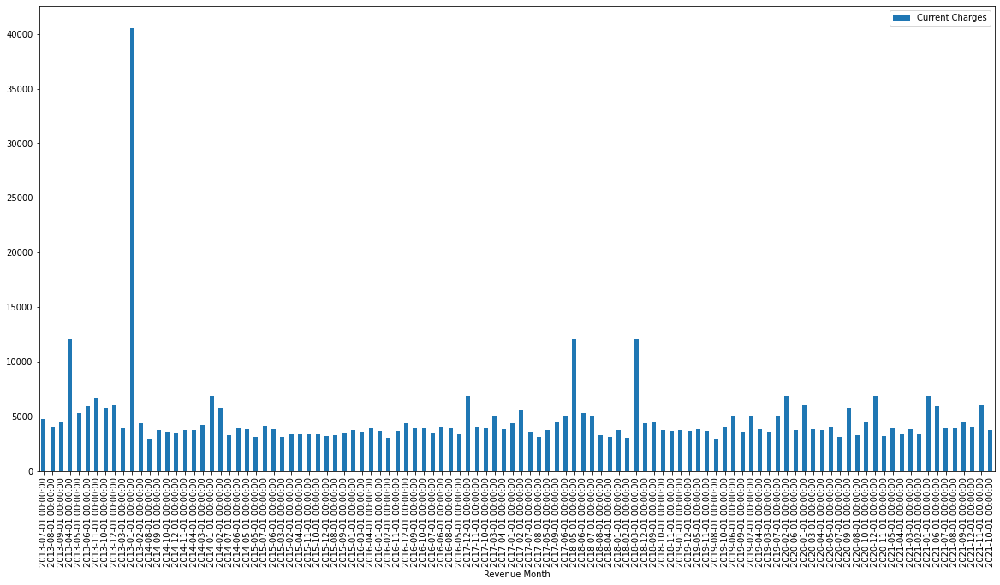

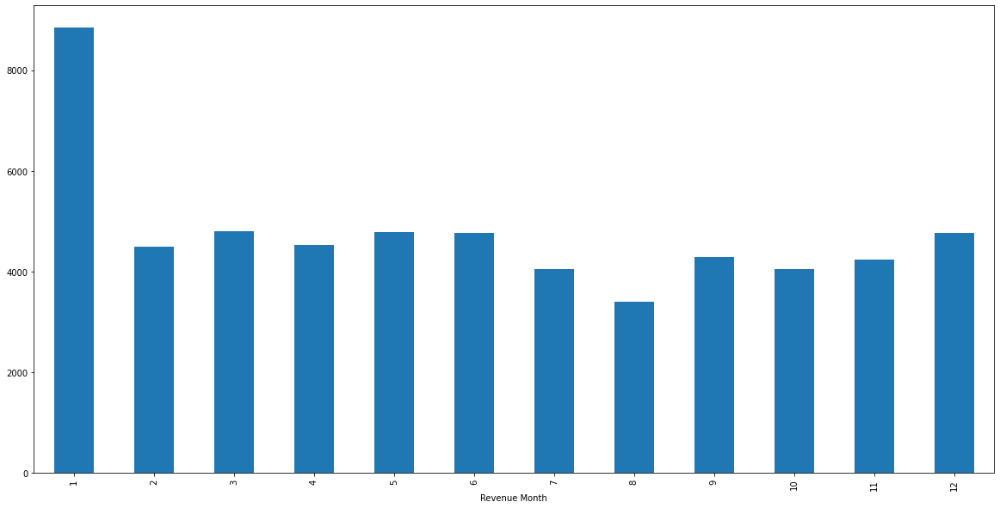

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K14164112
For Consumption: 


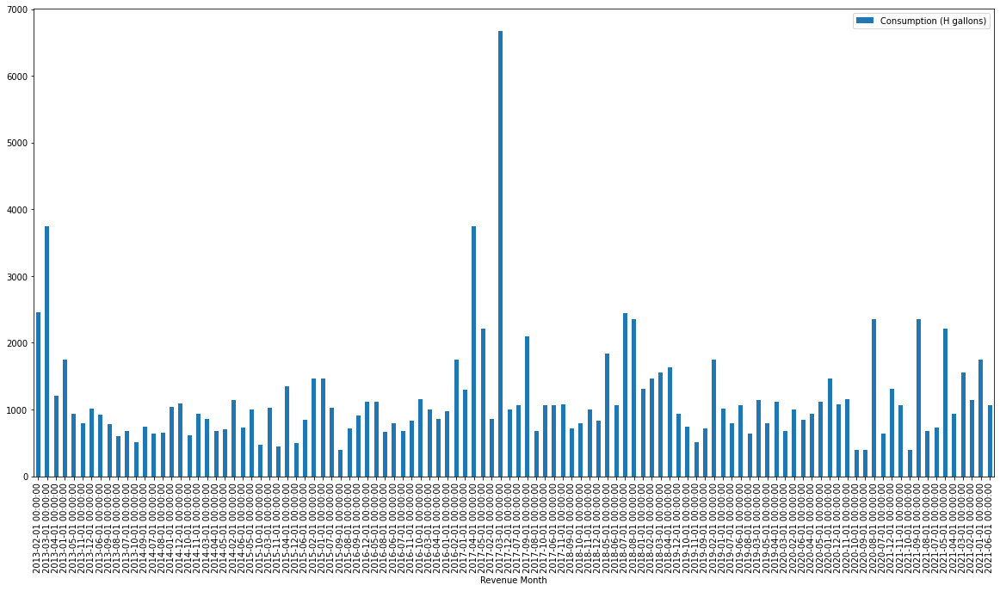

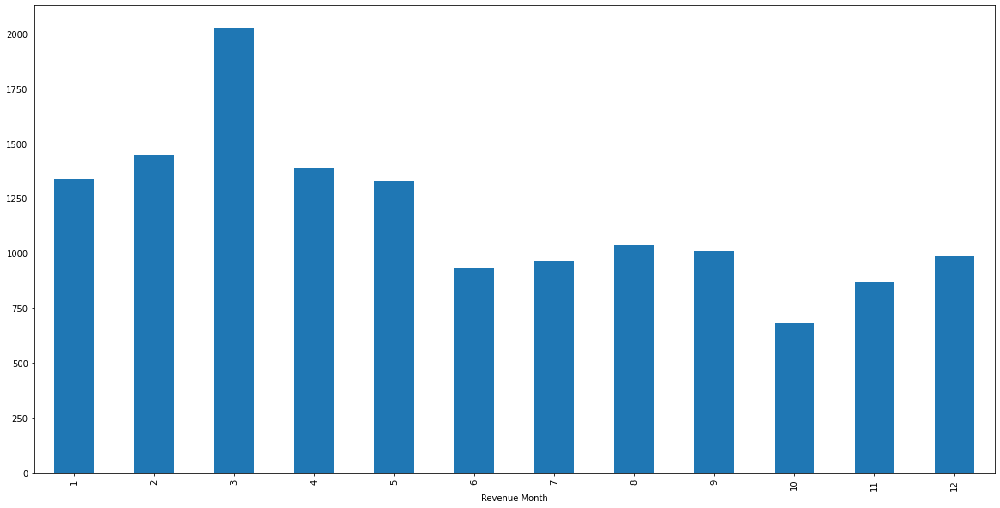

For Current Charges: 


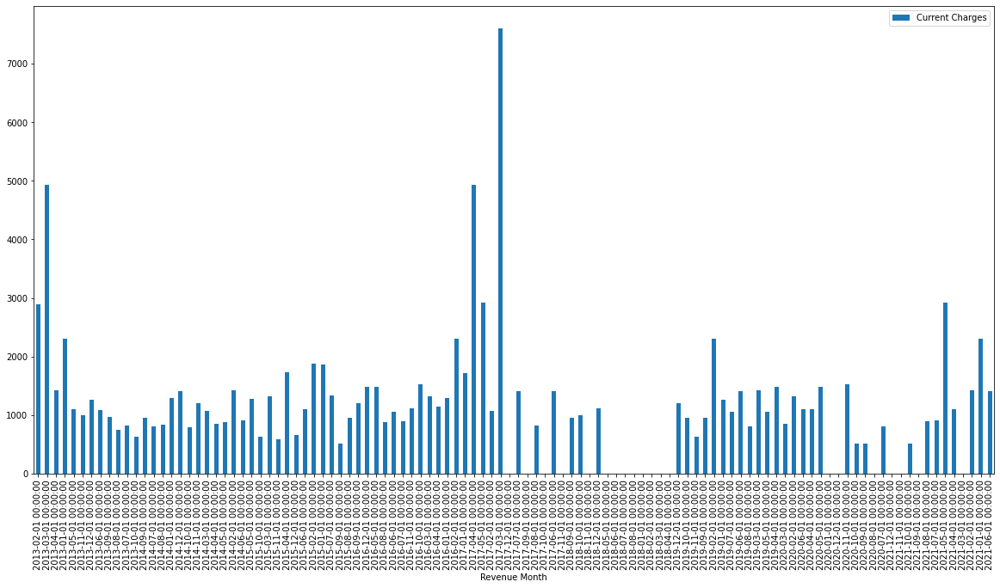

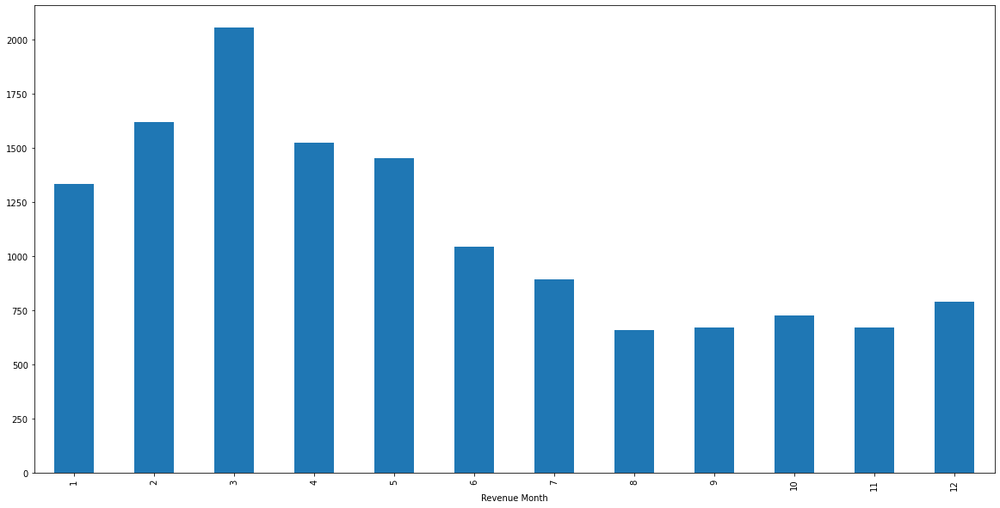

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K94606993
For Consumption: 


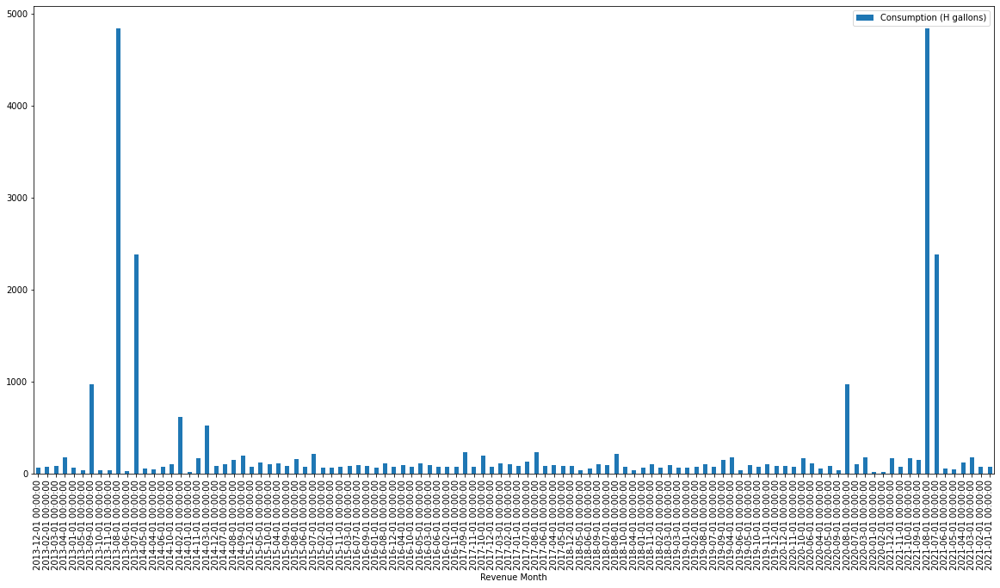

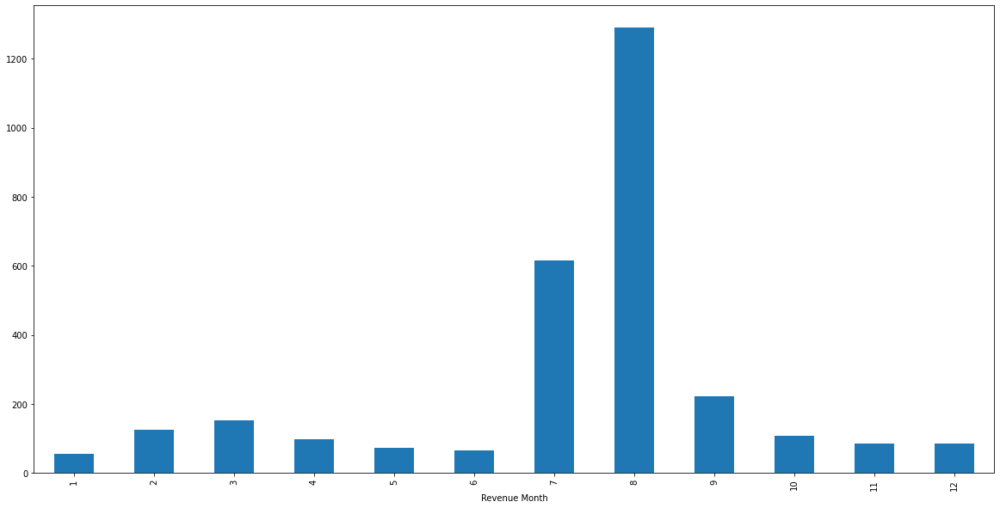

For Current Charges: 


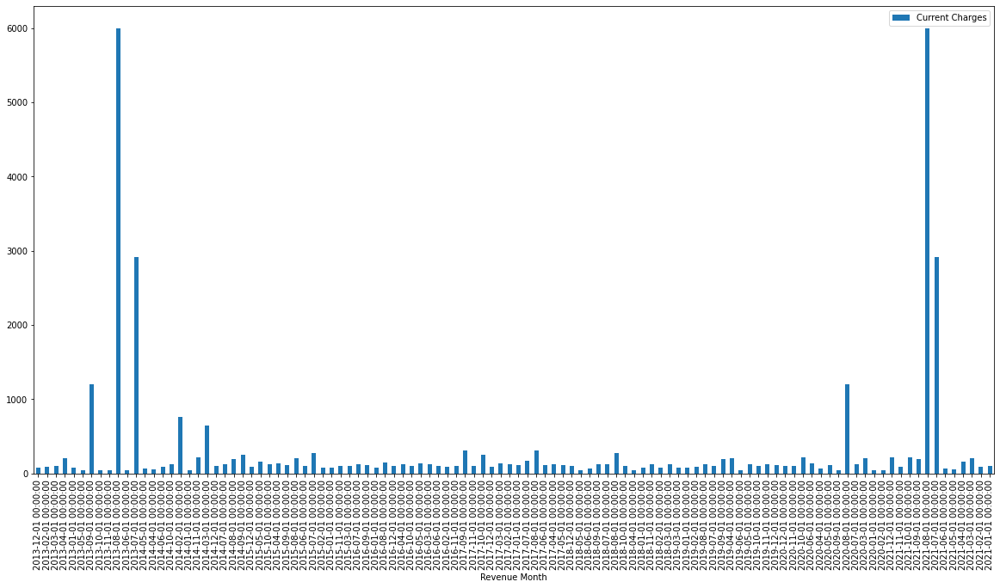

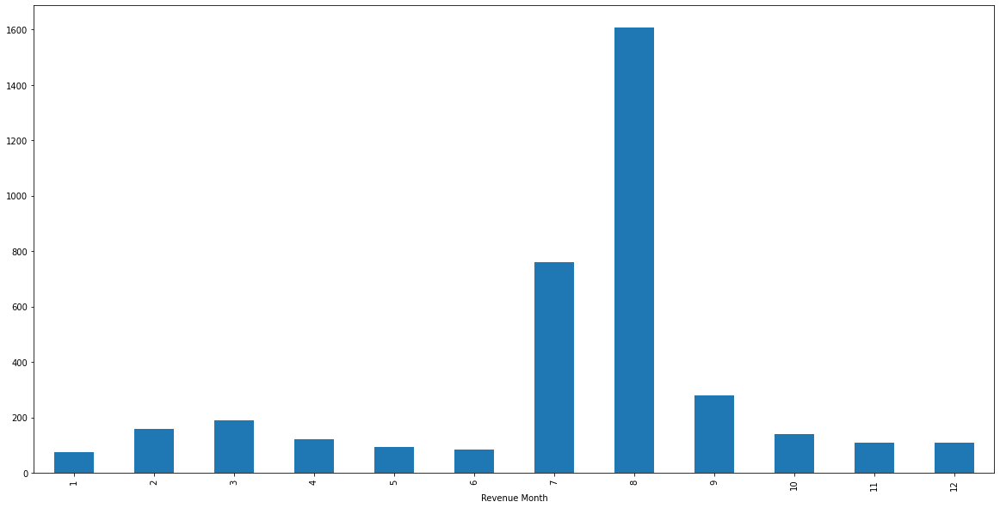

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  H07052143
For Consumption: 


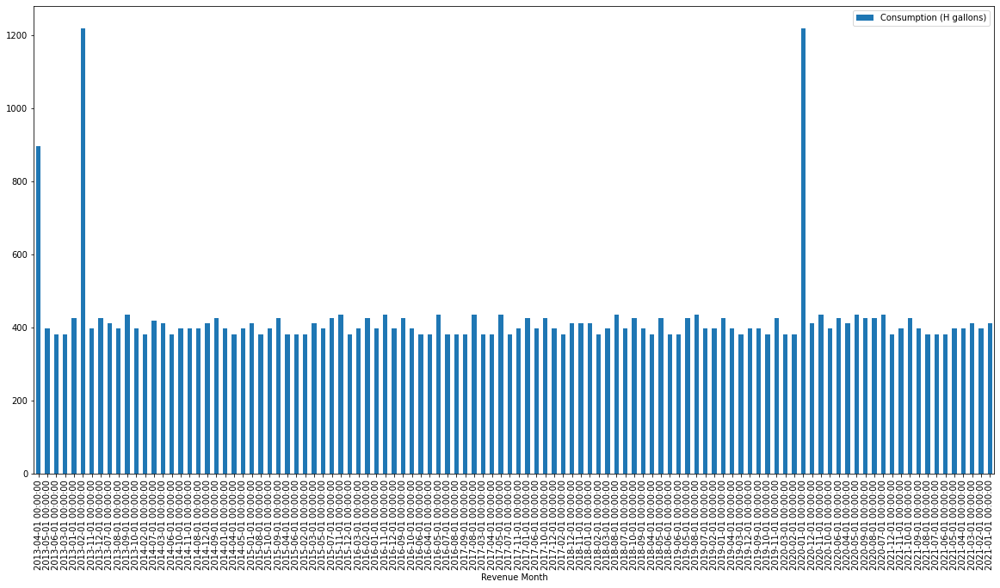

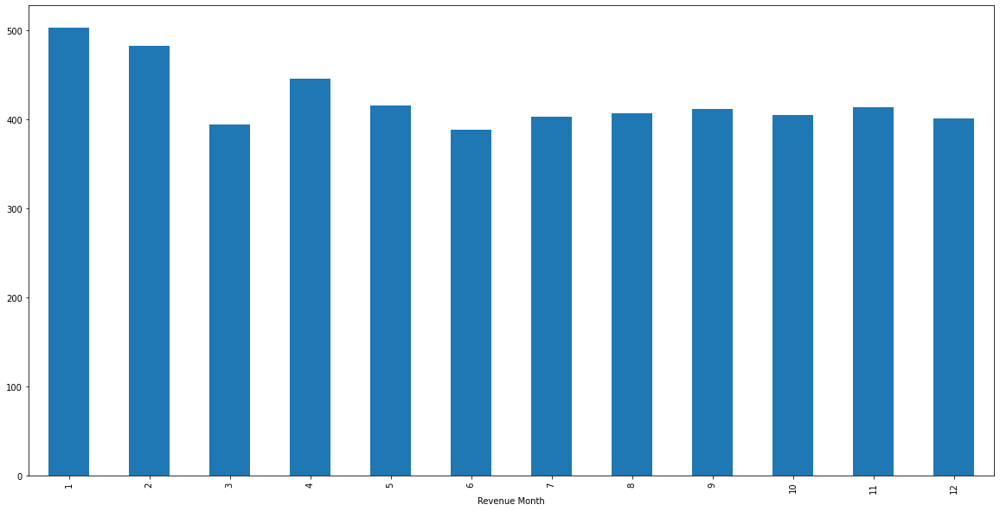

For Current Charges: 


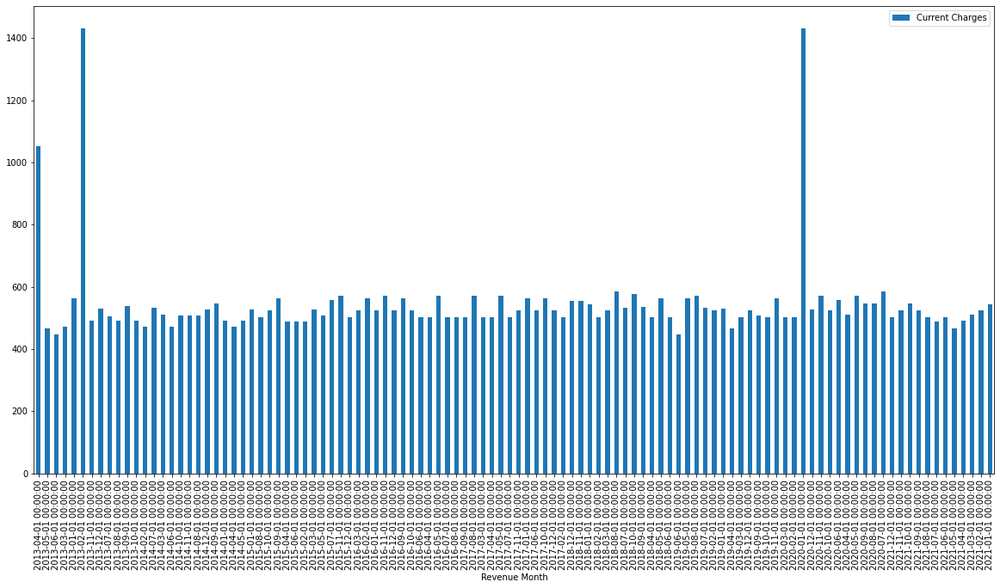

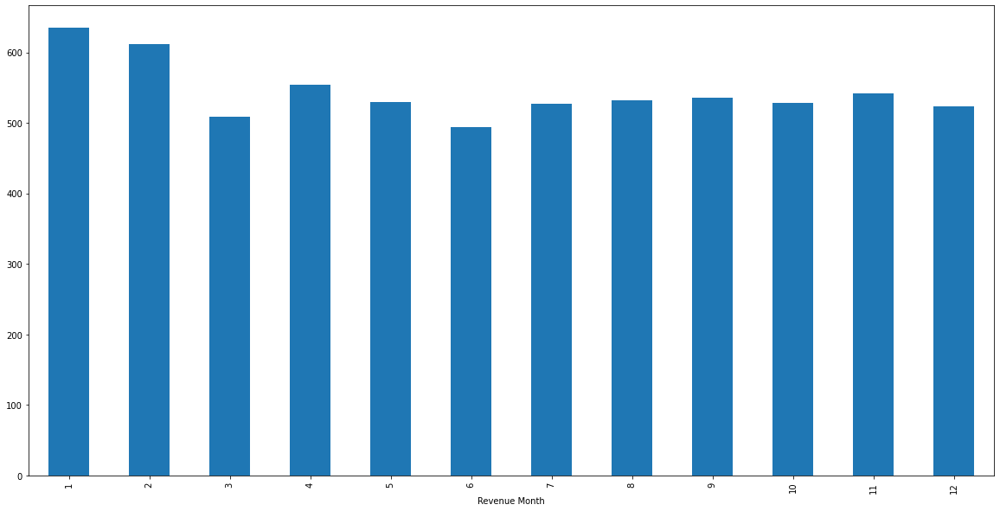

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E99343083
For Consumption: 


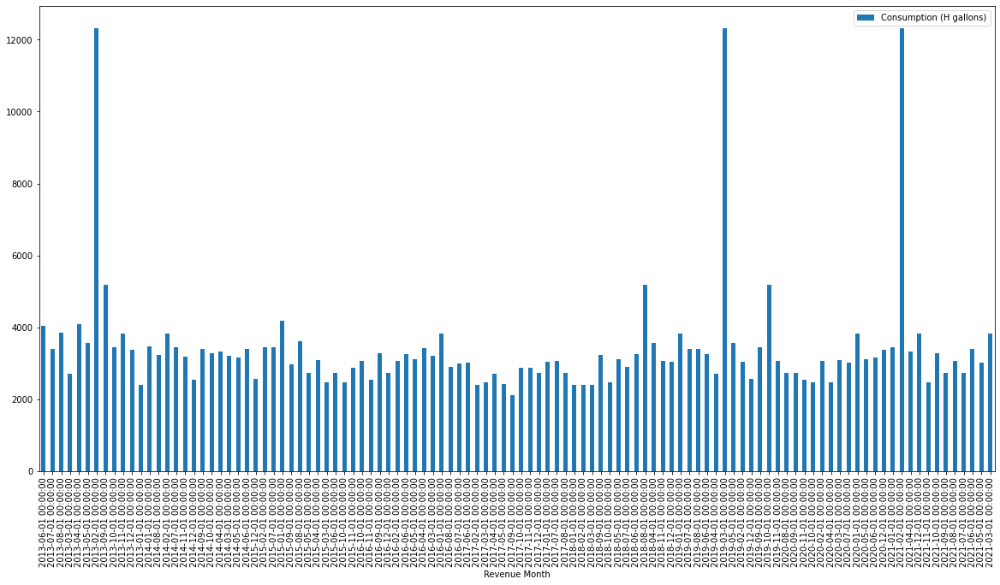

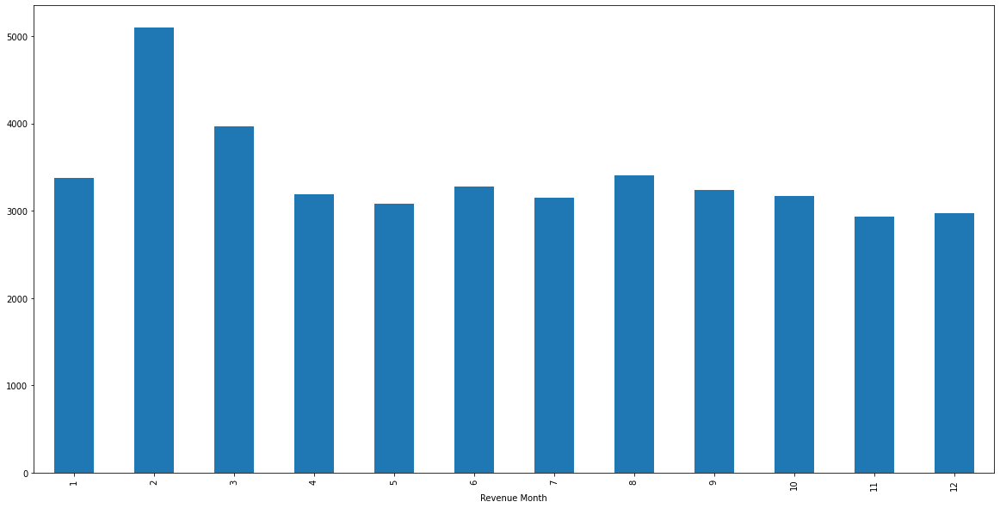

For Current Charges: 


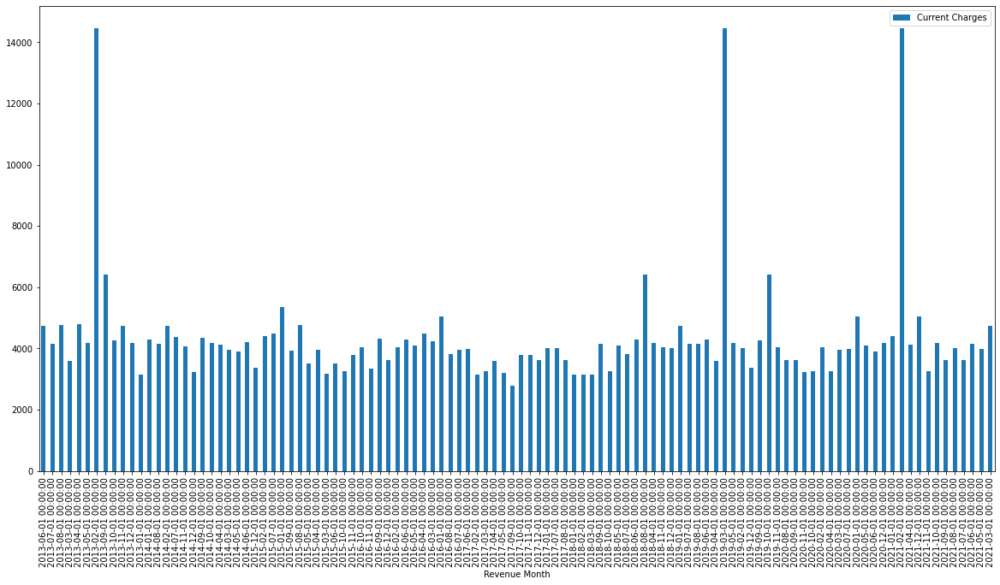

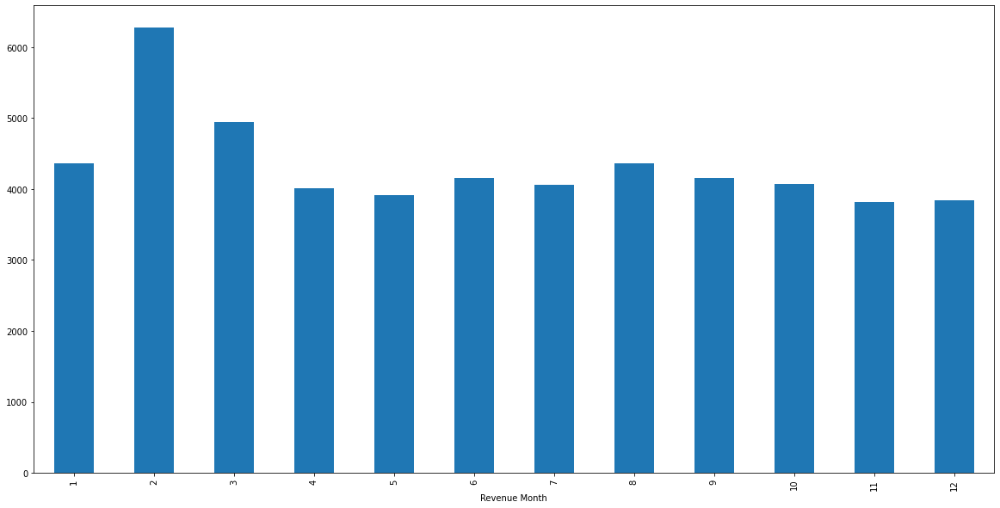

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V84009581
For Consumption: 


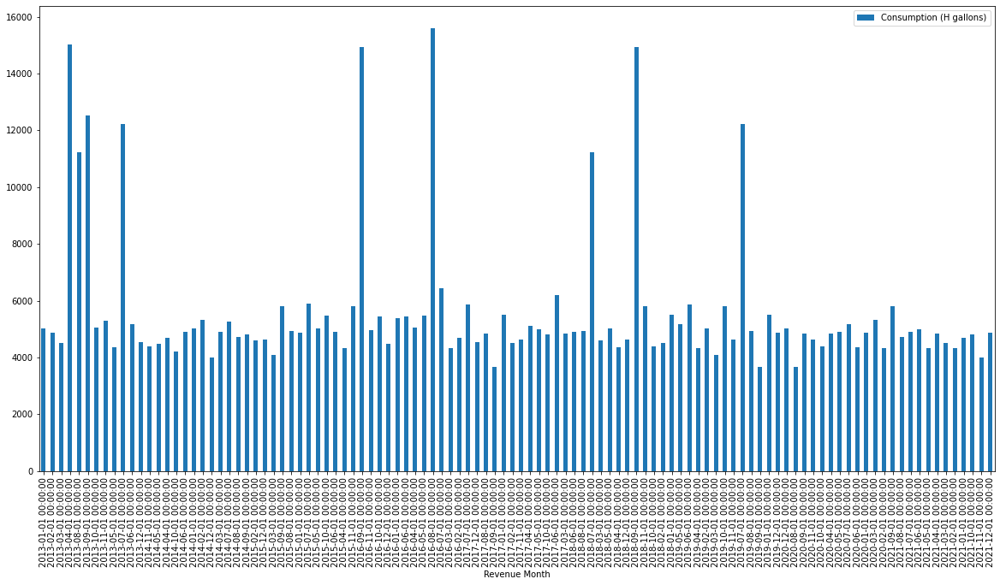

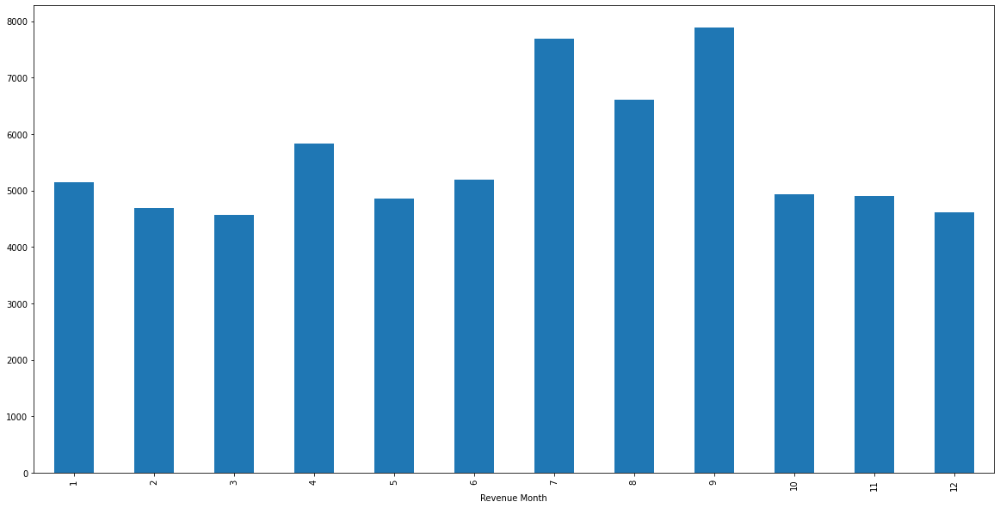

For Current Charges: 


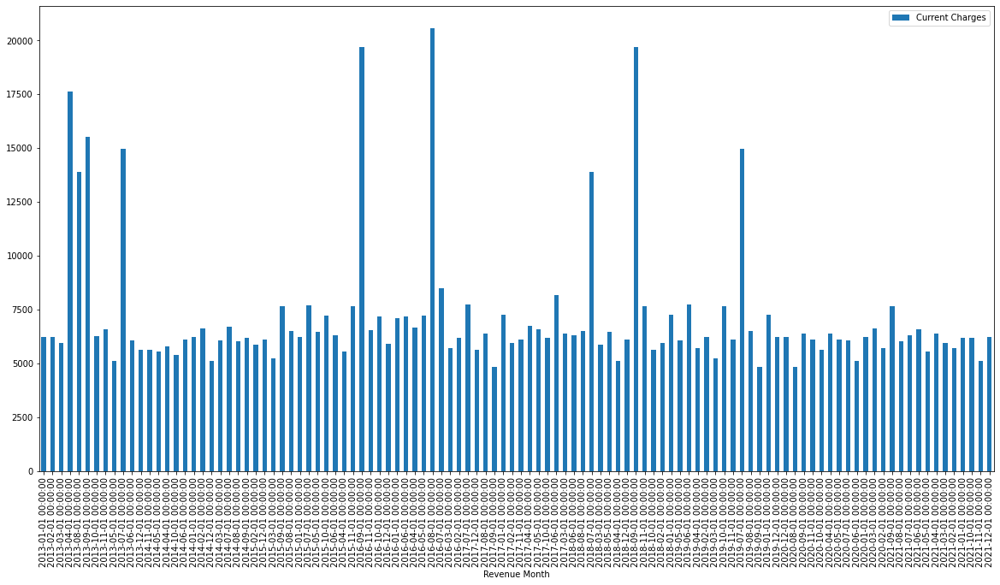

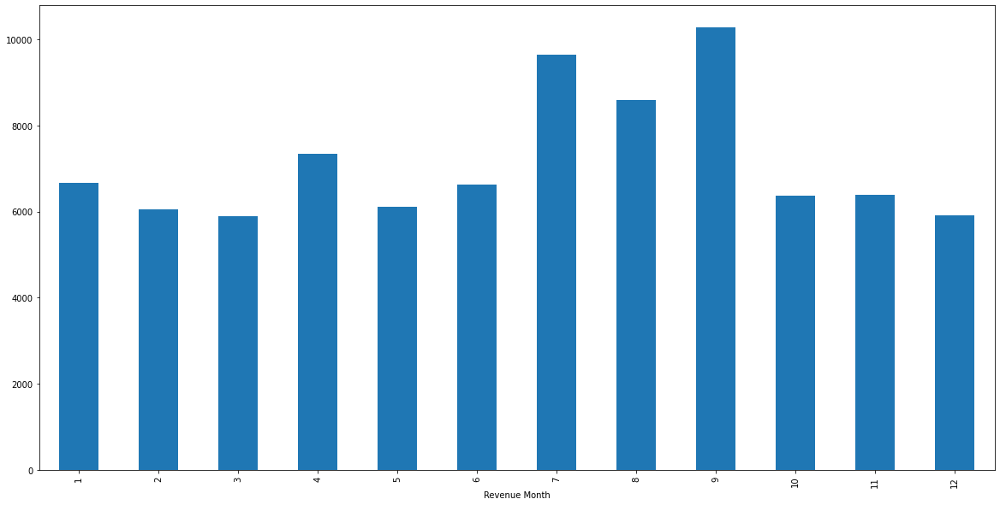

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V84009832
For Consumption: 


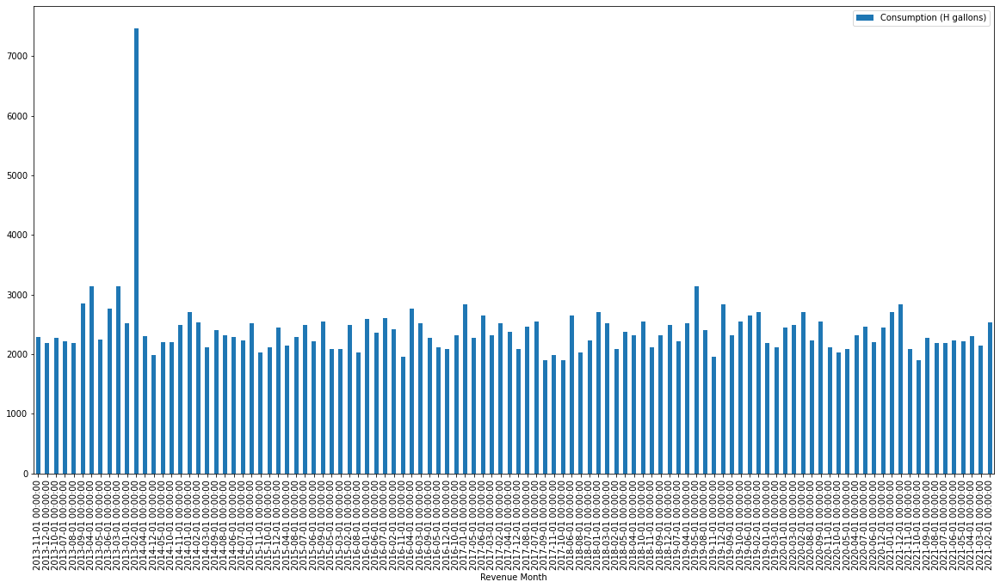

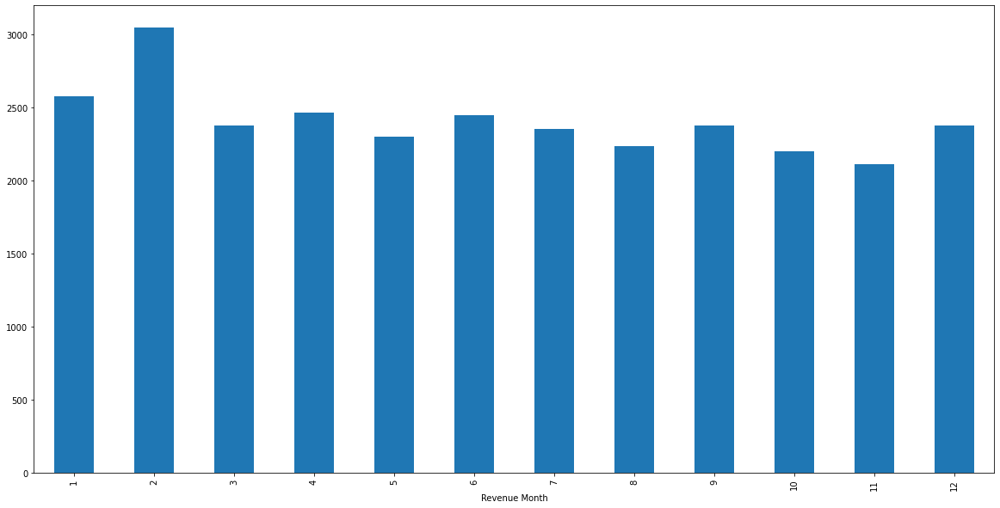

For Current Charges: 


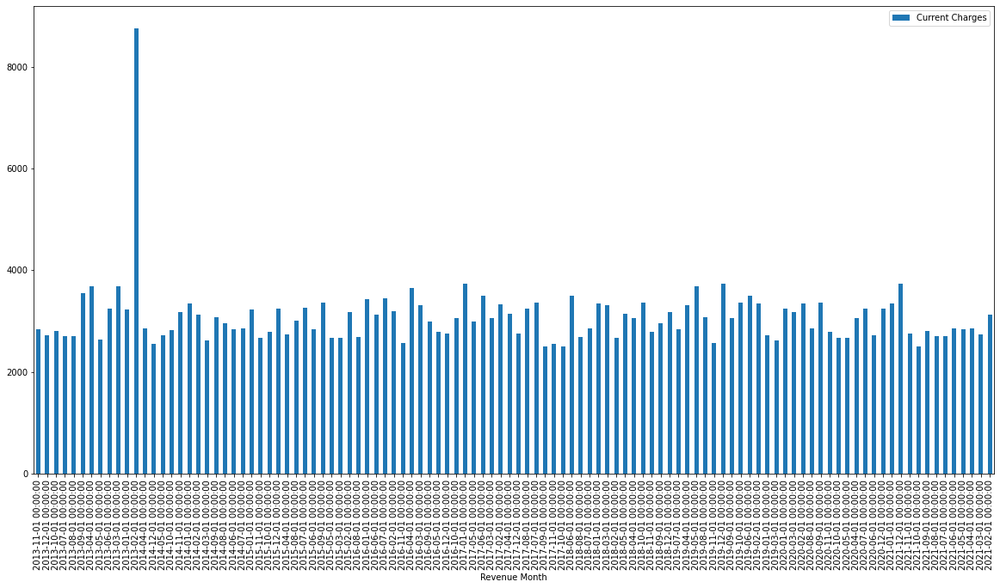

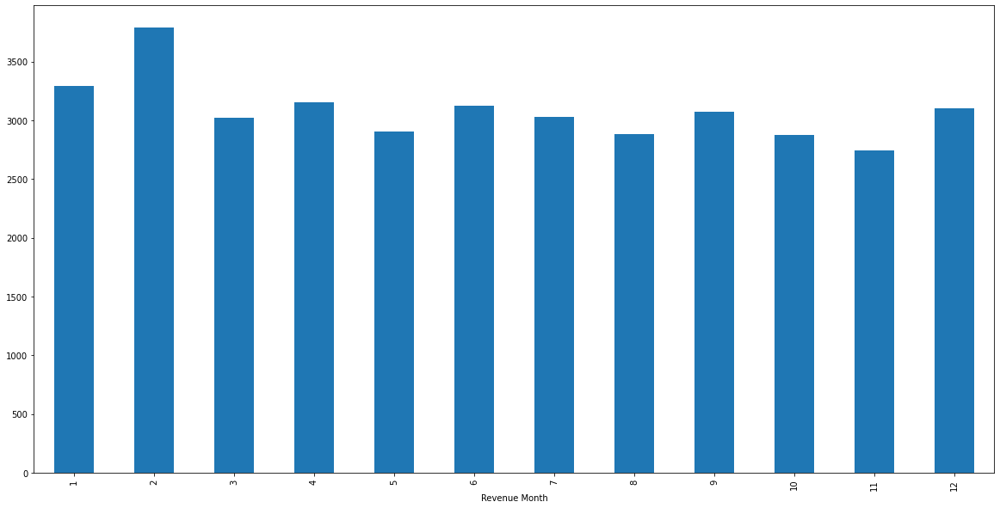

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E19238750
For Consumption: 


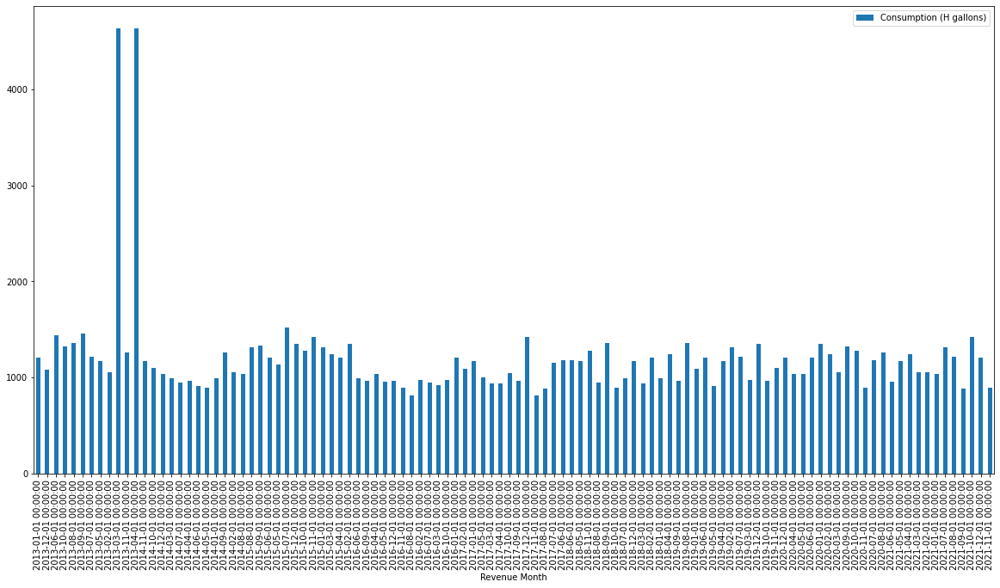

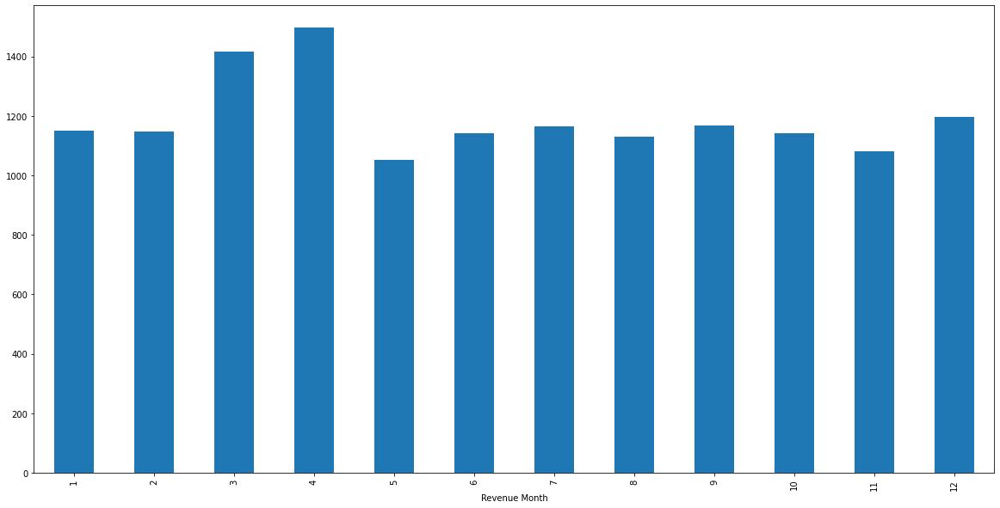

For Current Charges: 


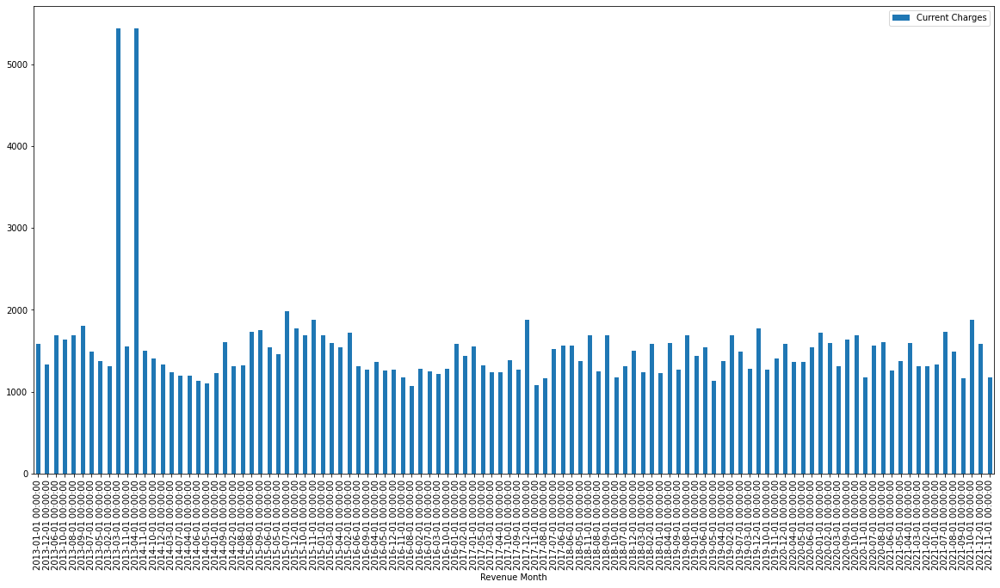

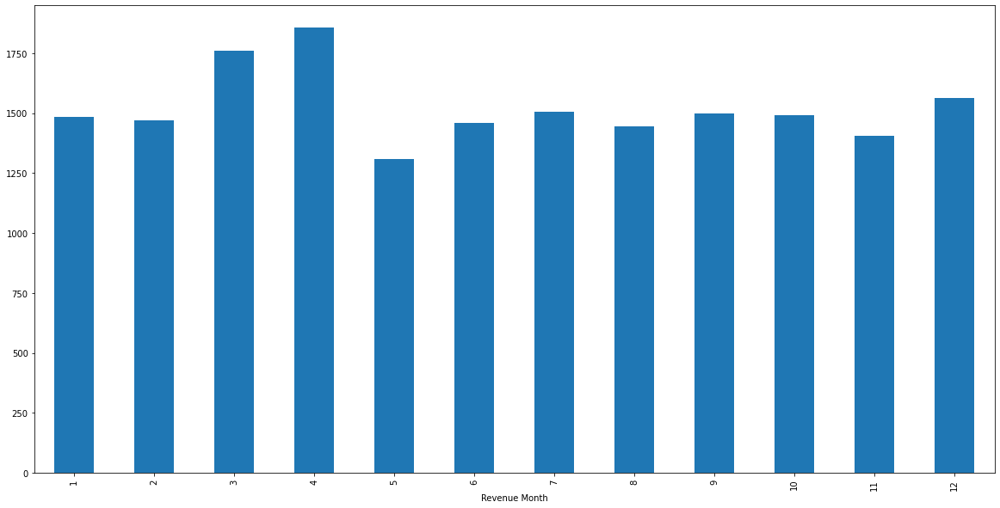

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  O77816972
For Consumption: 


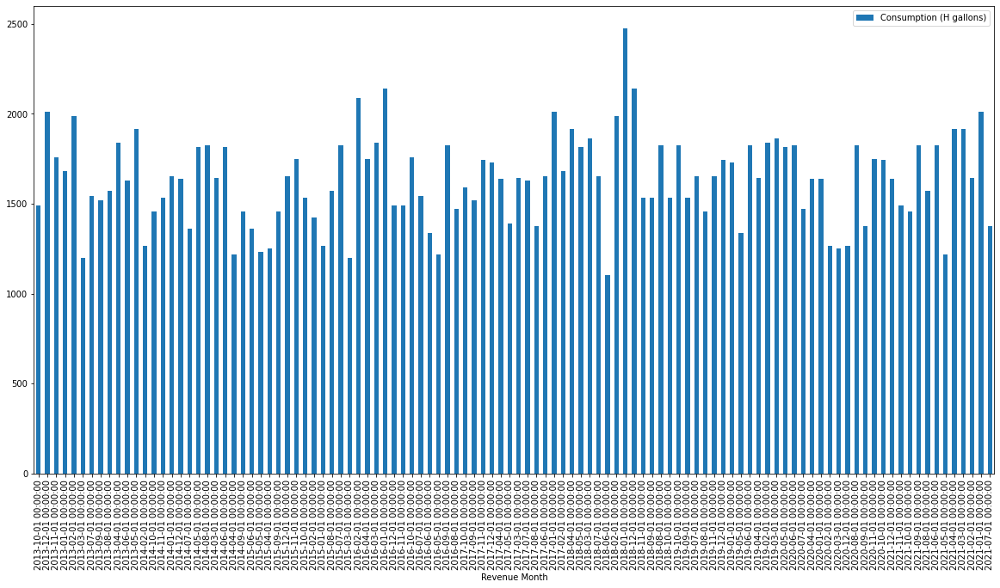

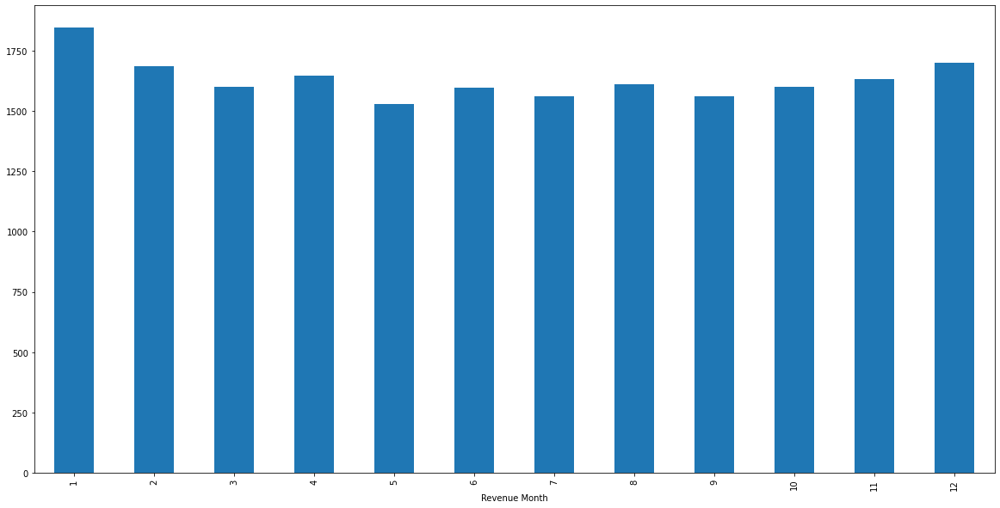

For Current Charges: 


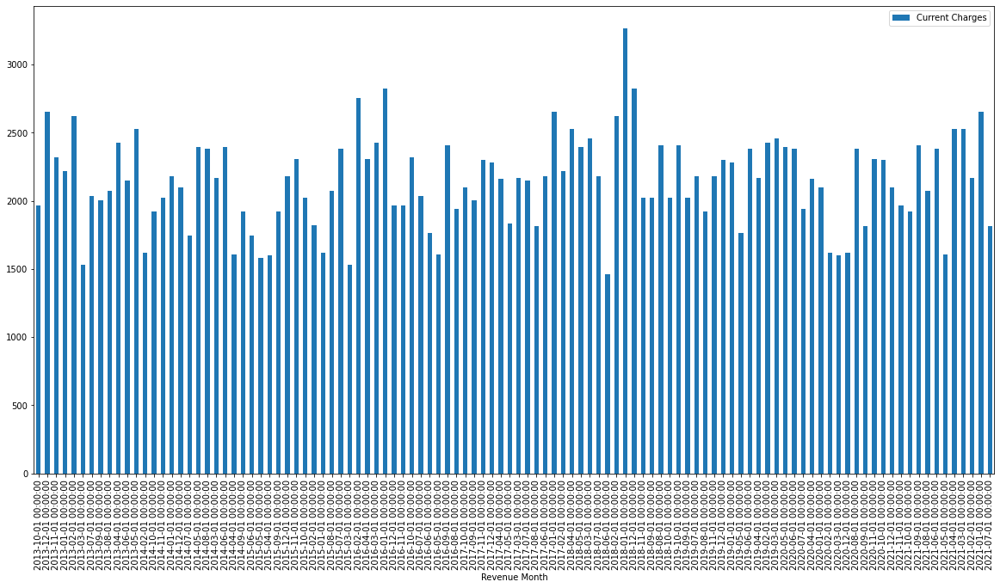

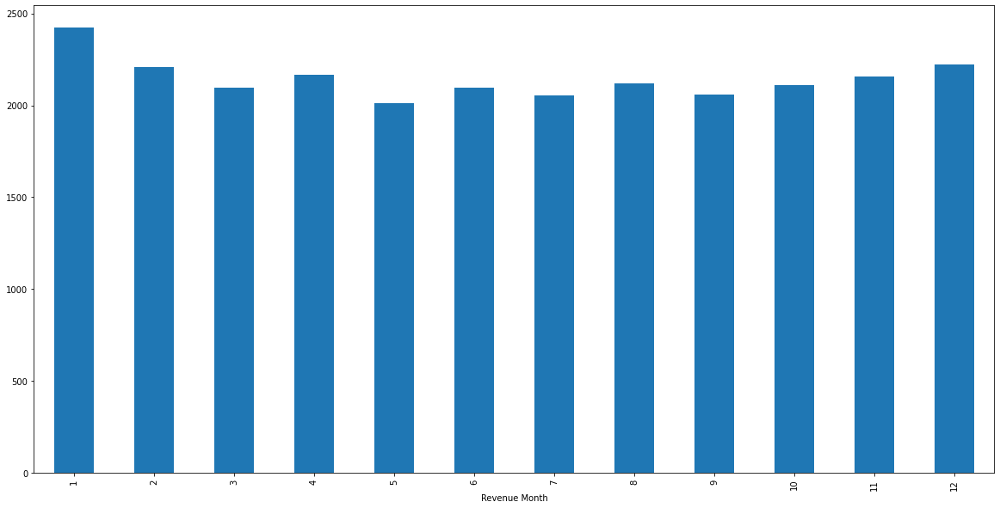

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I15001931
For Consumption: 


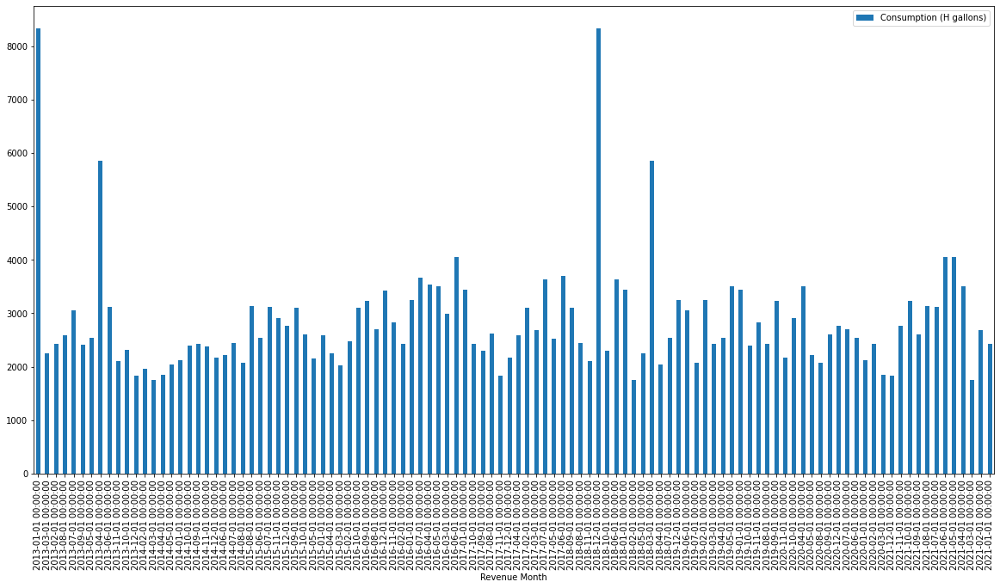

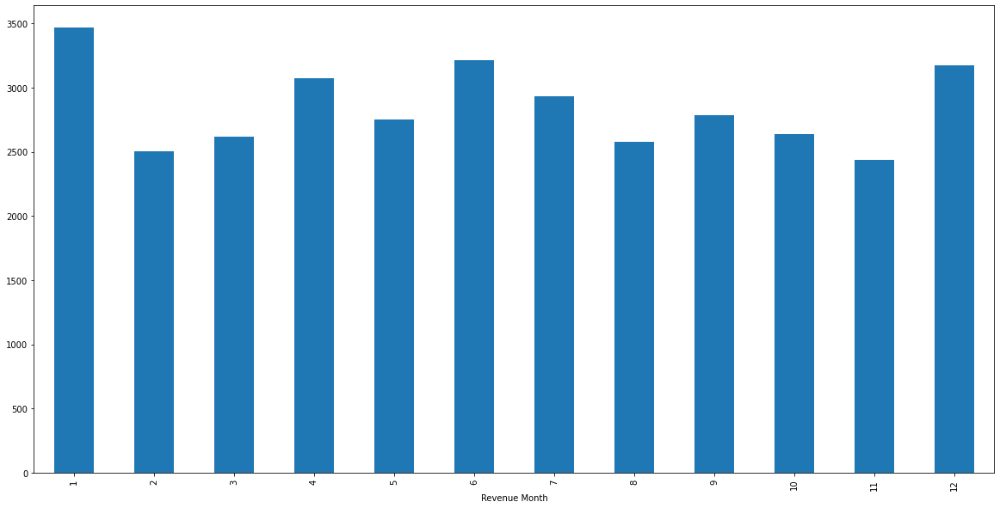

For Current Charges: 


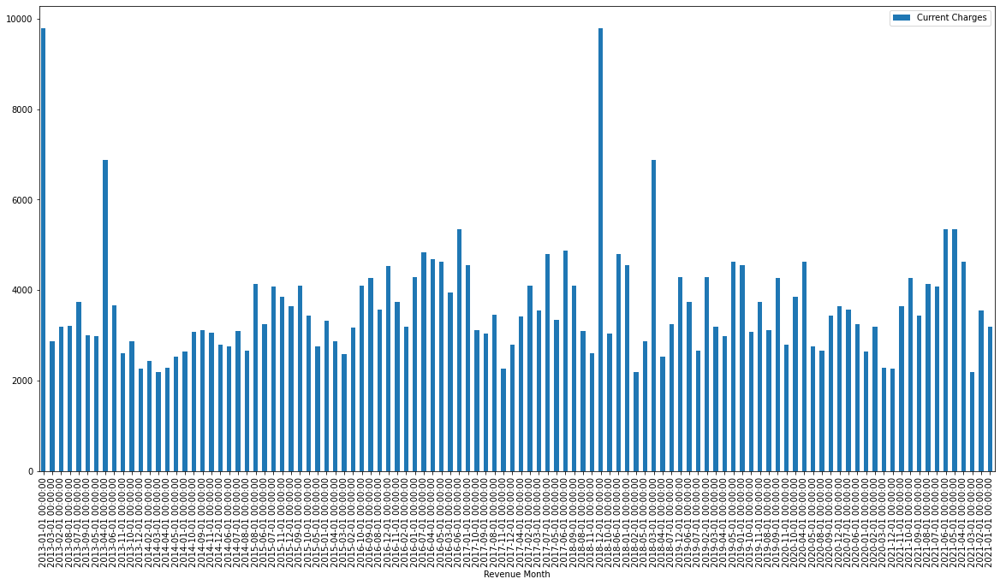

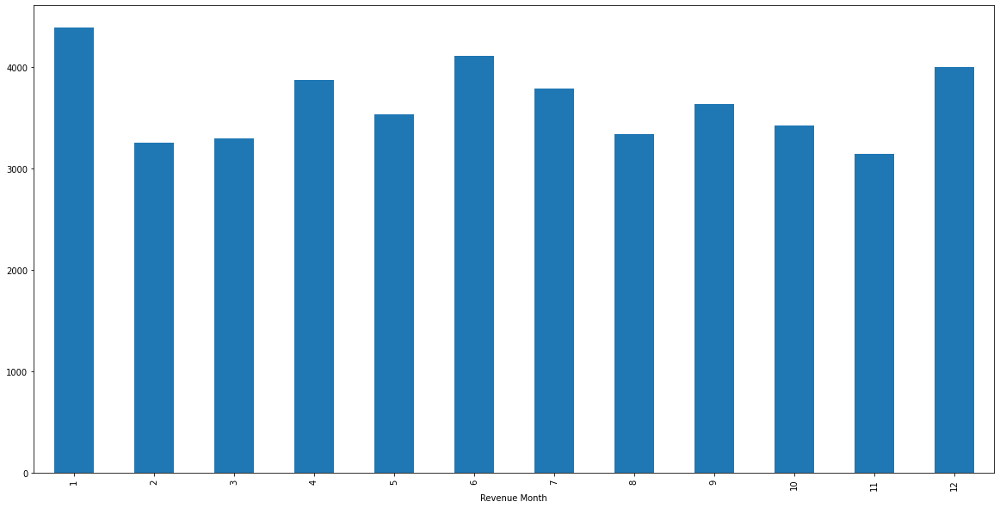

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V83033257
For Consumption: 


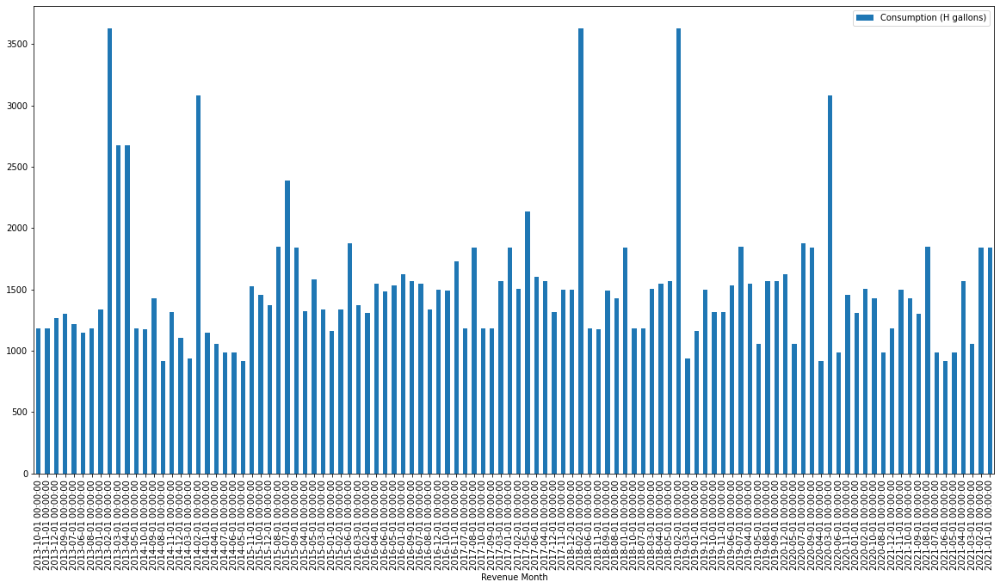

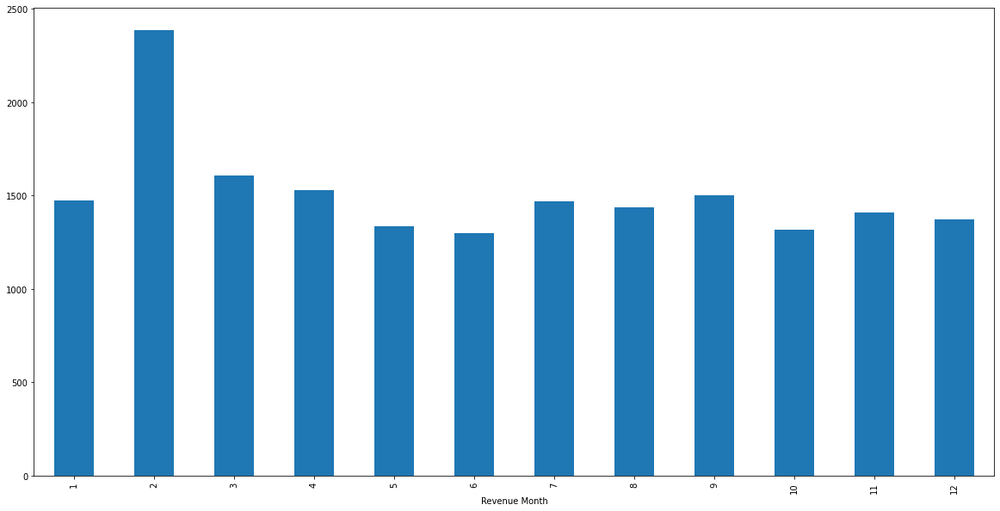

For Current Charges: 


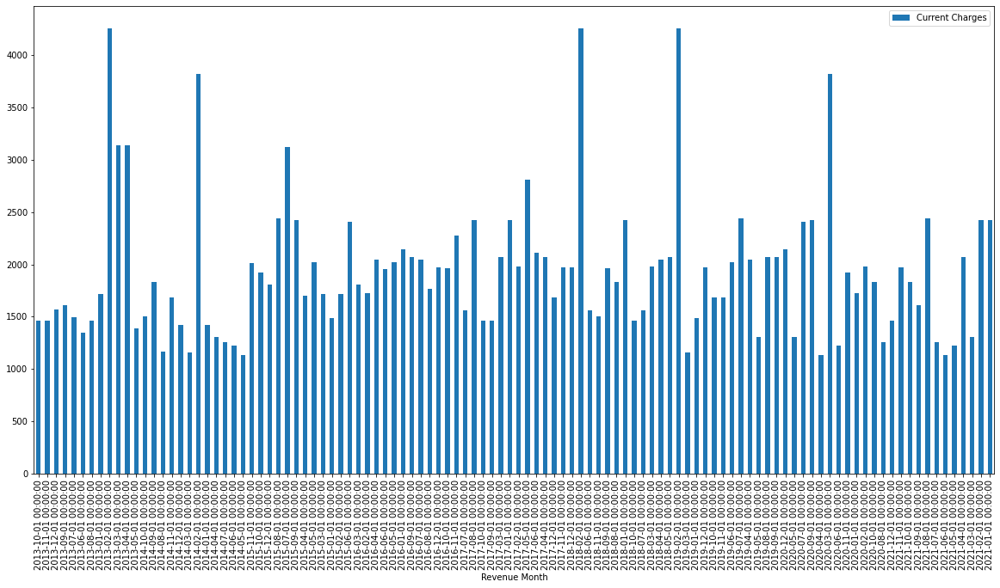

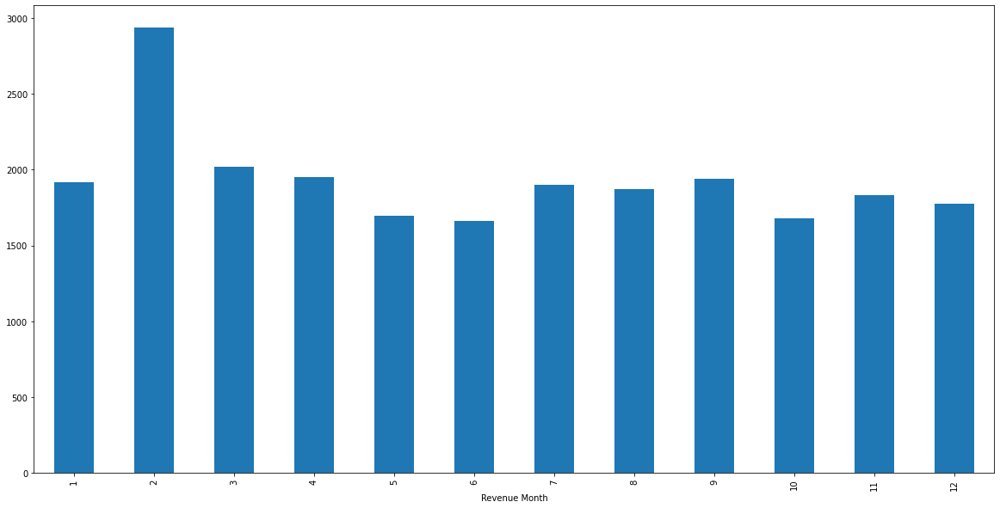

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20527605
For Consumption: 


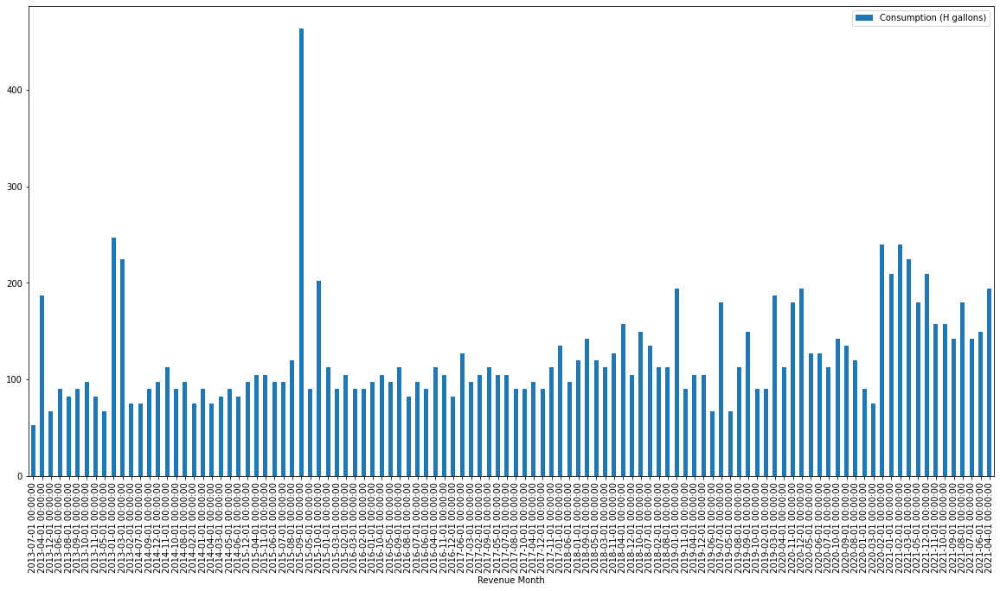

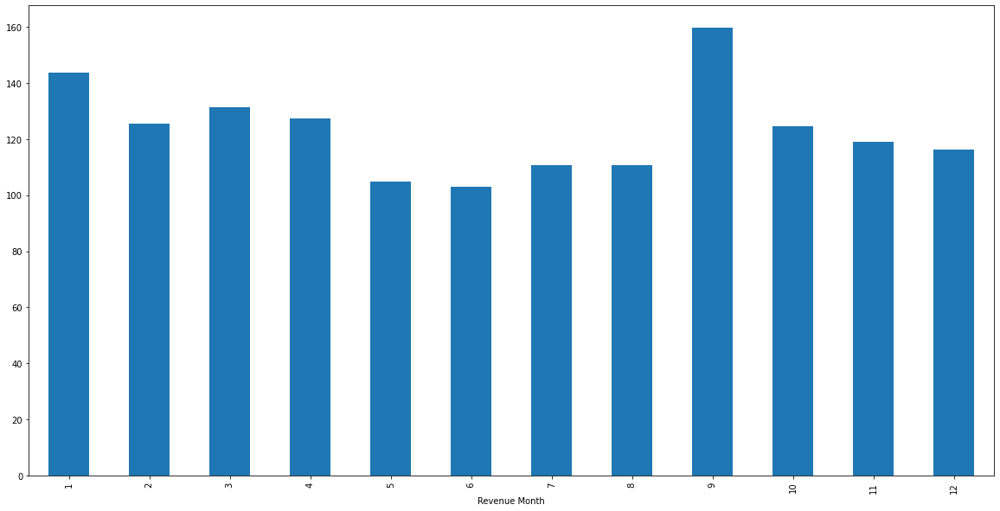

For Current Charges: 


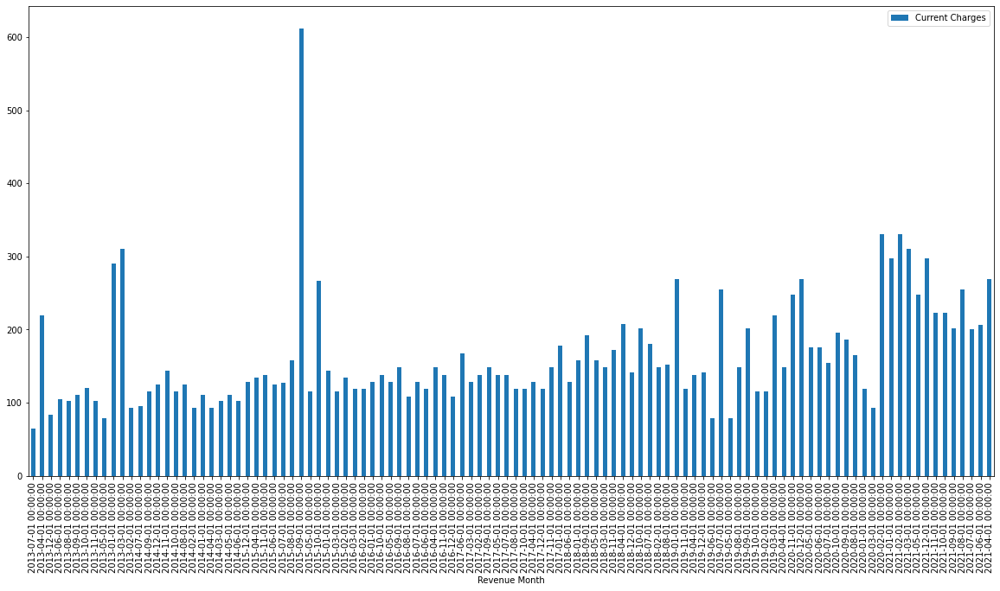

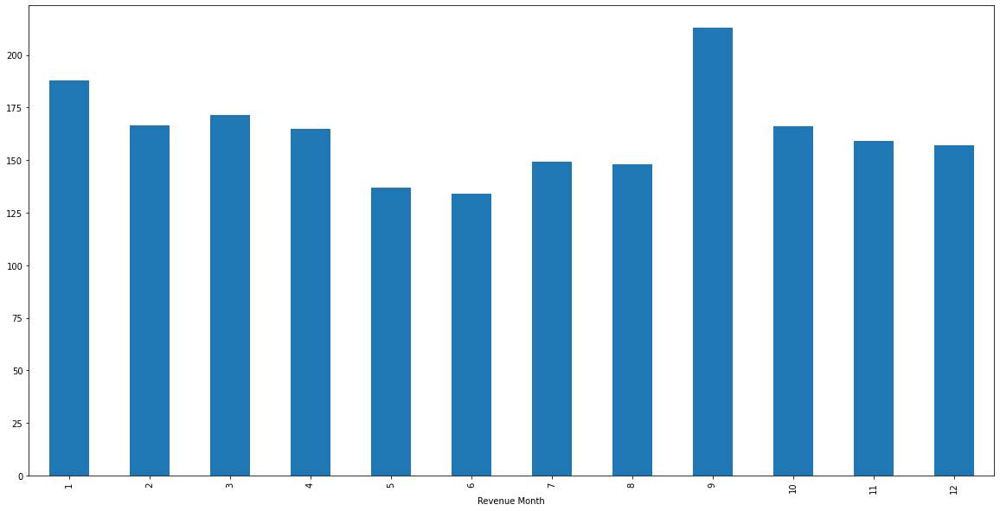

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20290493
For Consumption: 


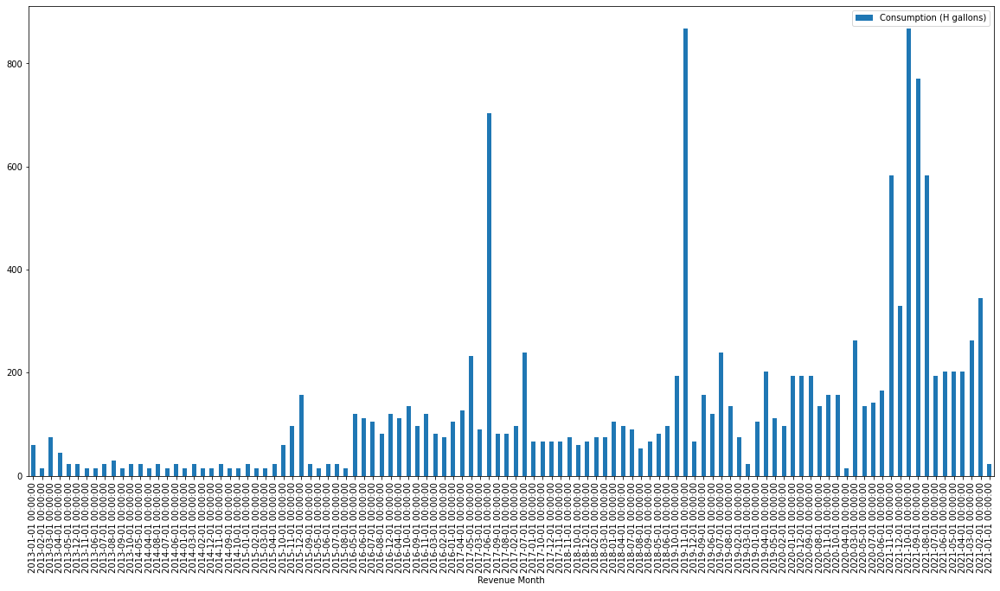

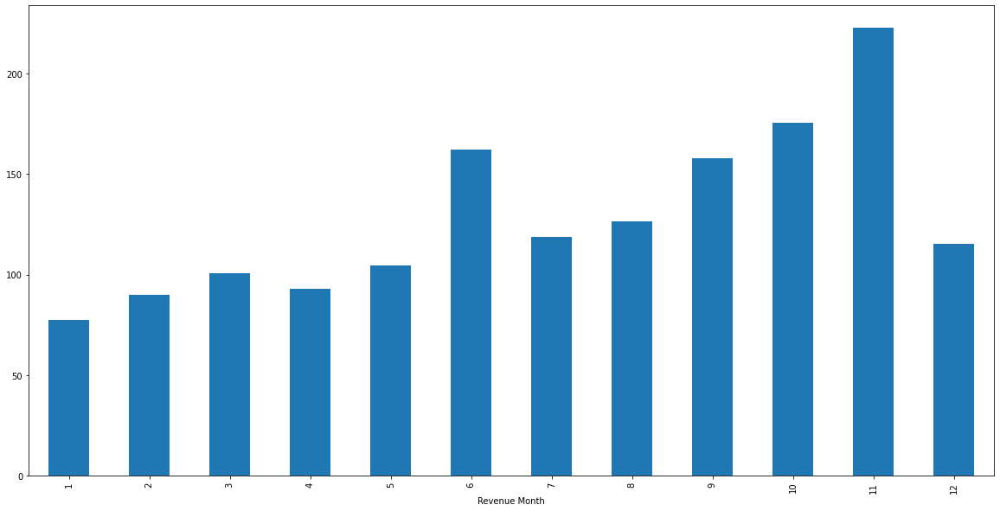

For Current Charges: 


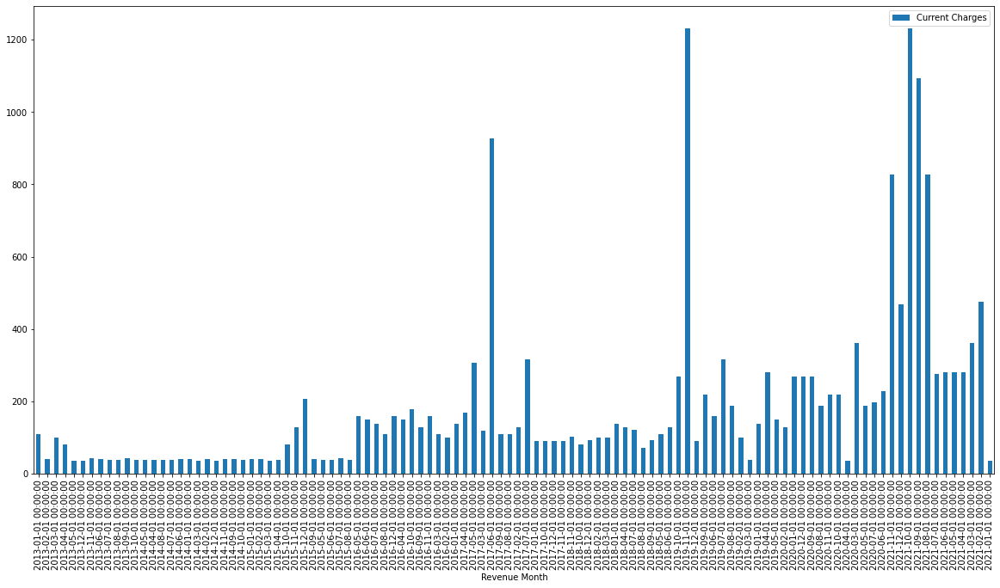

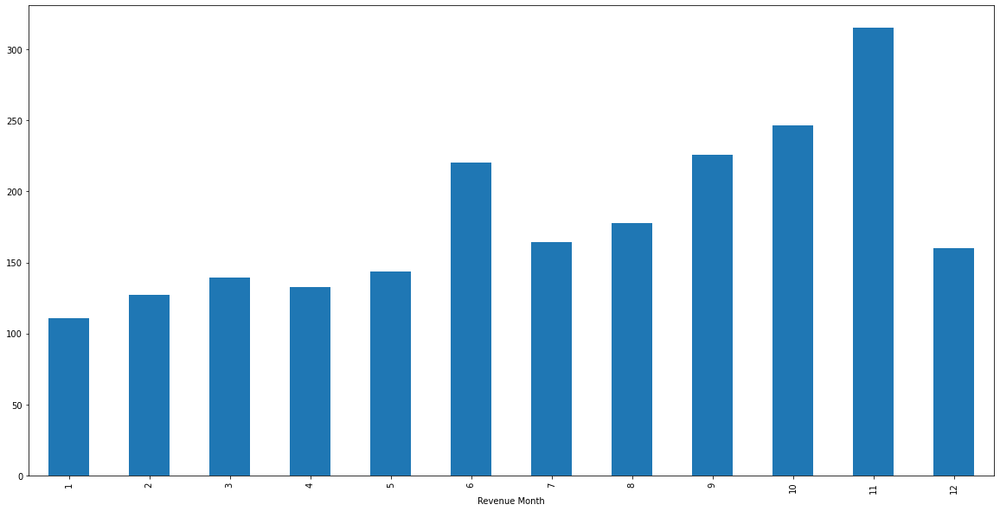

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E22317869
For Consumption: 


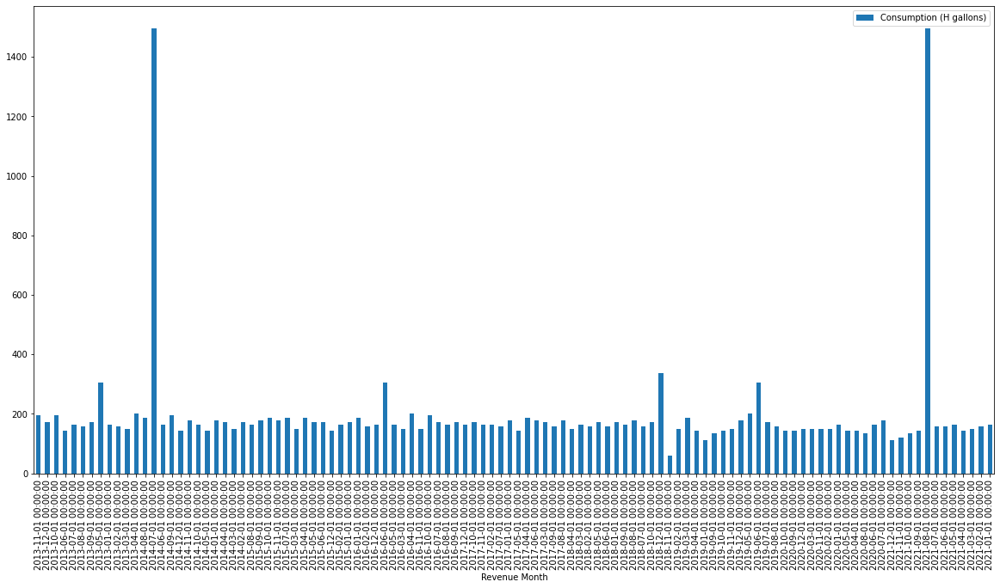

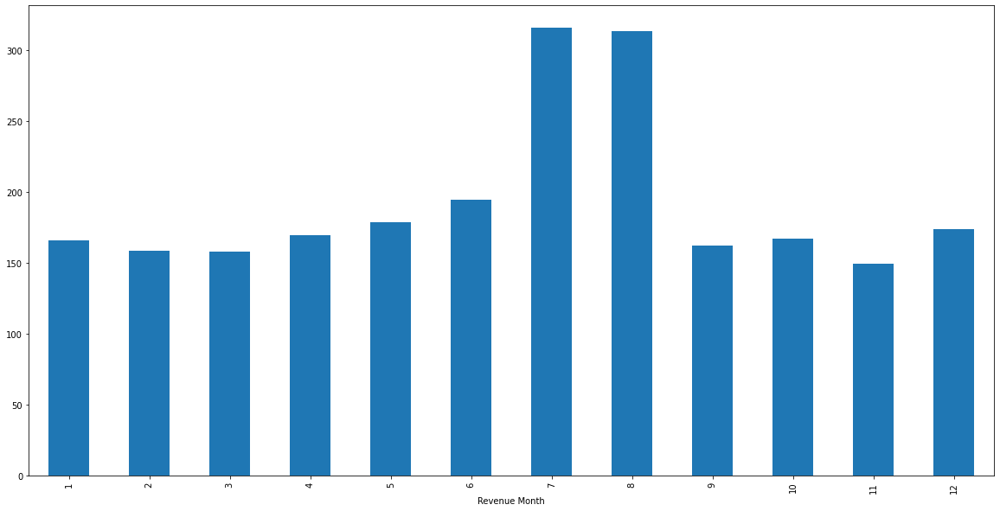

For Current Charges: 


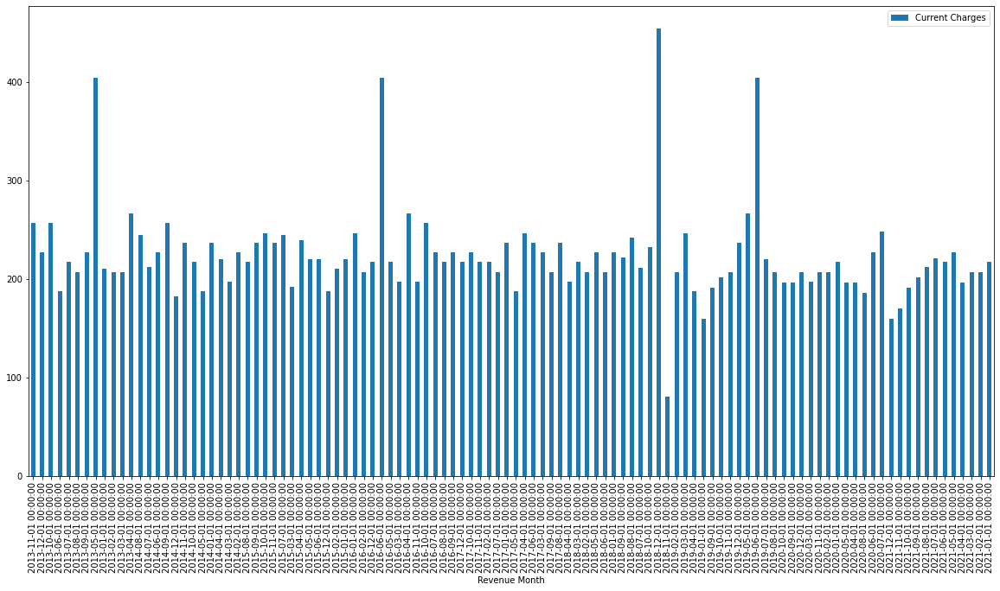

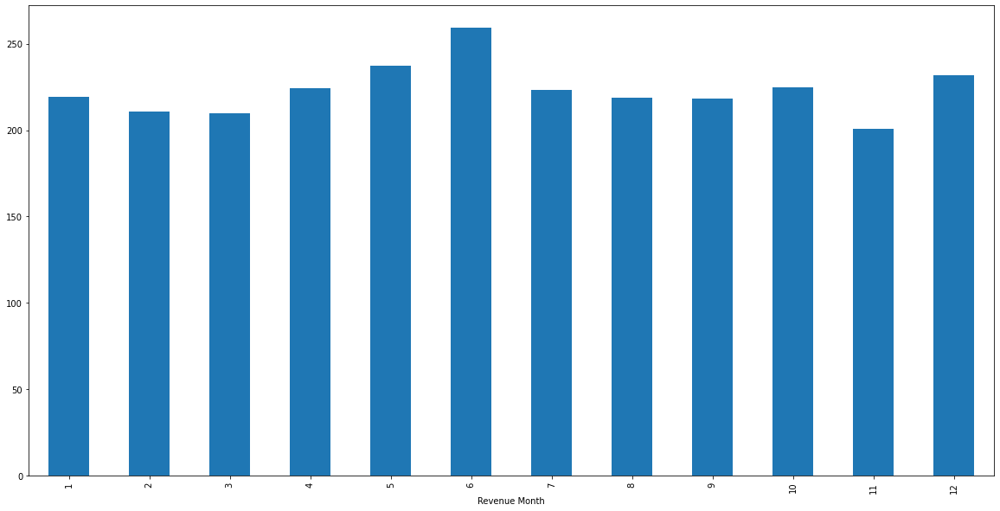

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20372610
For Consumption: 


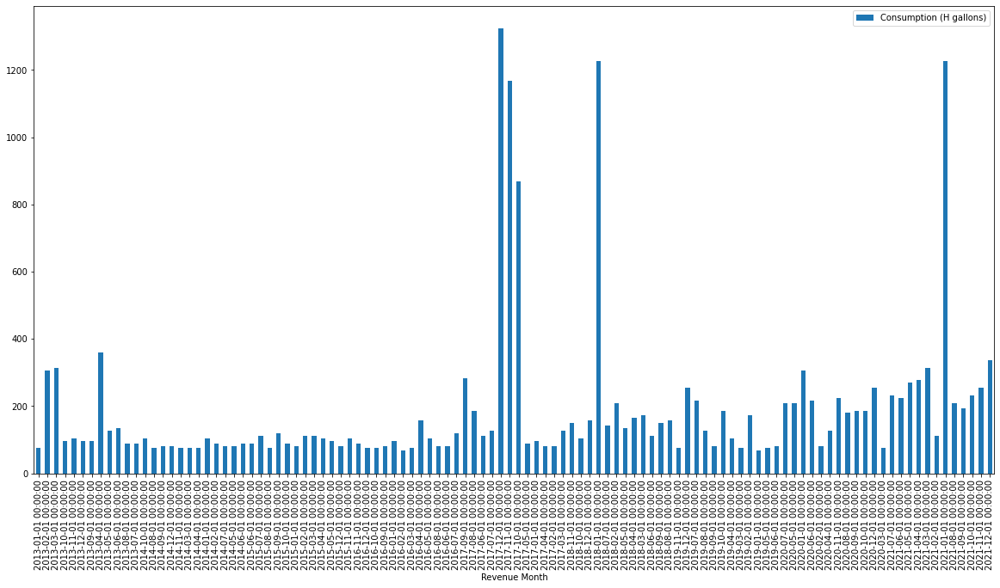

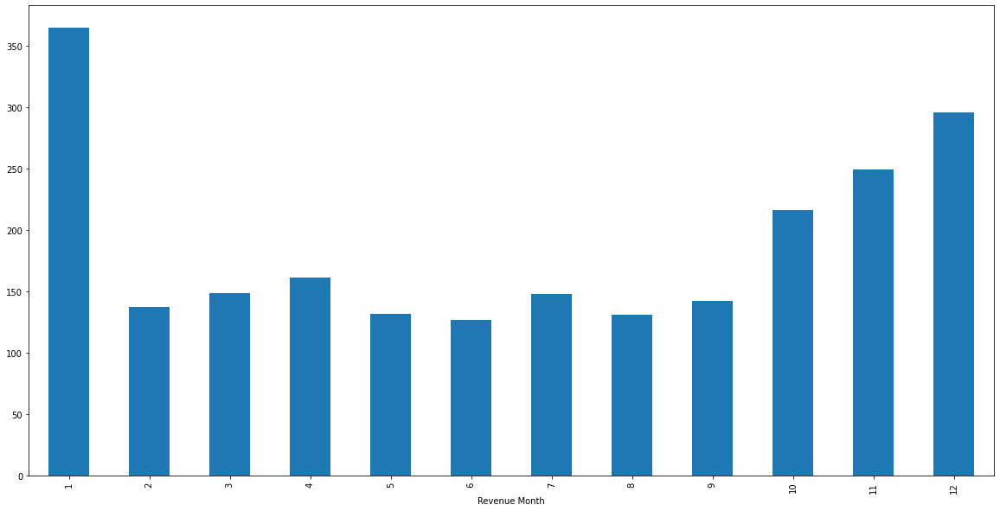

For Current Charges: 


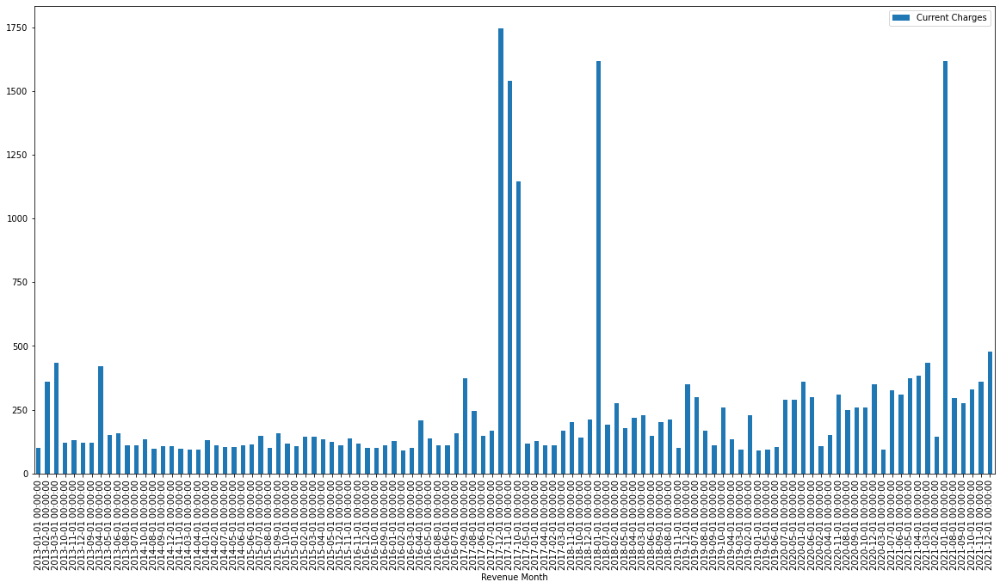

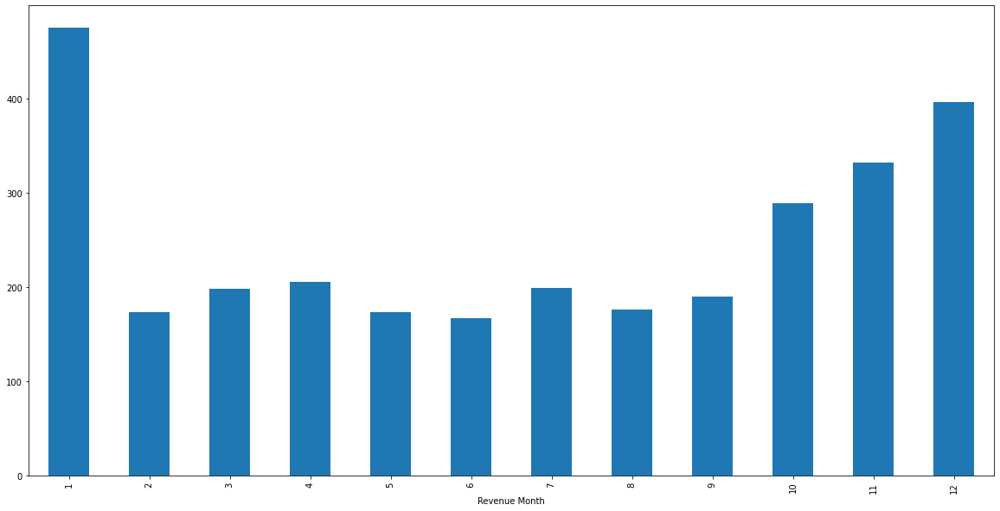

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20290494
For Consumption: 


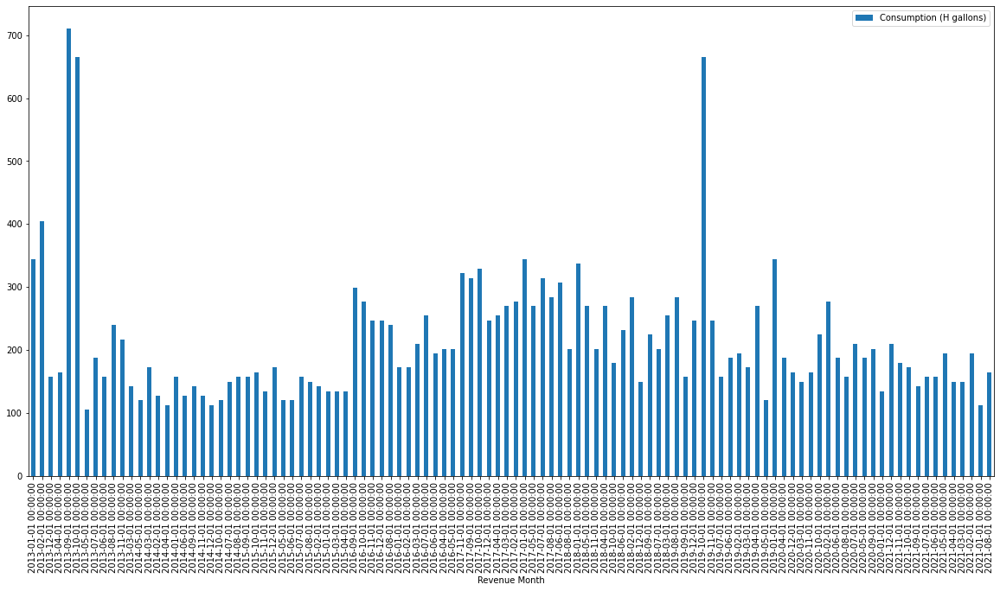

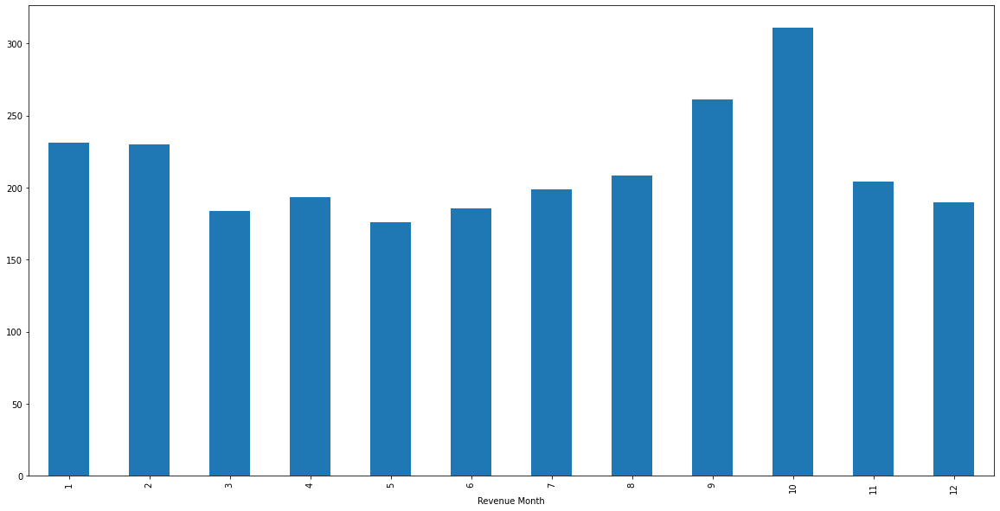

For Current Charges: 


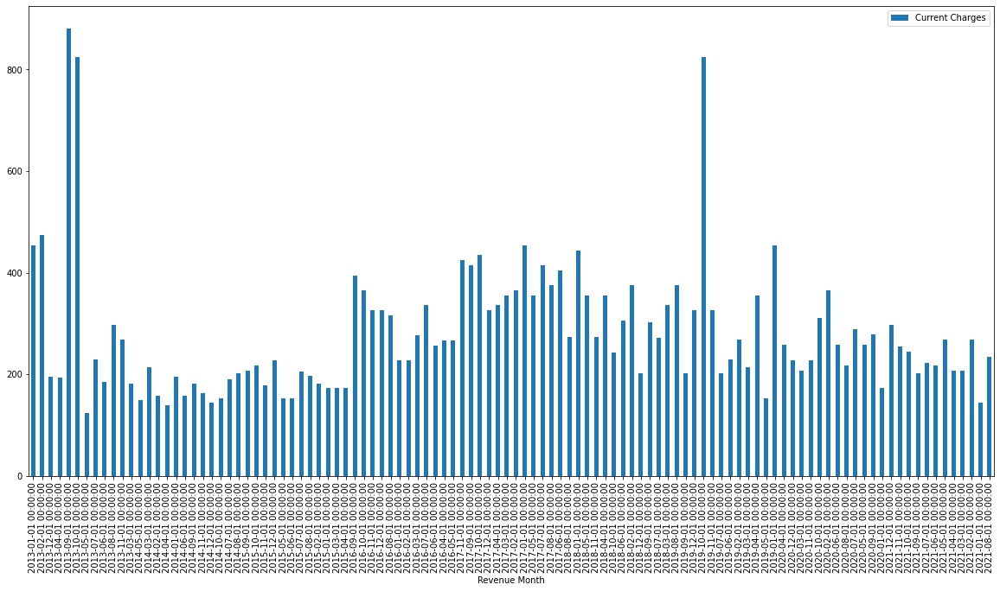

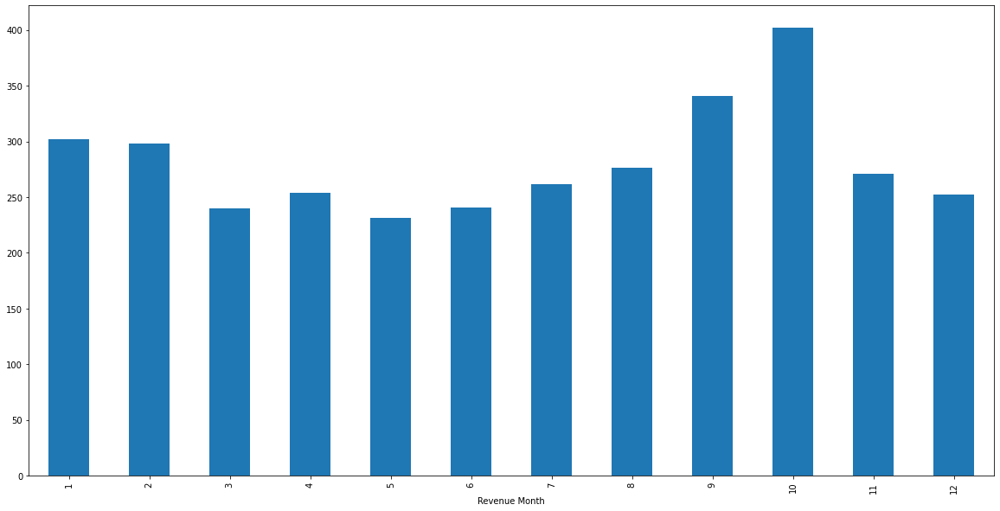

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20453242
For Consumption: 


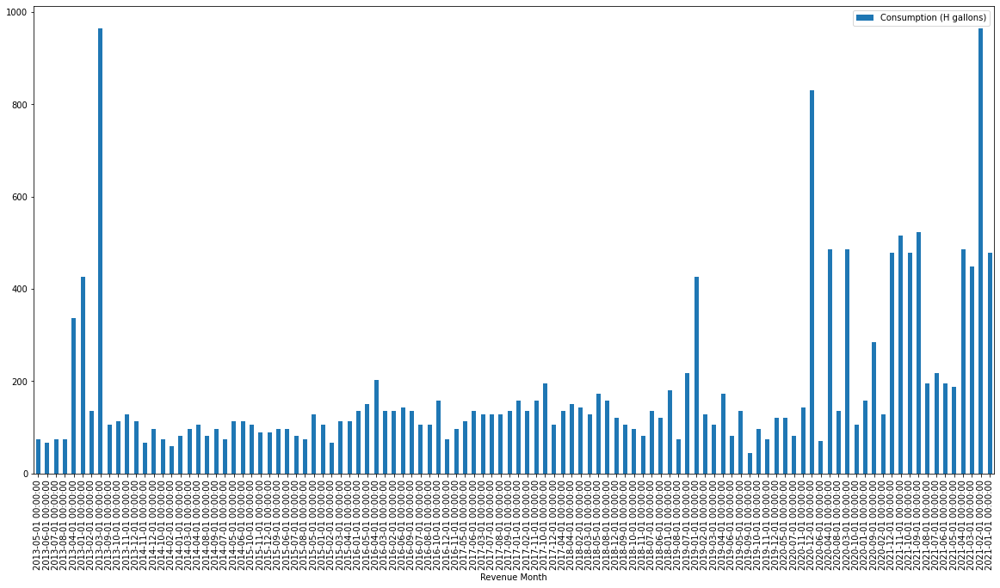

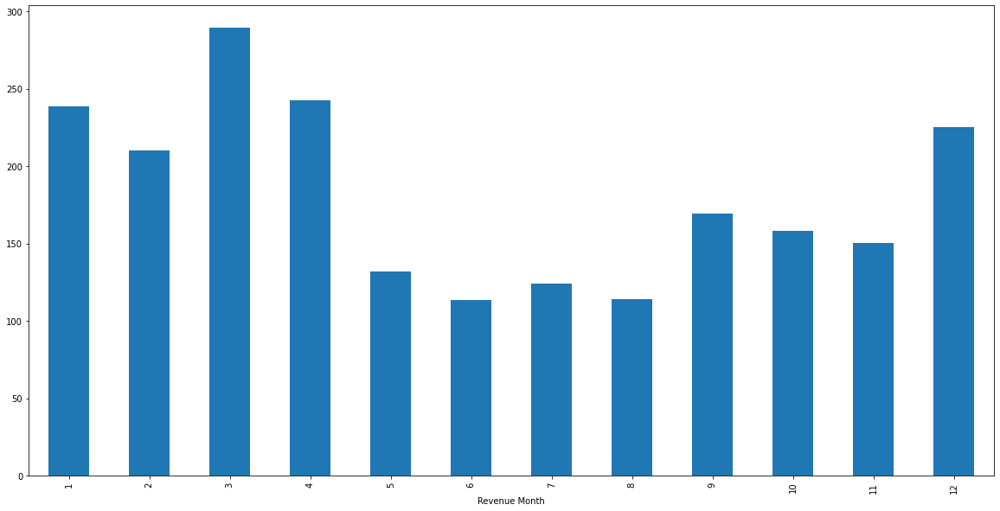

For Current Charges: 


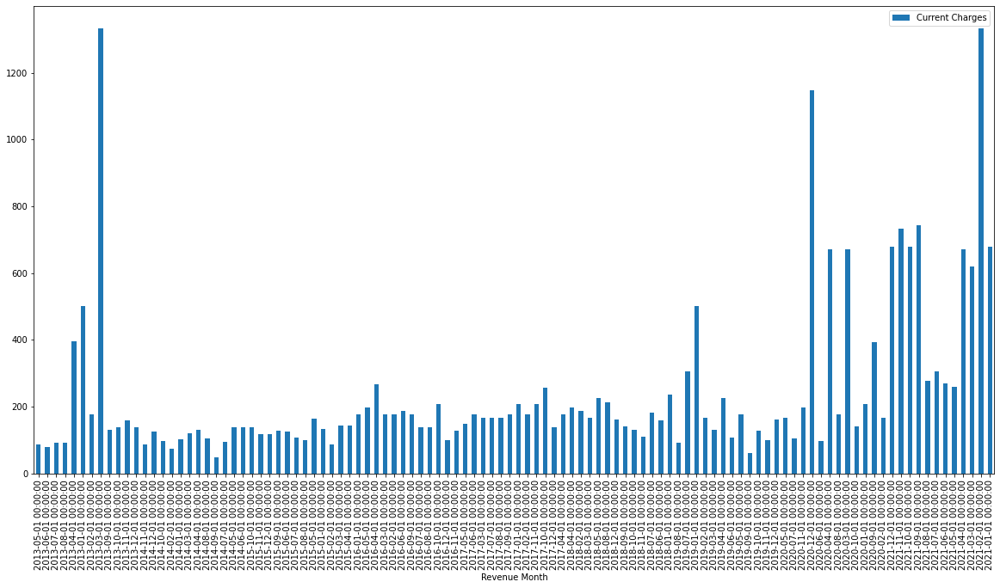

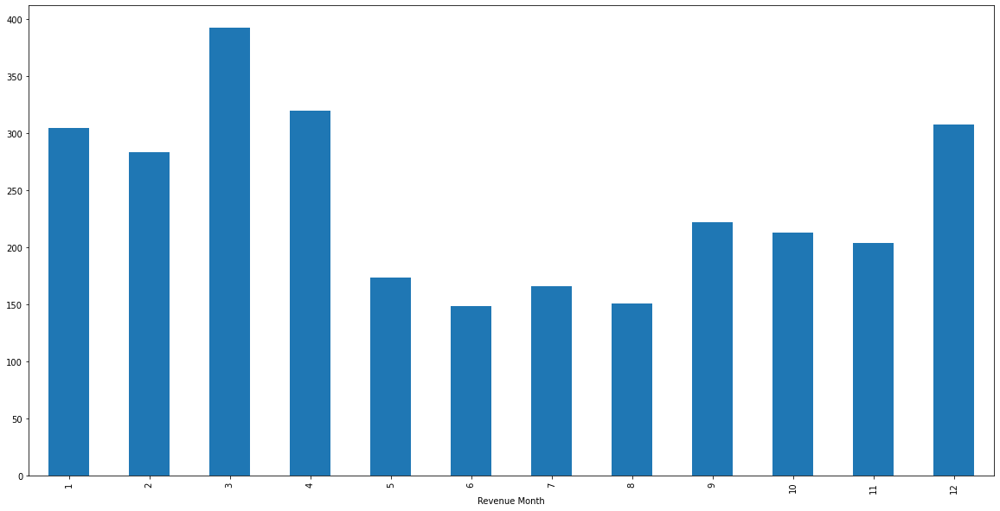

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20291369
For Consumption: 


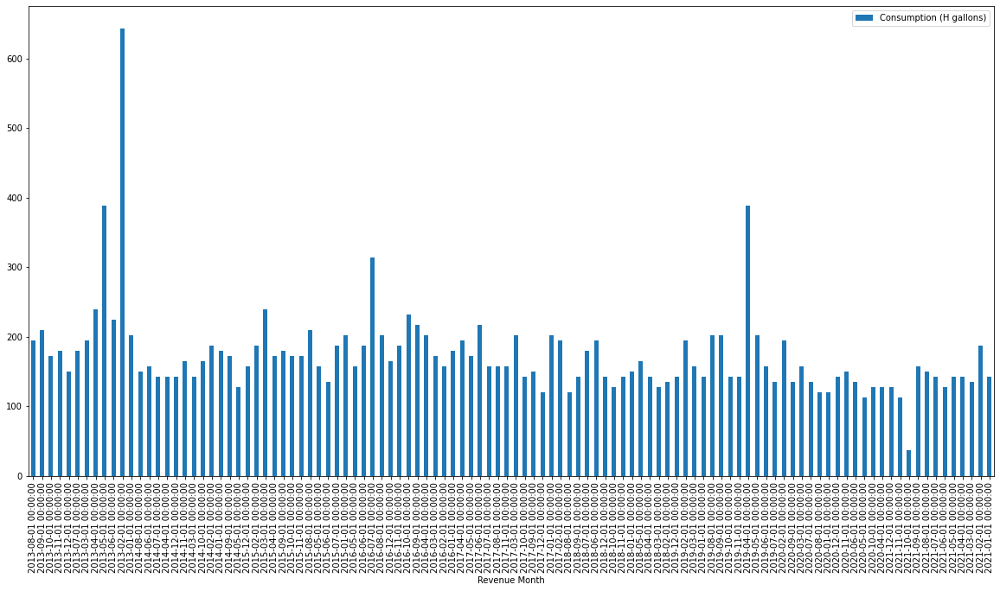

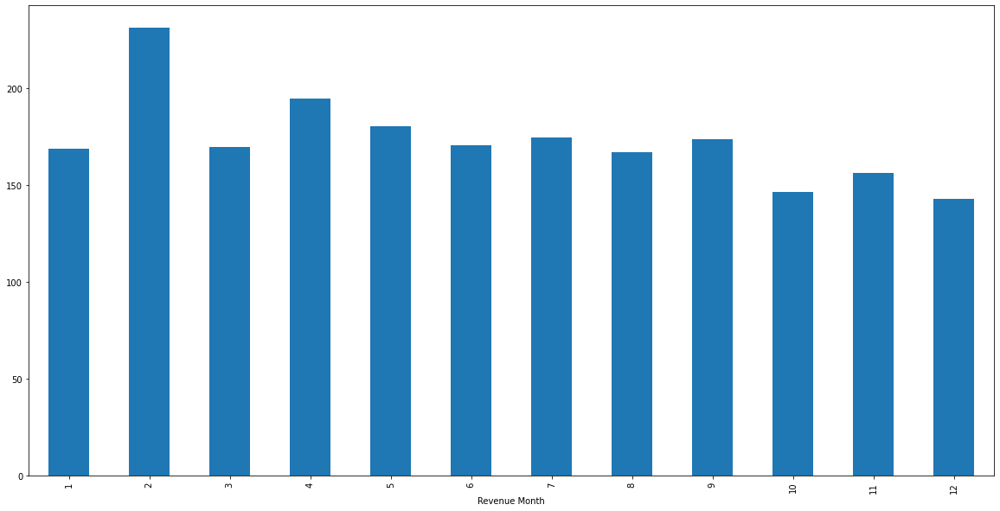

For Current Charges: 


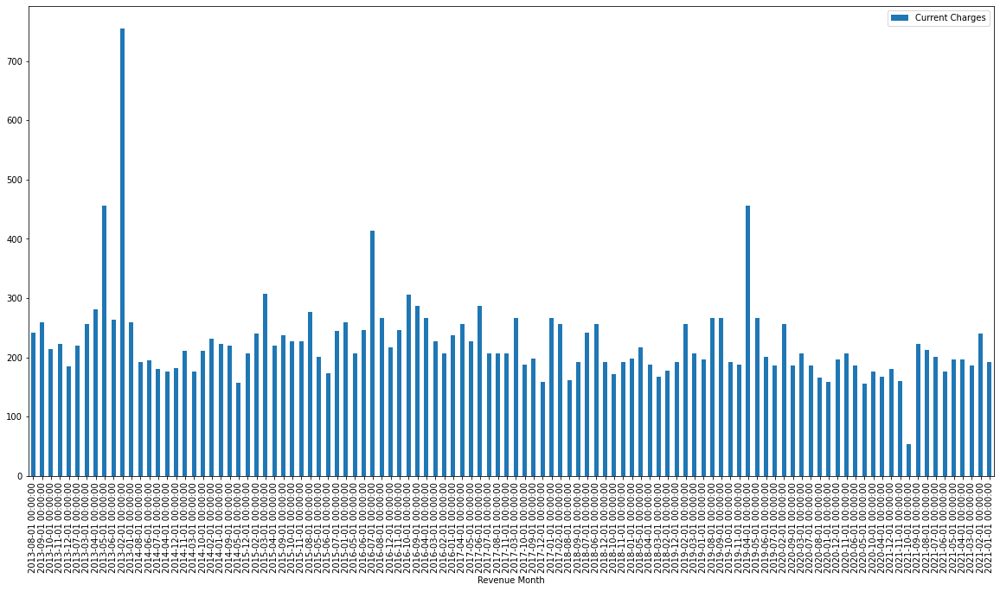

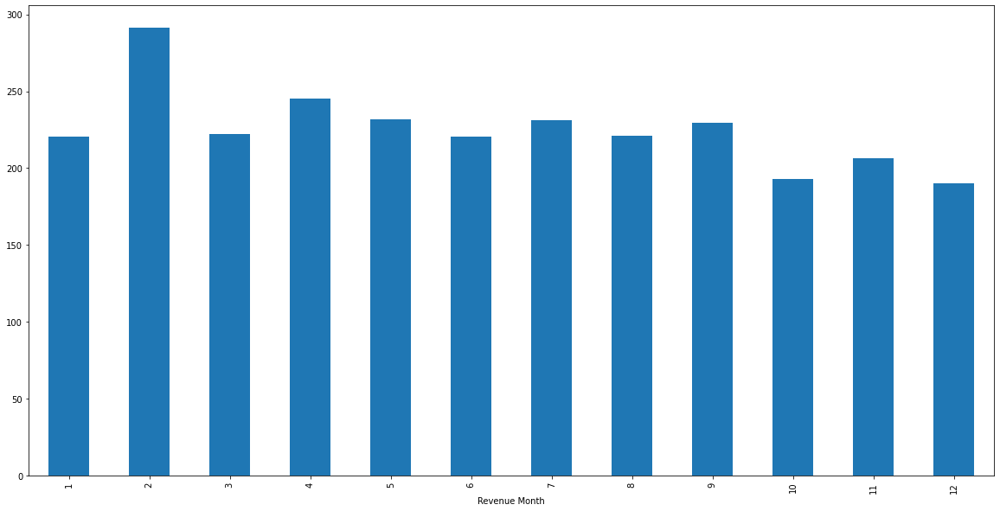

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20290495
For Consumption: 


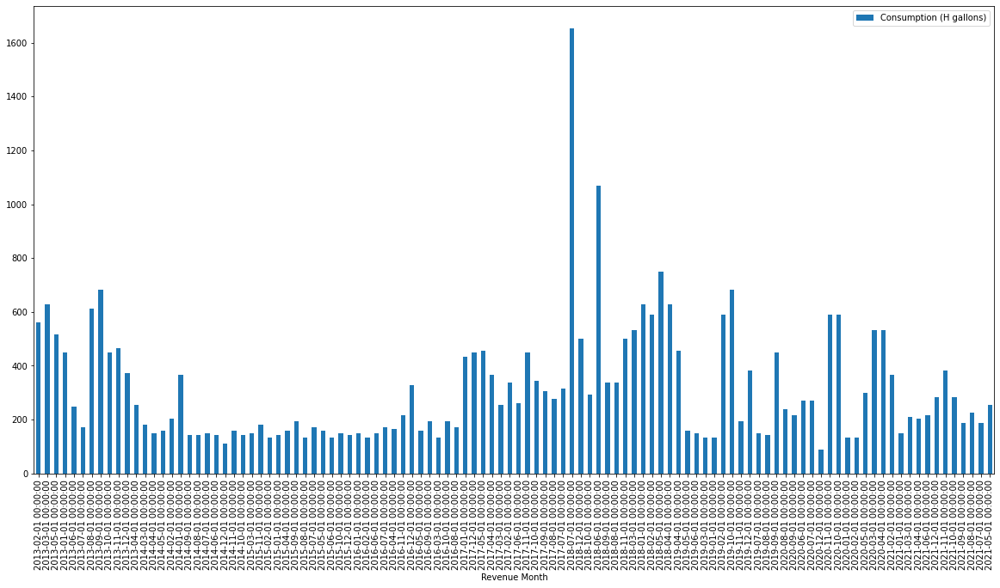

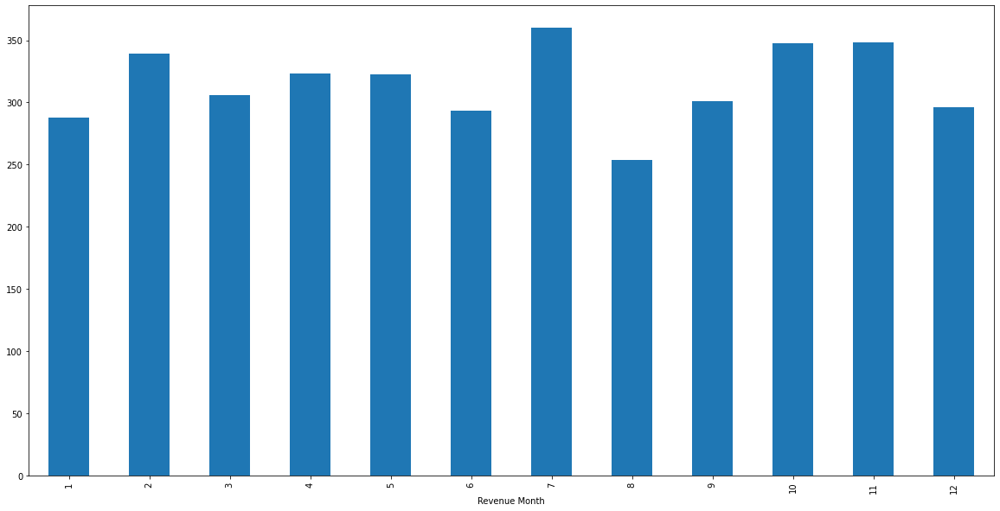

For Current Charges: 


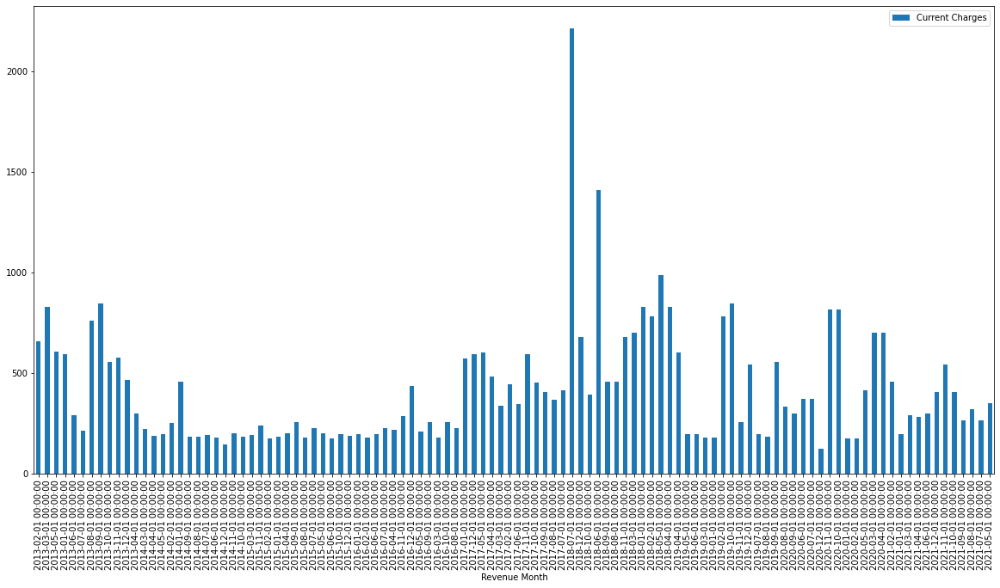

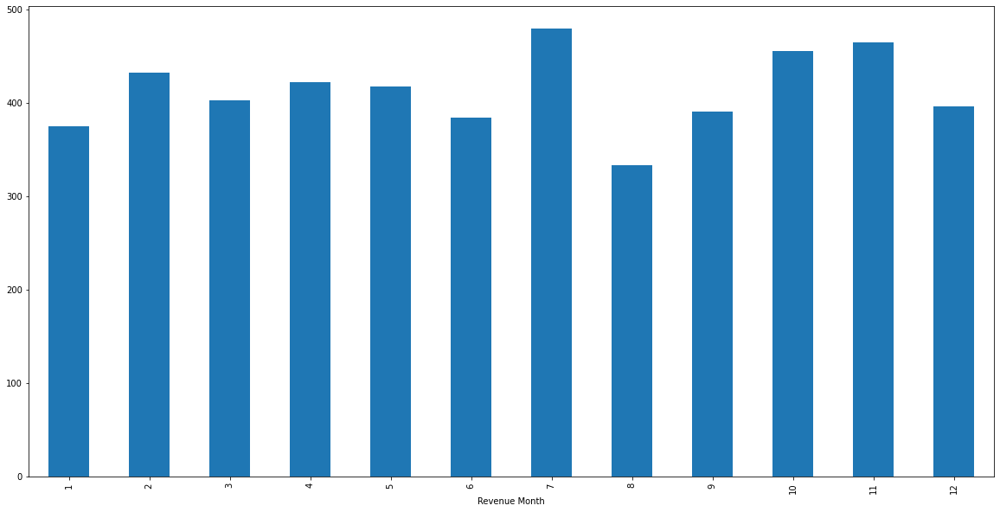

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20308398
For Consumption: 


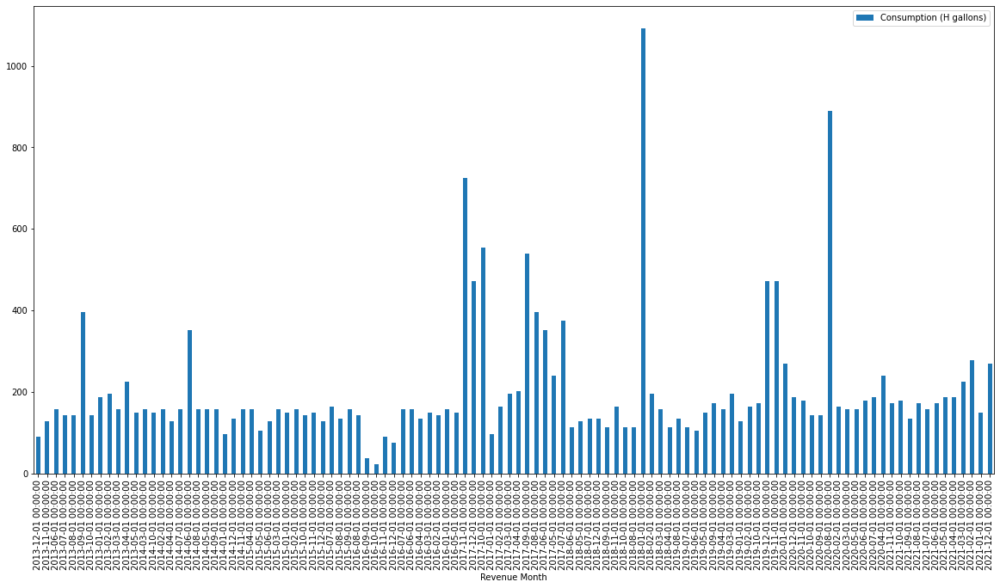

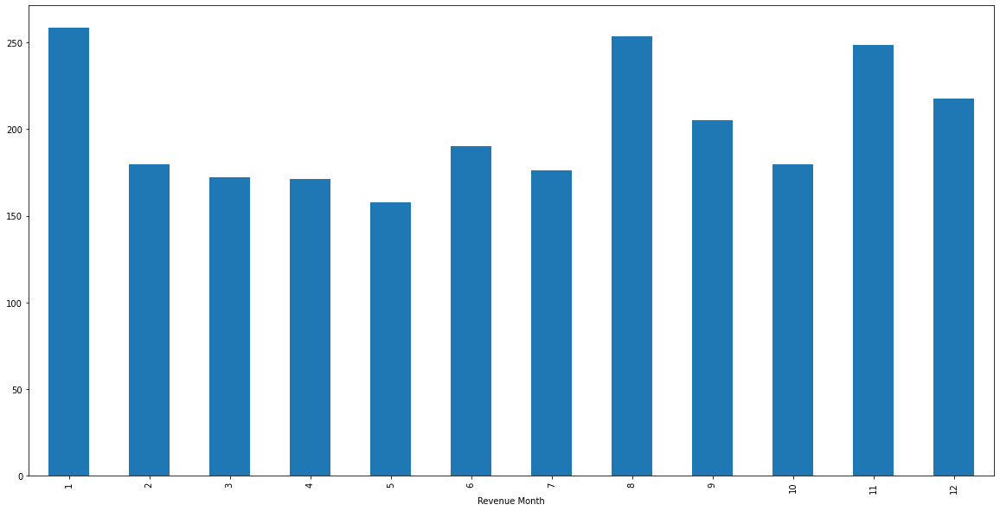

For Current Charges: 


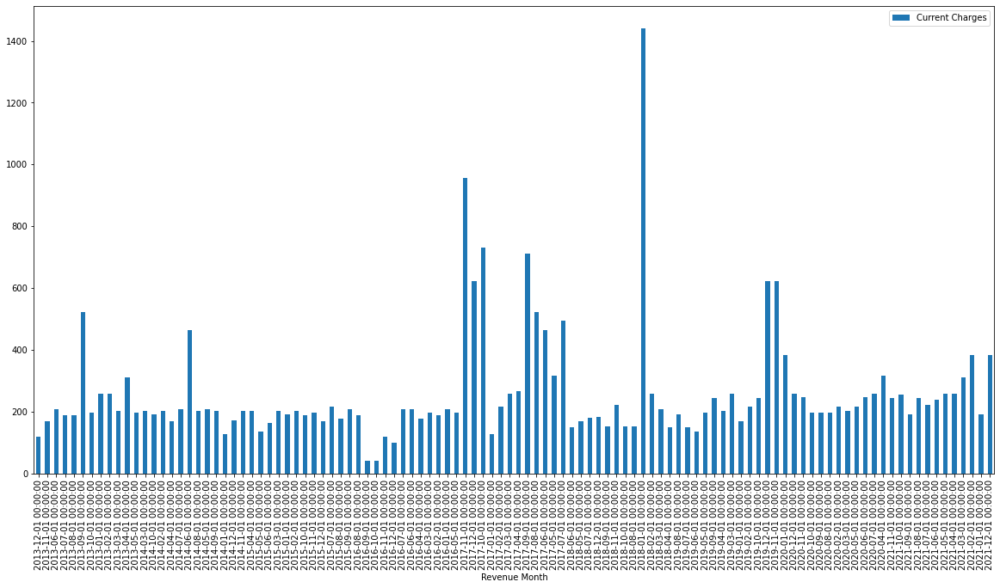

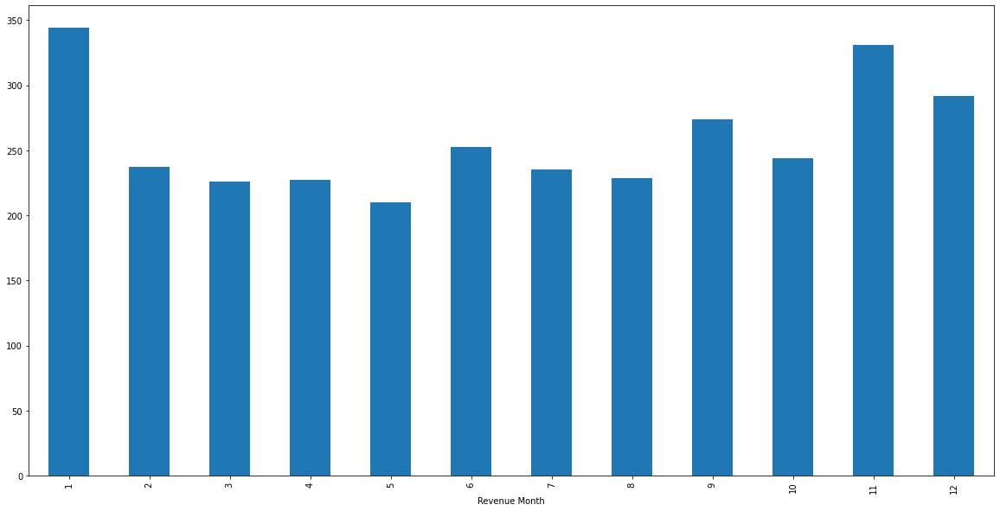

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20312472
For Consumption: 


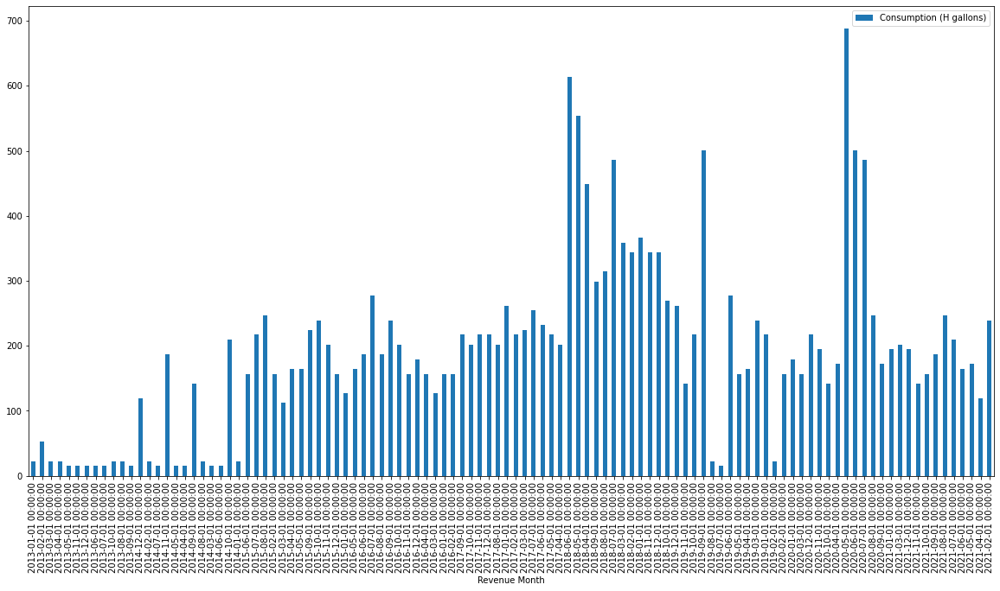

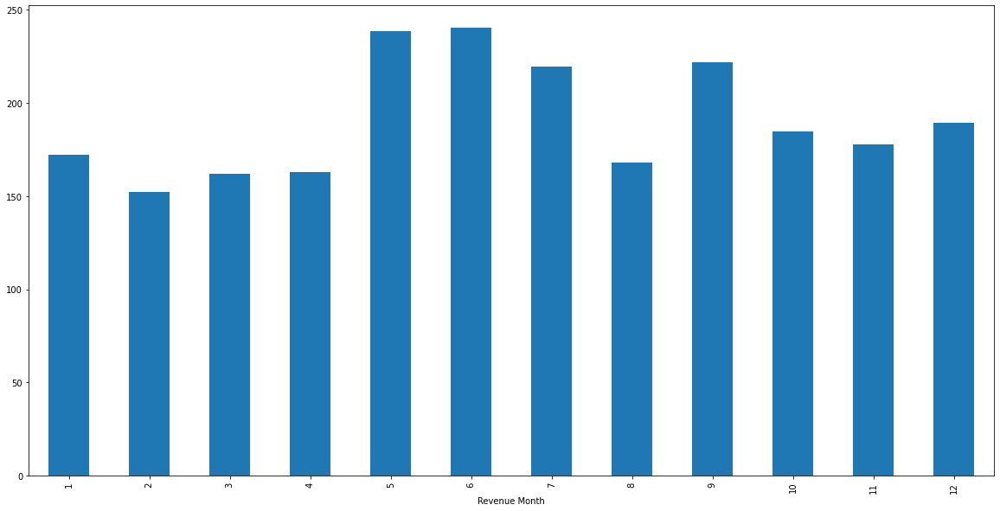

For Current Charges: 


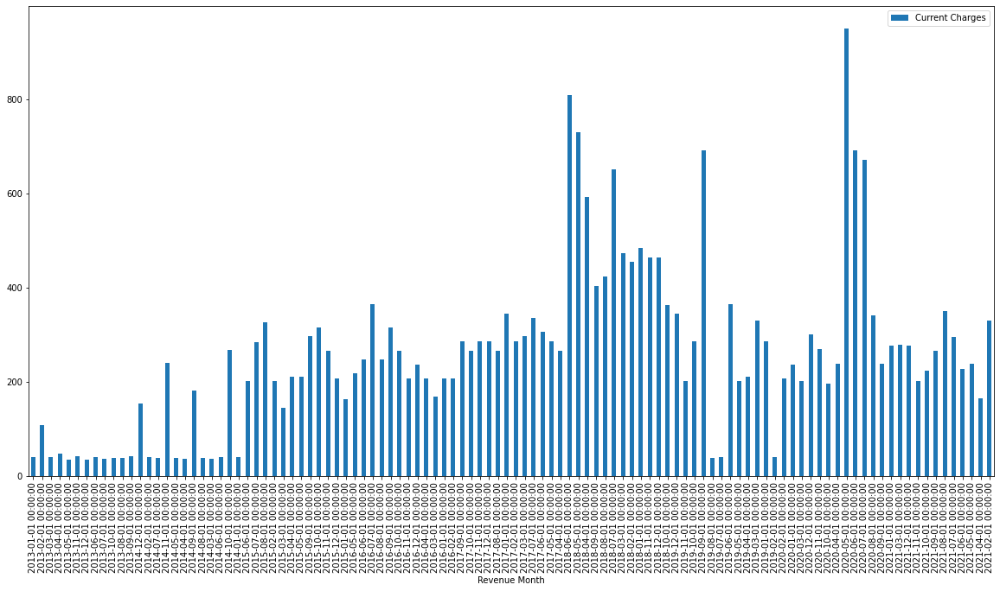

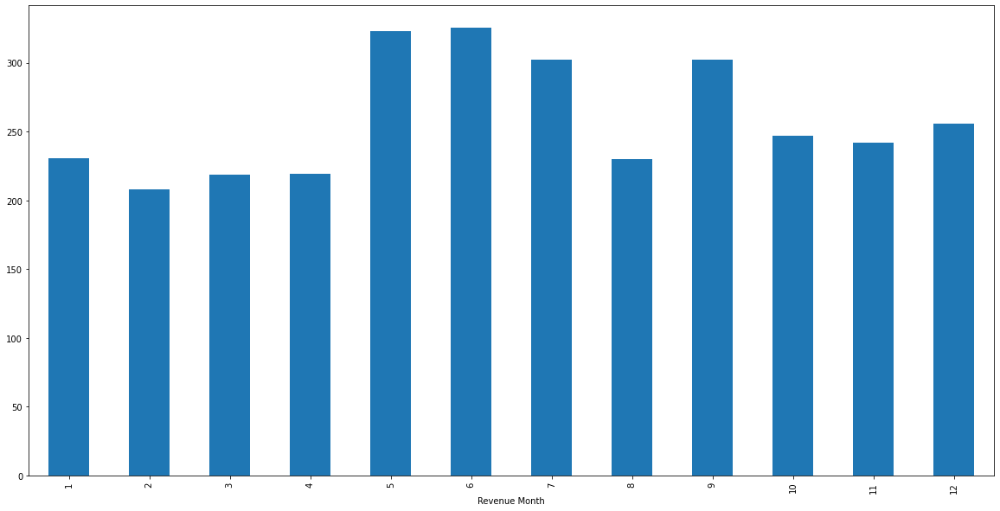

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20290492
For Consumption: 


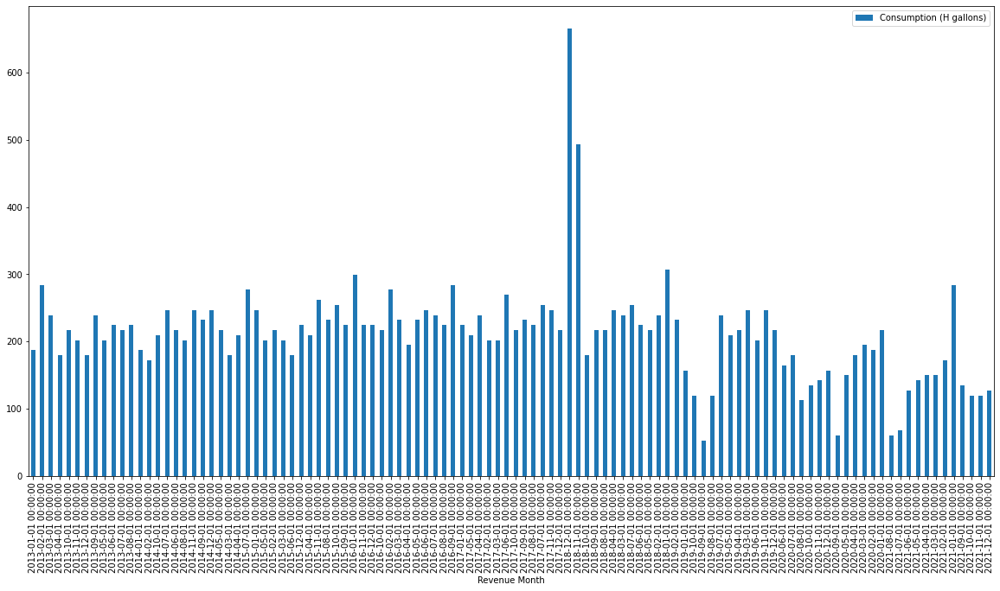

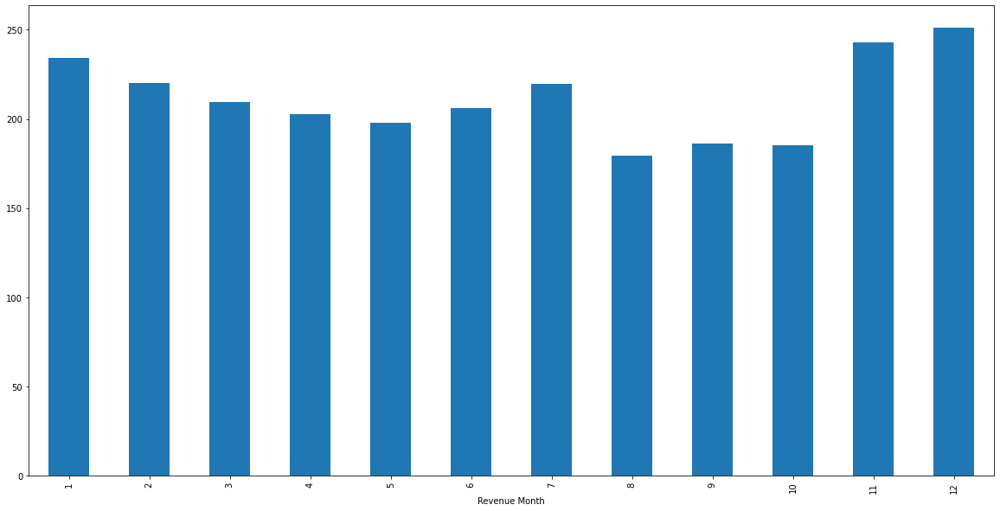

For Current Charges: 


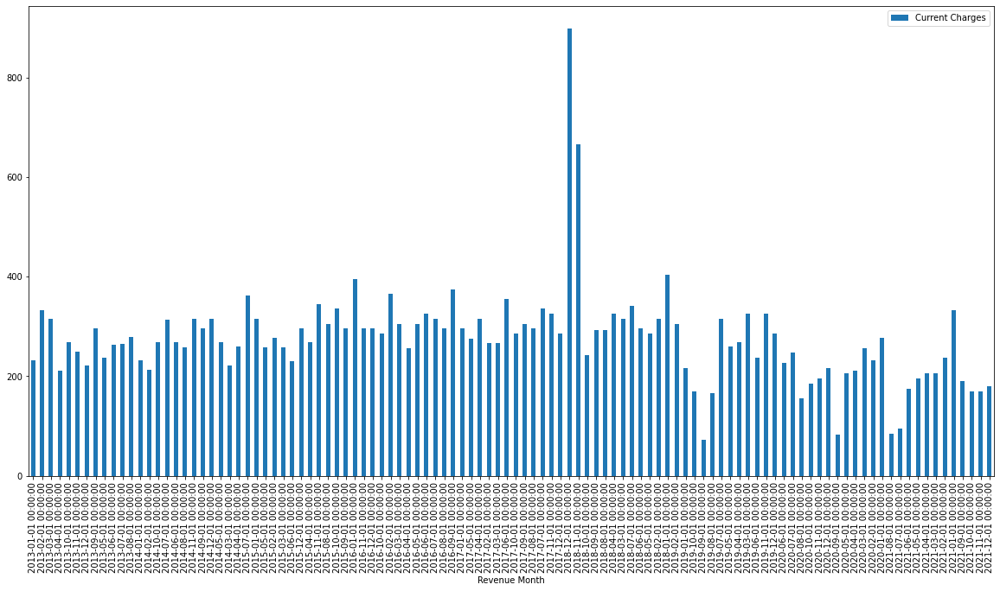

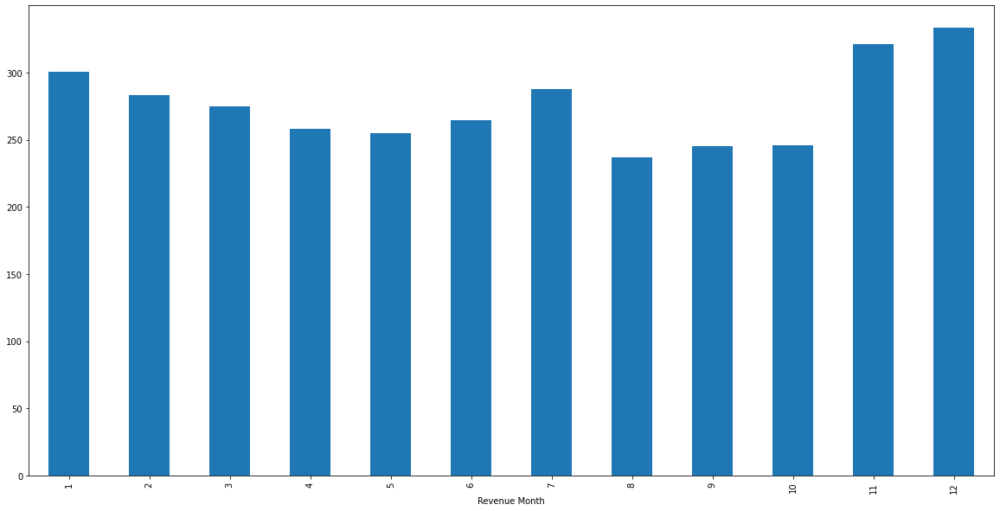

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20231894
For Consumption: 


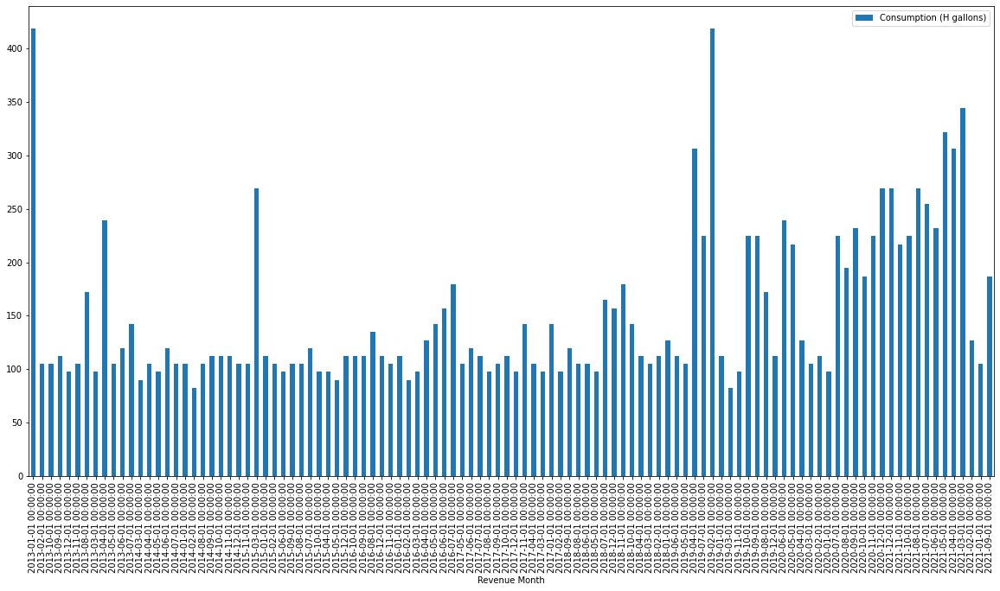

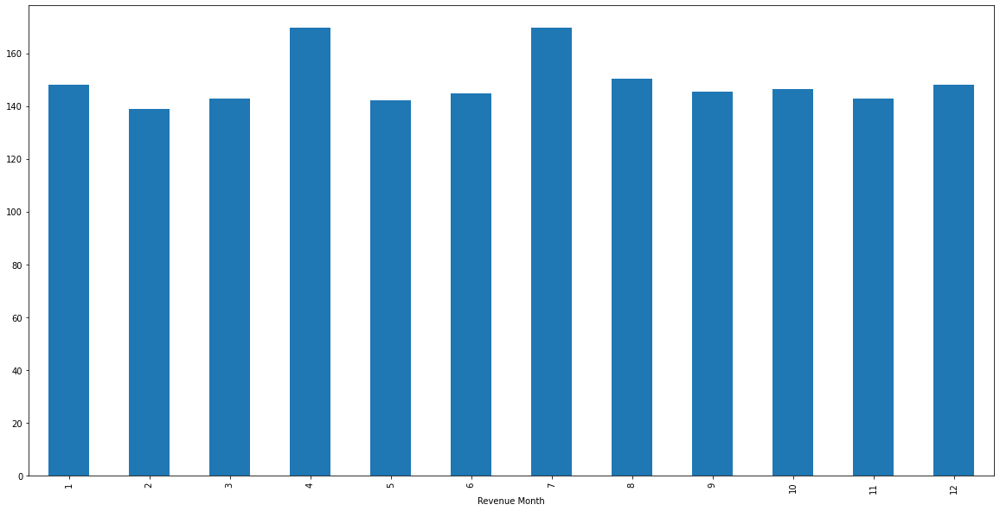

For Current Charges: 


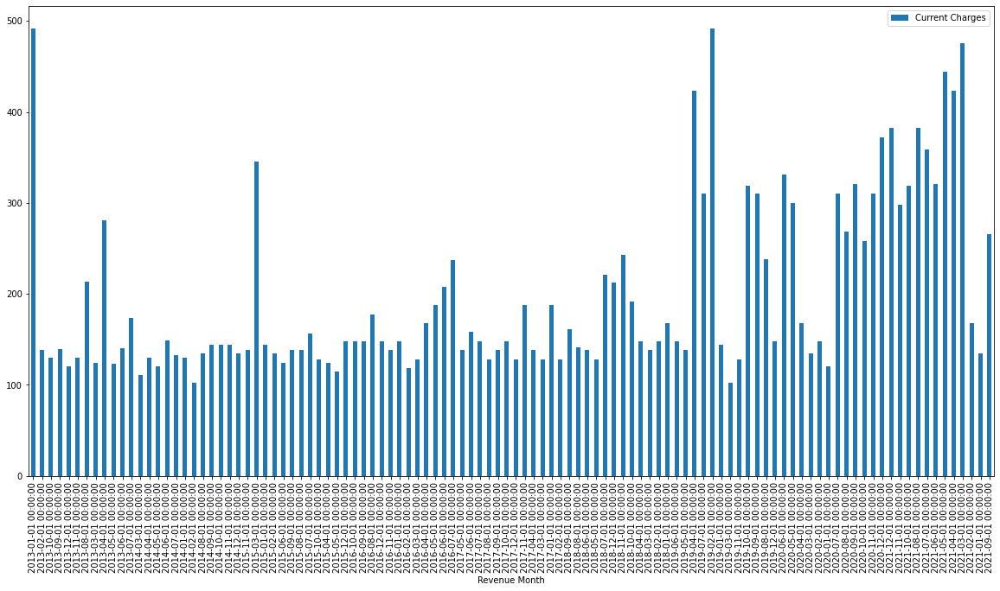

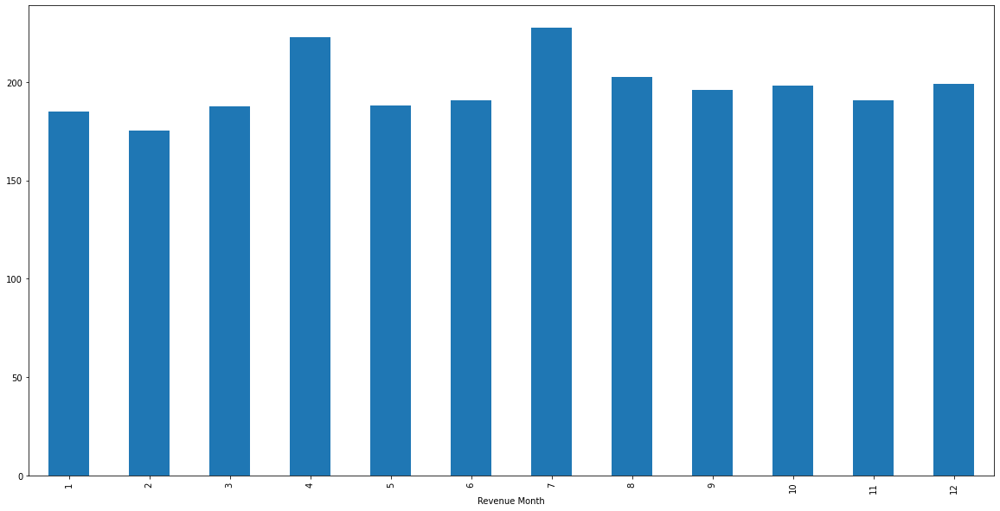

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20179084
For Consumption: 


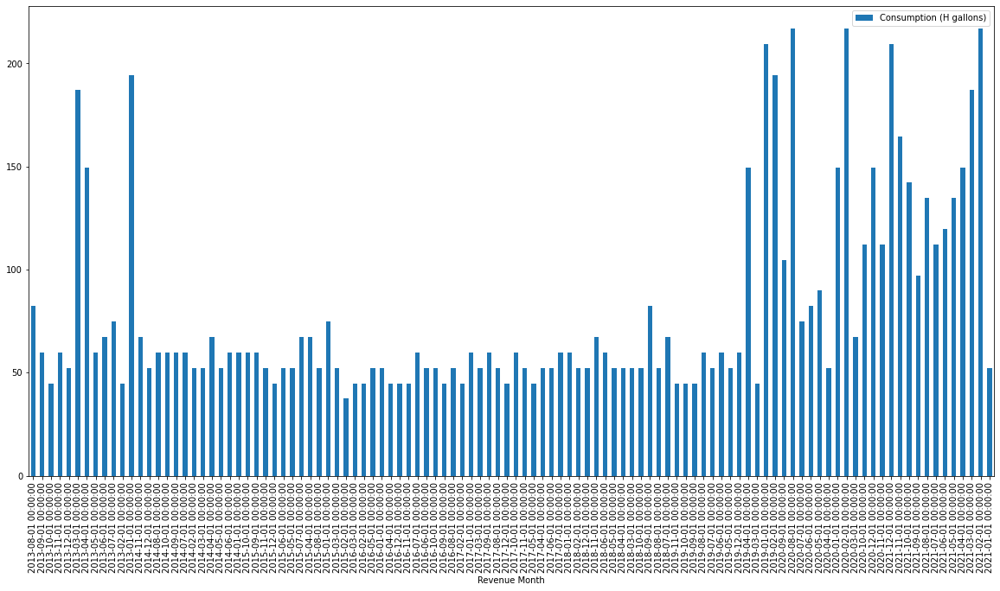

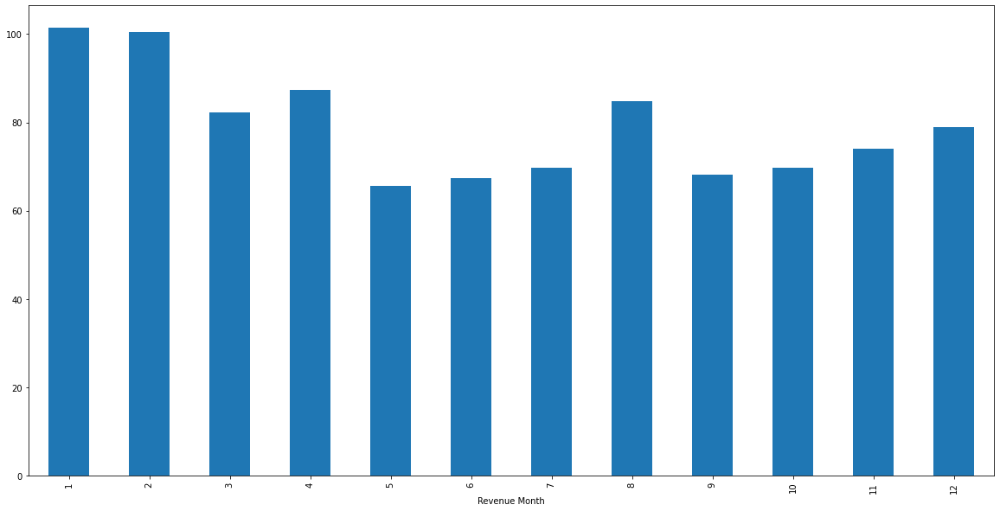

For Current Charges: 


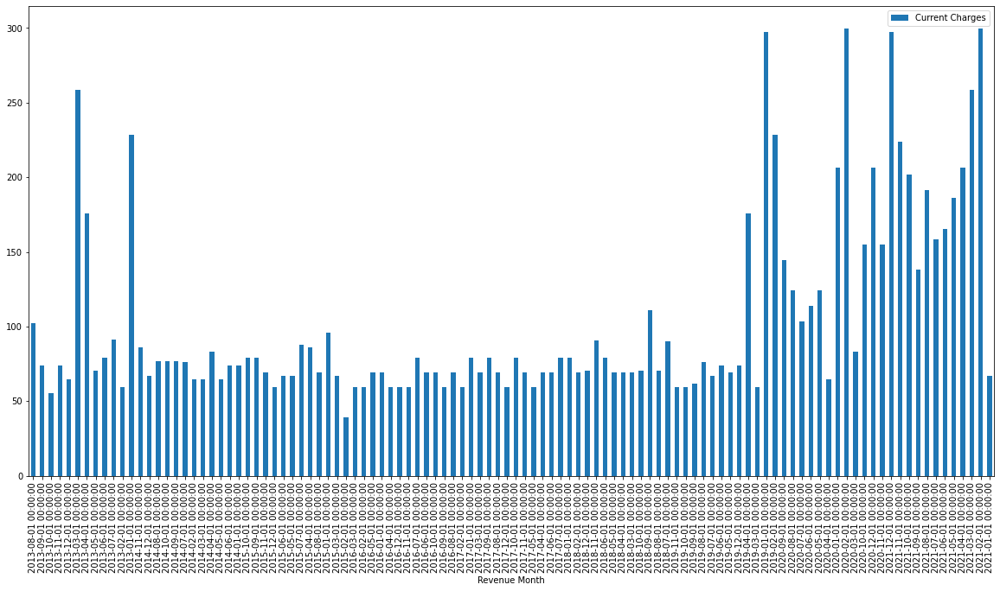

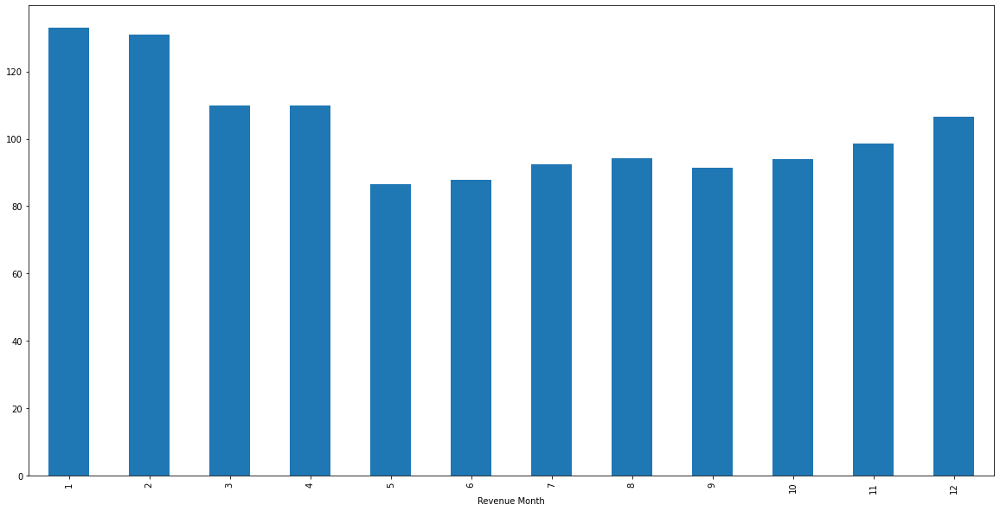

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20333760
For Consumption: 


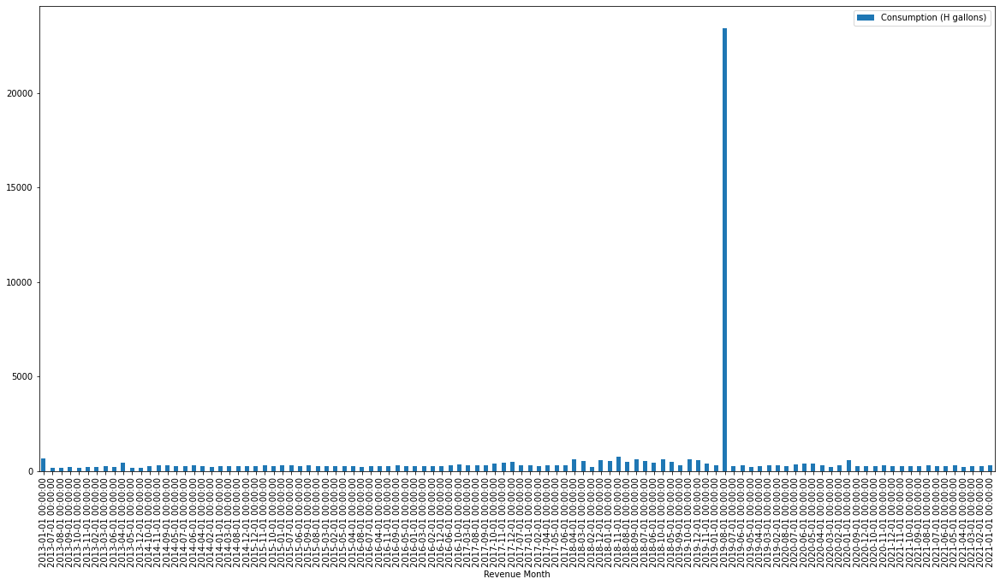

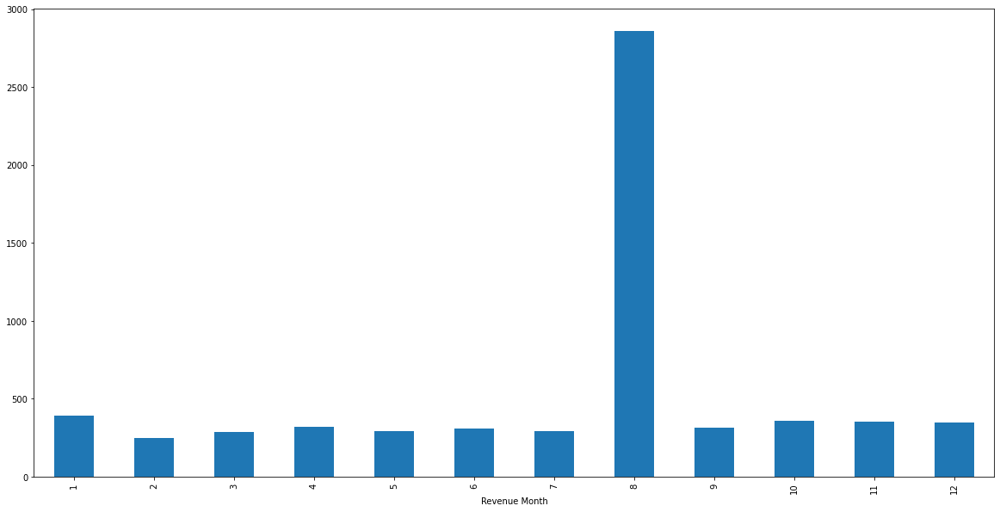

For Current Charges: 


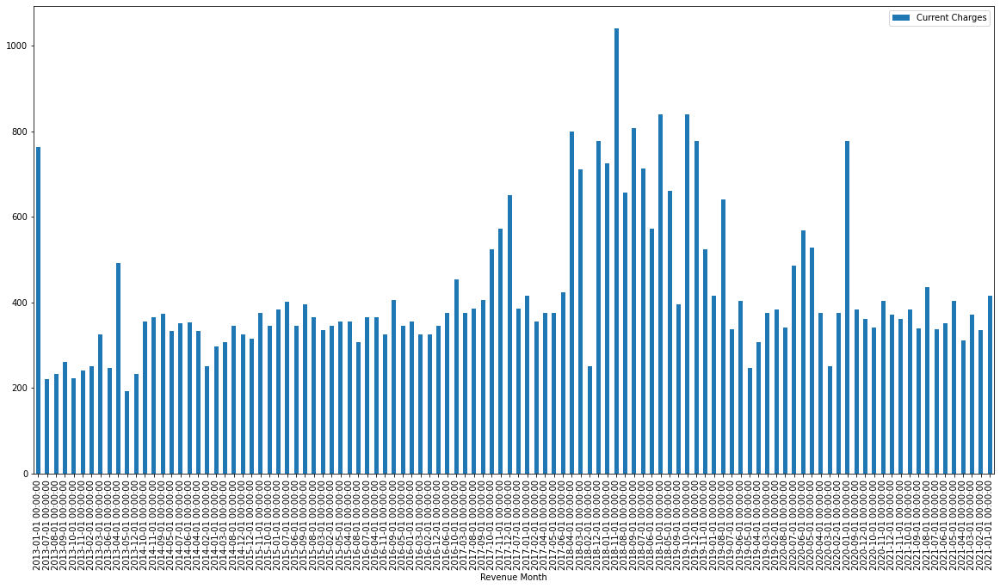

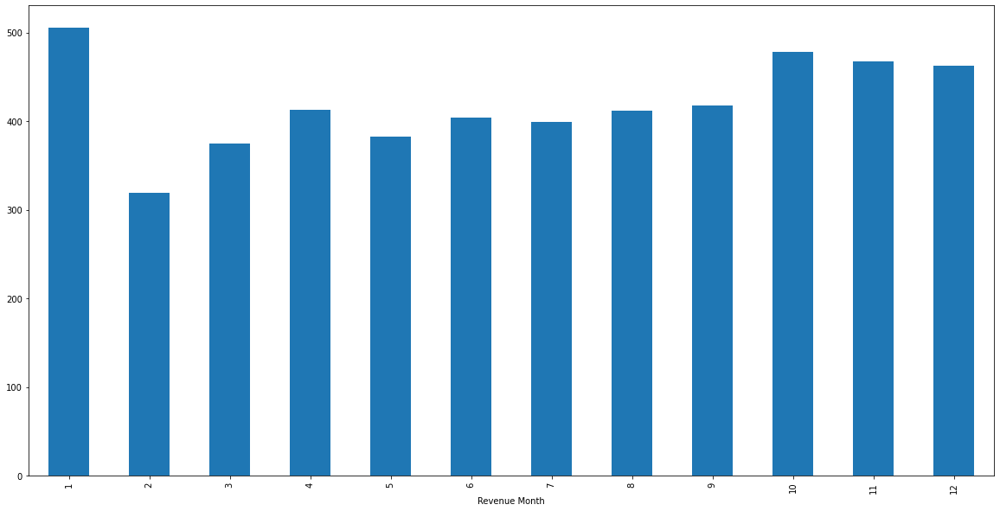

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E21207684
For Consumption: 


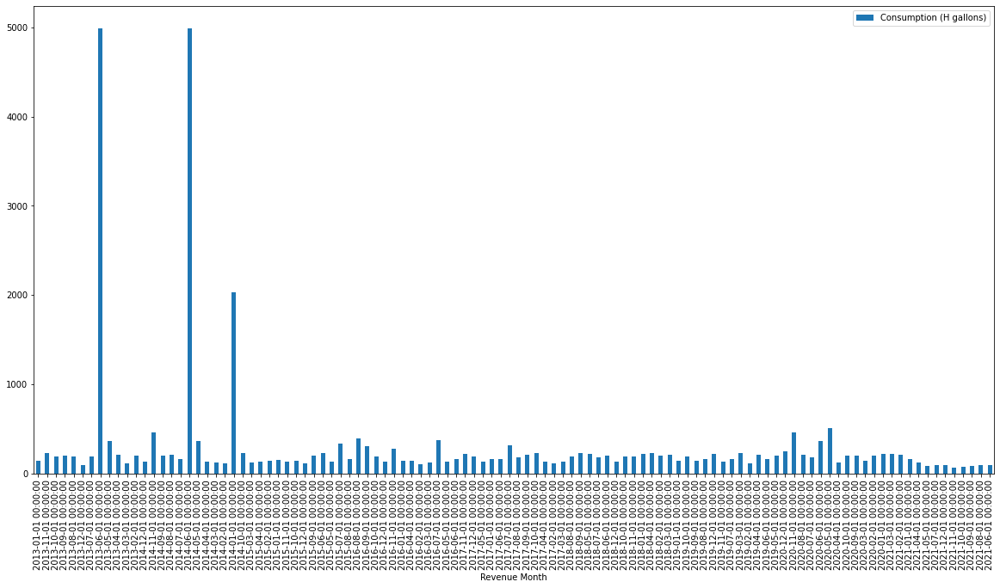

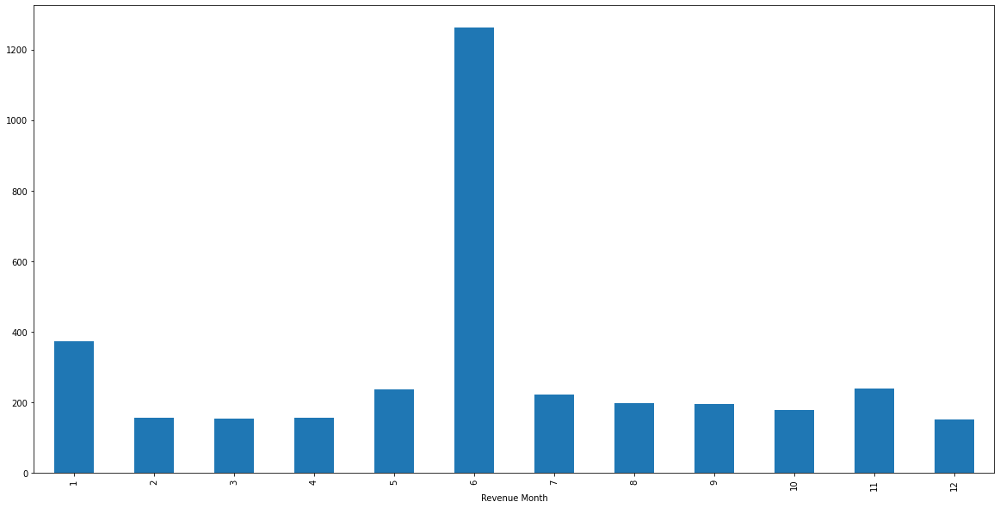

For Current Charges: 


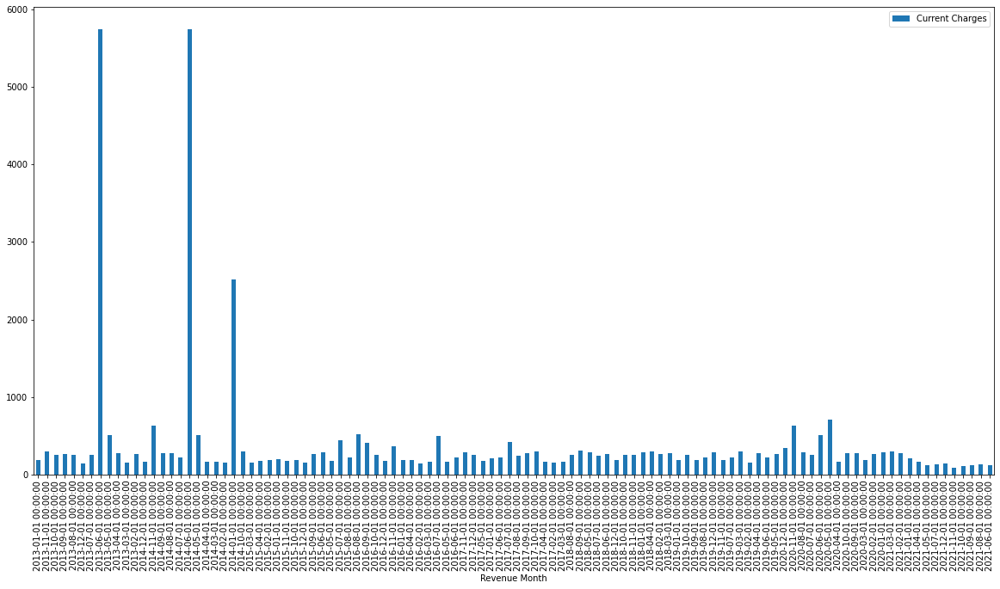

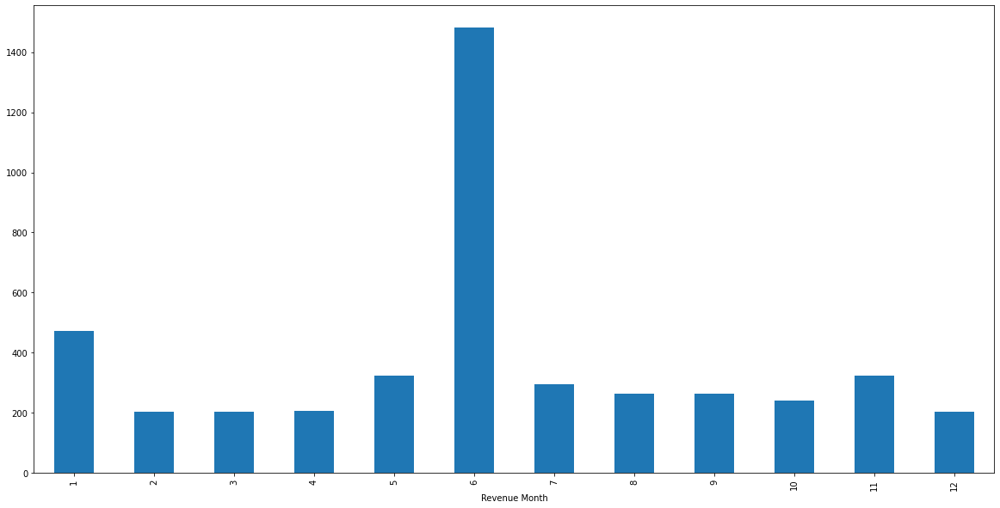

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20290719
For Consumption: 


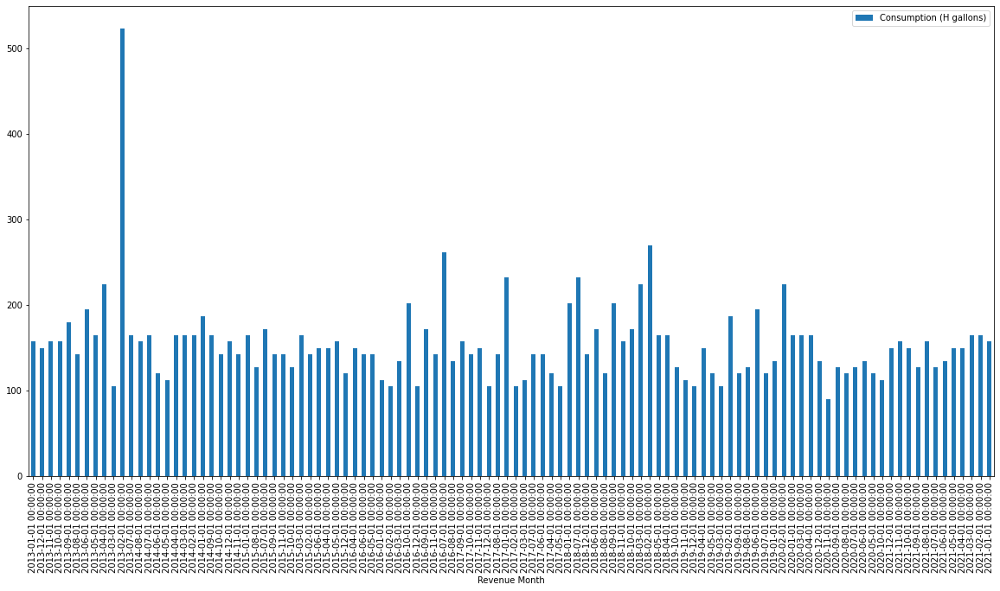

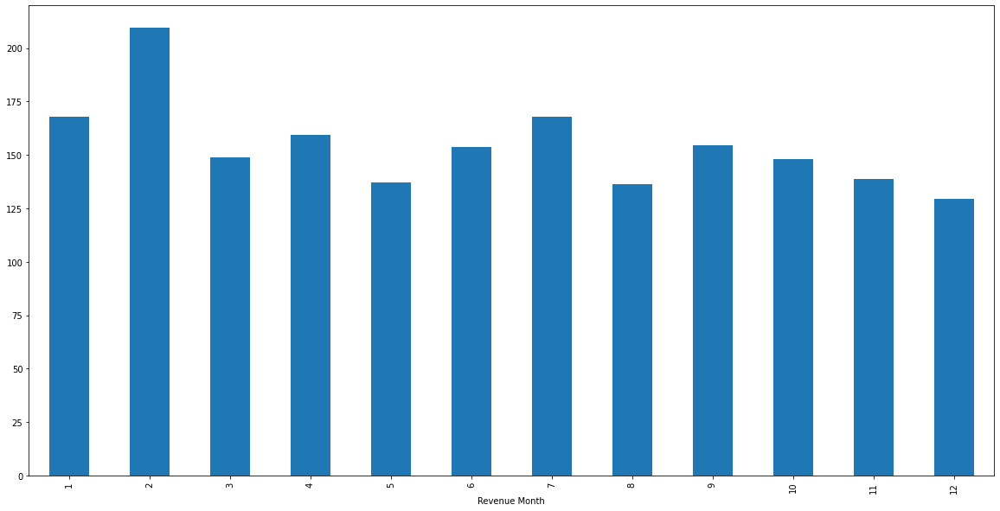

For Current Charges: 


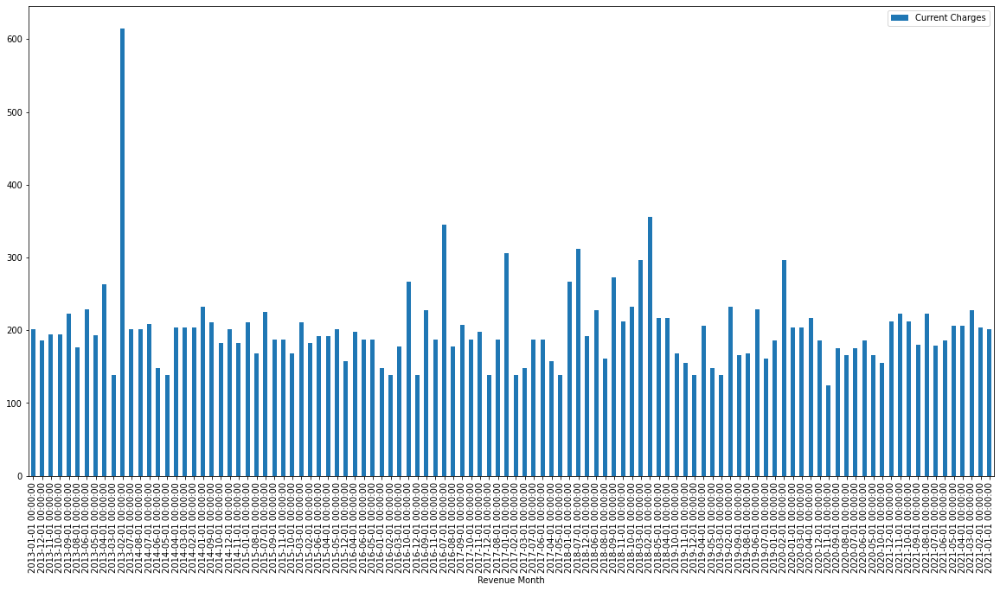

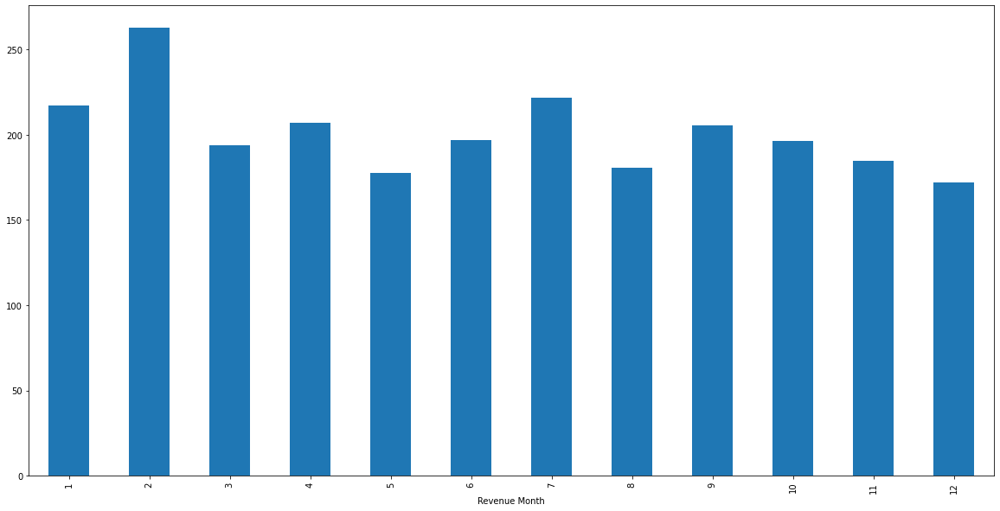

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20453240
For Consumption: 


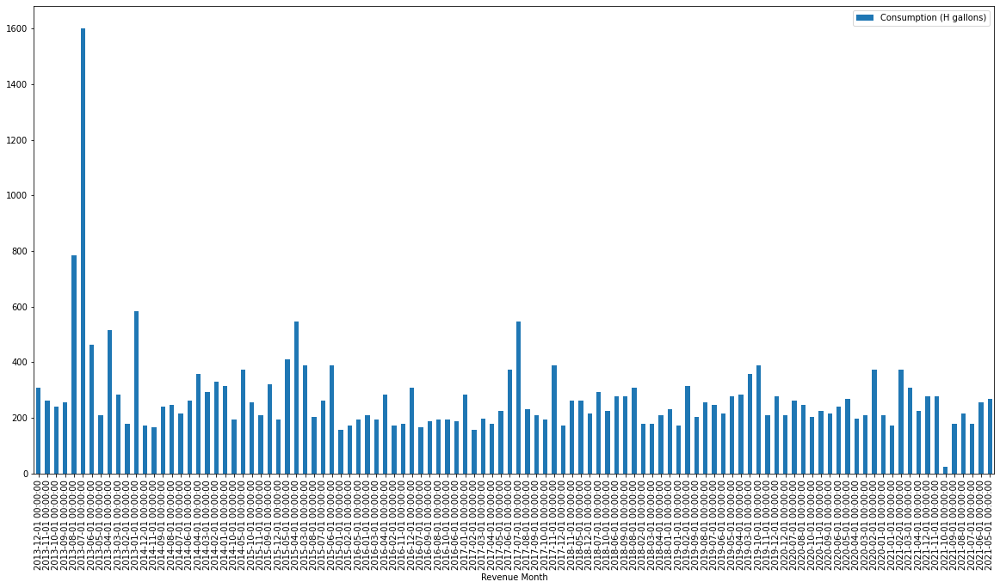

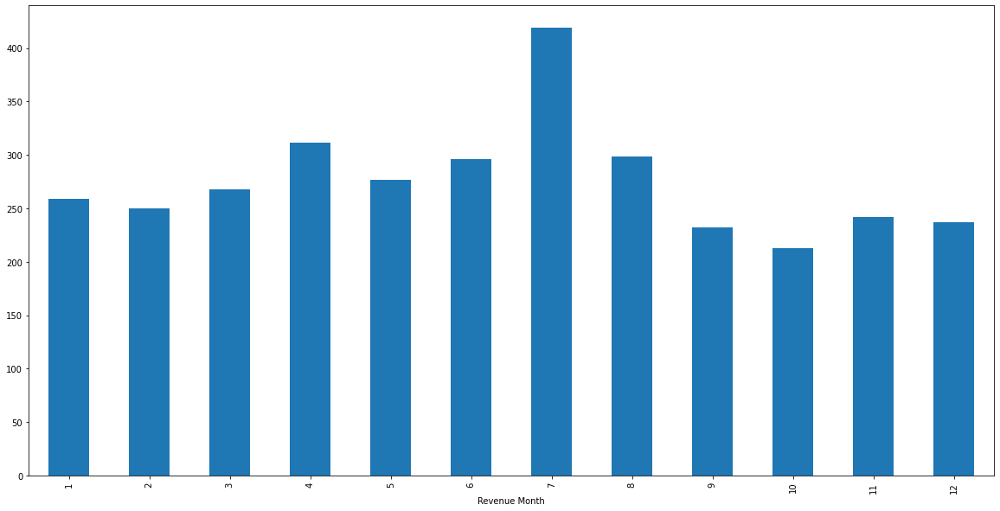

For Current Charges: 


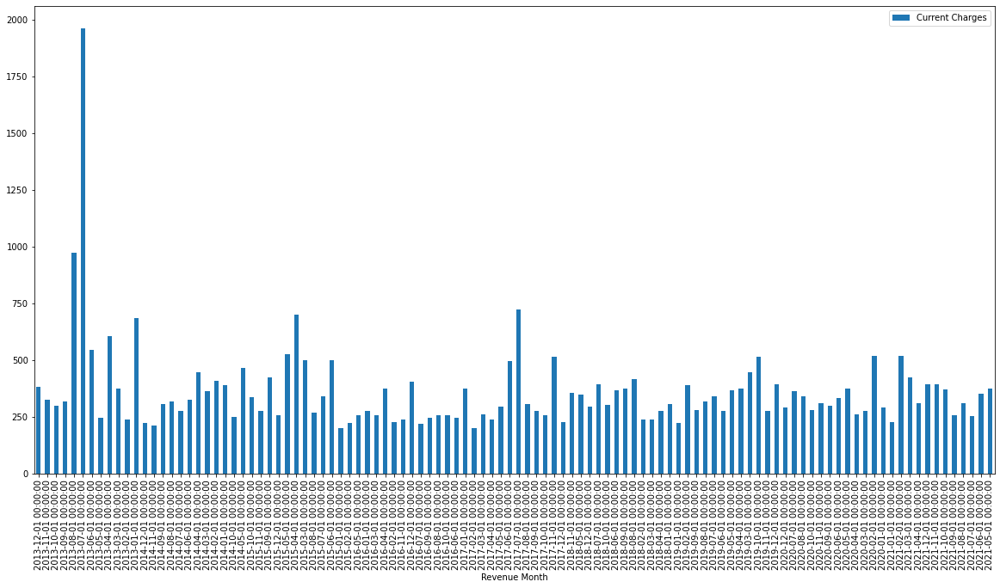

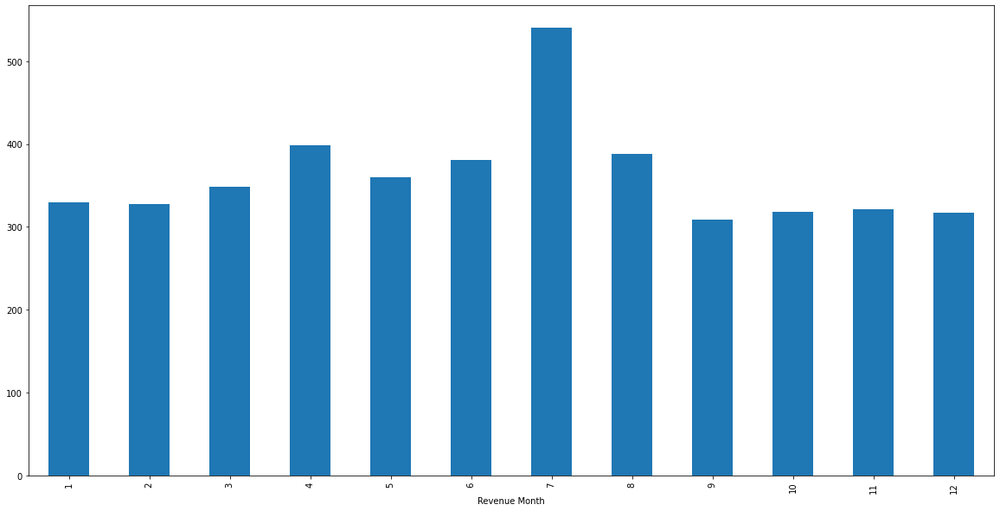

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E20527603
For Consumption: 


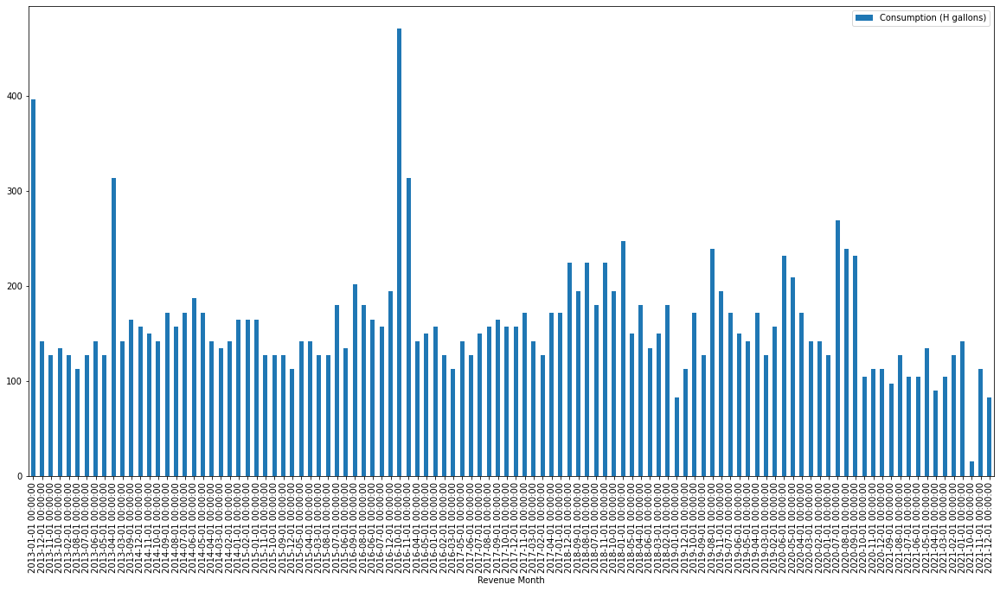

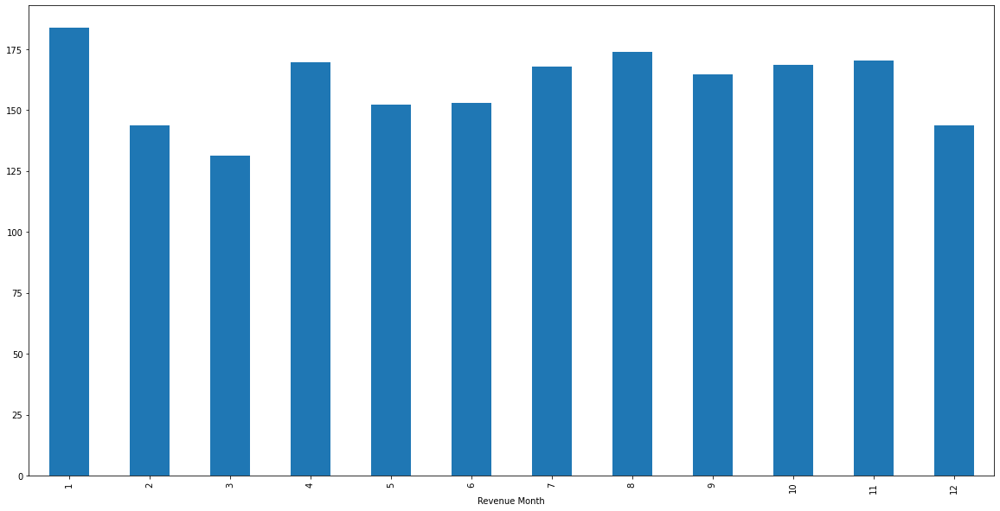

For Current Charges: 


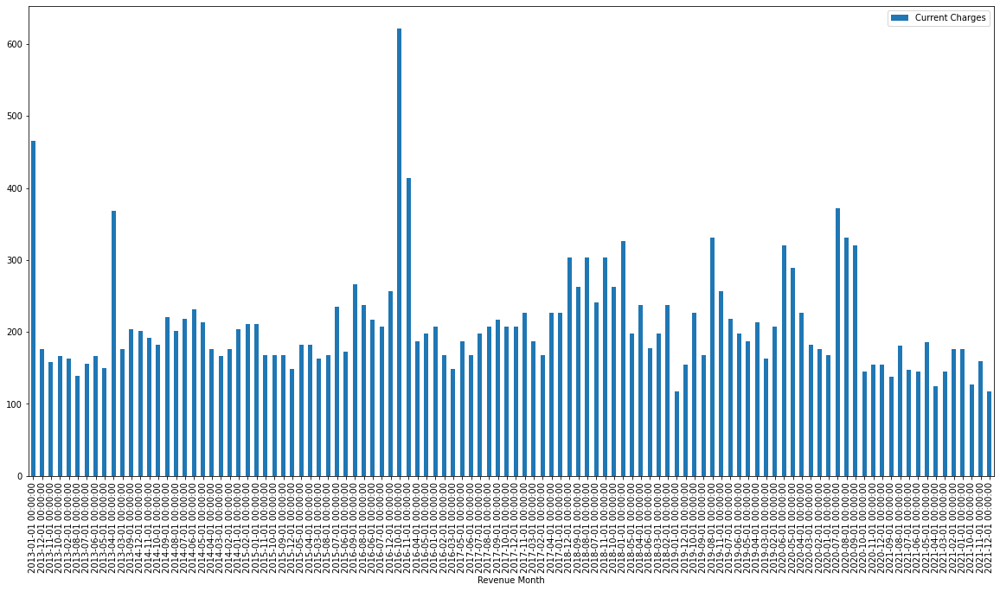

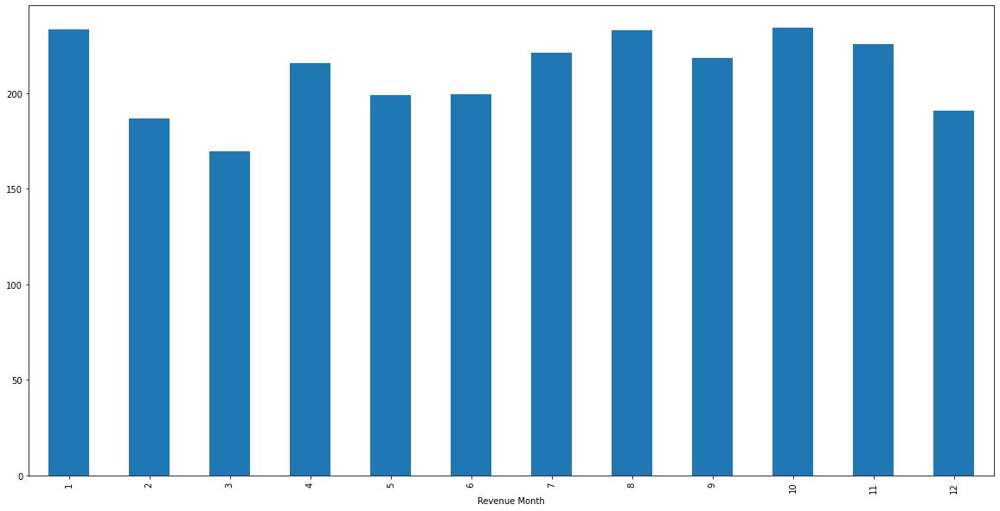

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E11310572
For Consumption: 


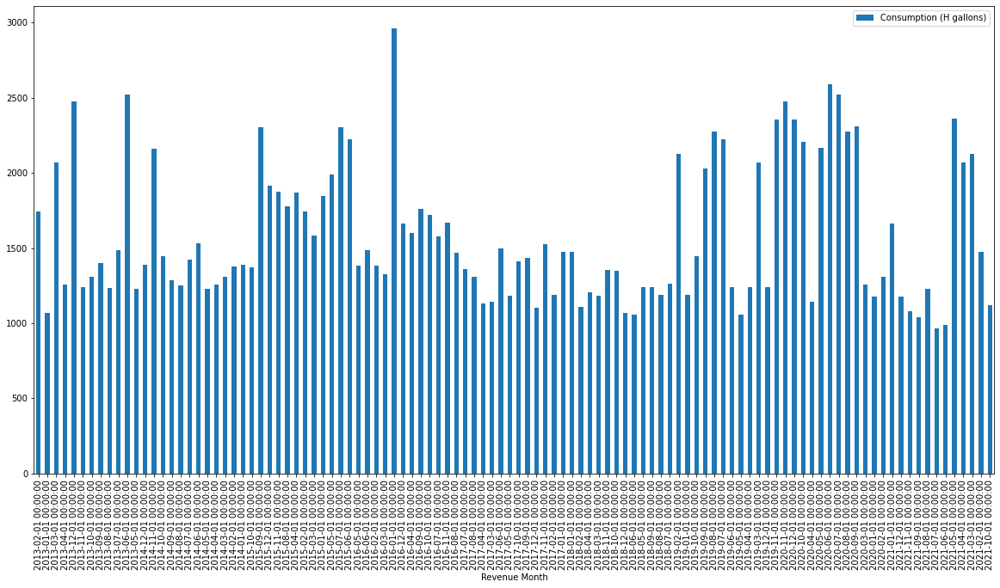

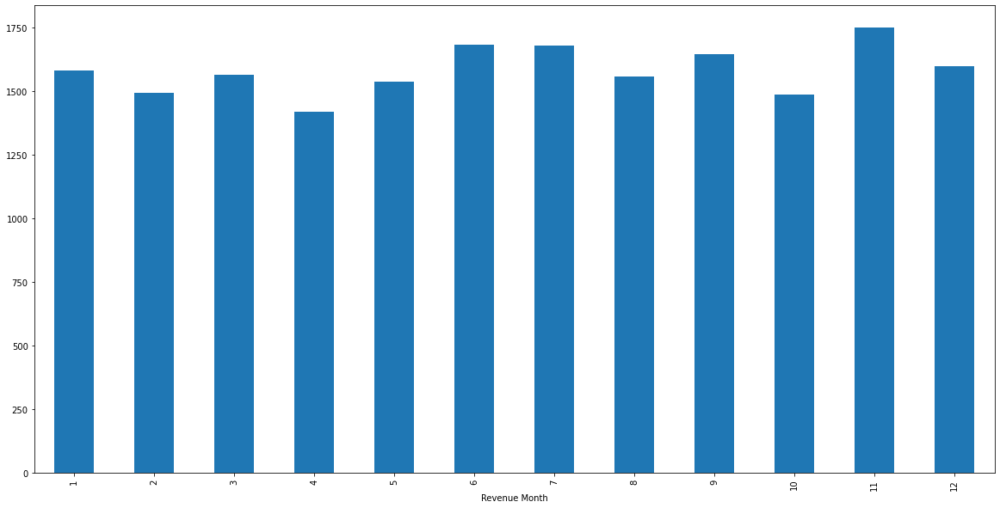

For Current Charges: 


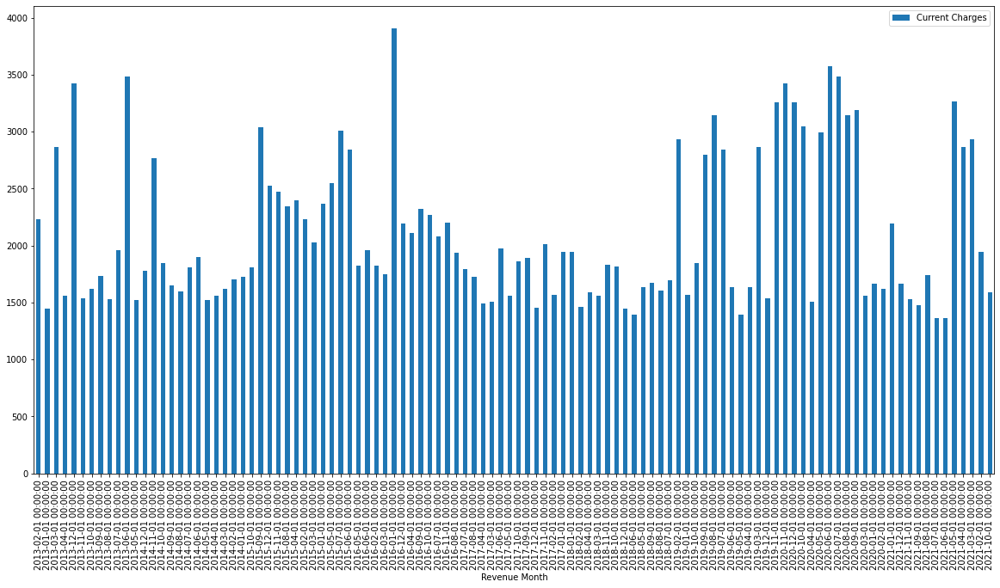

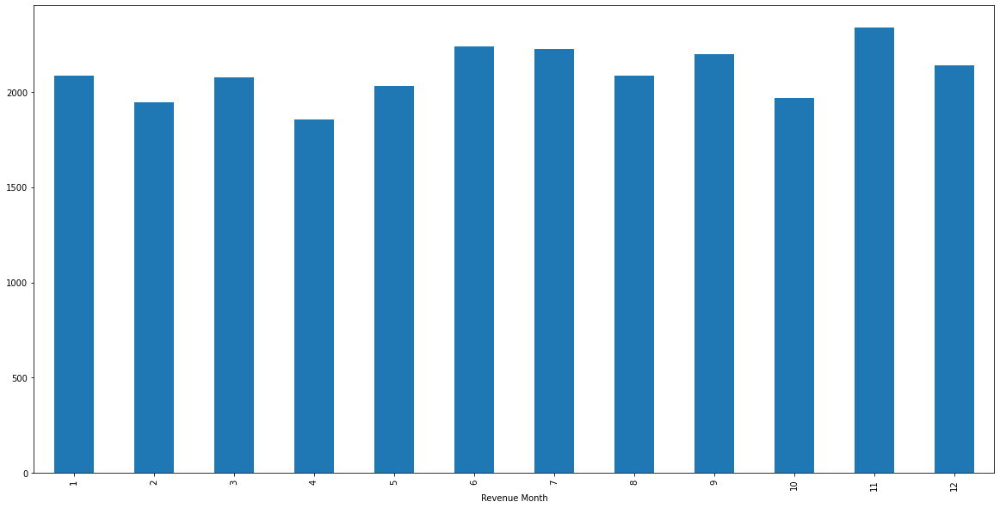

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  N31904087
For Consumption: 


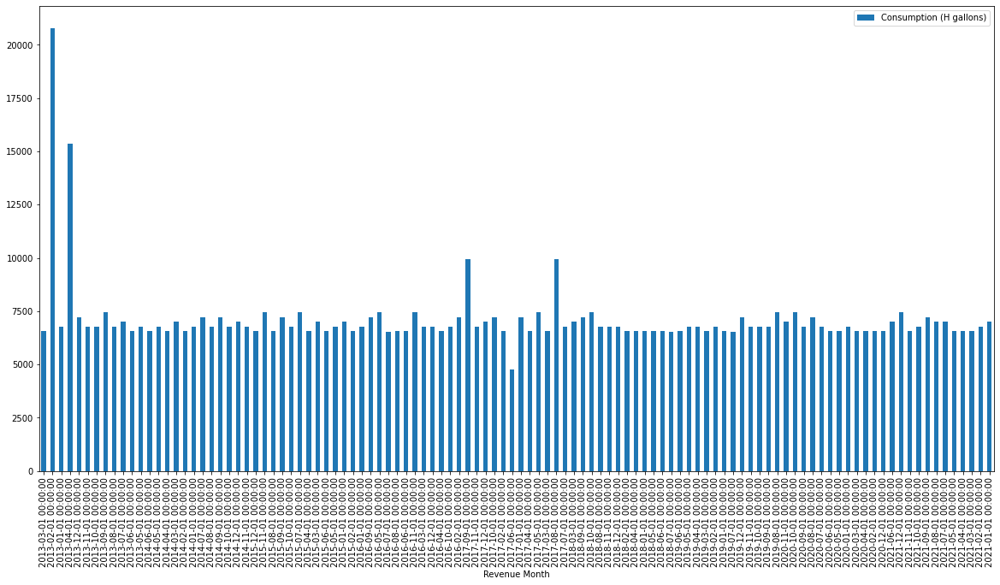

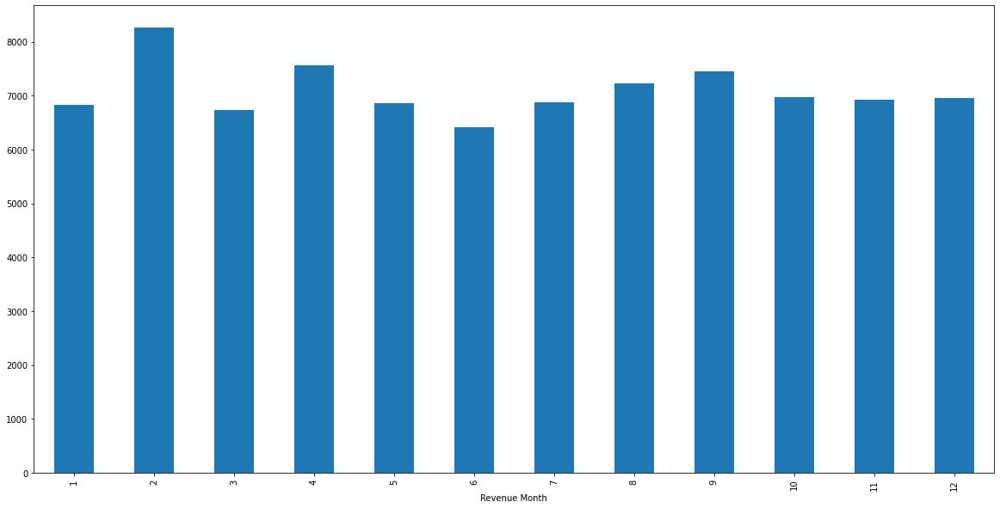

For Current Charges: 


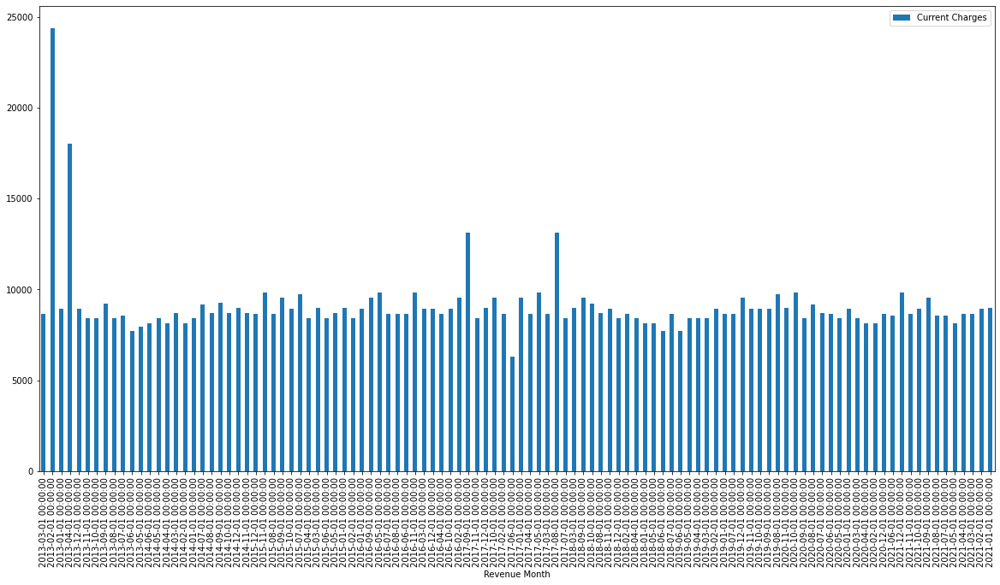

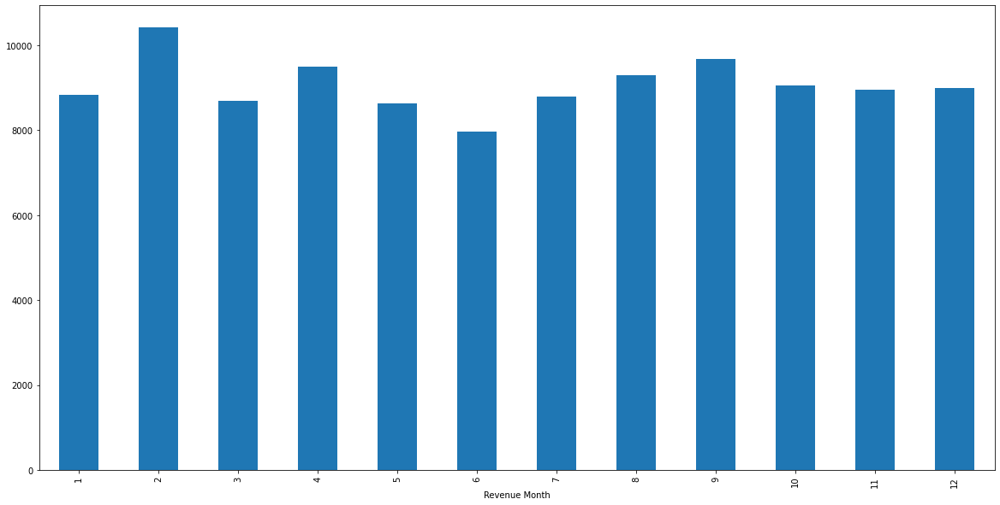

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  O78590128
For Consumption: 


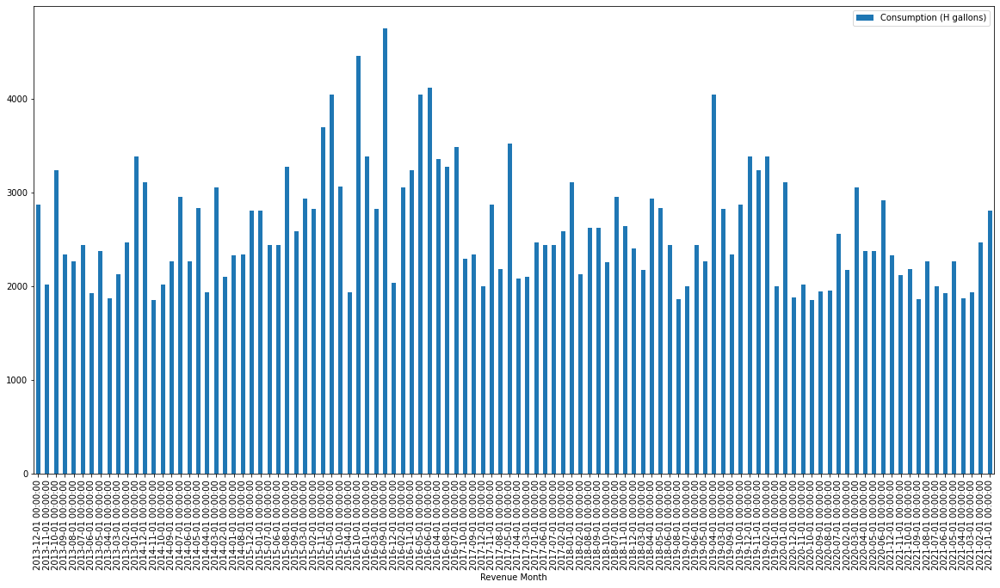

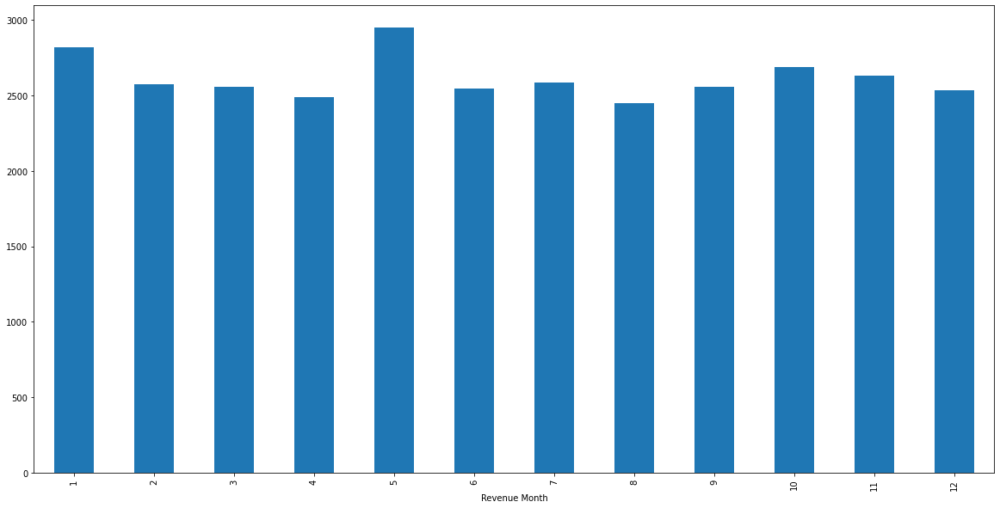

For Current Charges: 


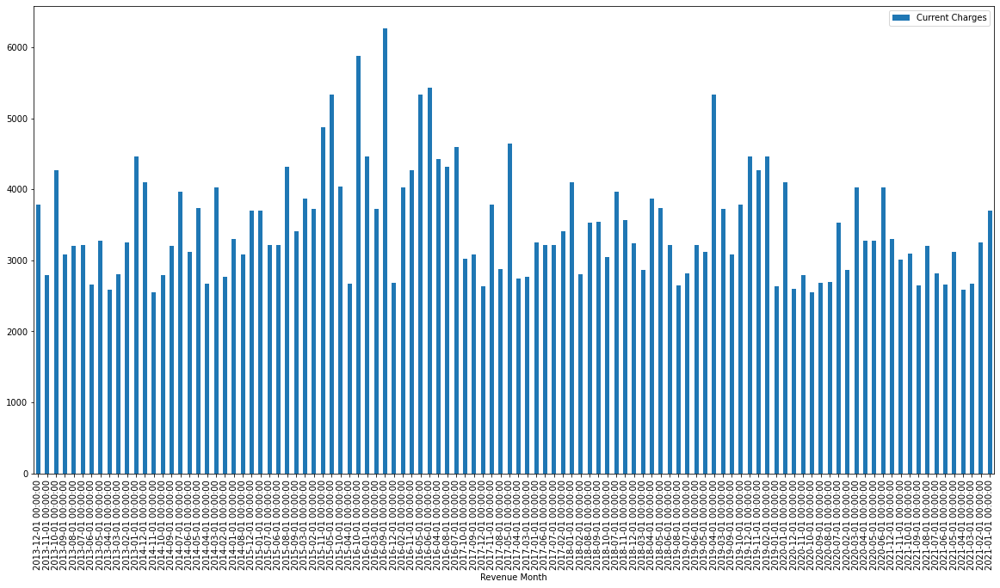

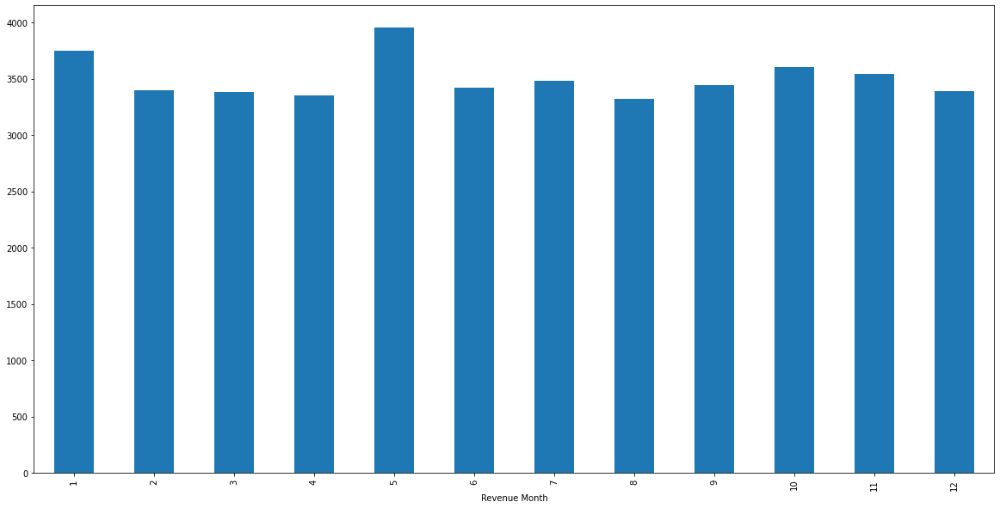

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K16805260
For Consumption: 


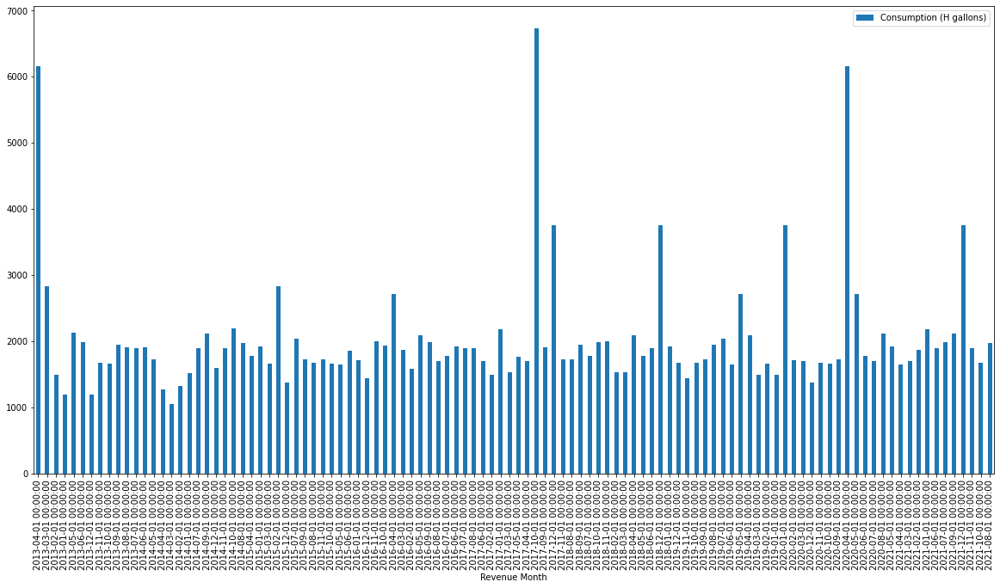

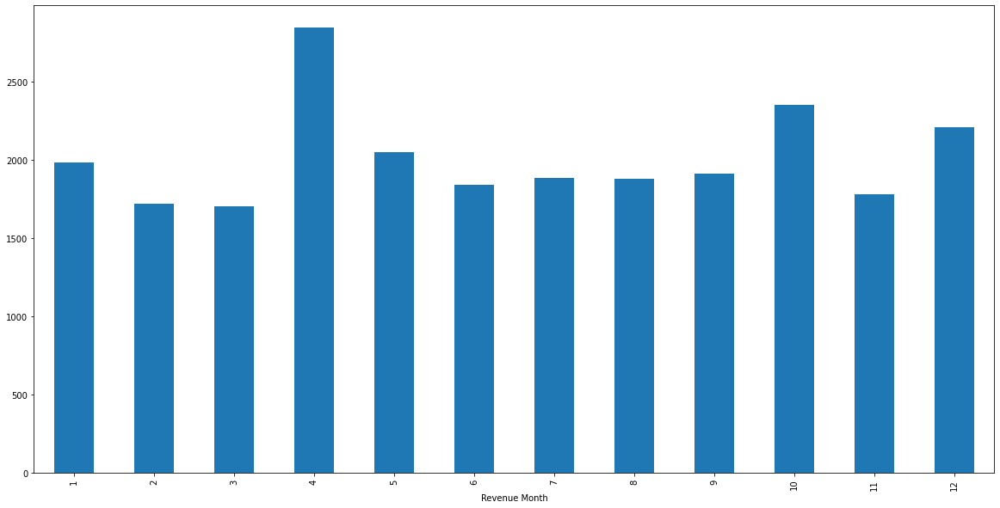

For Current Charges: 


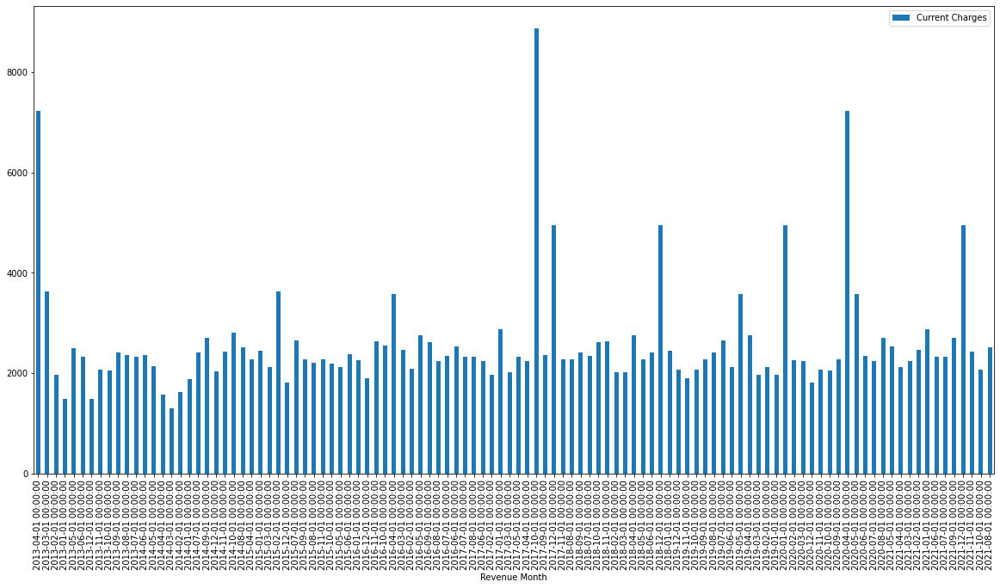

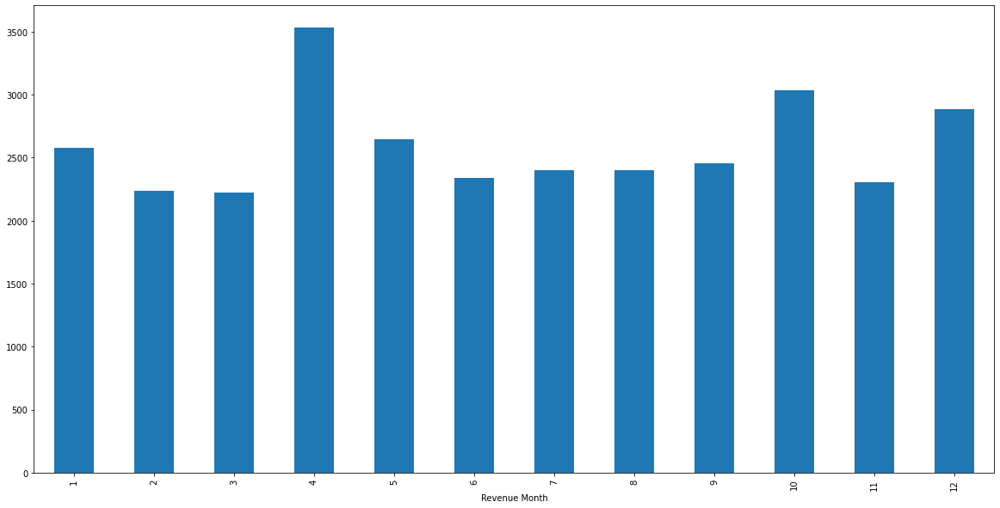

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  O78777952
For Consumption: 


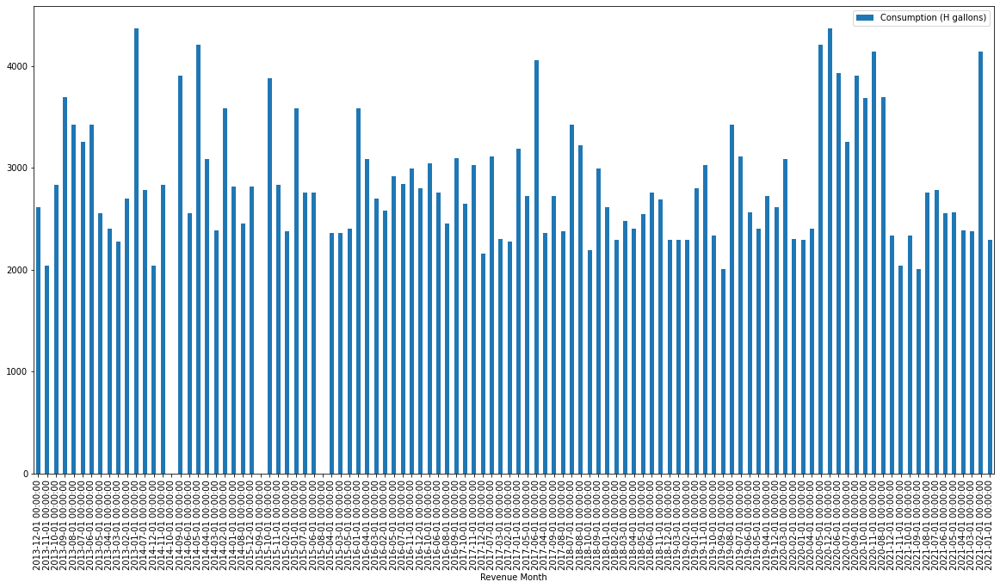

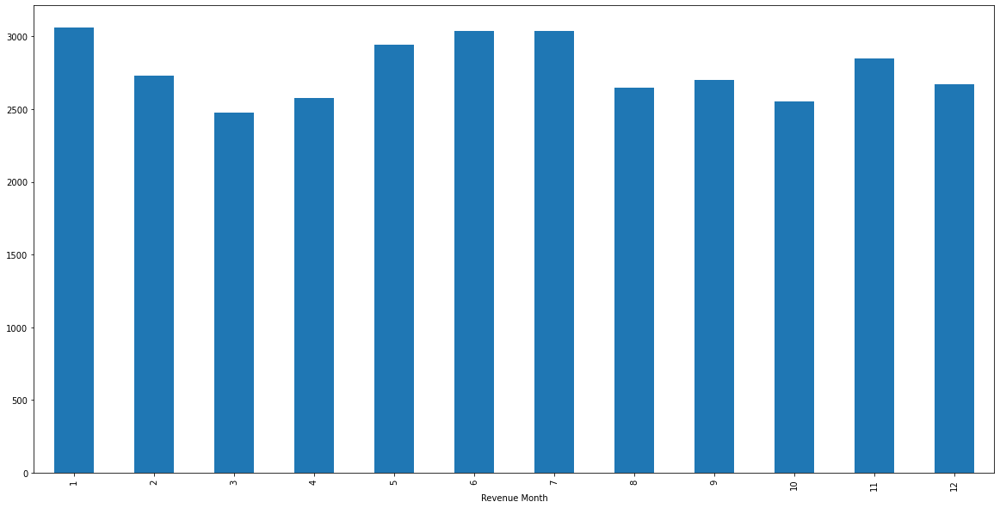

For Current Charges: 


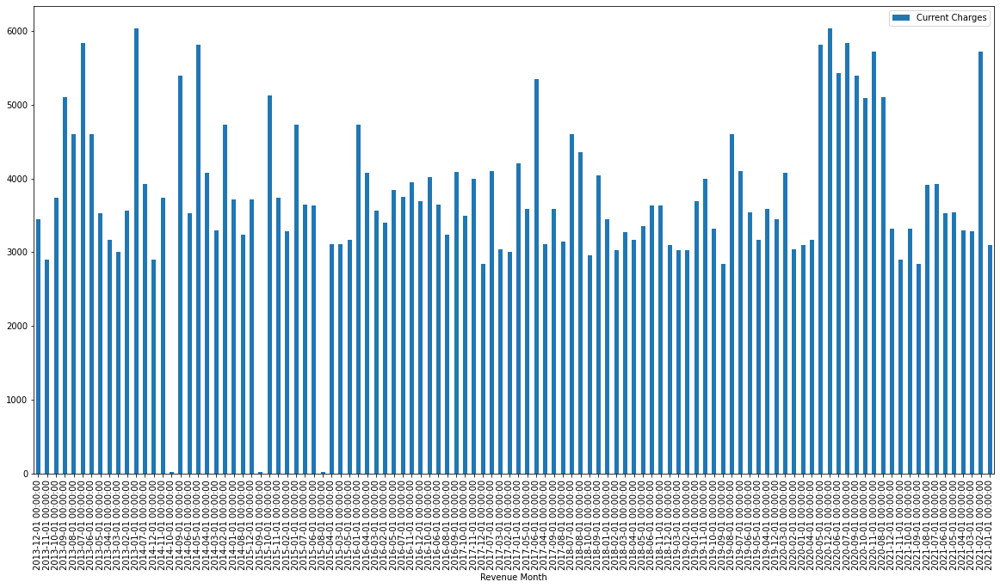

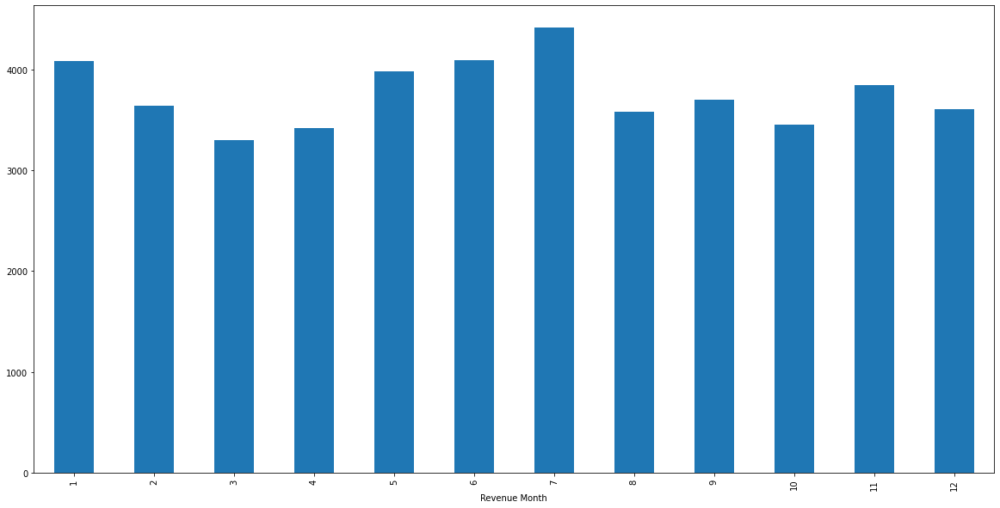

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E19234608
For Consumption: 


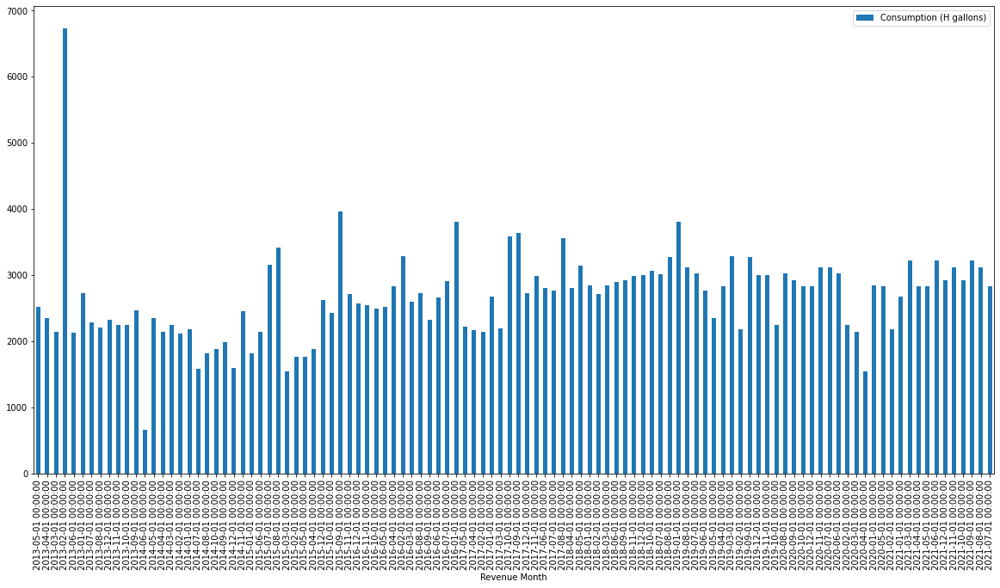

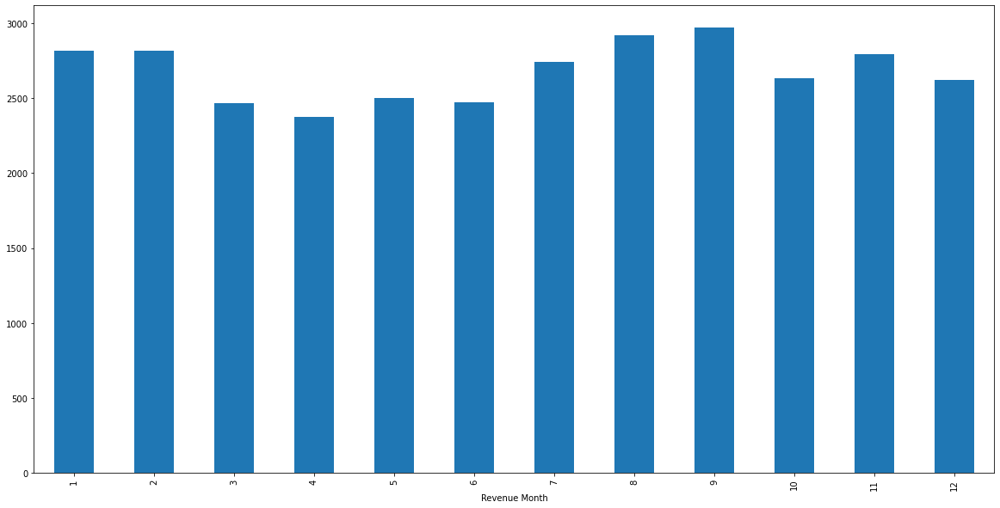

For Current Charges: 


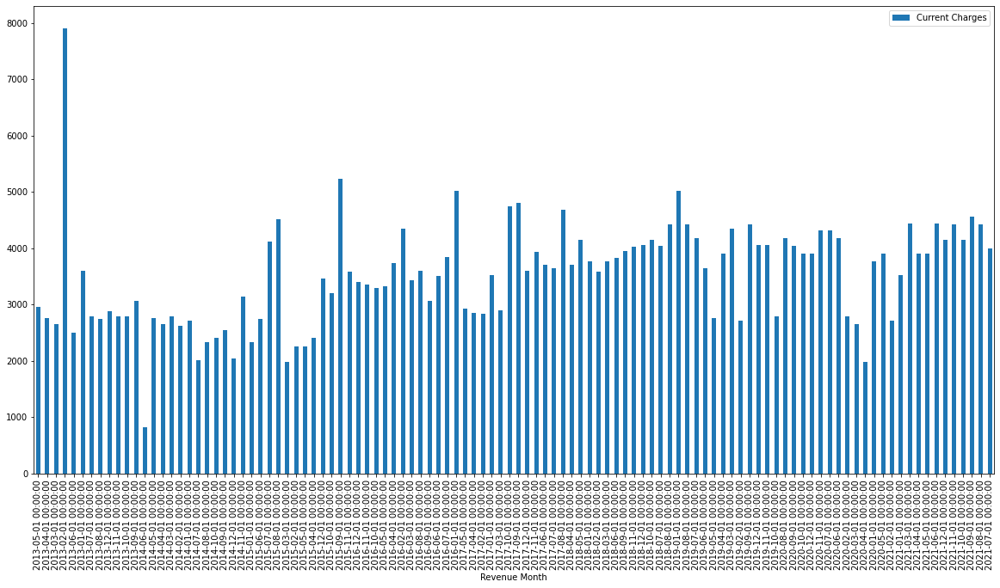

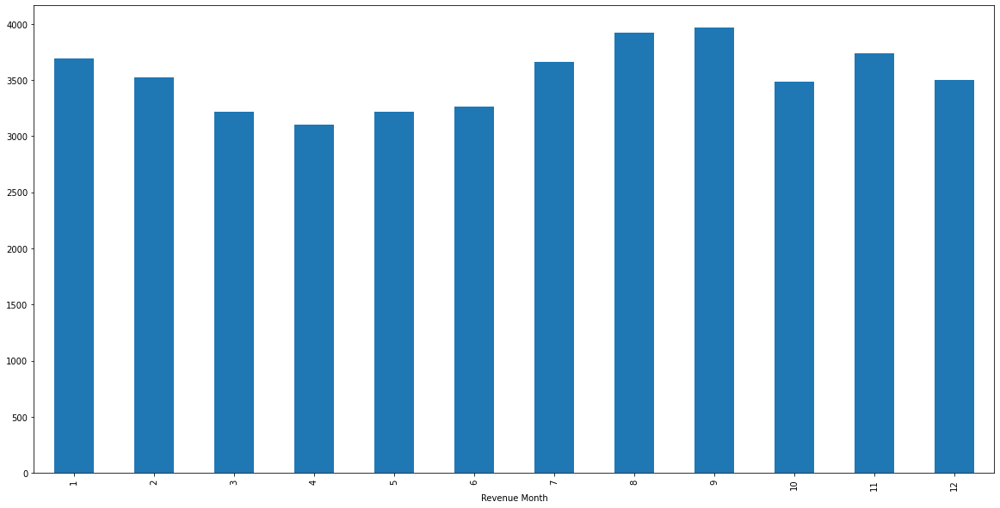

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I15002044
For Consumption: 


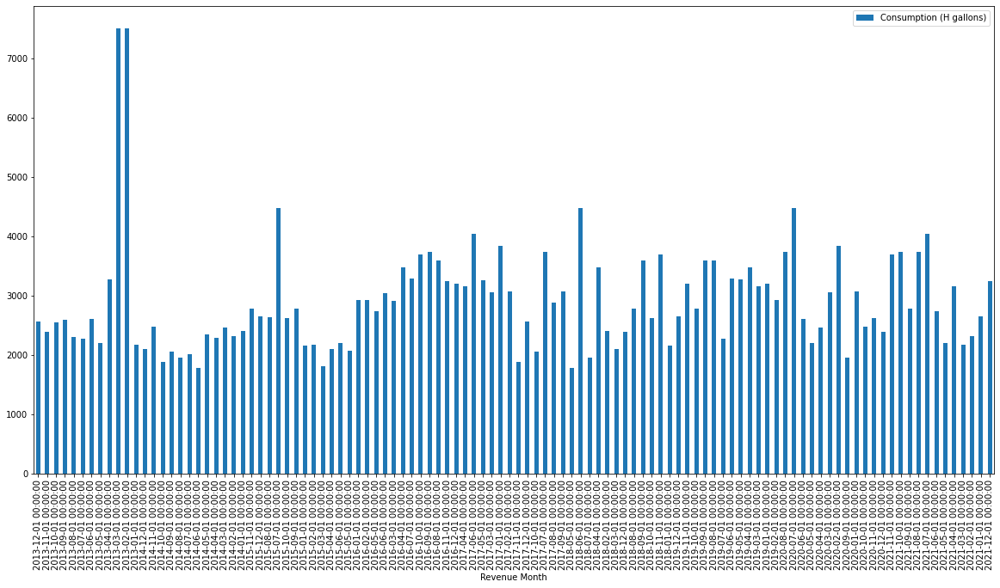

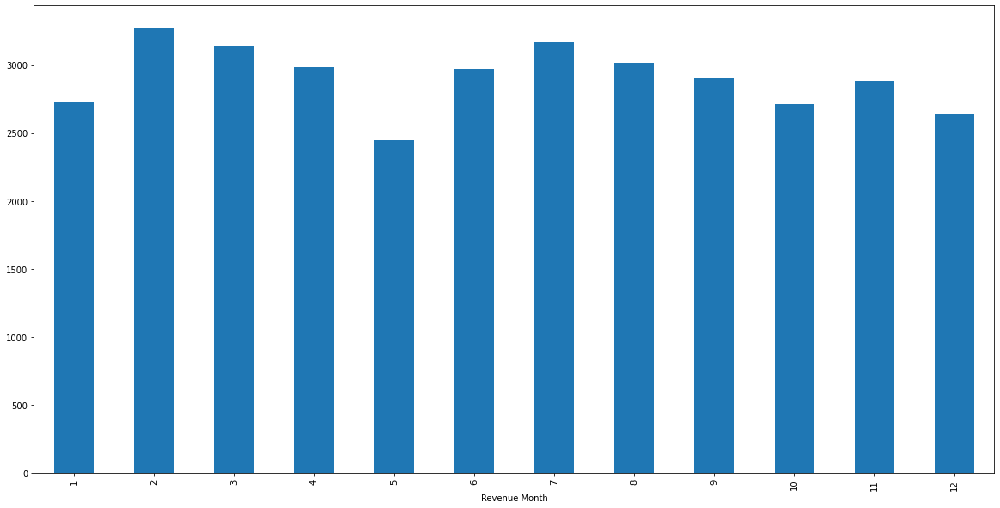

For Current Charges: 


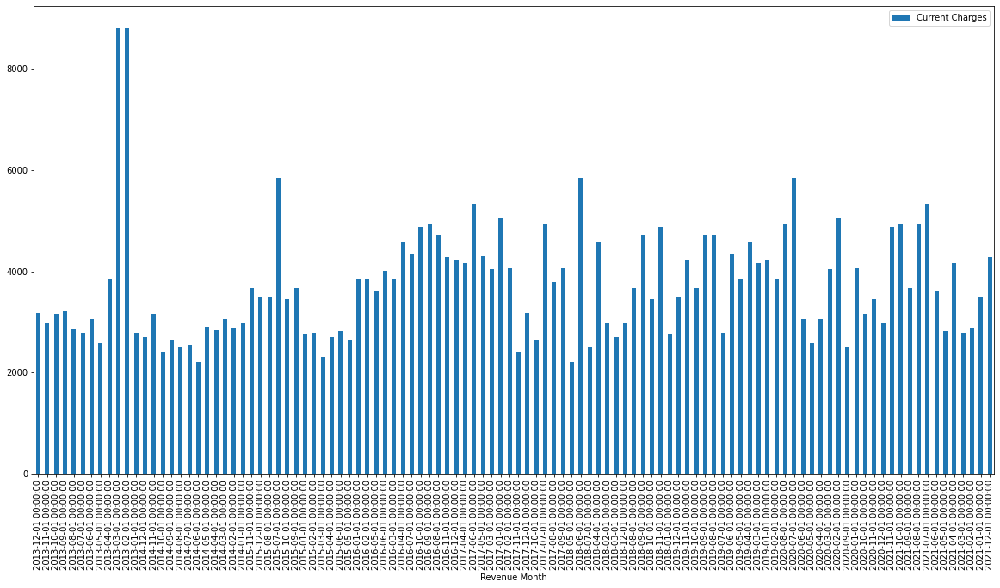

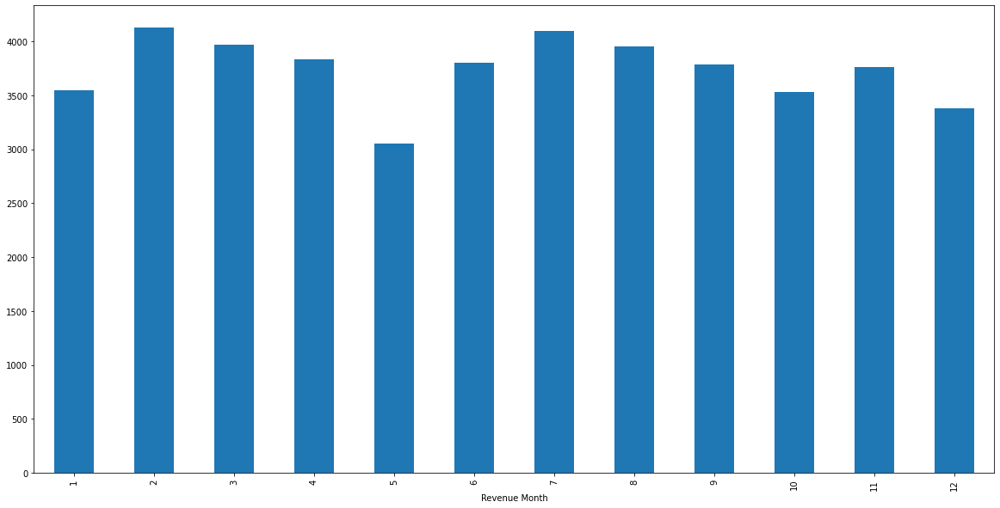

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I15002043
For Consumption: 


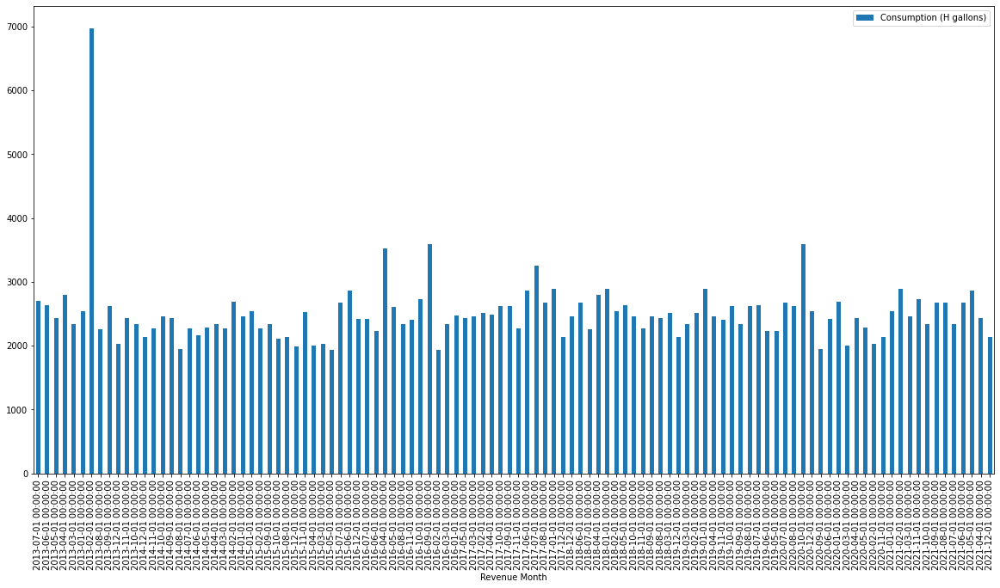

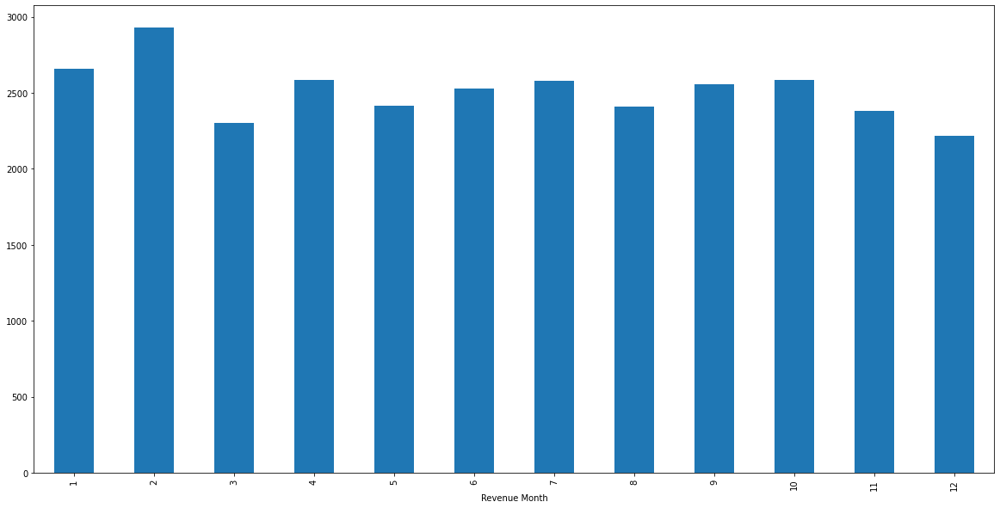

For Current Charges: 


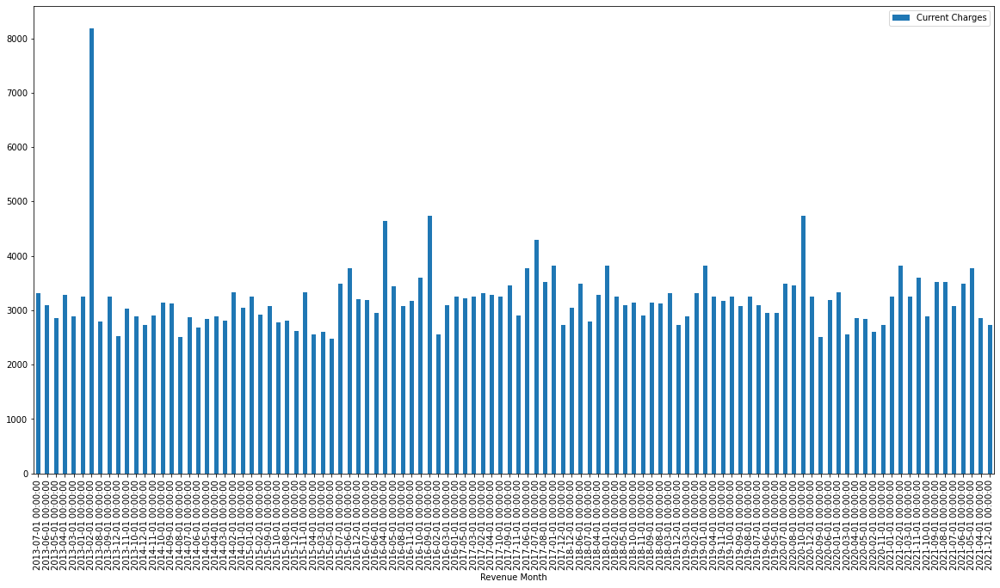

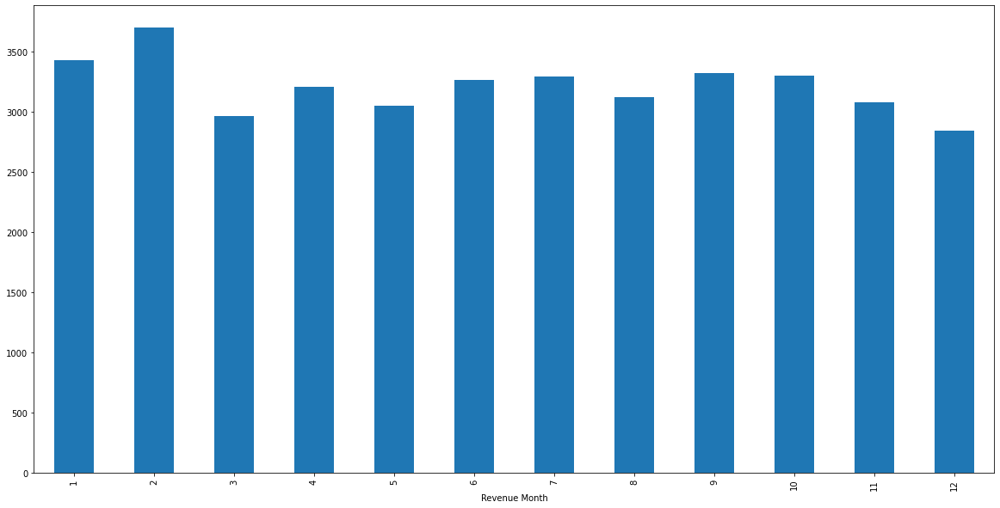

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  D60034850
For Consumption: 


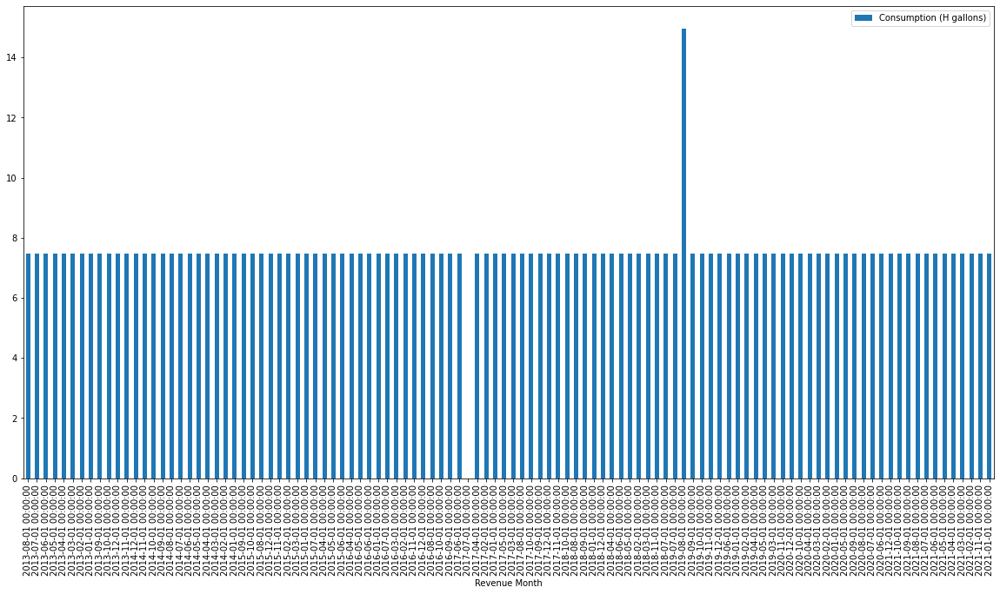

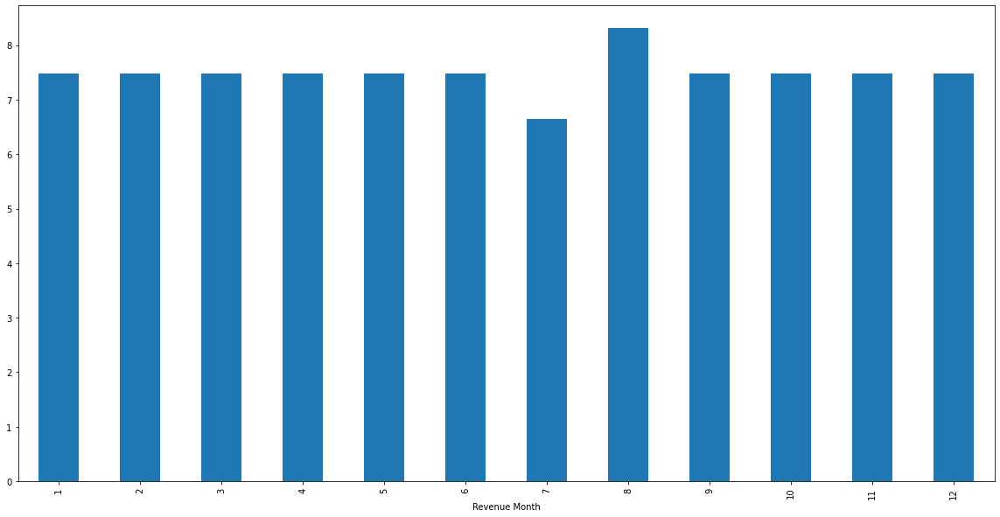

For Current Charges: 


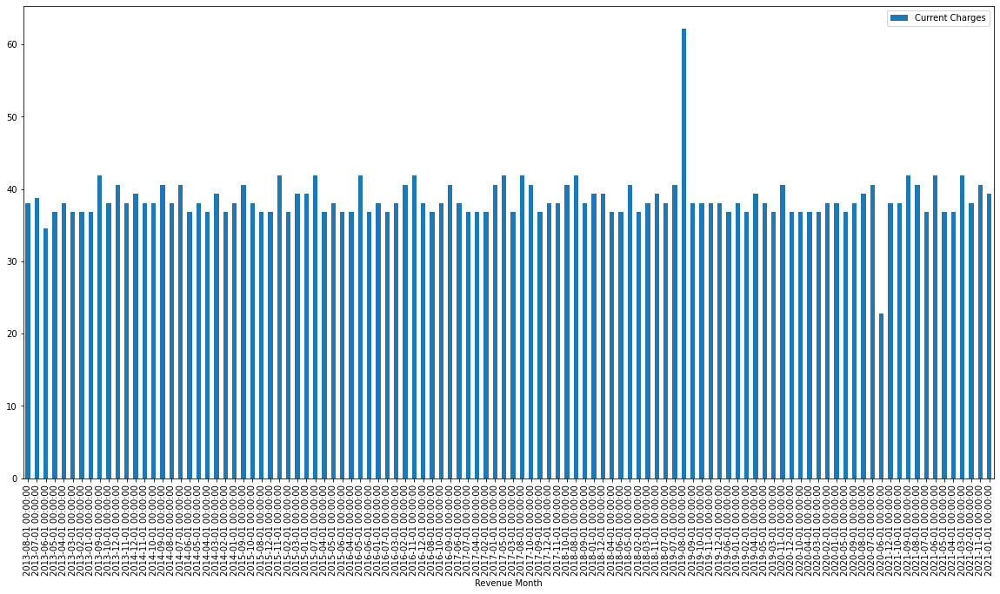

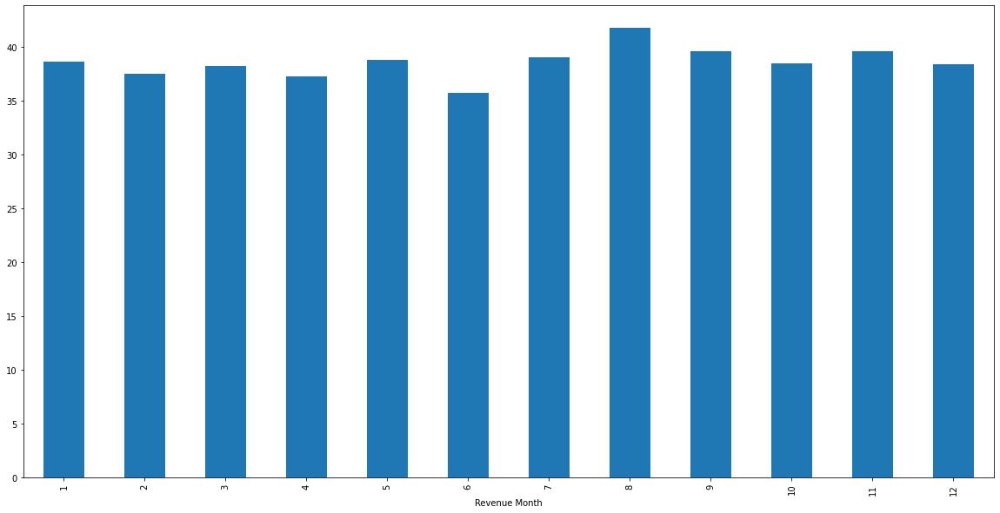

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E14262604
For Consumption: 


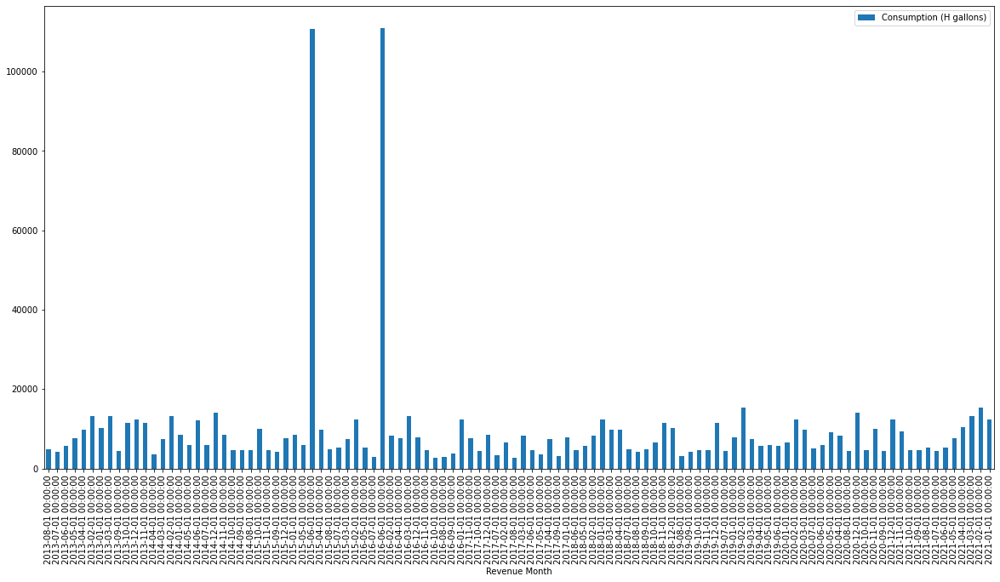

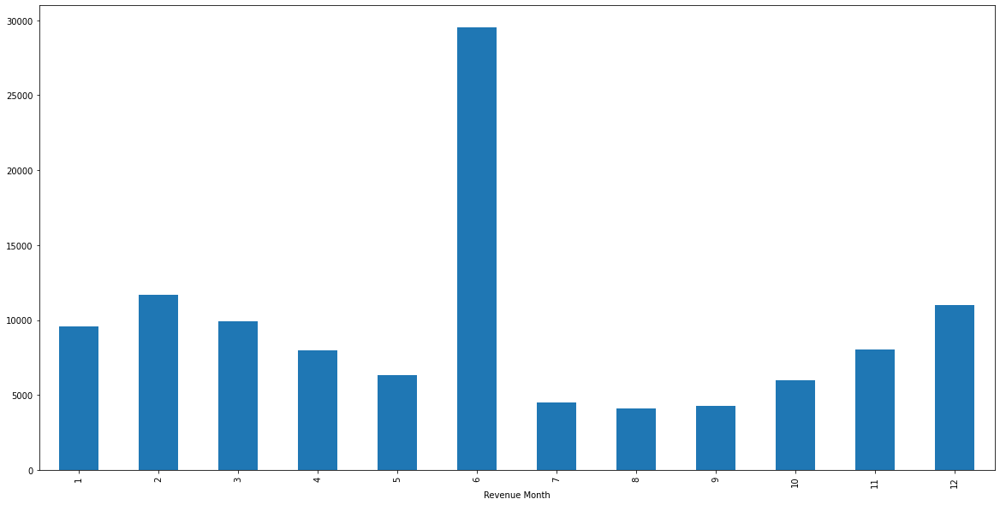

For Current Charges: 


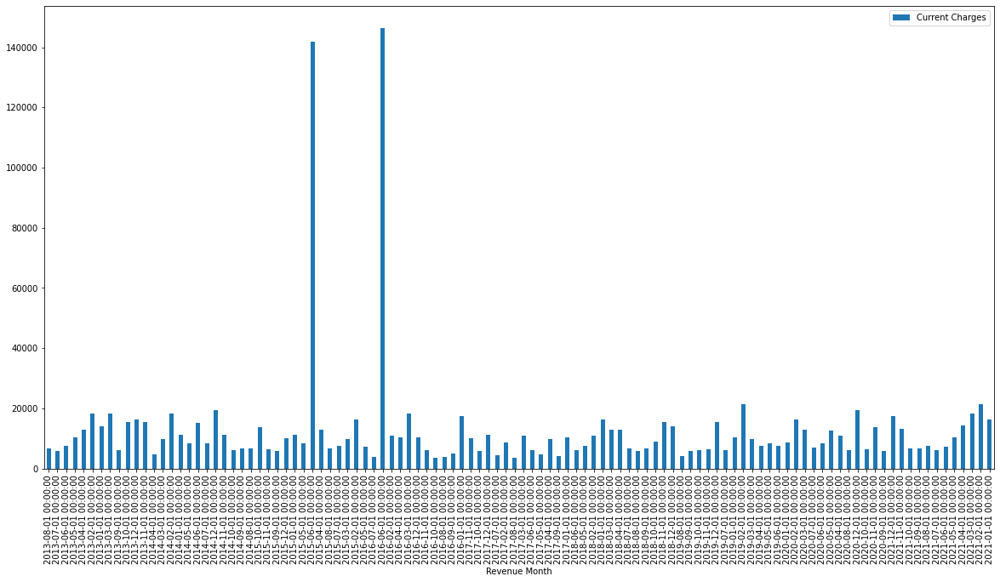

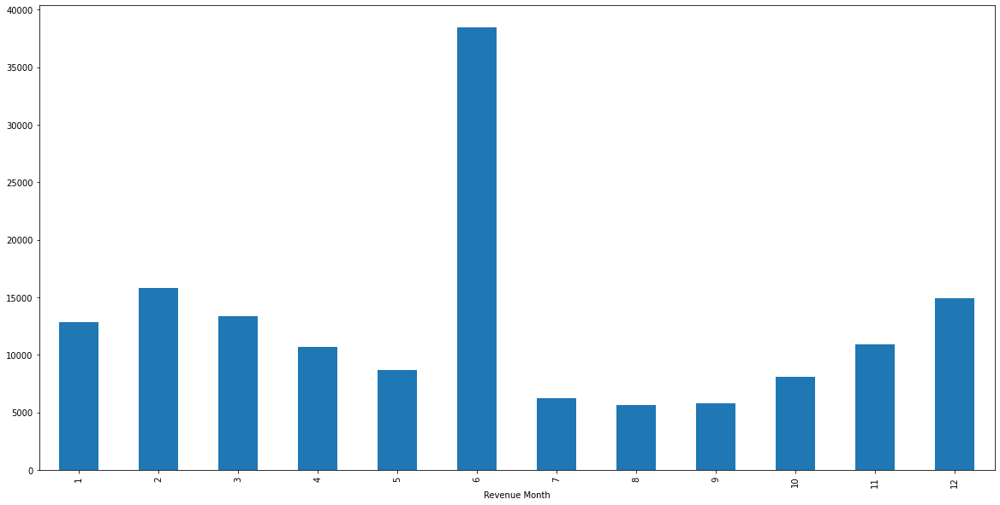

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V83028864
For Consumption: 


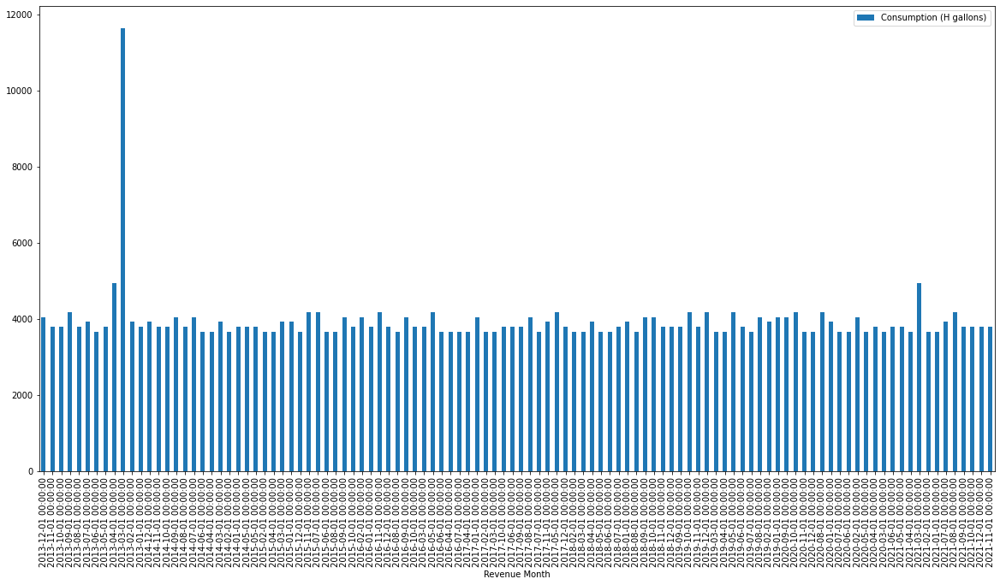

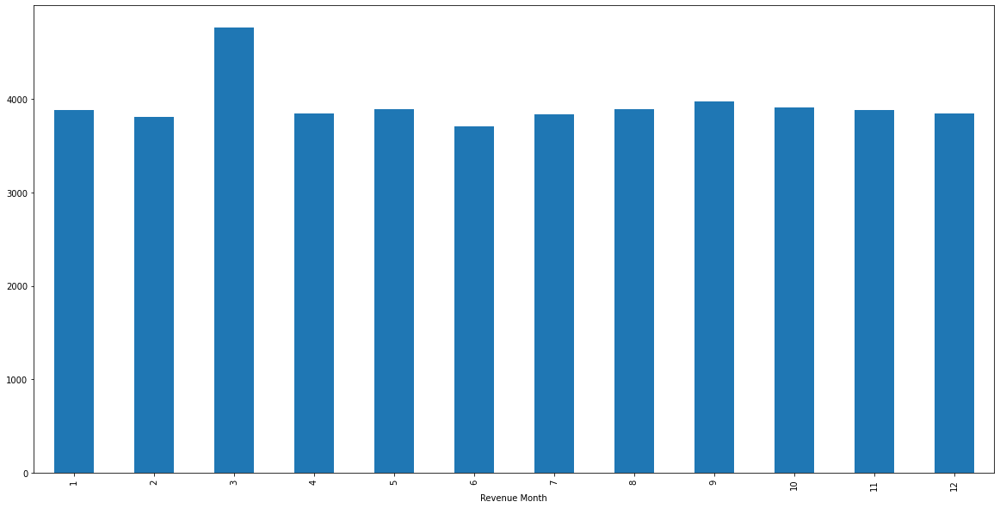

For Current Charges: 


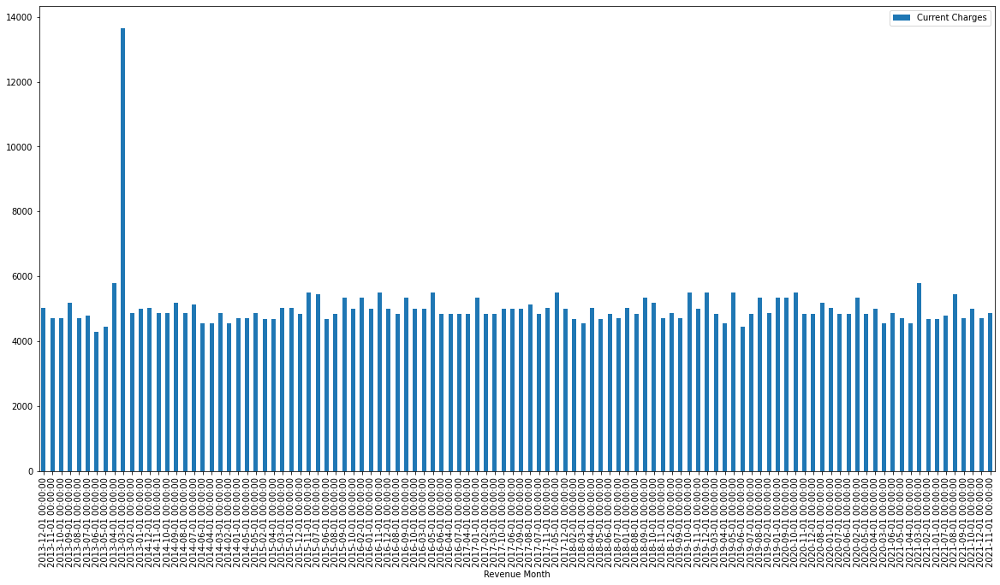

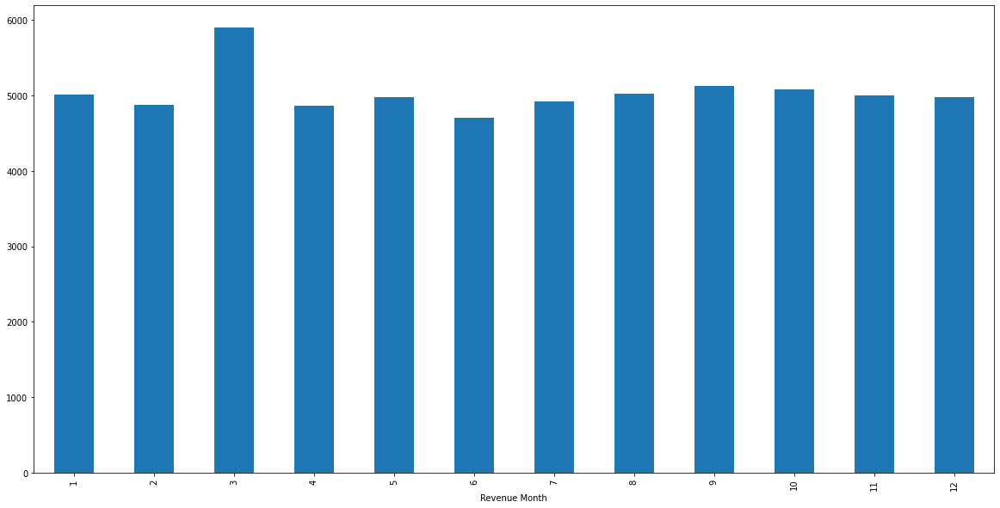

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V84010220
For Consumption: 


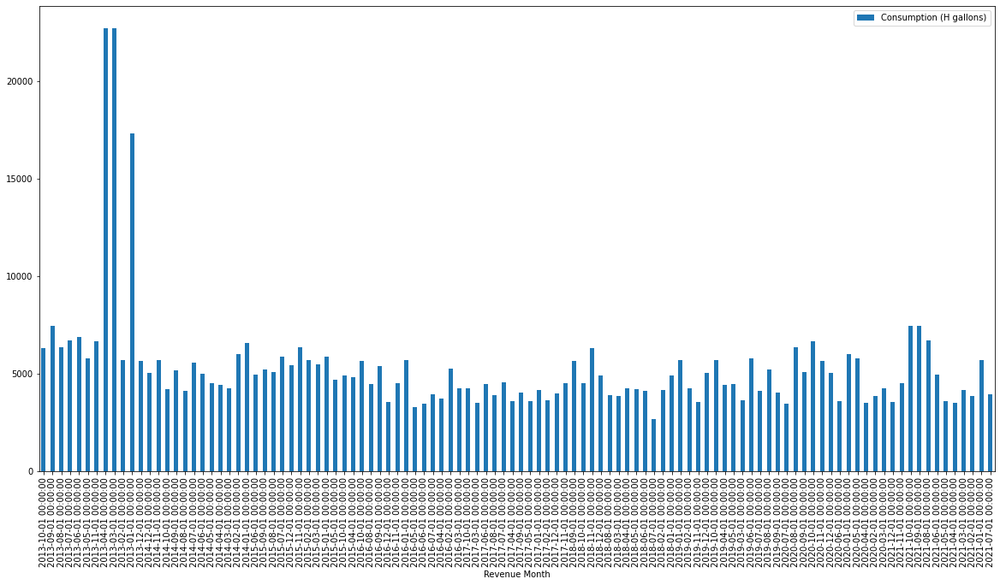

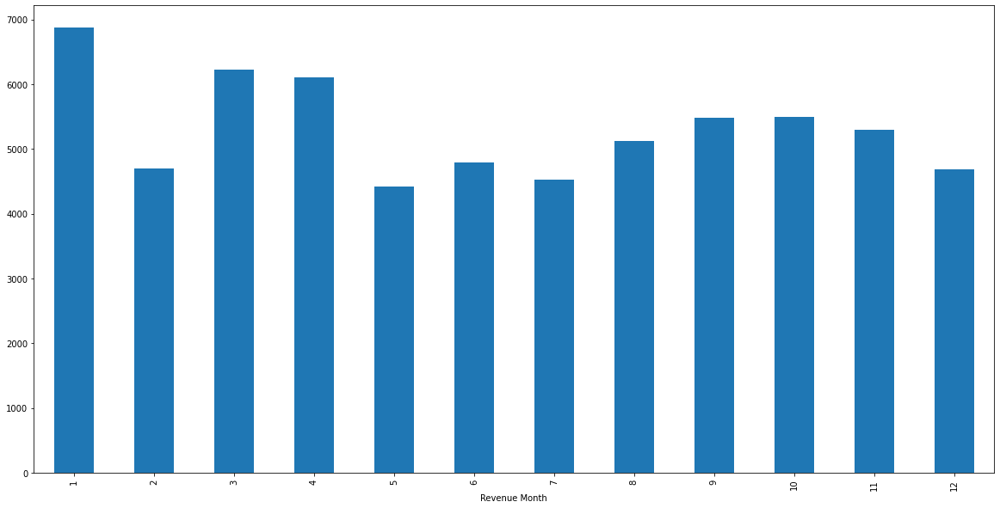

For Current Charges: 


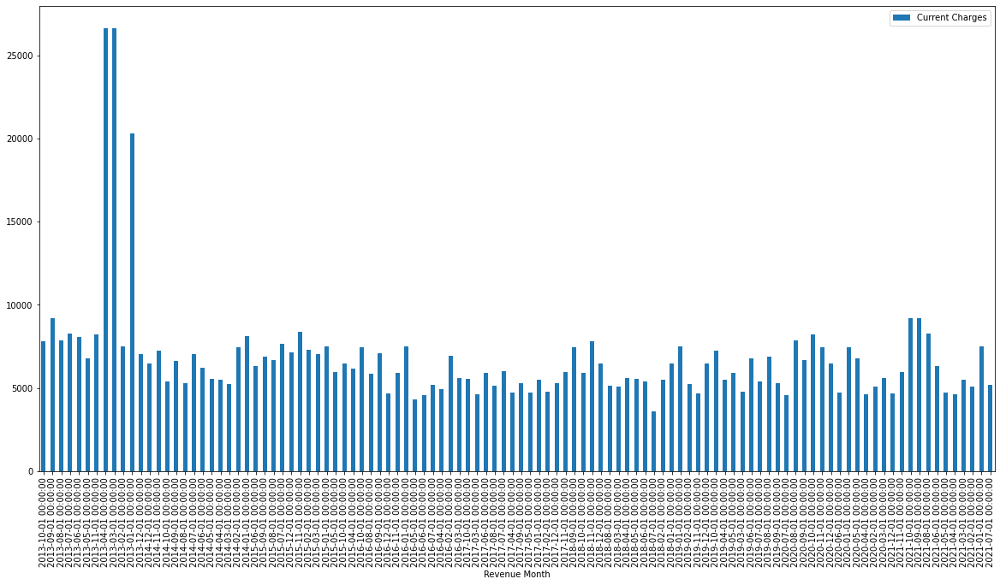

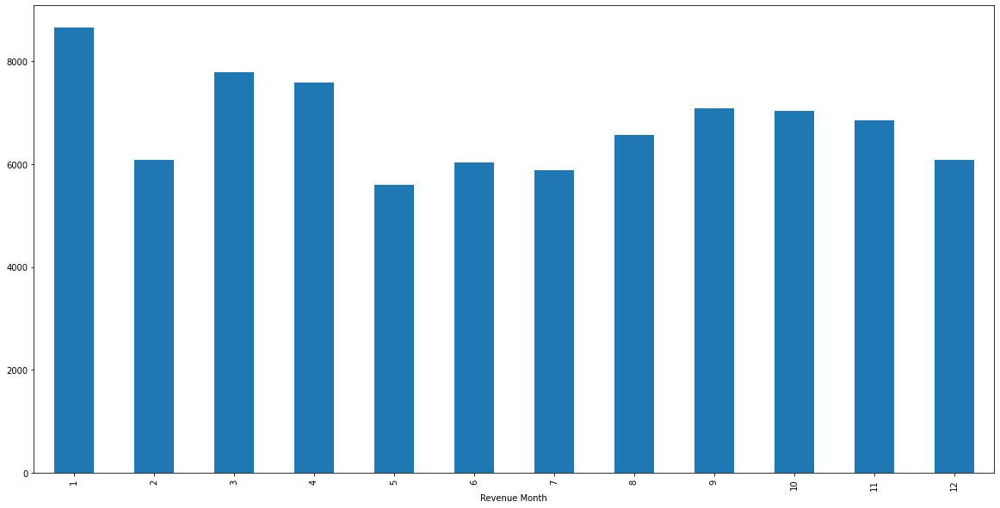

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V84003315
For Consumption: 


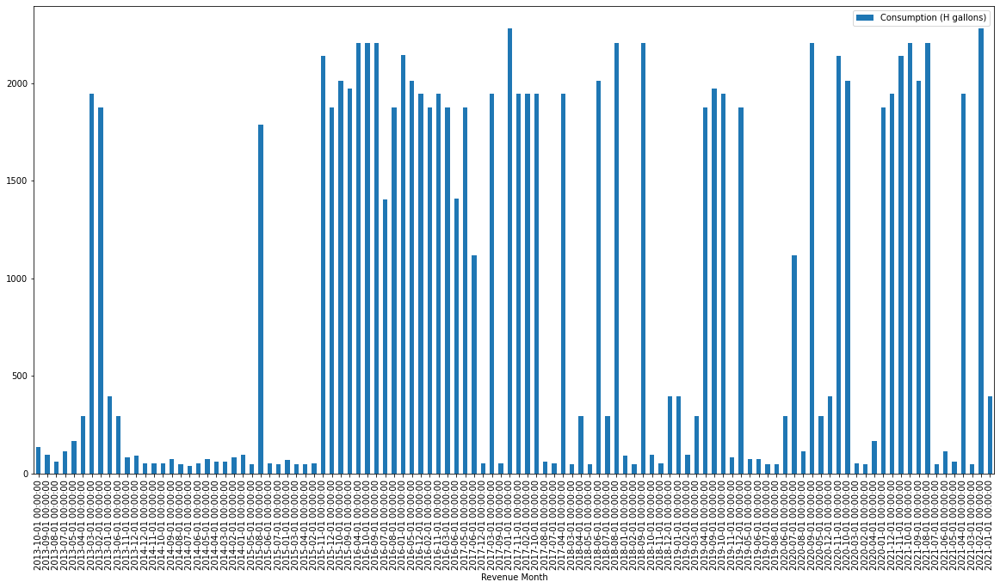

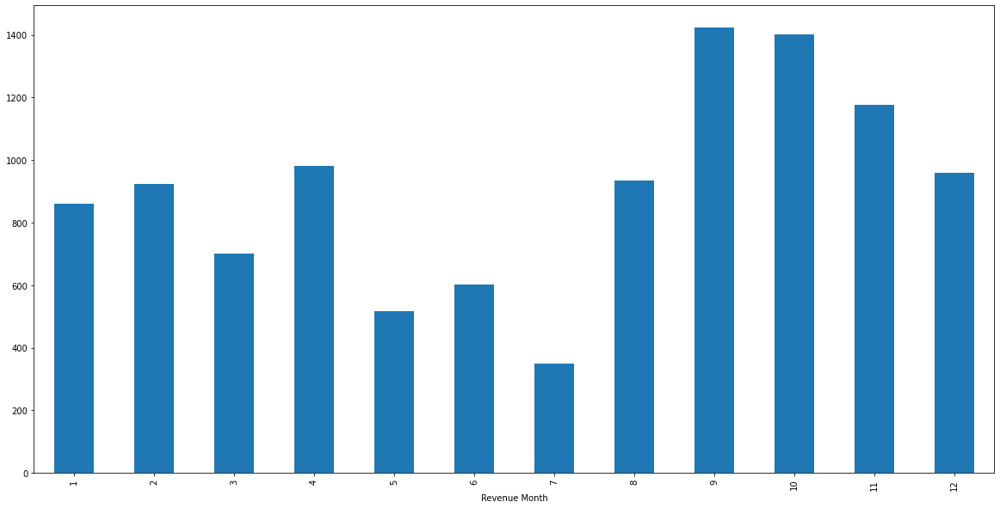

For Current Charges: 


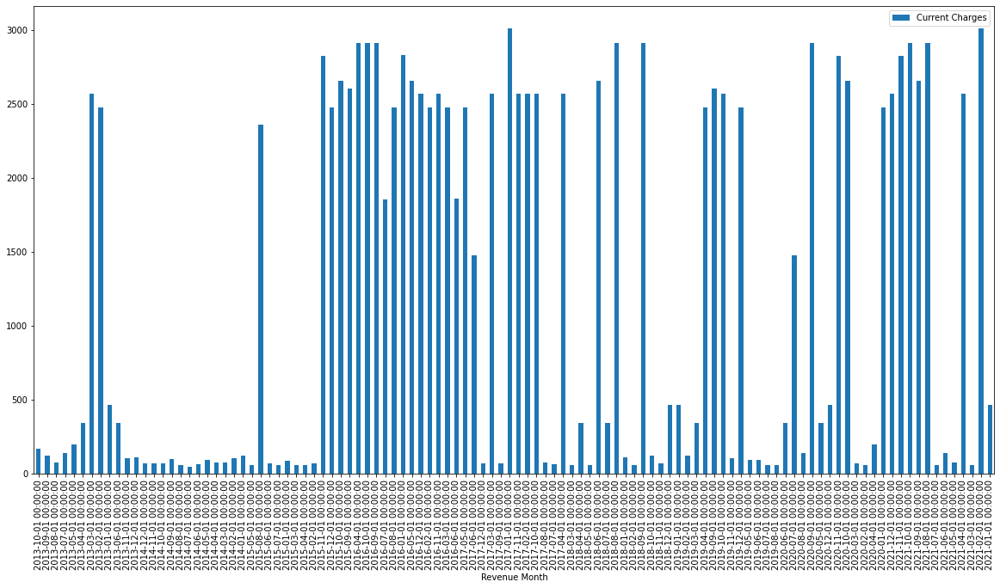

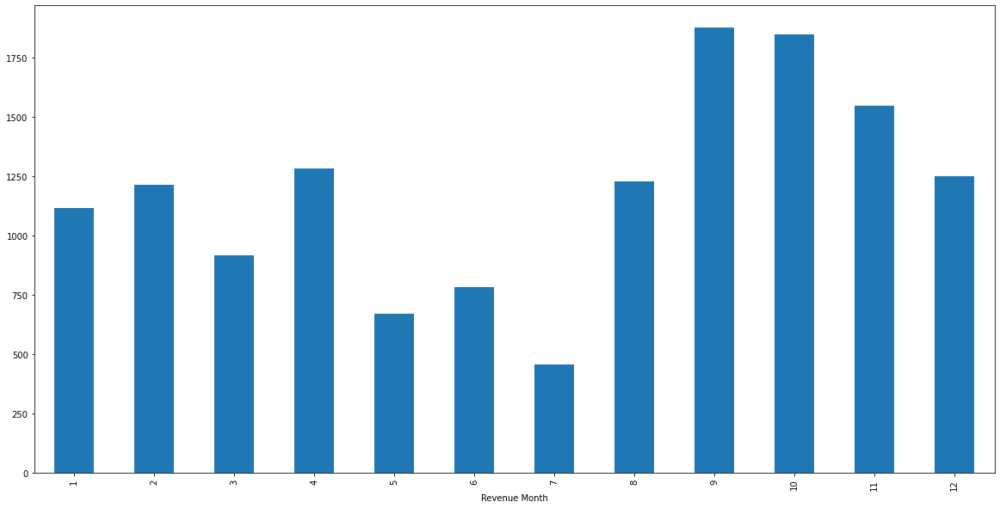

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  N84003201
For Consumption: 


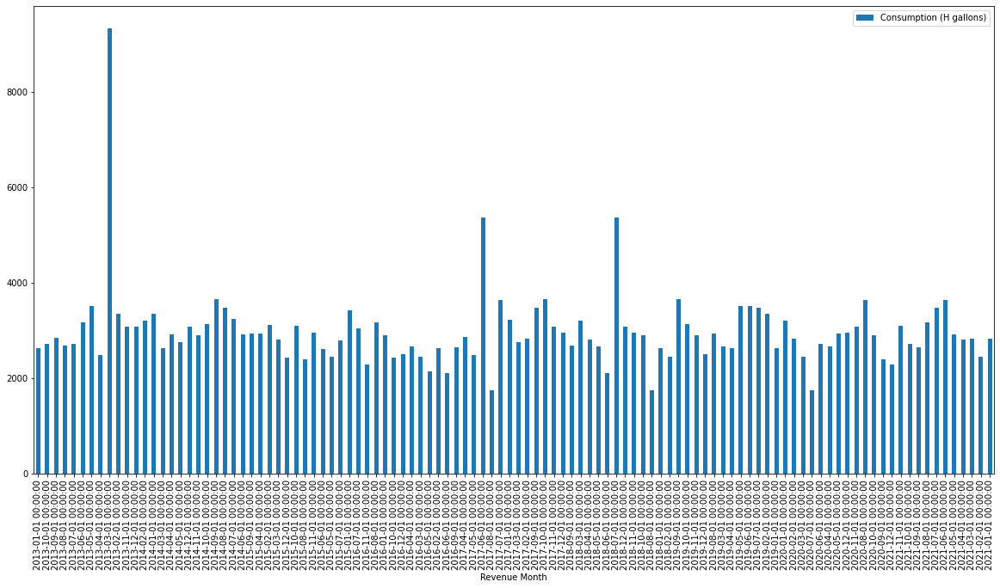

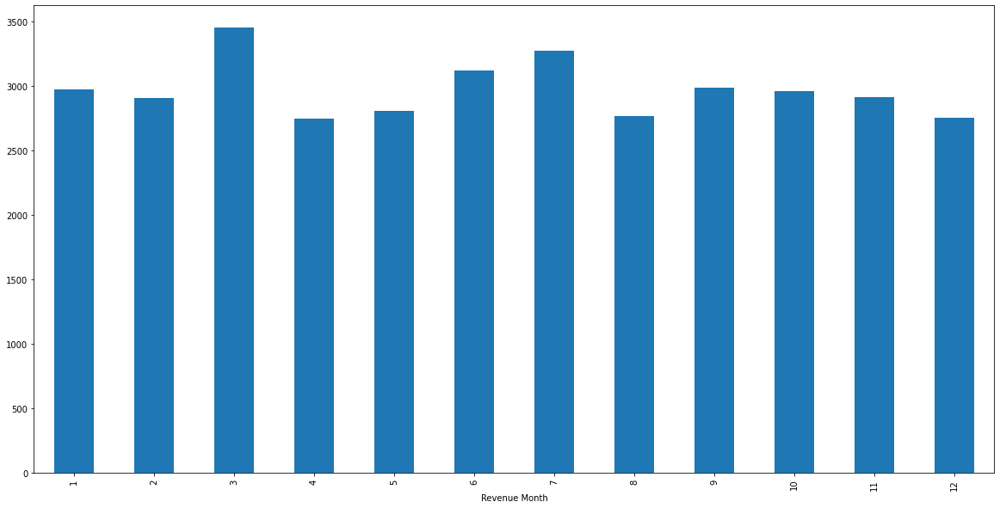

For Current Charges: 


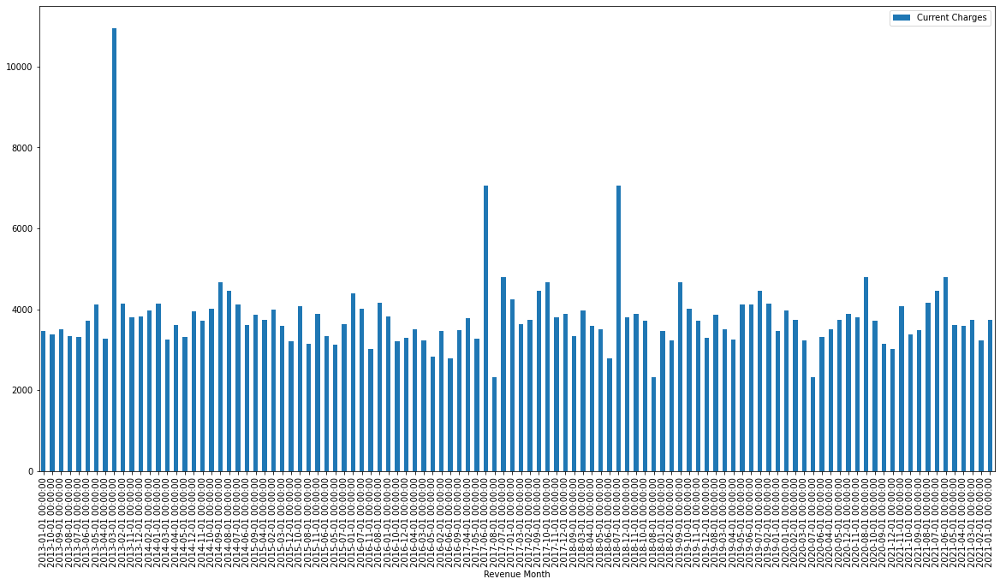

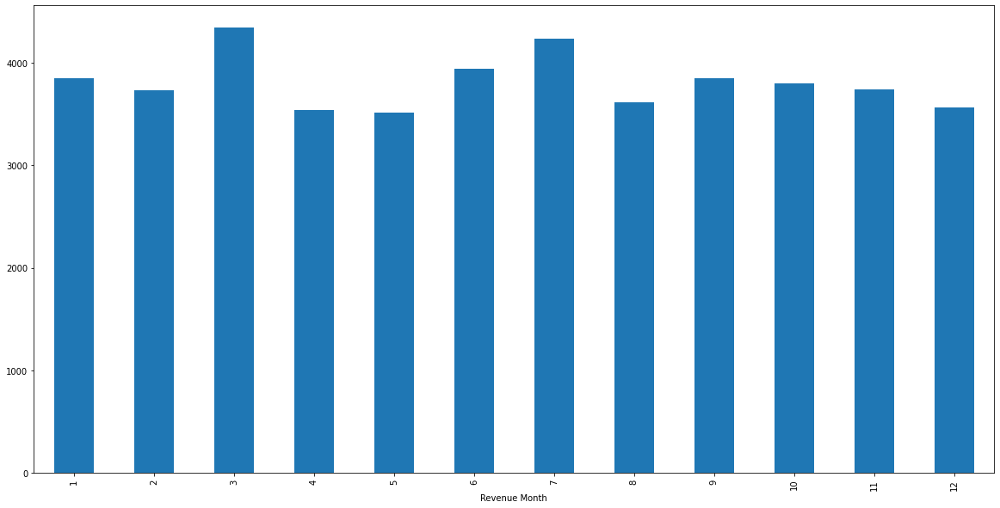

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V83033049
For Consumption: 


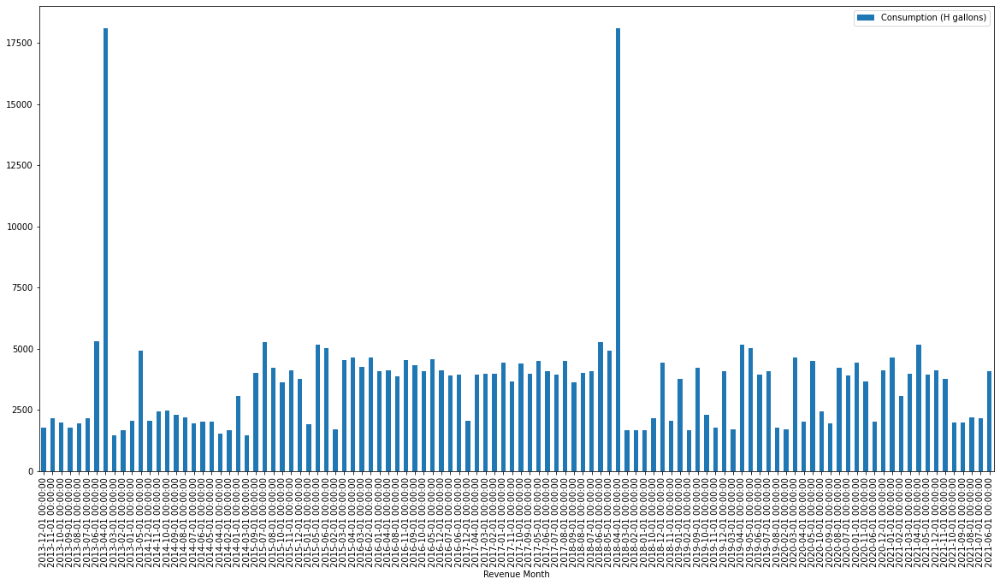

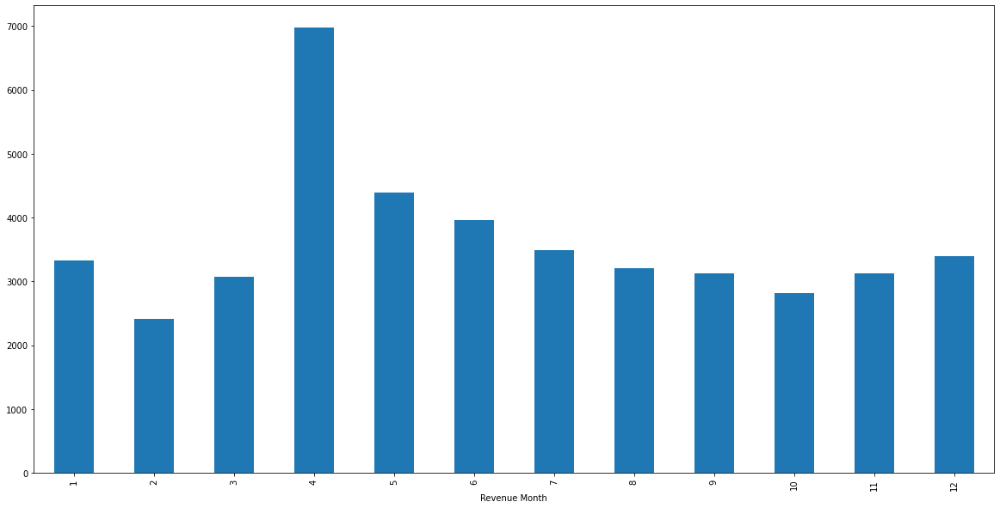

For Current Charges: 


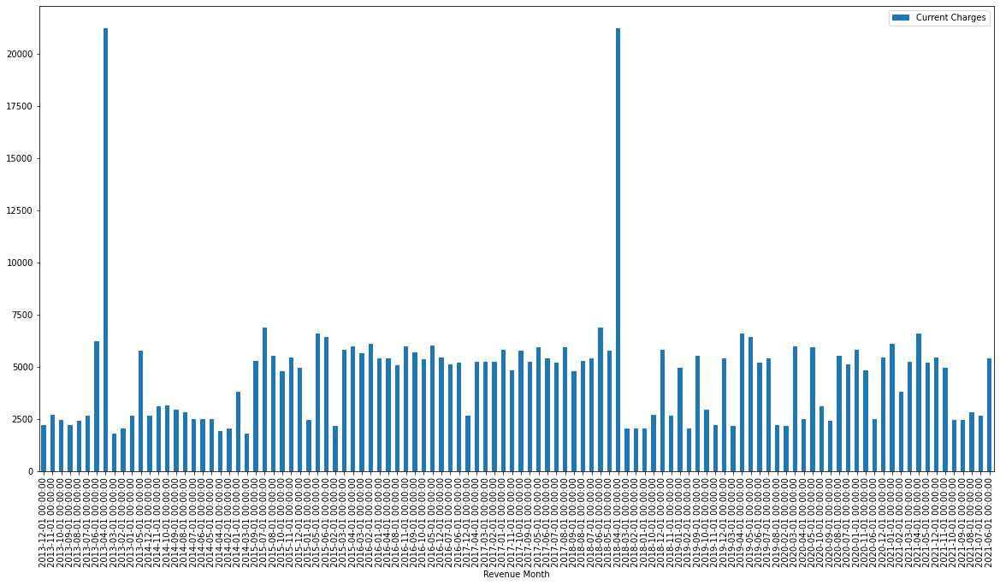

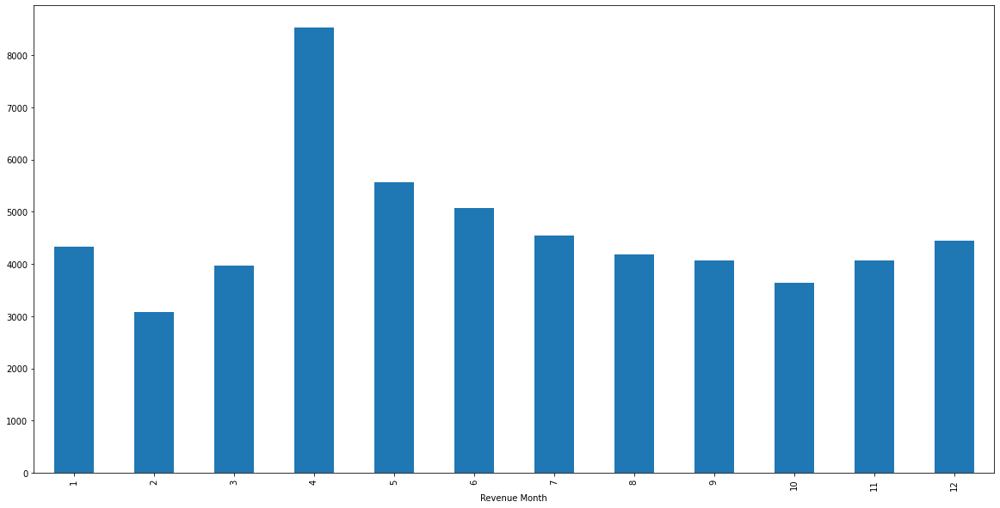

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V84005705
For Consumption: 


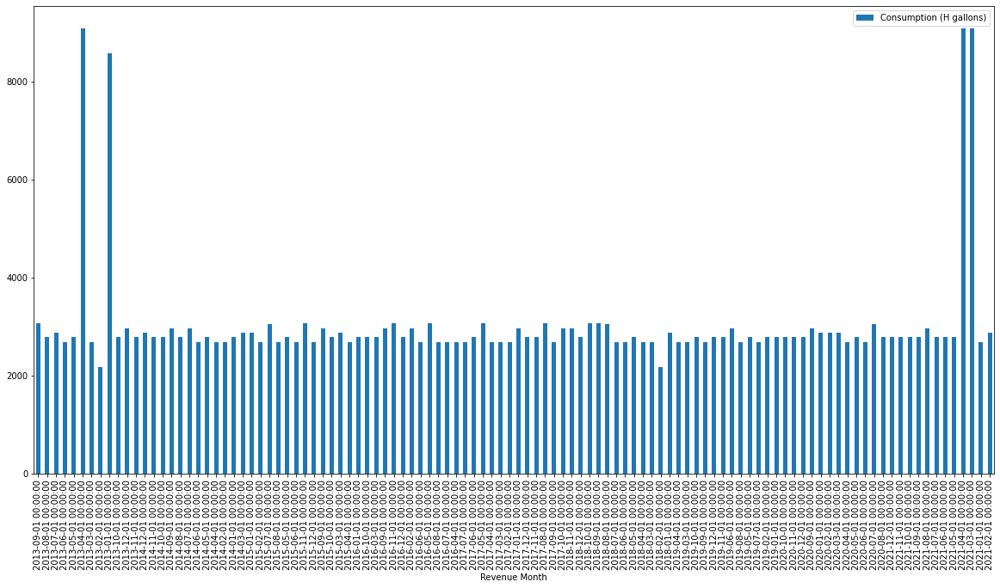

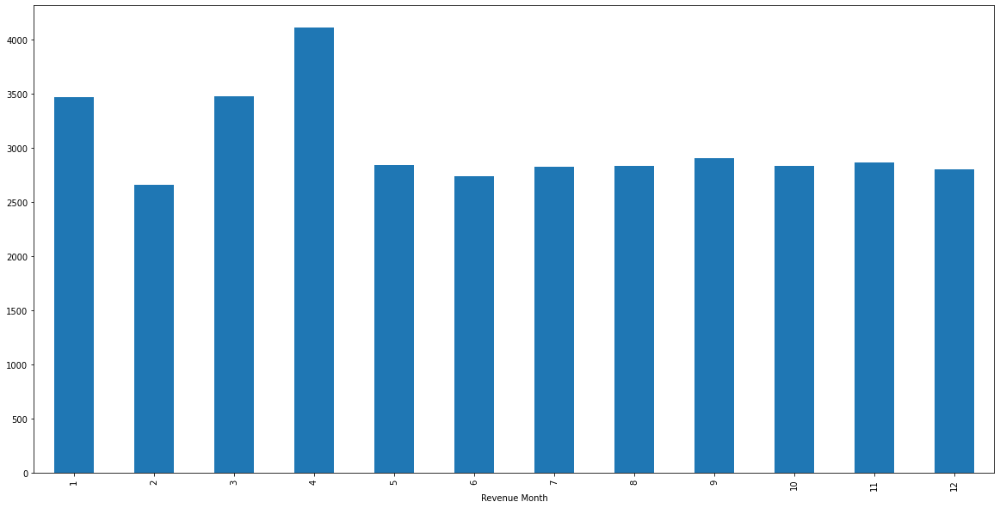

For Current Charges: 


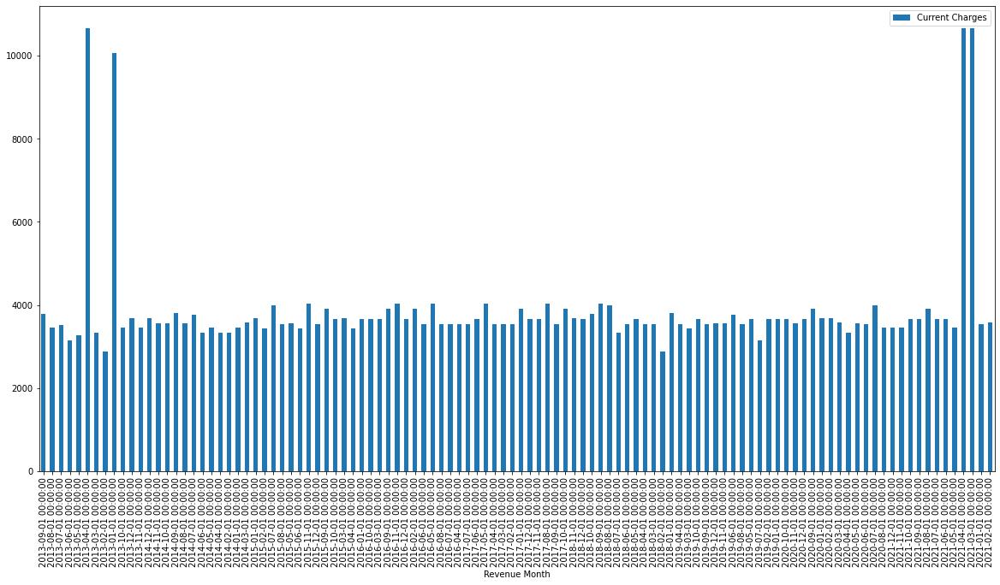

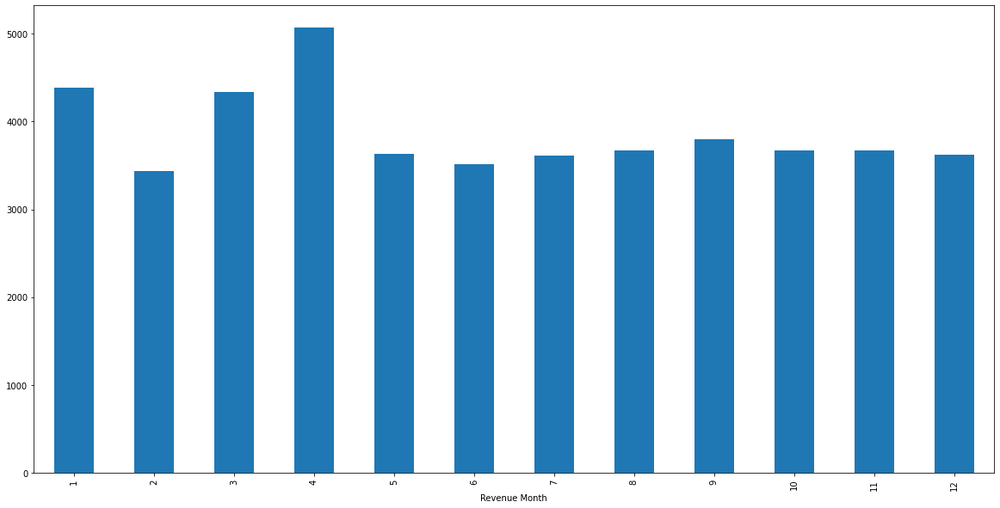

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V83029959
For Consumption: 


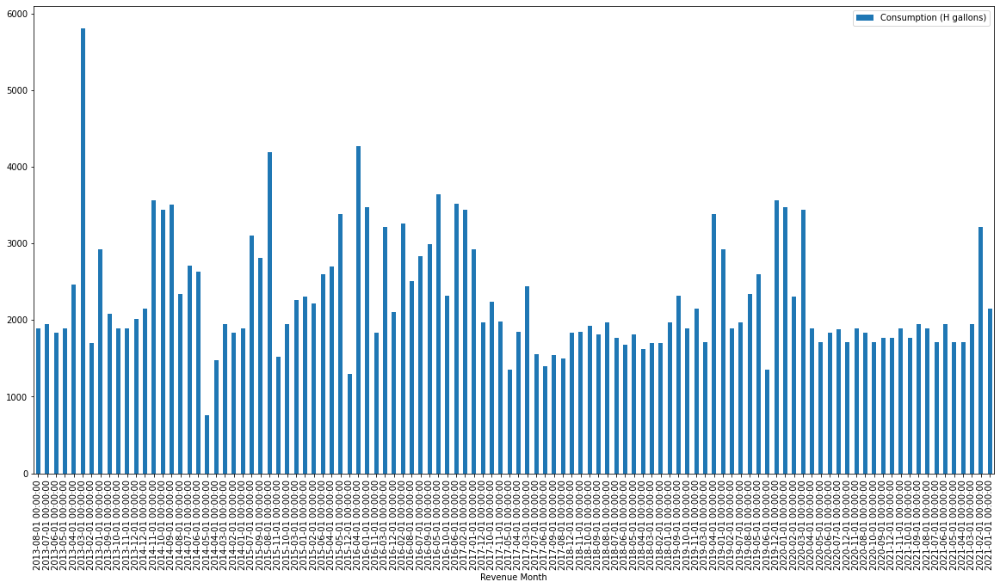

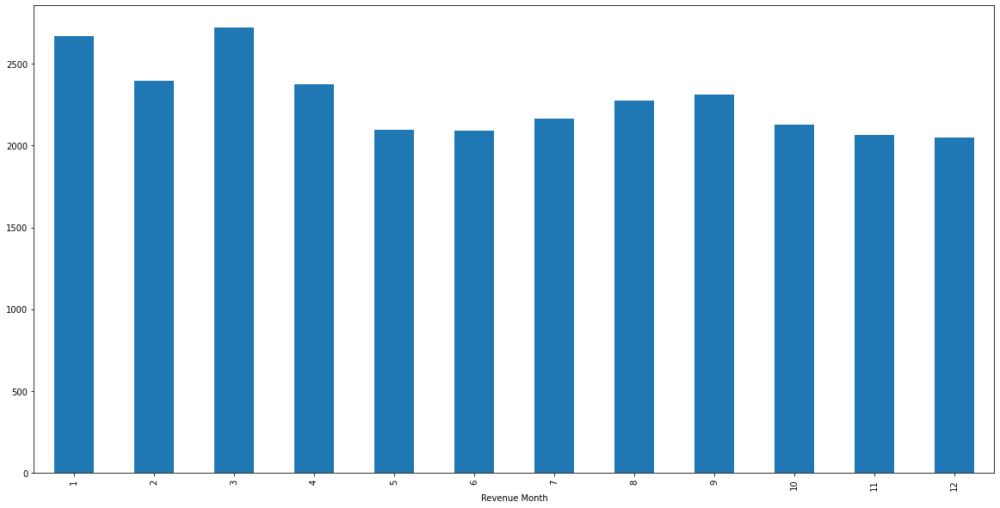

For Current Charges: 


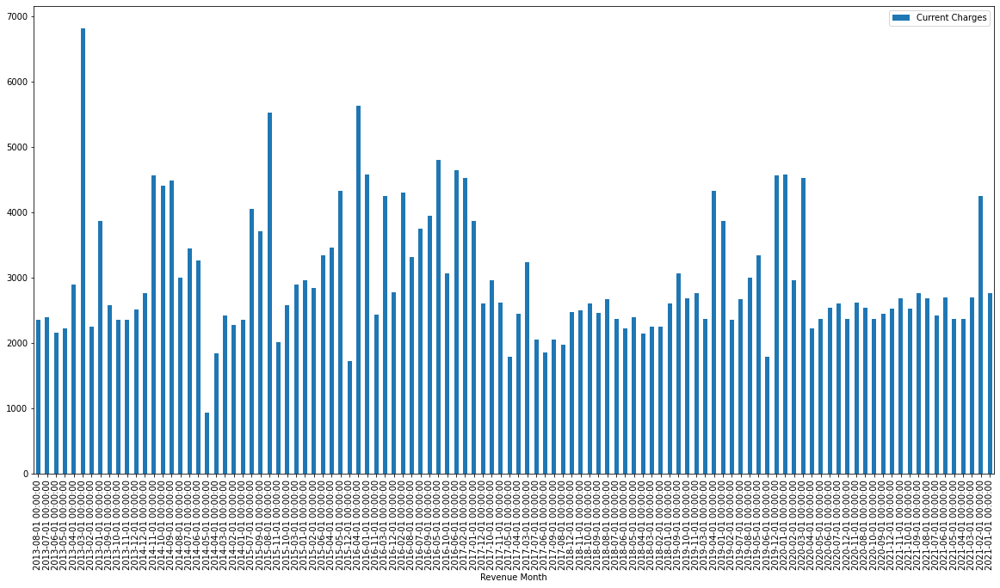

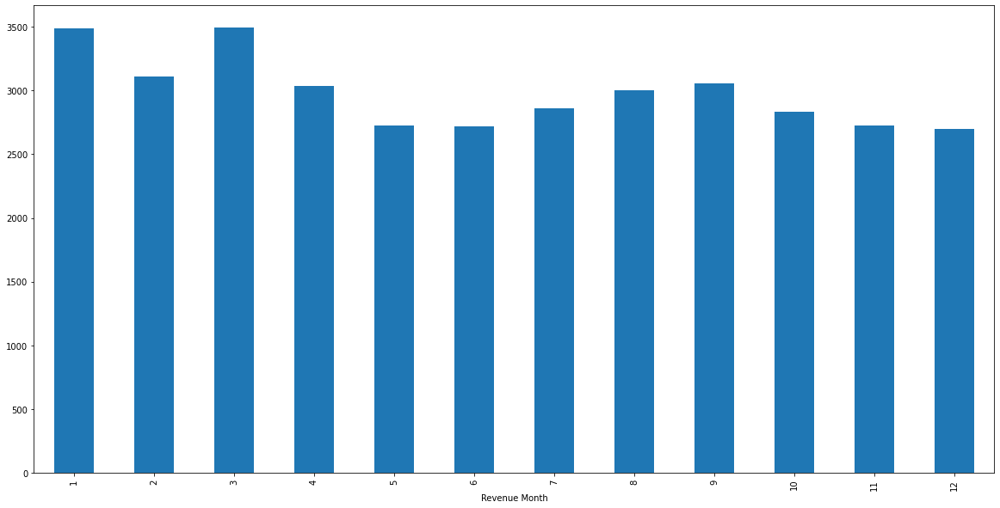

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V84008562
For Consumption: 


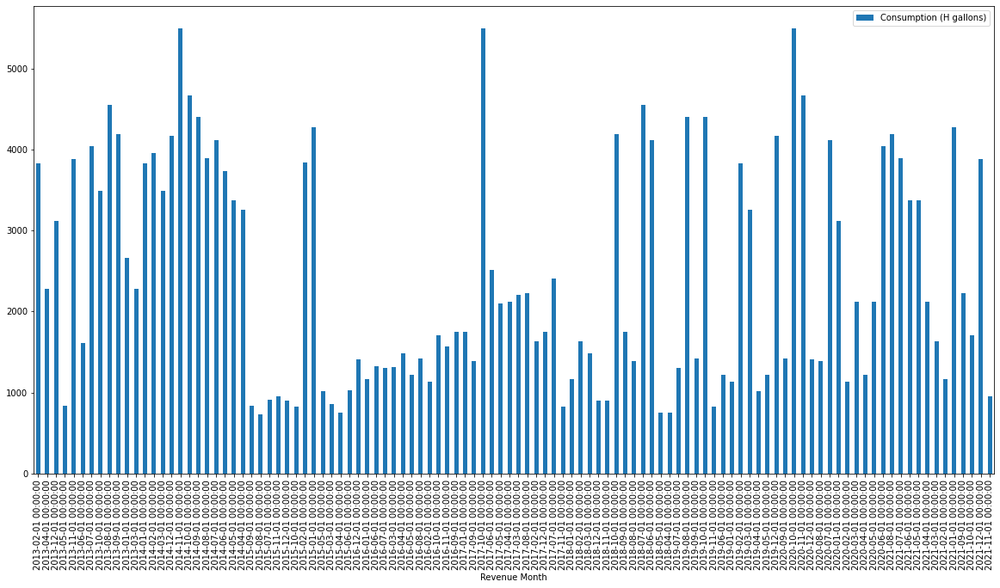

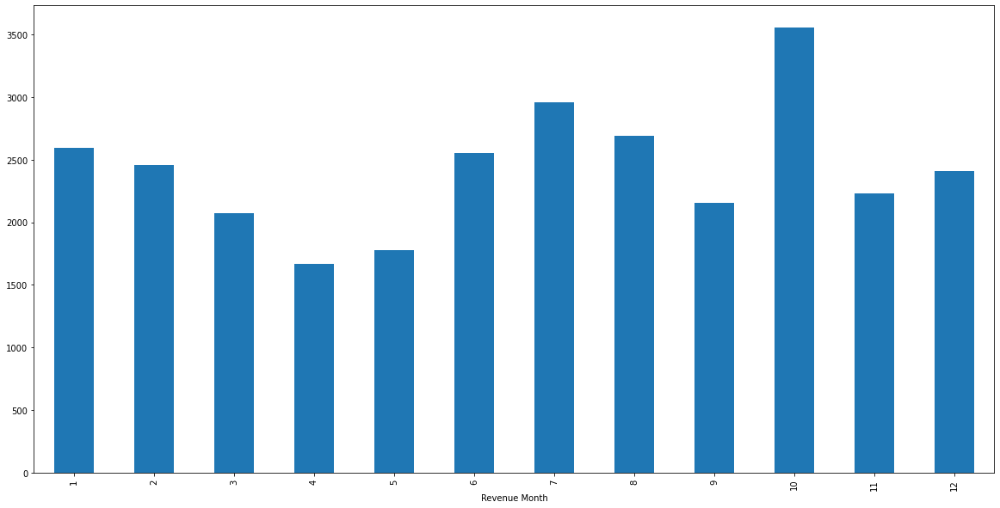

For Current Charges: 


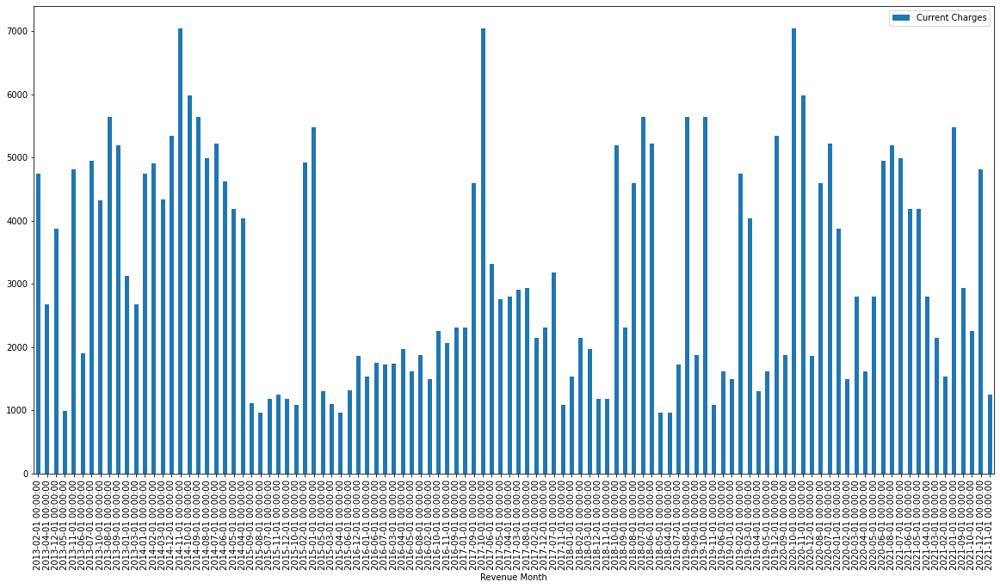

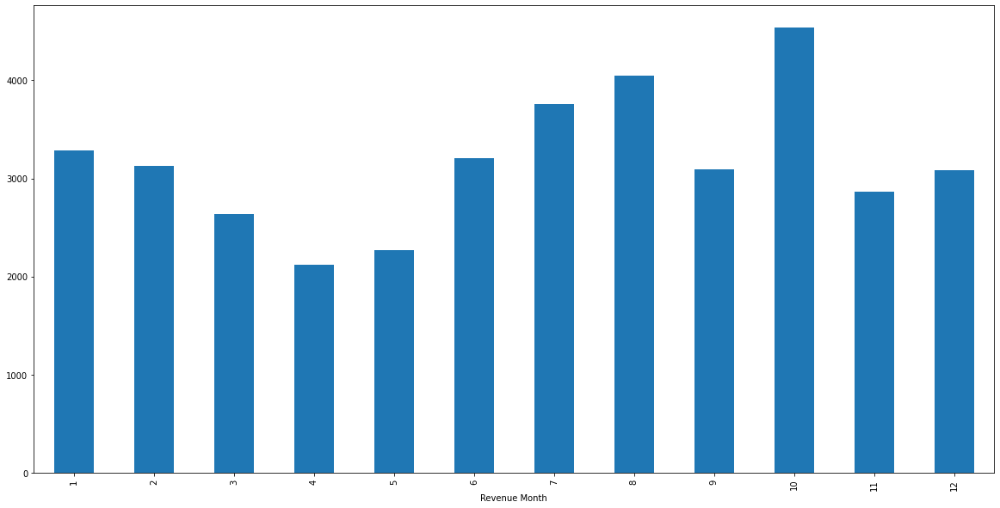

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V83020691
For Consumption: 


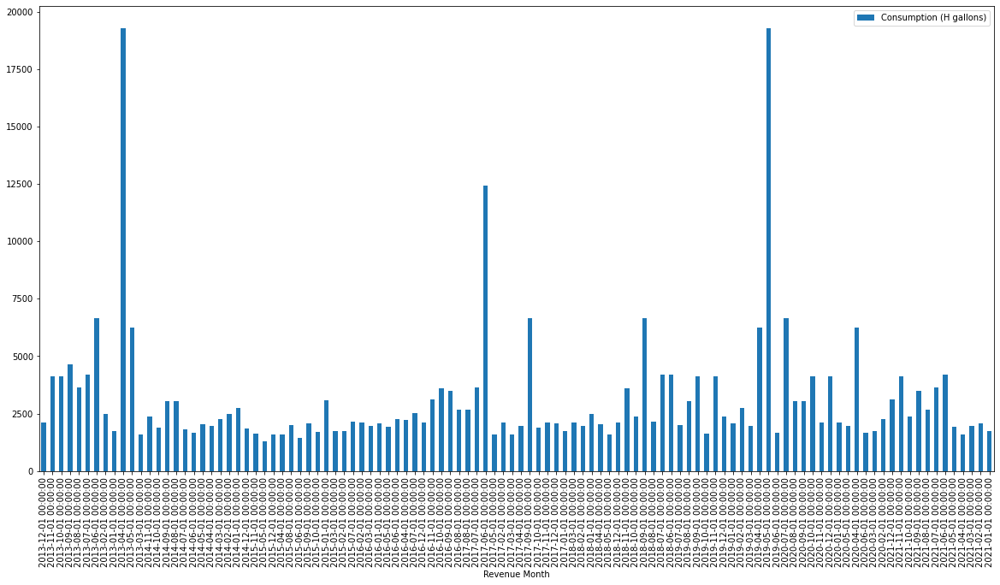

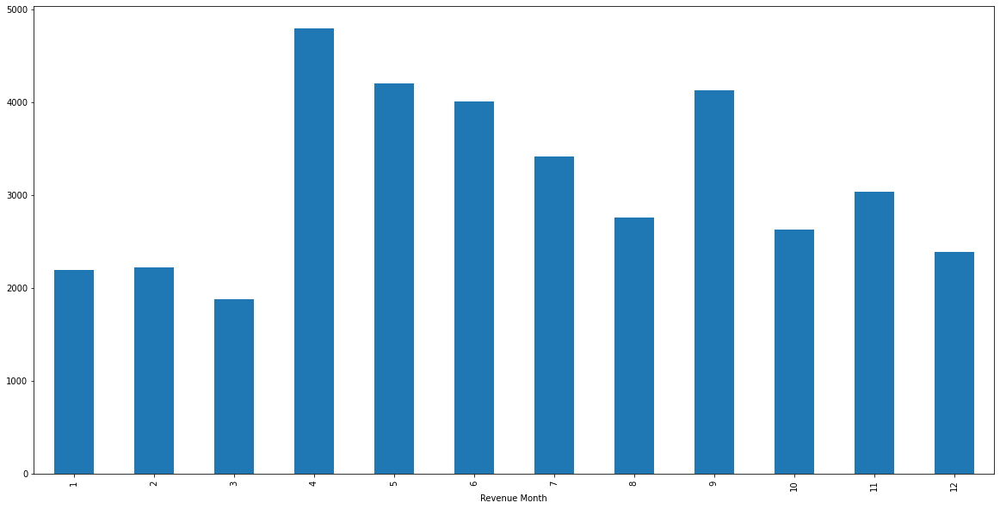

For Current Charges: 


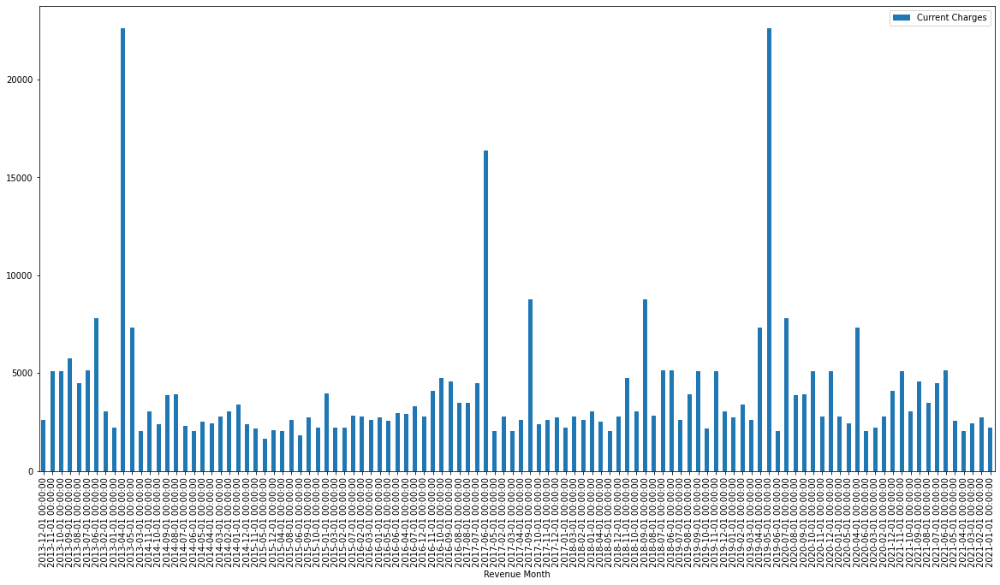

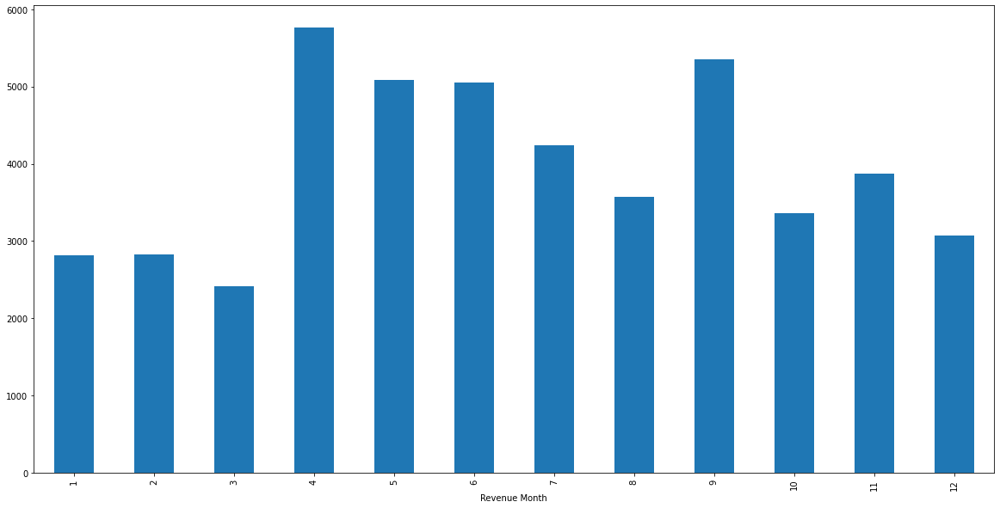

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K98974961
For Consumption: 


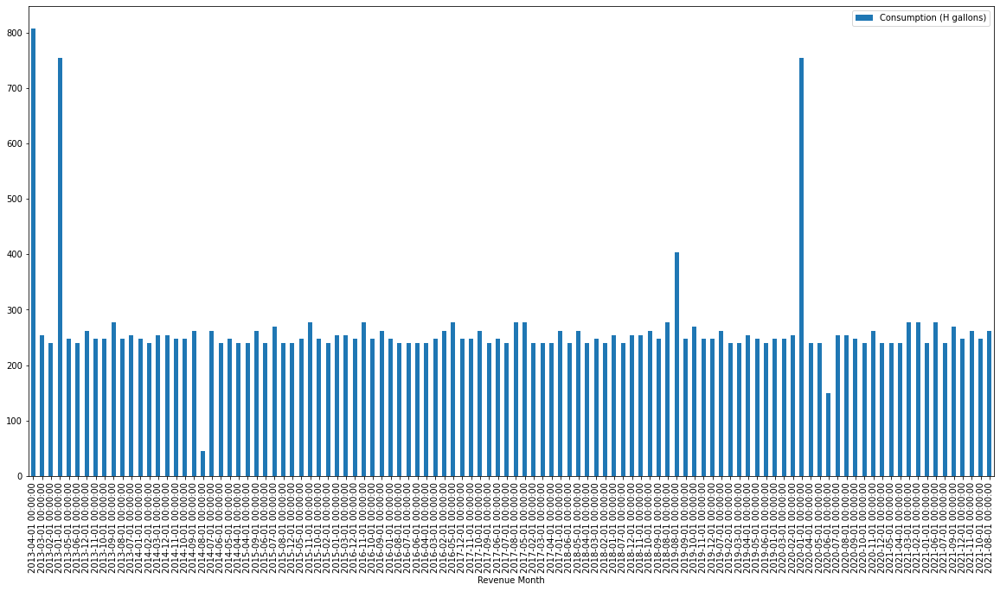

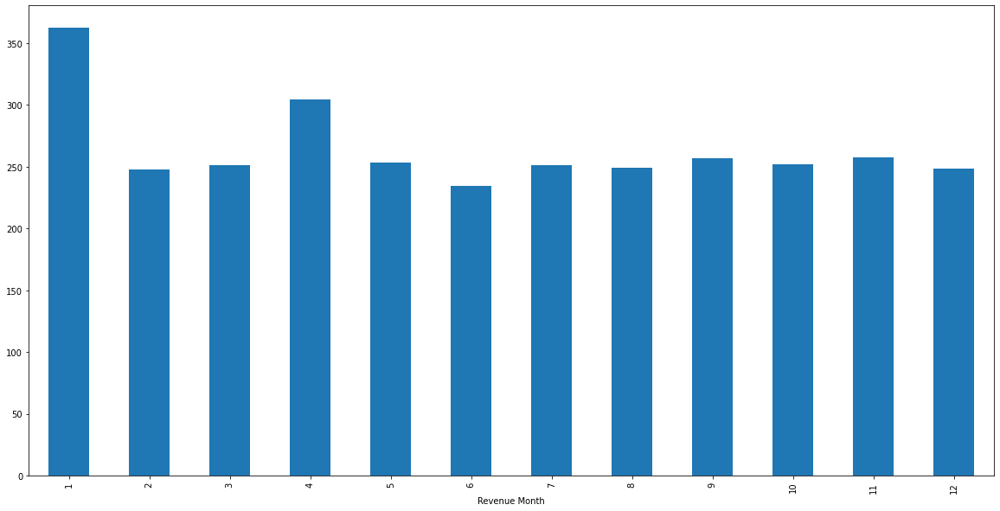

For Current Charges: 


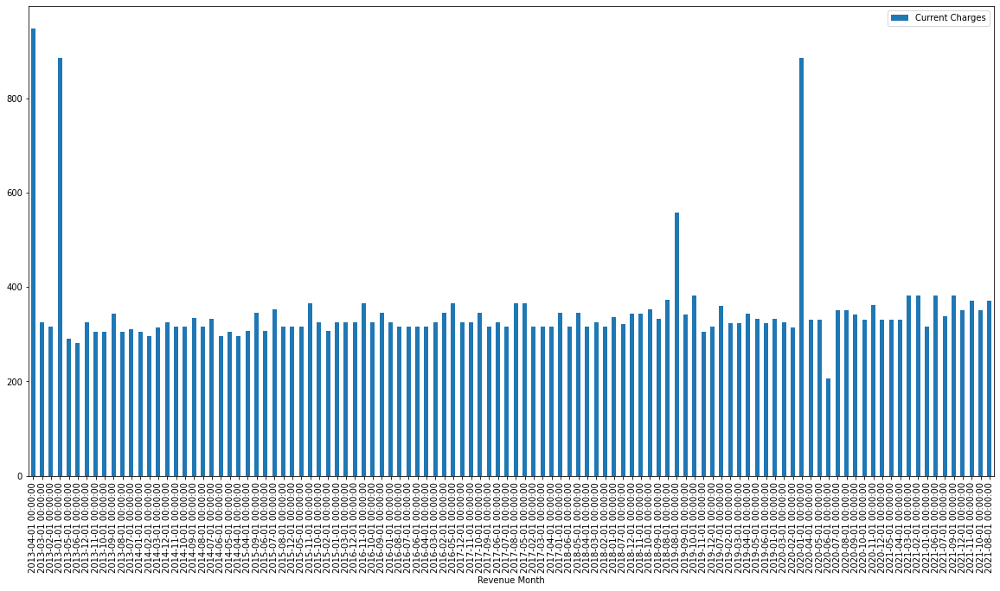

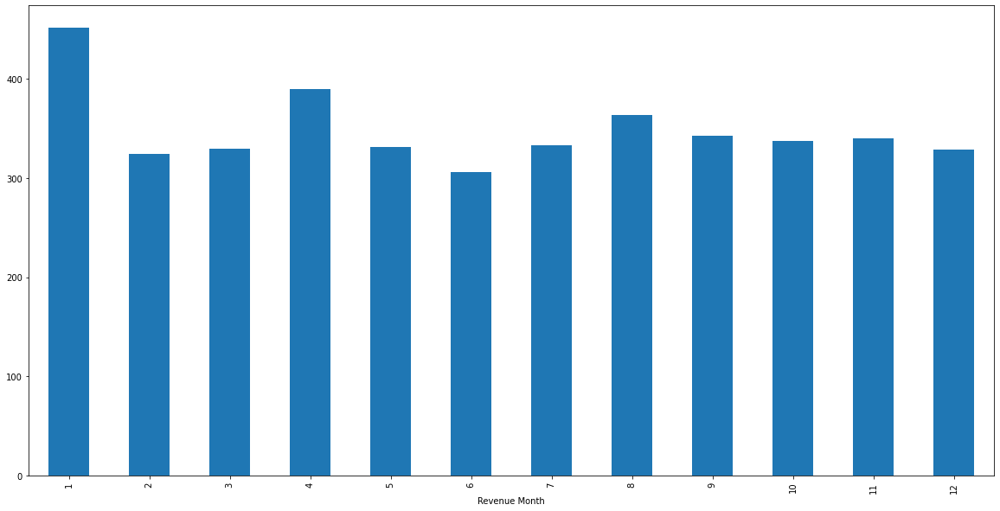

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E17792841
For Consumption: 


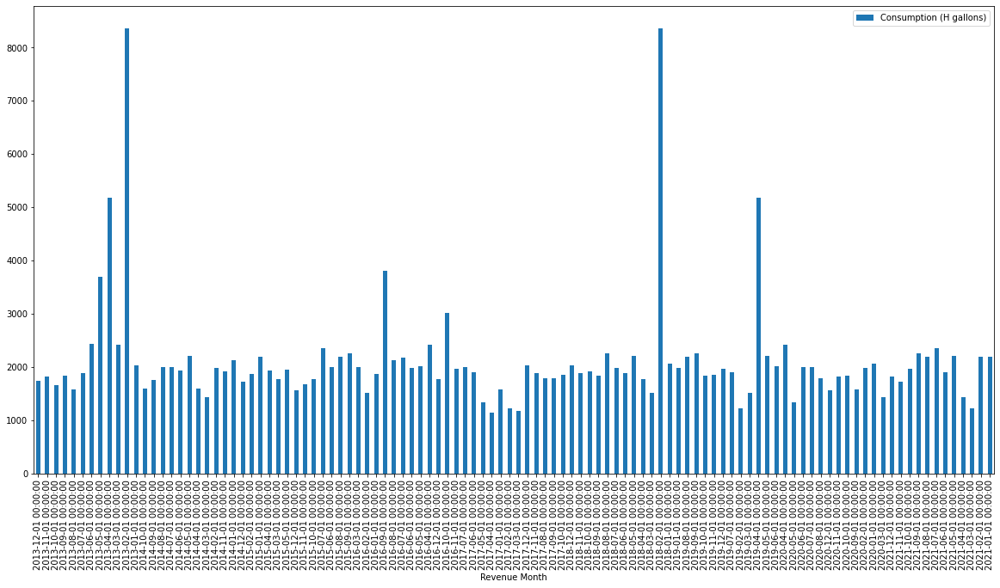

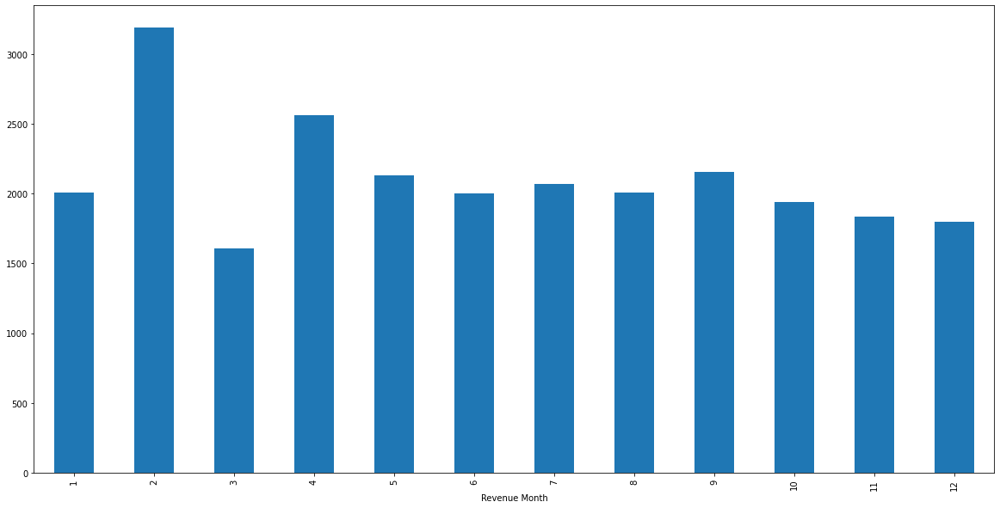

For Current Charges: 


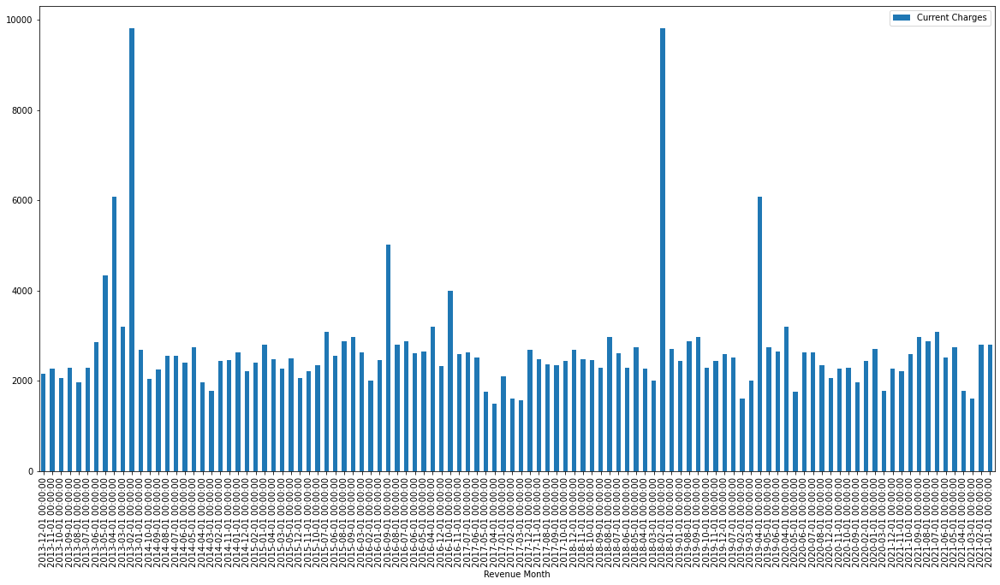

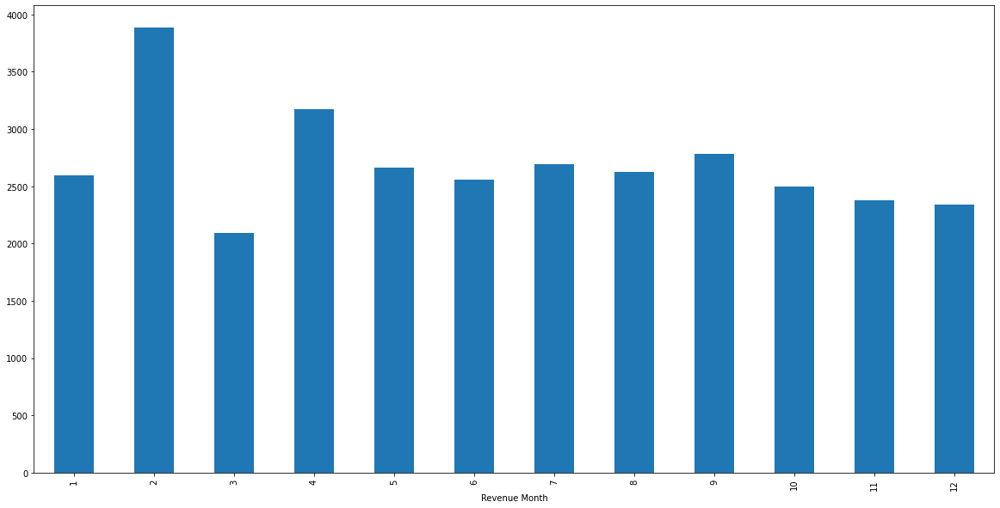

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I13013828
For Consumption: 


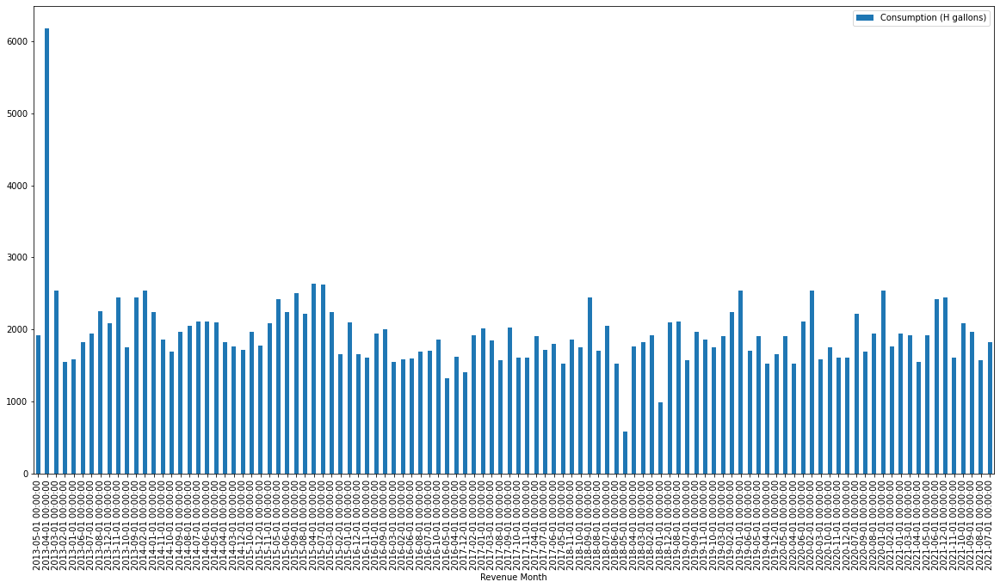

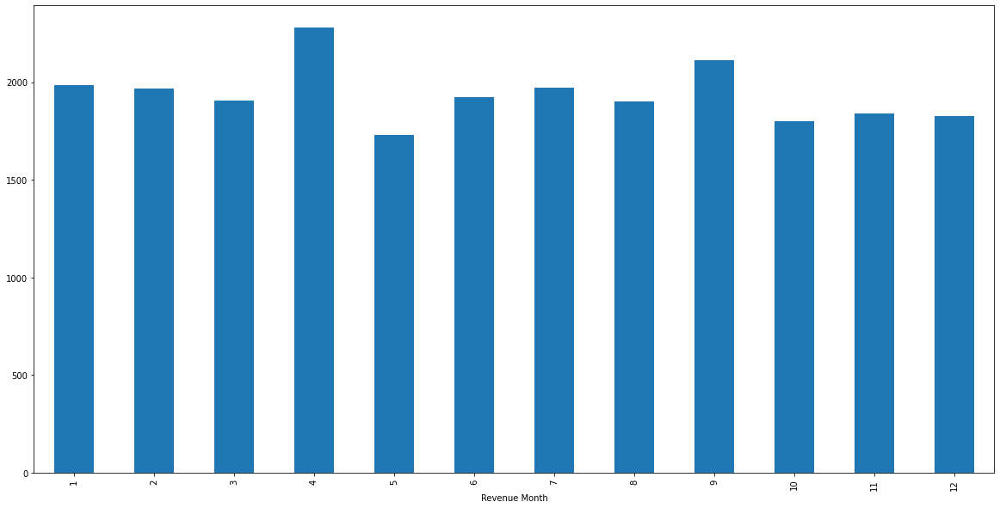

For Current Charges: 


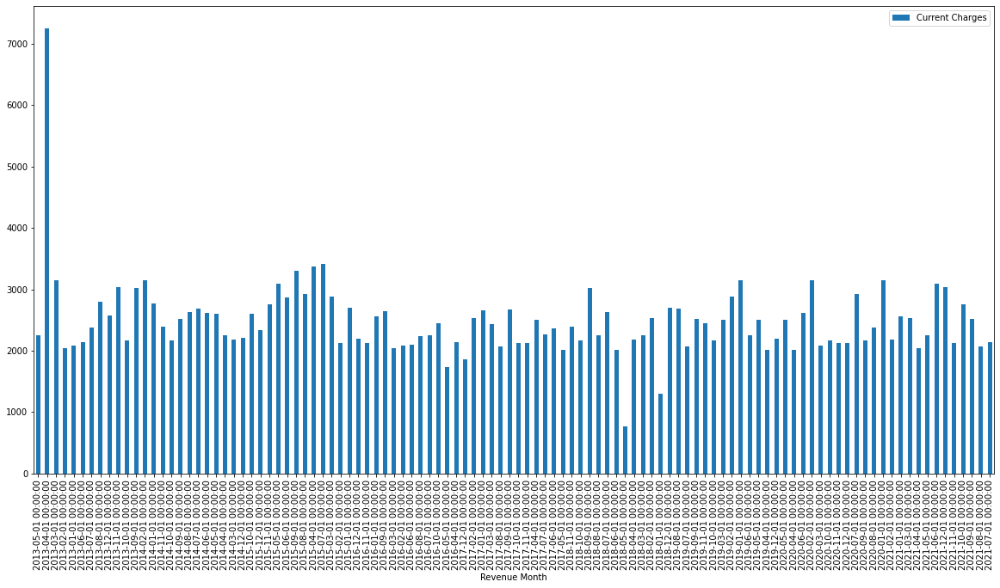

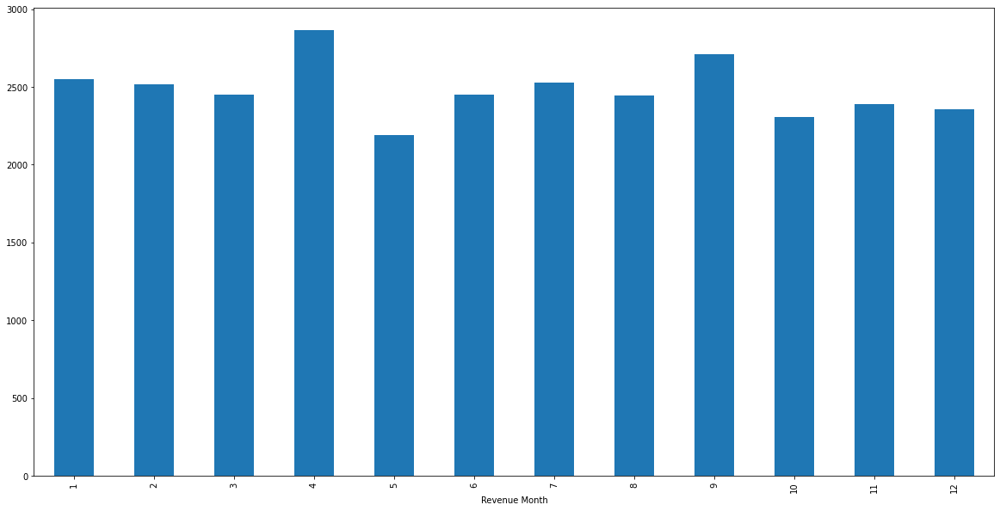

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I13013834
For Consumption: 


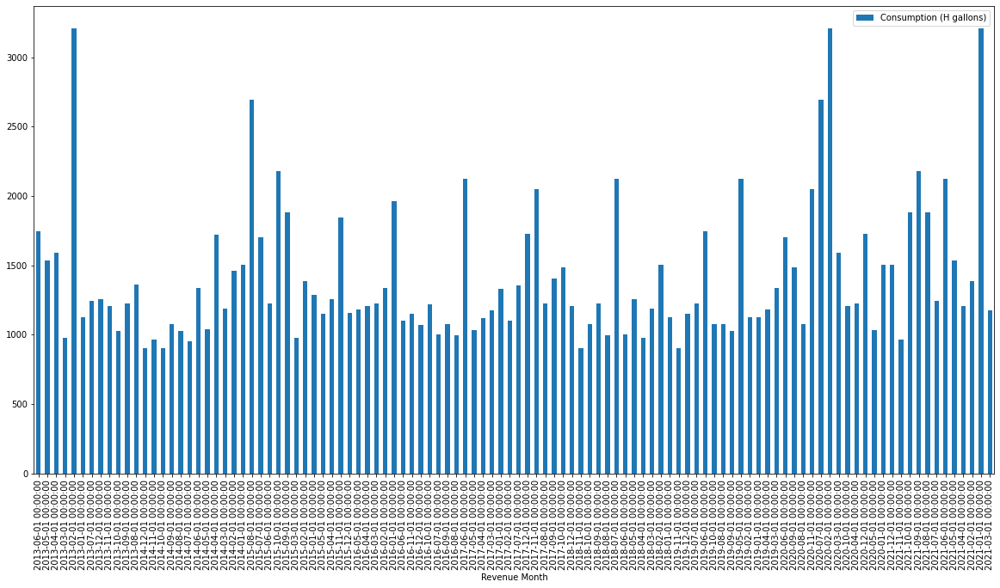

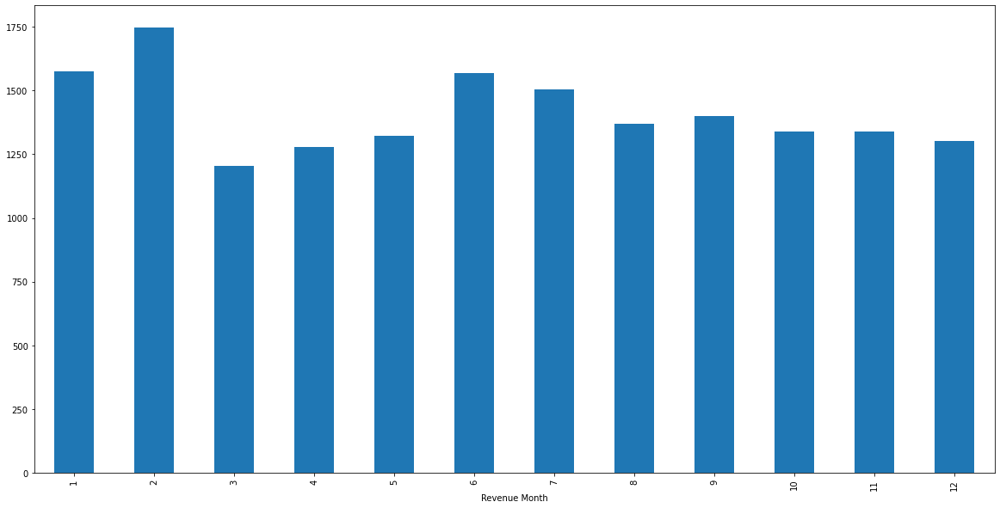

For Current Charges: 


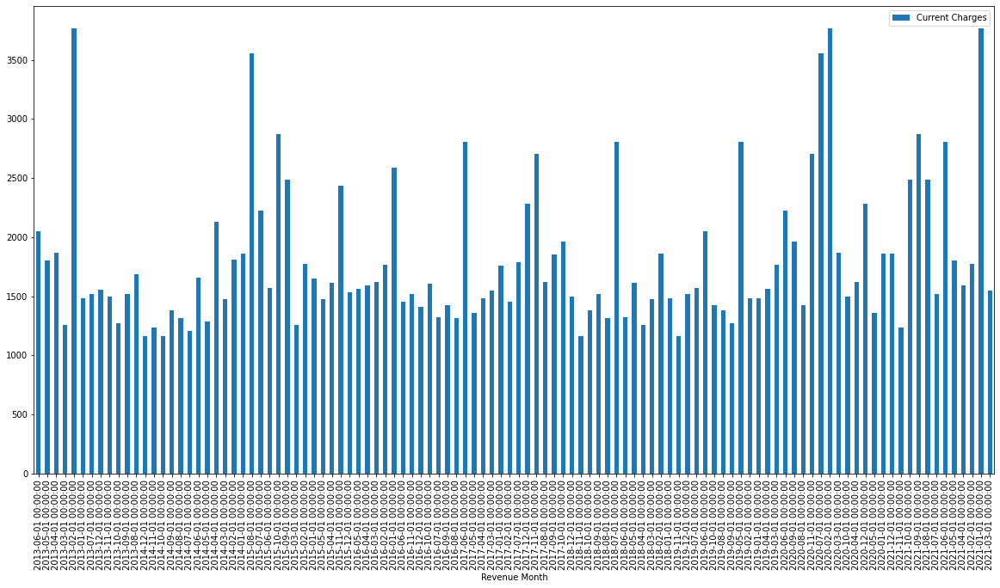

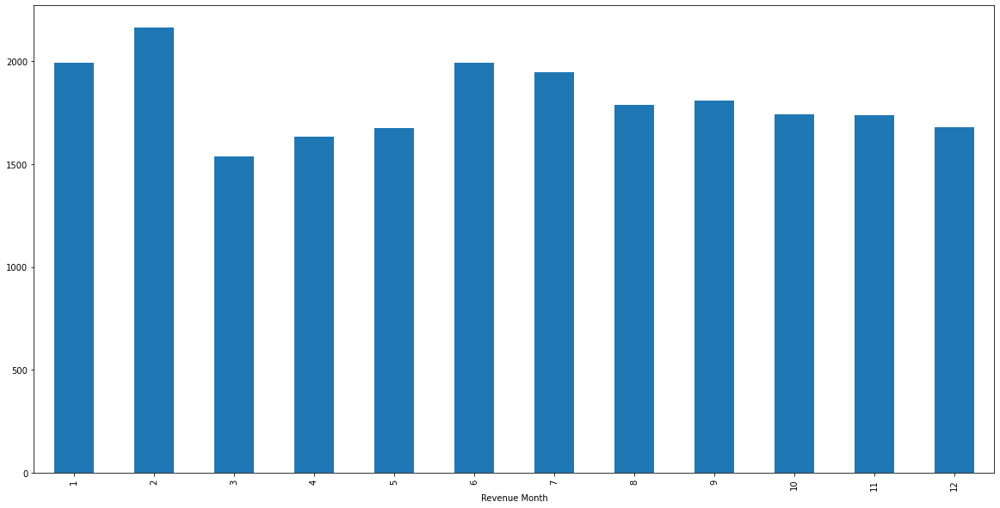

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  E12092566
For Consumption: 


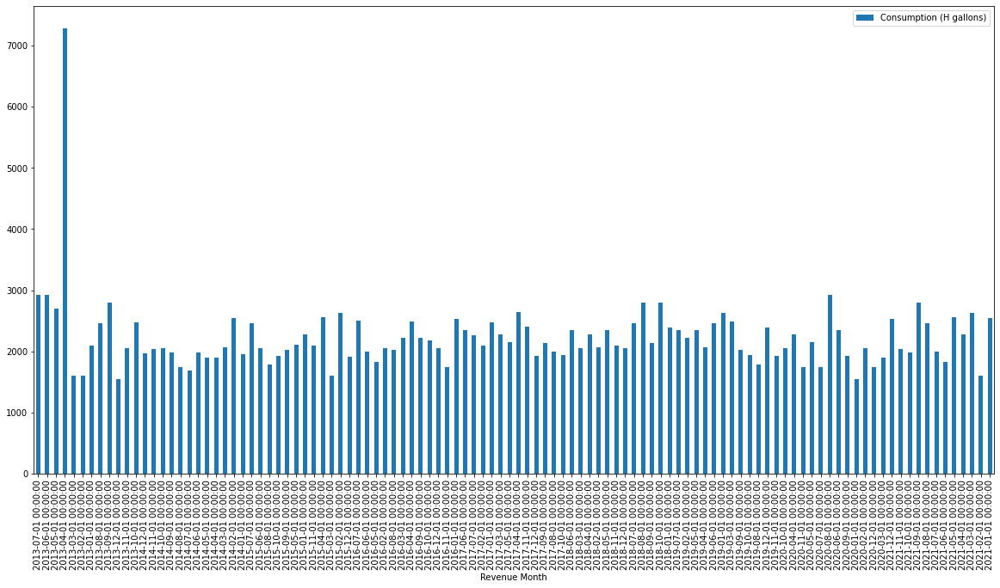

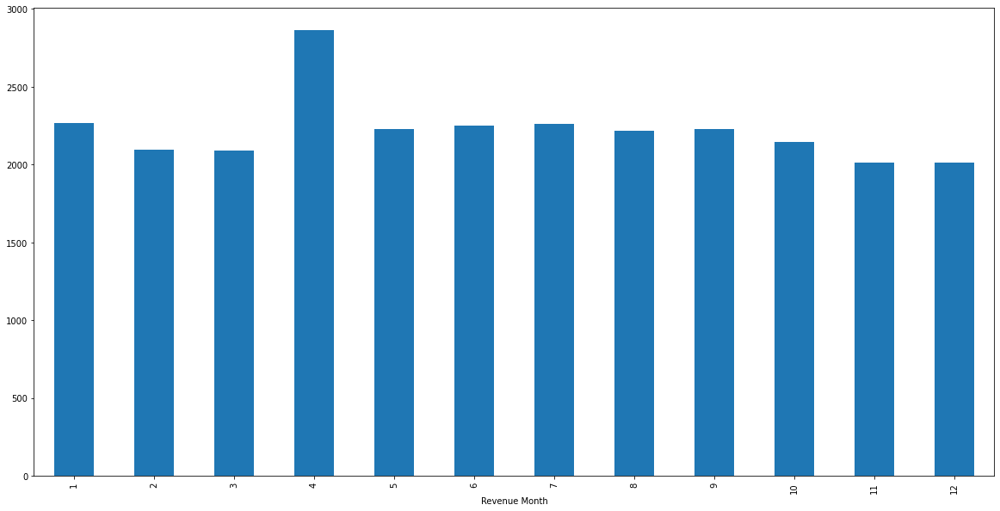

For Current Charges: 


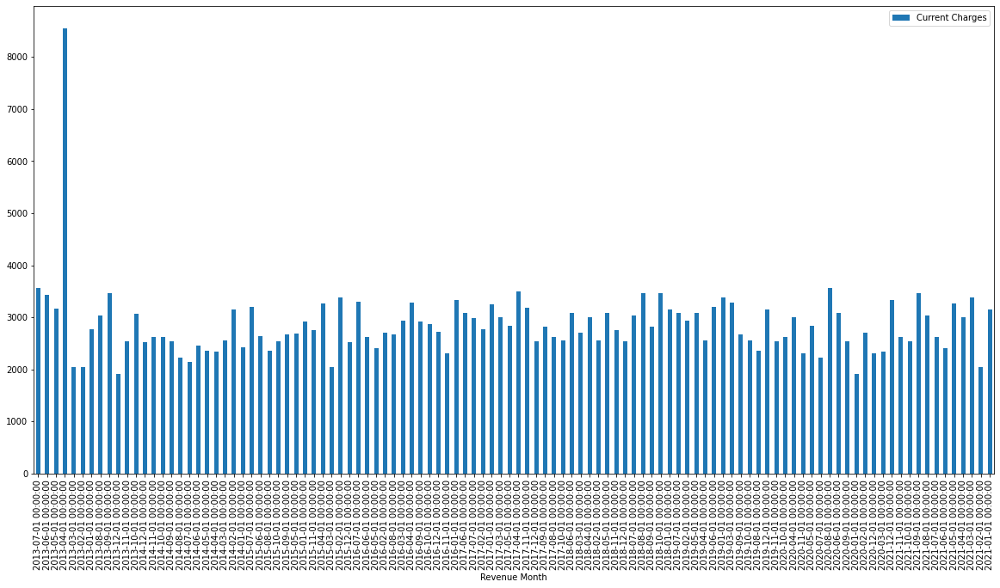

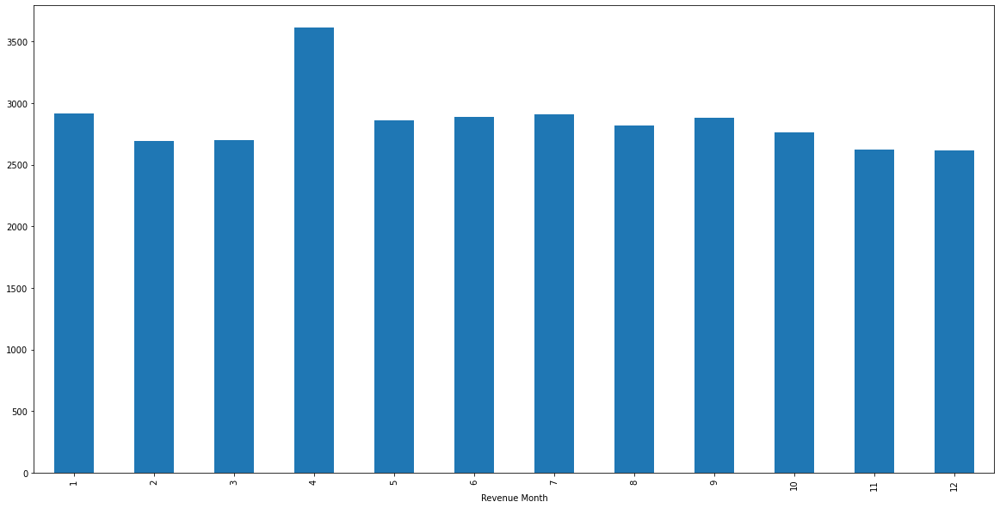

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K17791618
For Consumption: 


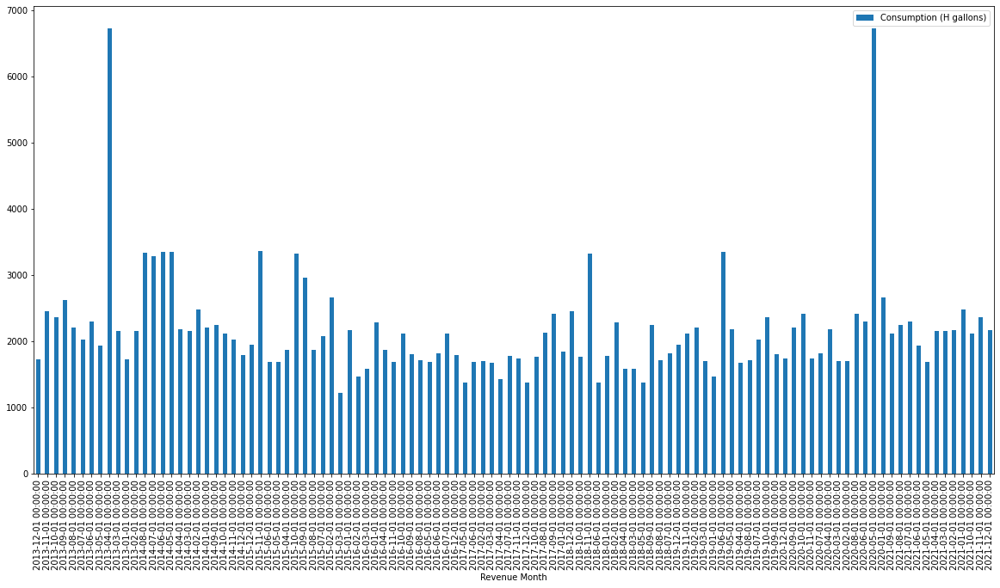

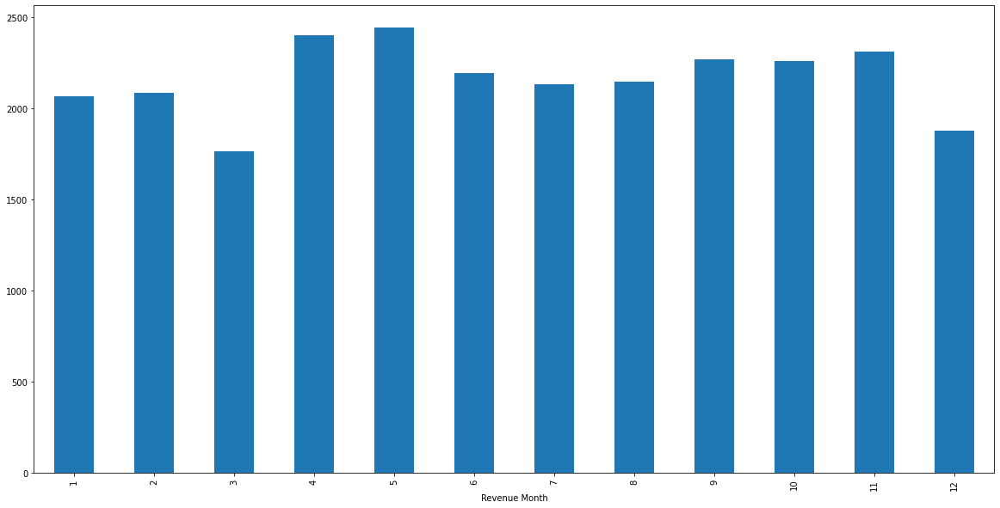

For Current Charges: 


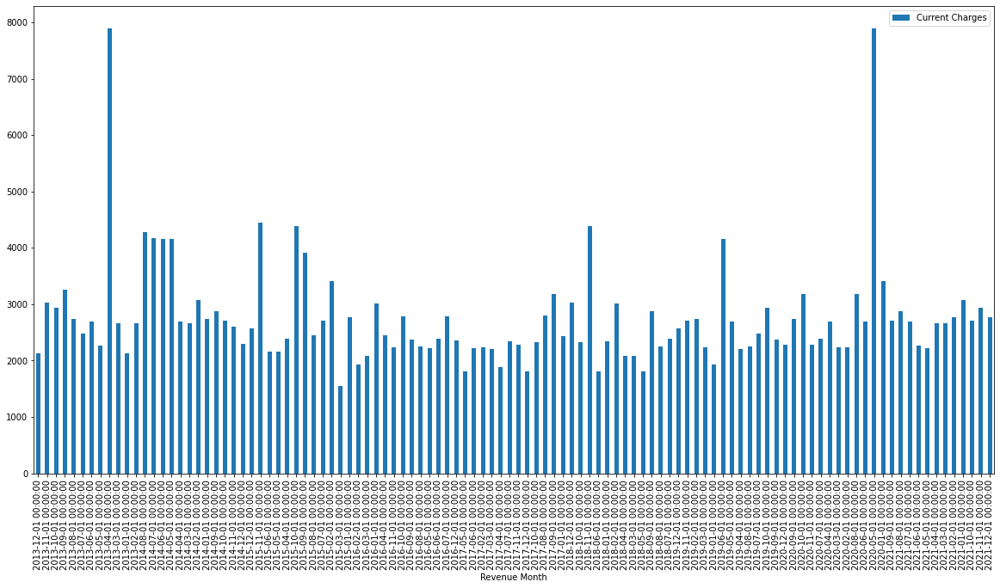

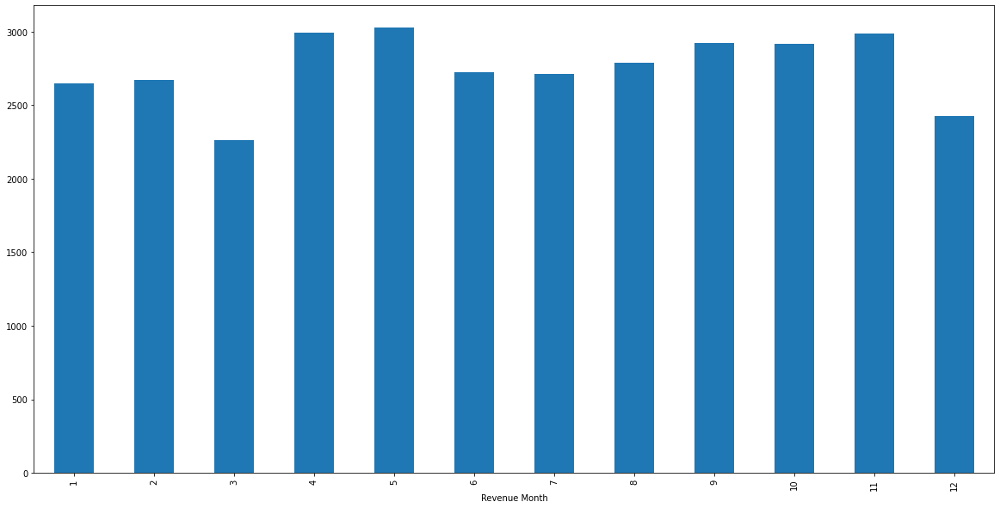

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  N31655214
For Consumption: 


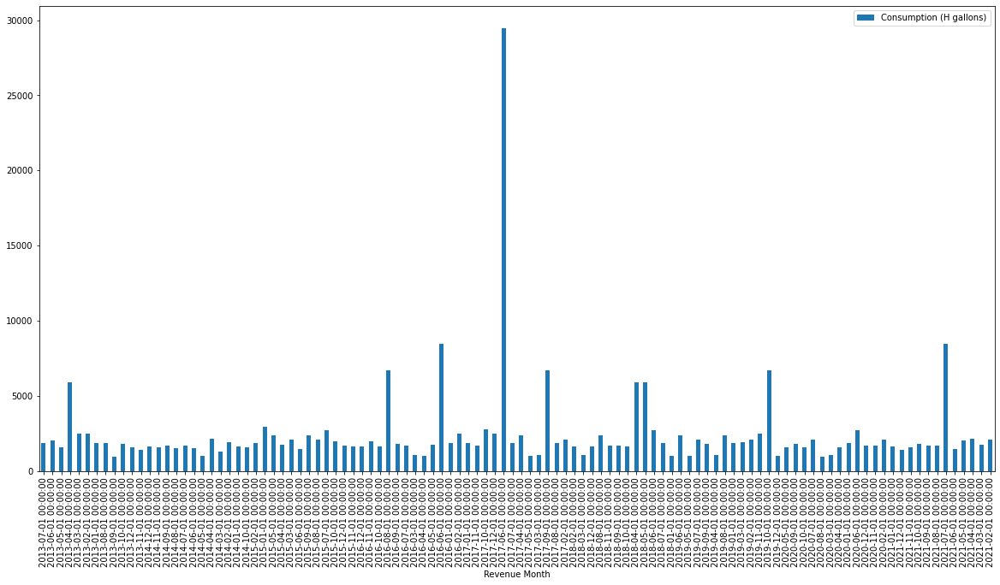

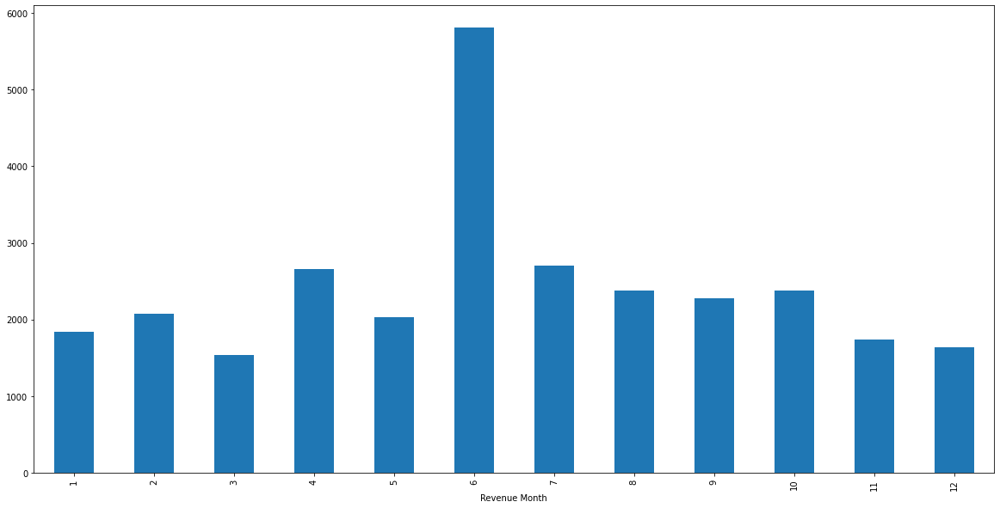

For Current Charges: 


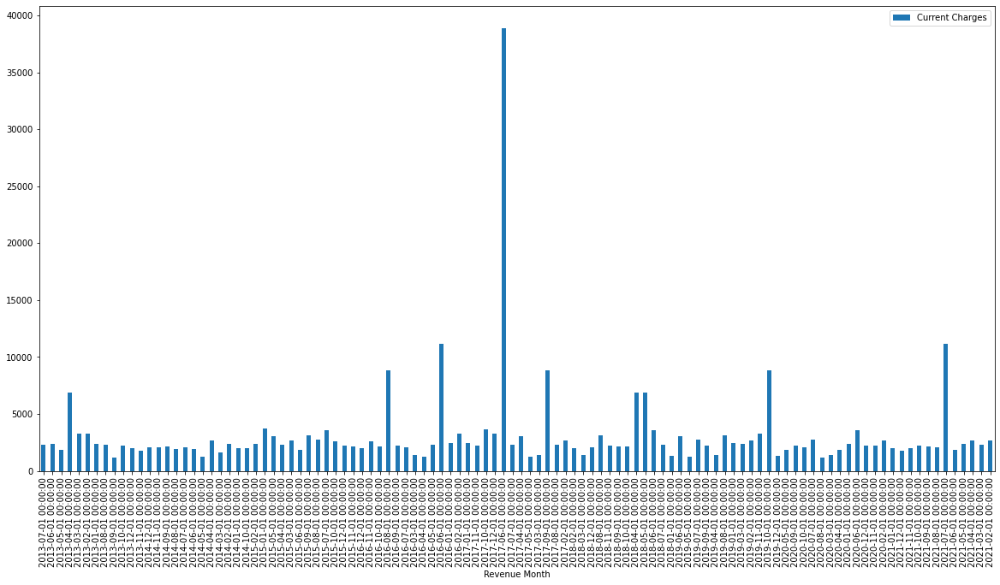

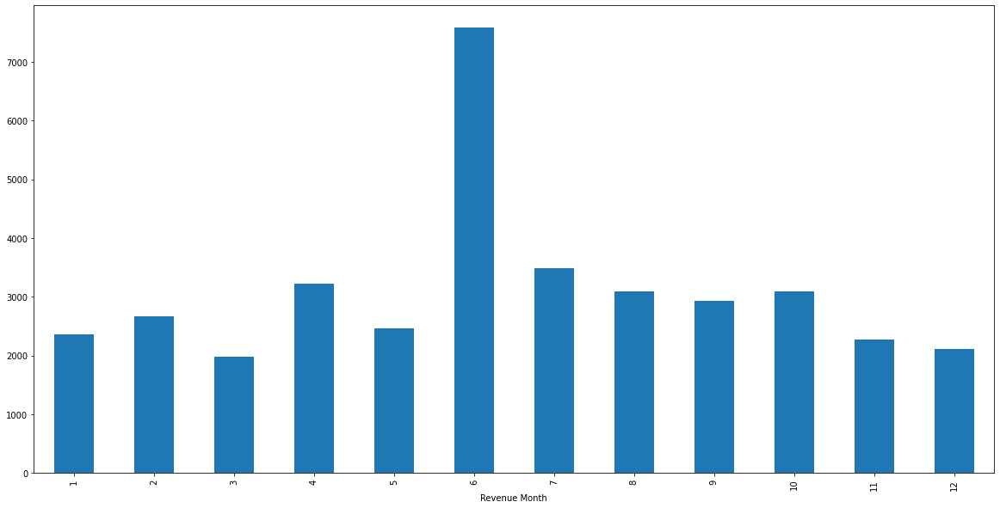

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I13006127
For Consumption: 


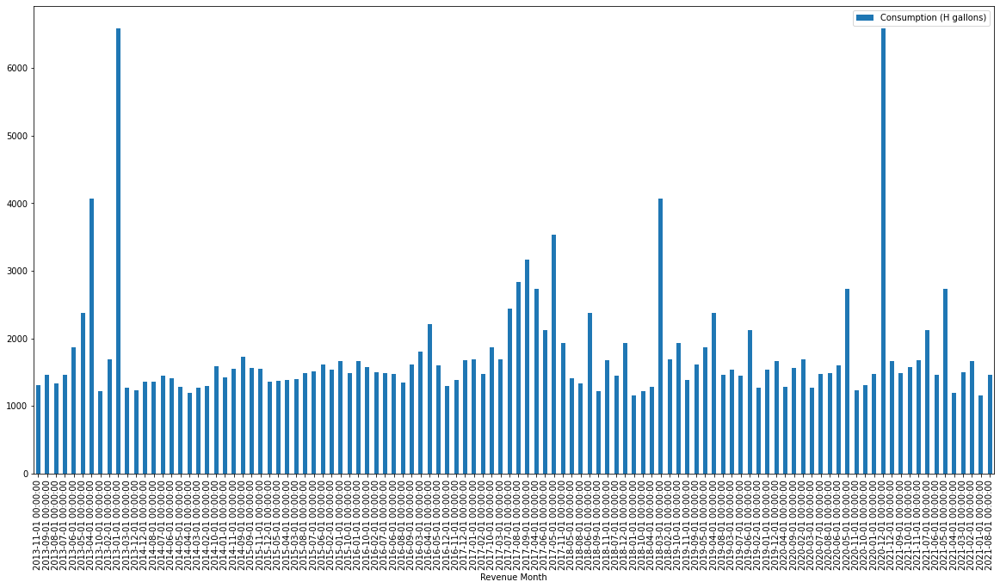

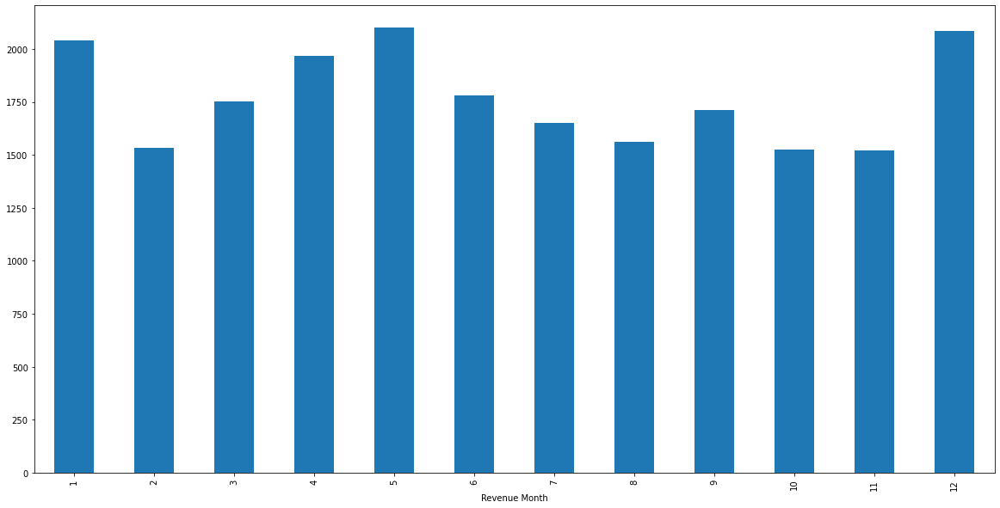

For Current Charges: 


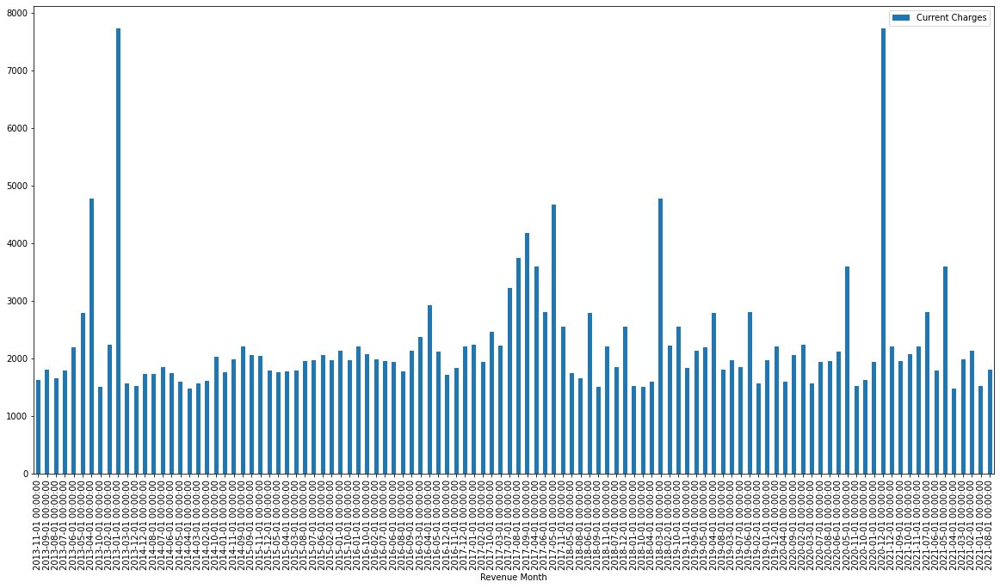

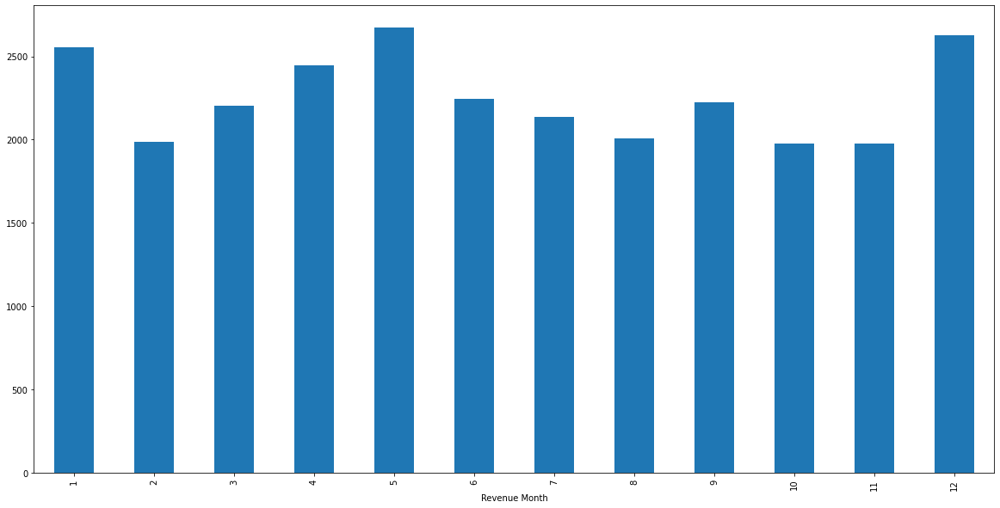

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  I13014299
For Consumption: 


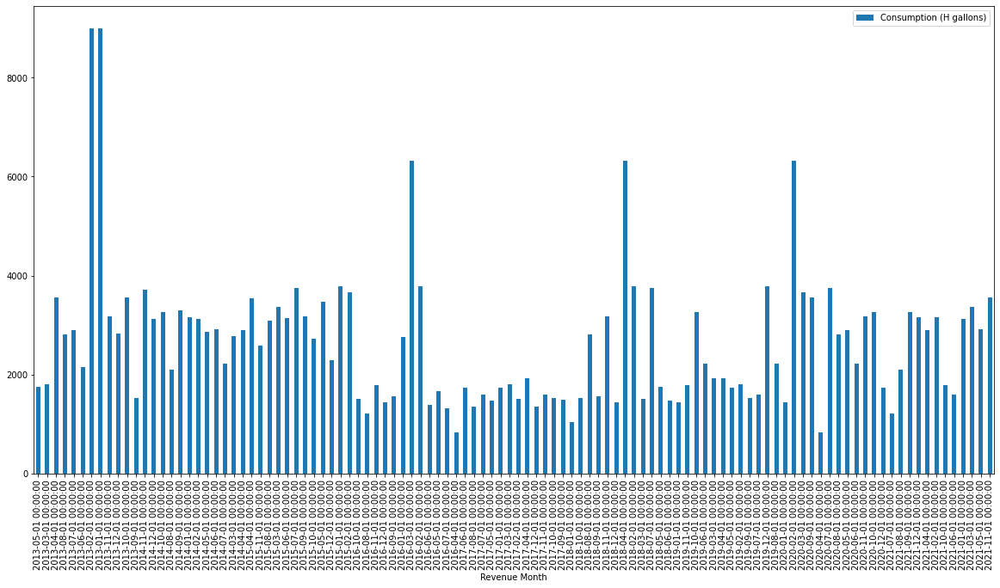

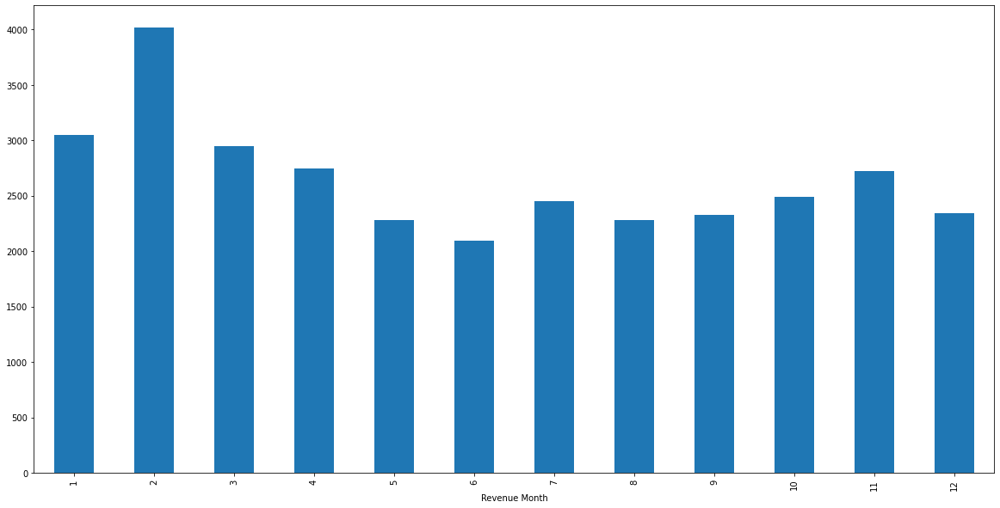

For Current Charges: 


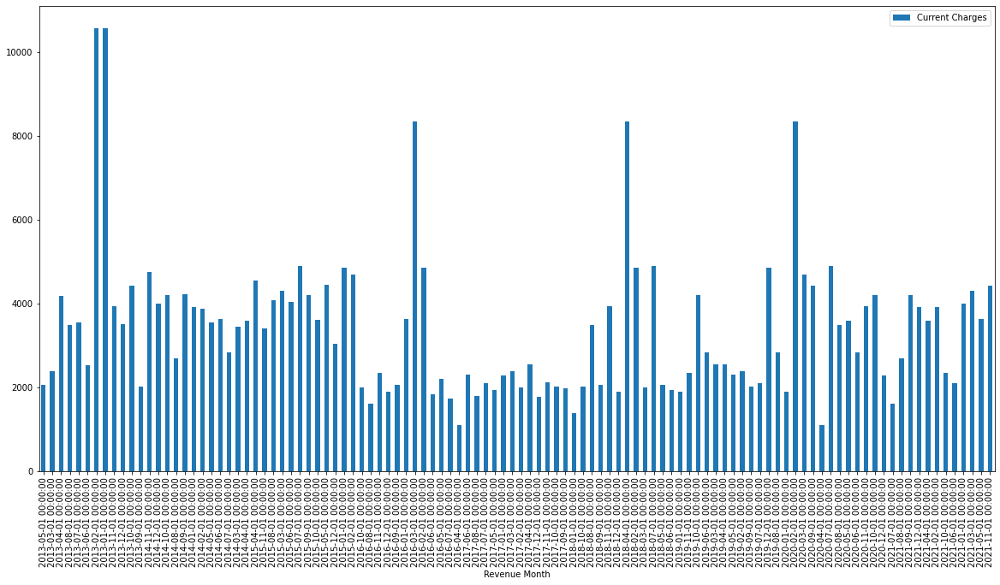

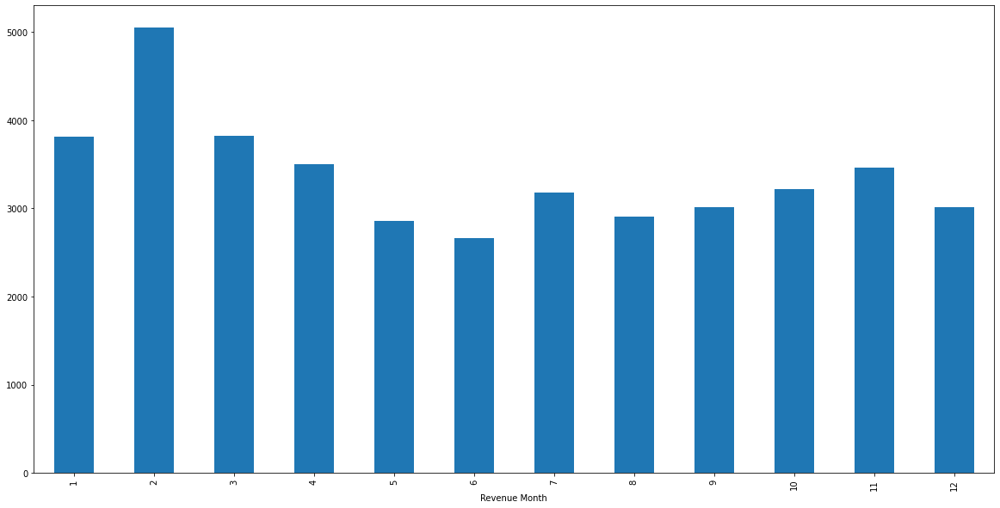

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  O78590242
For Consumption: 


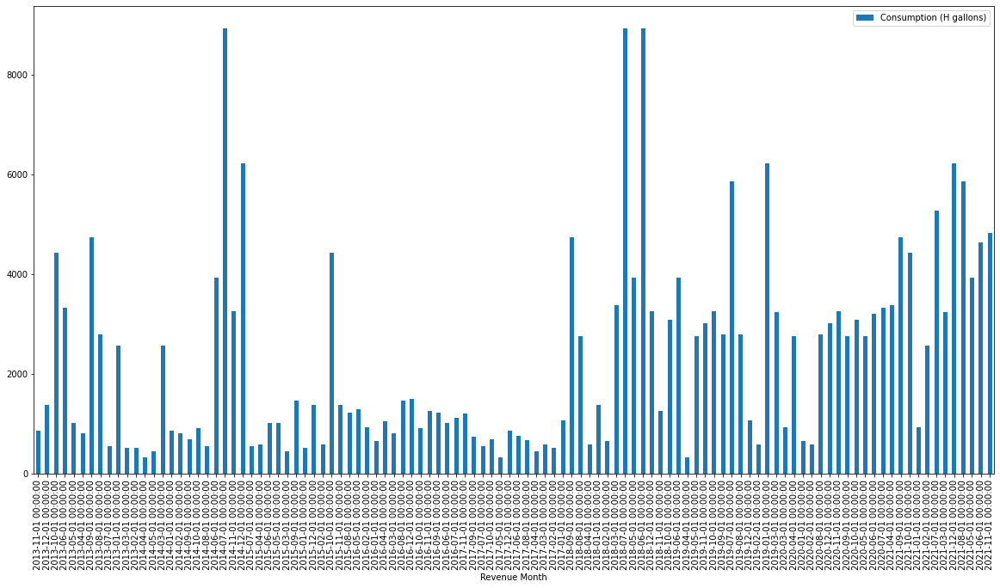

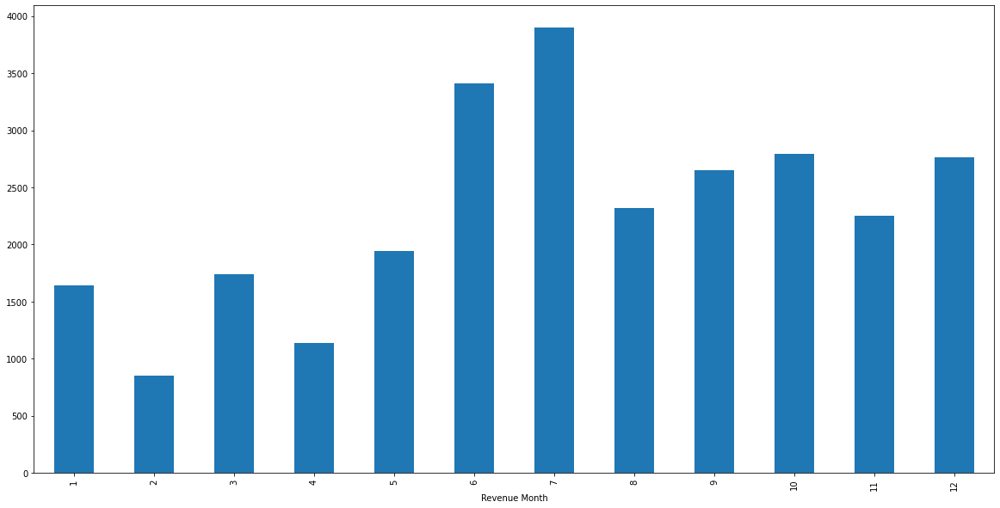

For Current Charges: 


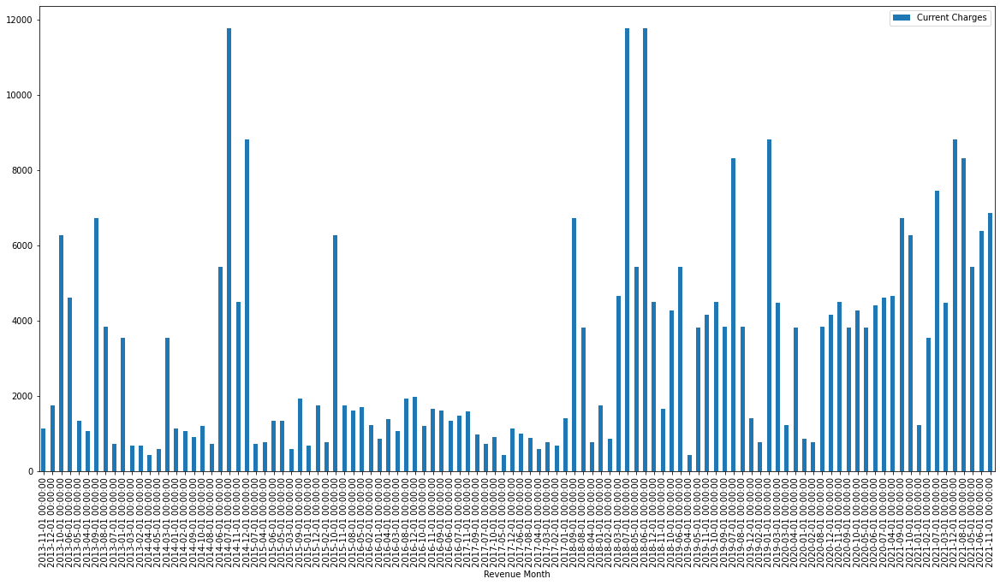

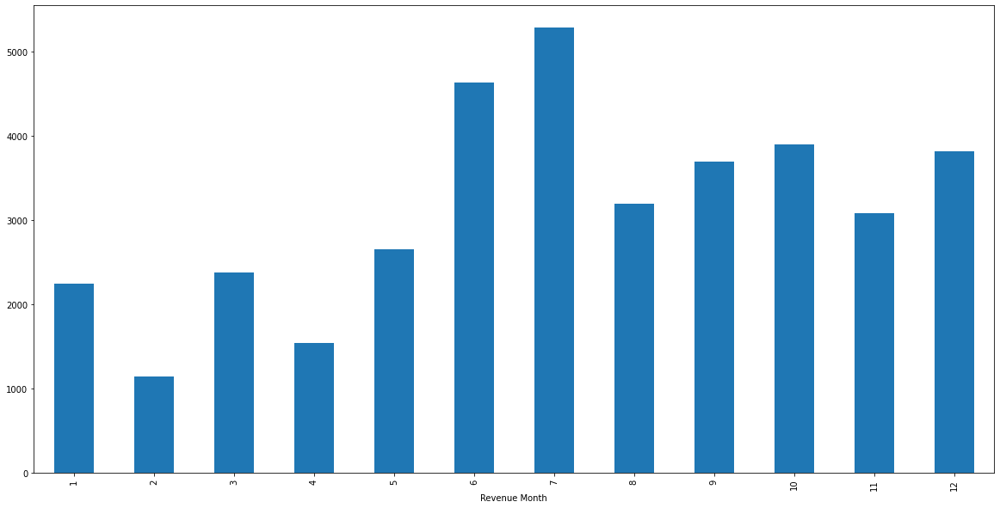

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  O78778150
For Consumption: 


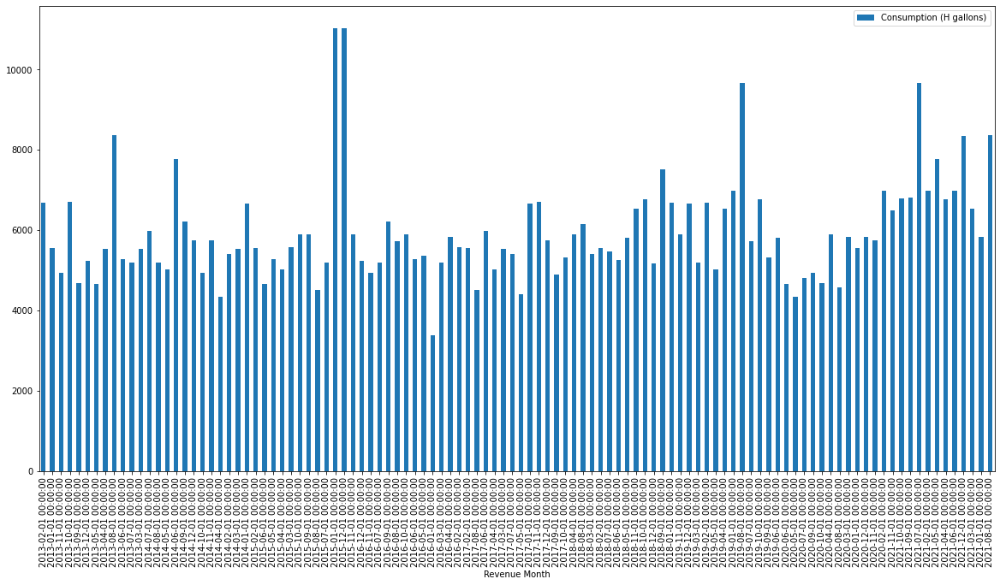

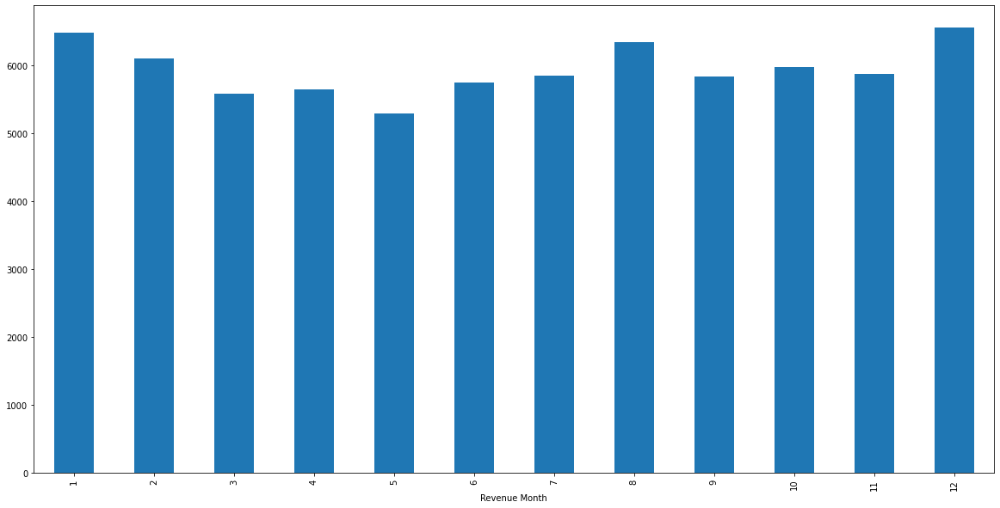

For Current Charges: 


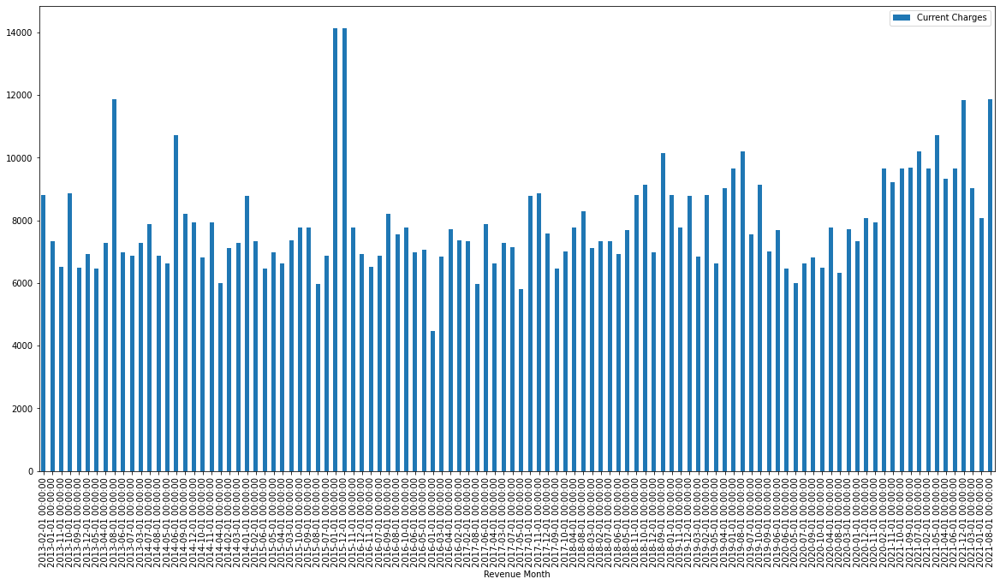

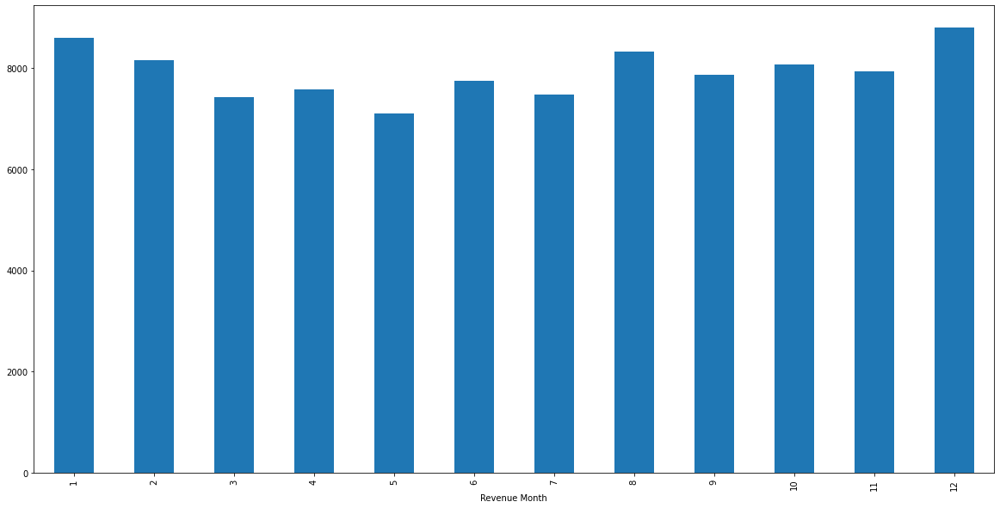

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K14211089
For Consumption: 


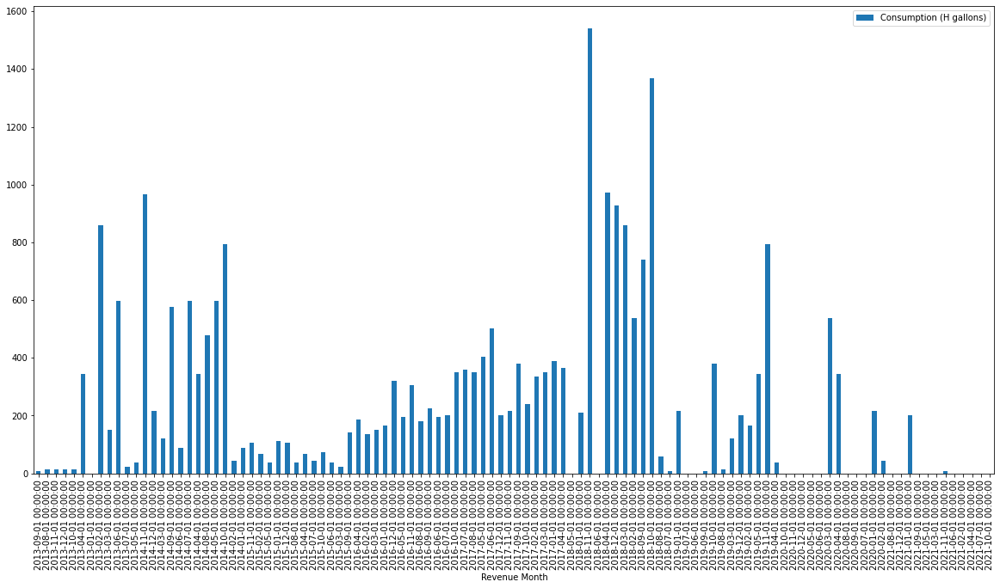

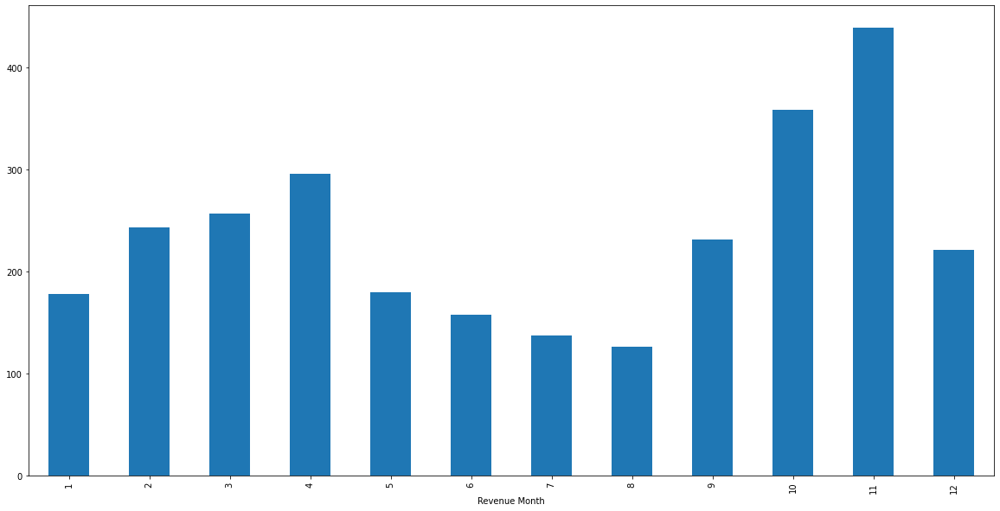

For Current Charges: 


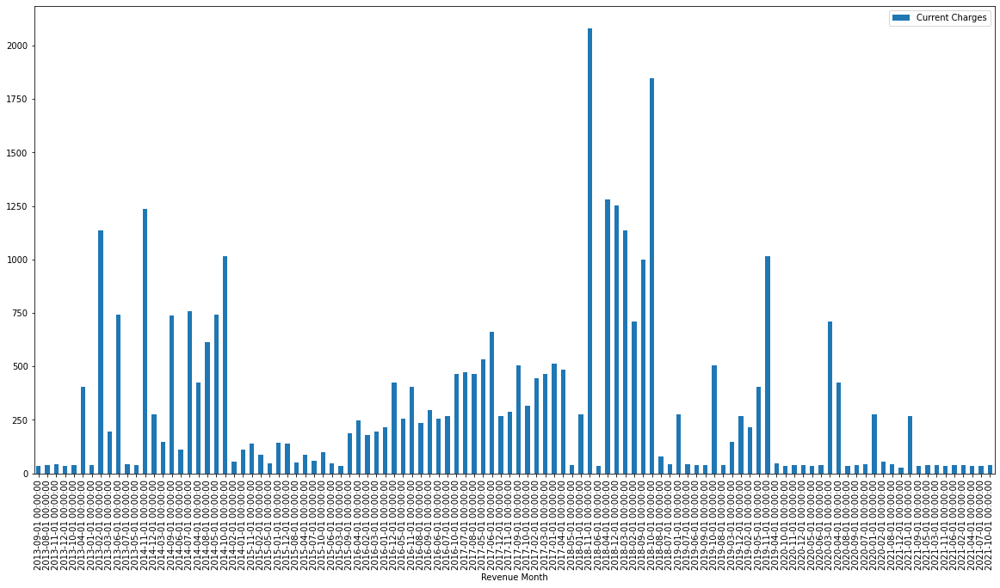

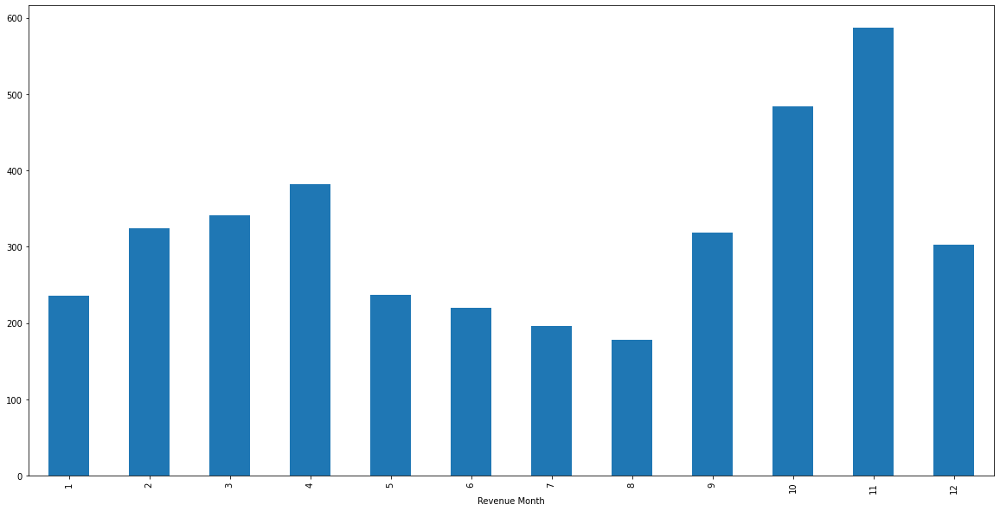

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  K10916574
For Consumption: 


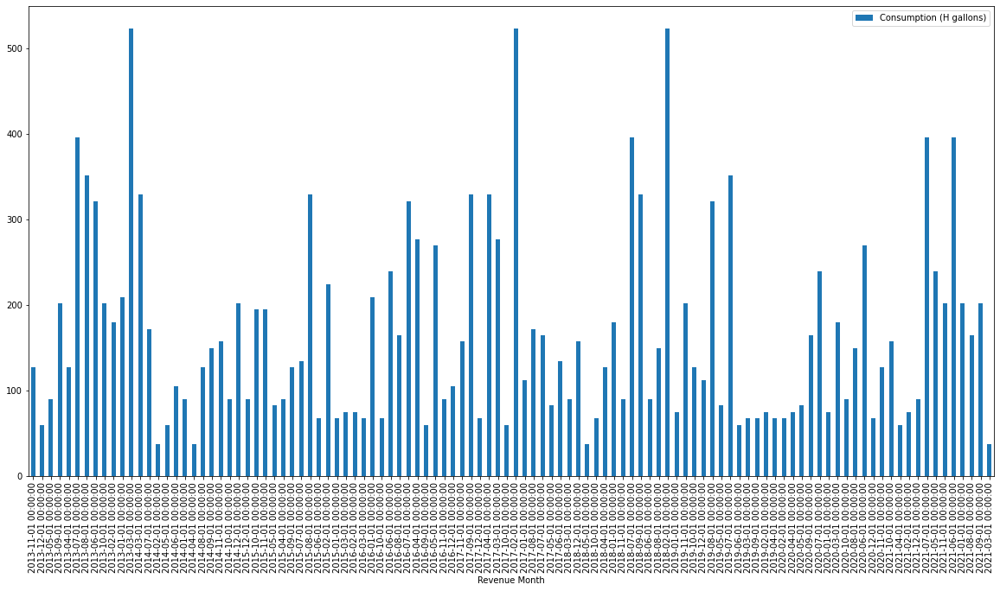

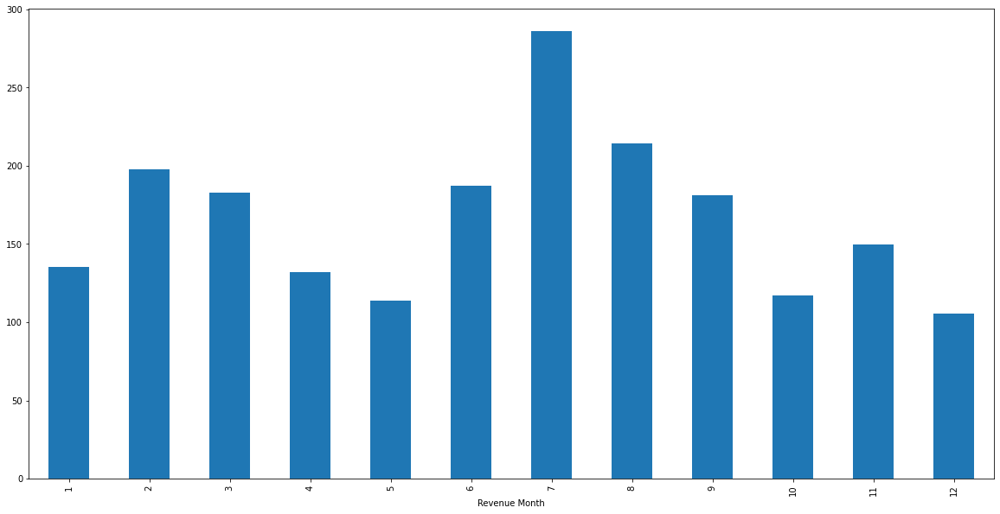

For Current Charges: 


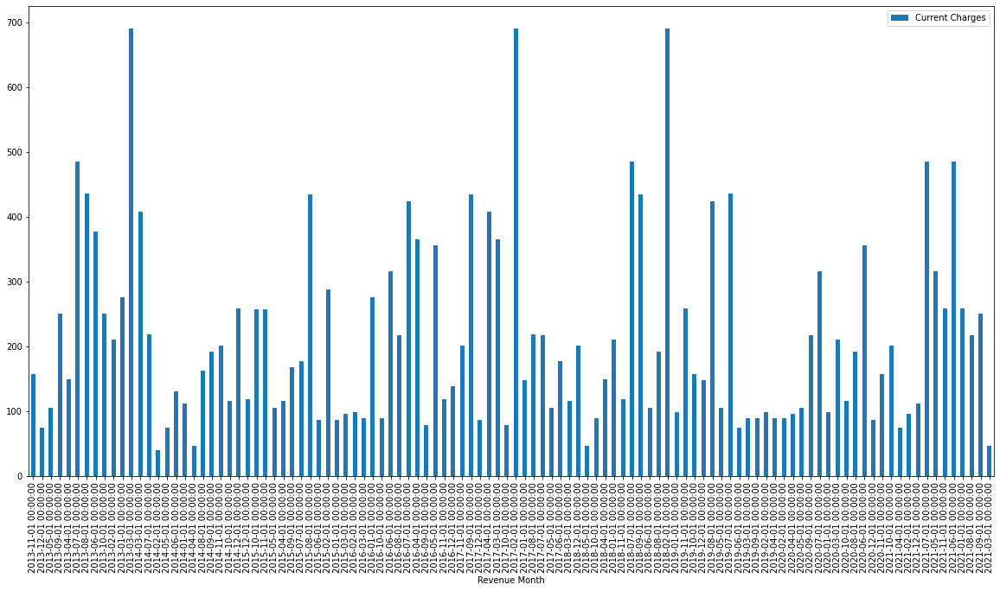

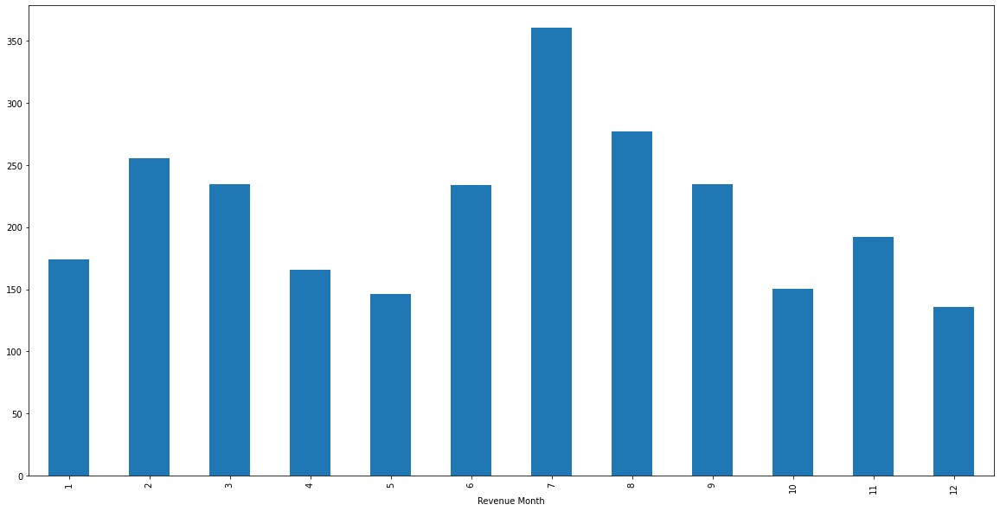

------------------------------------------------------------------------------------------------------------------------------------------------------
For Meter Number:  V52268797
For Consumption: 


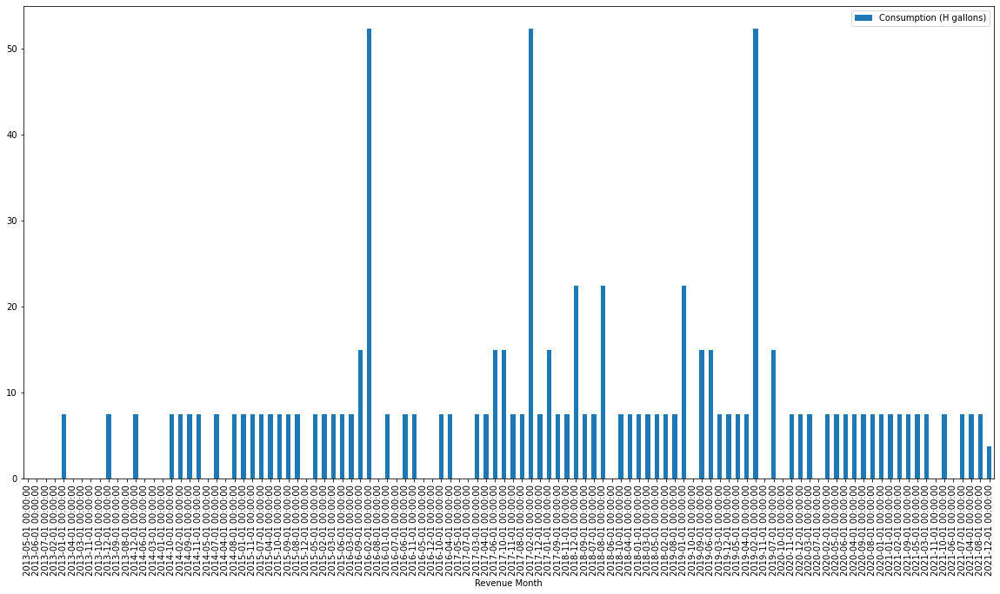

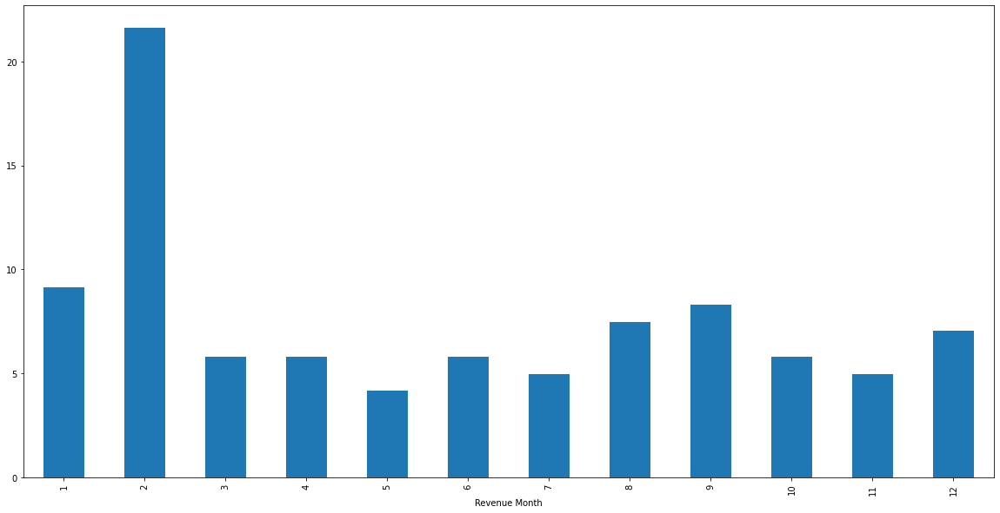

For Current Charges: 


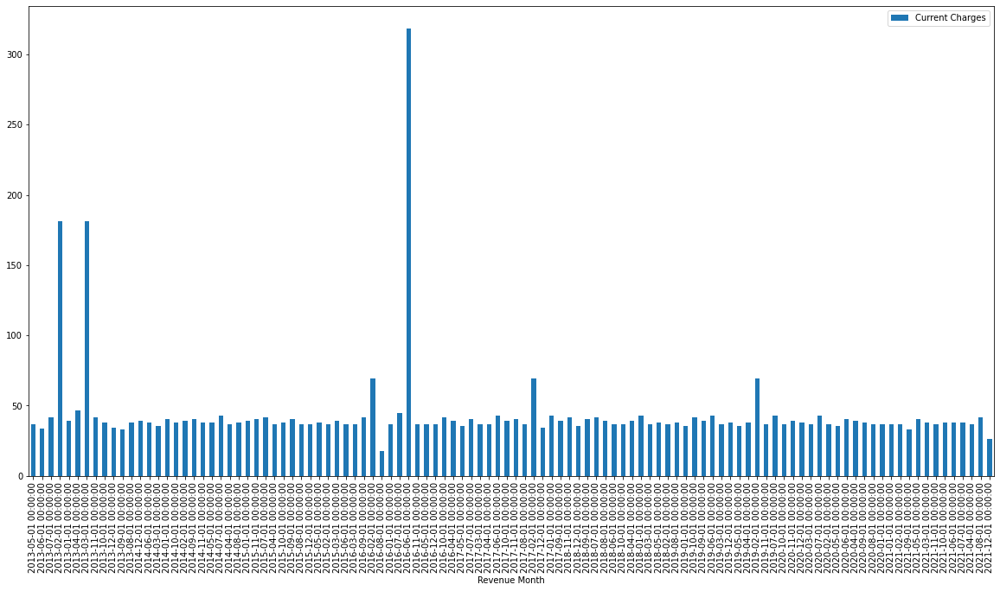

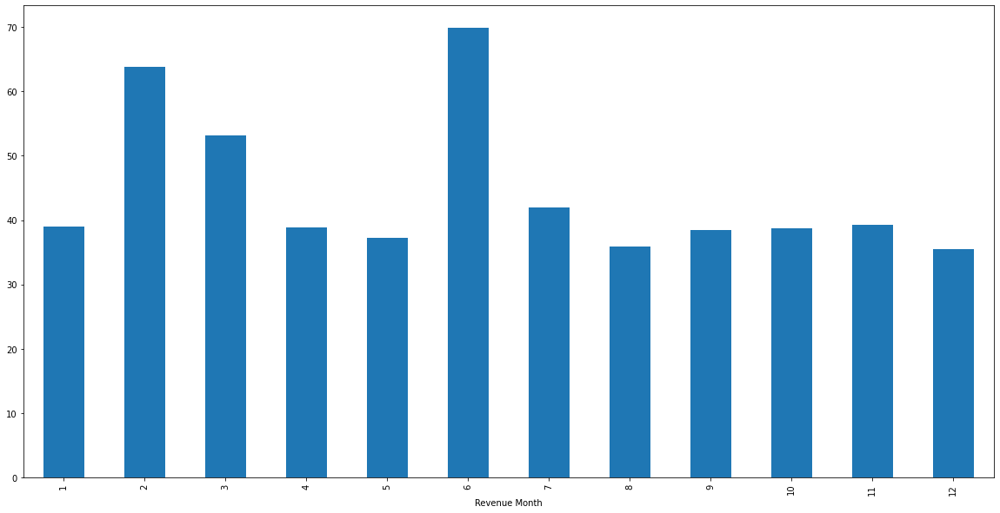

------------------------------------------------------------------------------------------------------------------------------------------------------


In [40]:
for i in range(len(uniqueMeterNumbers_f)):
    building_df = brooklyn_imp_df_h.loc[brooklyn_imp_df_h['Meter Number']==uniqueMeterNumbers_f[i]]
    print('For Meter Number: ',uniqueMeterNumbers_f[i])
    print('For Consumption: ')
    building_df_consumption_mean = building_df.groupby(building_df['Revenue Month'].dt.month)['Consumption (H gallons)'].mean()
    building_df.plot.bar(x="Revenue Month", y="Consumption (H gallons)")
    plt.show()
    building_df_consumption_mean.plot.bar(x="Revenue Month", y="Consumption (H gallons)")
    plt.show()
    print('For Current Charges: ')
    building_df_current_Charges_mean = building_df.groupby(building_df['Revenue Month'].dt.month)['Current Charges'].mean()
    building_df.plot.bar(x="Revenue Month", y="Current Charges")
    plt.show()
    building_df_current_Charges_mean.plot.bar(x="Revenue Month", y="Current Charges")
    plt.show()
    print('-'*150)

In [41]:
building_df = brooklyn_imp_df_h.loc[brooklyn_imp_df_h['Meter Number']== 'V31987647']
building_df

,Meter Number,Revenue Month,Current Charges,Consumption (H gallons),Normal Consumption,Normal Charges,month,year


**N. Corelation**

For Meter Number:  V31959109 and  V31960320
Consumption: 


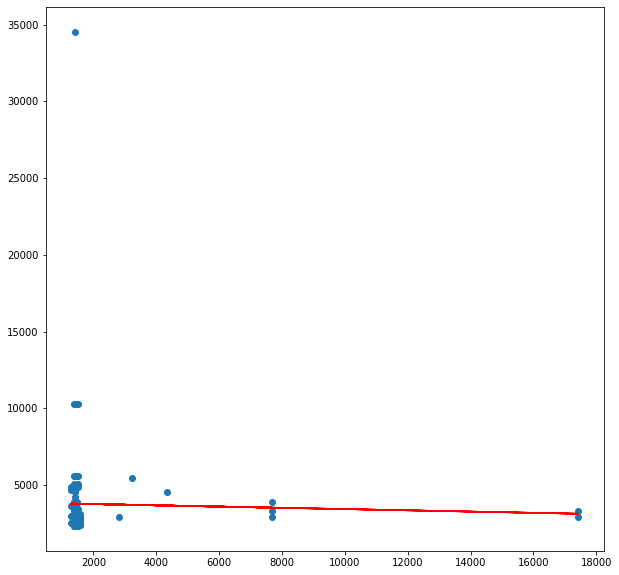

The corelation between twobuilding is:  0.11871213205788368
Current Charges: 


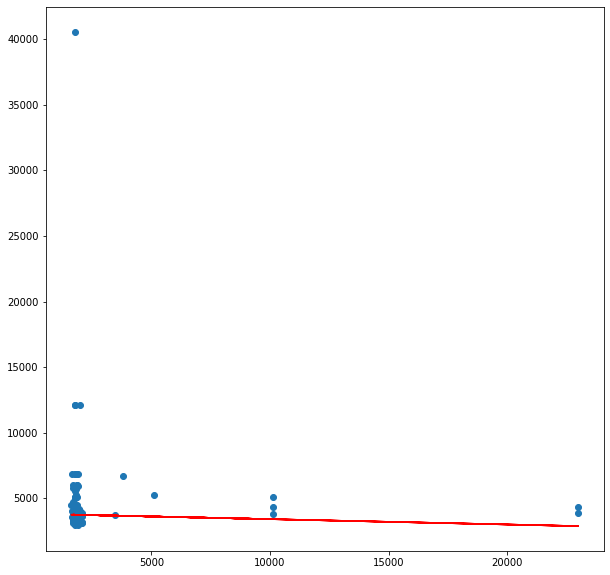

The corelation between two building is:  0.11526897324211931
----------------------------------------------------------------------------------------------------
For Meter Number:  V31960320 and  K14164112
Consumption: 


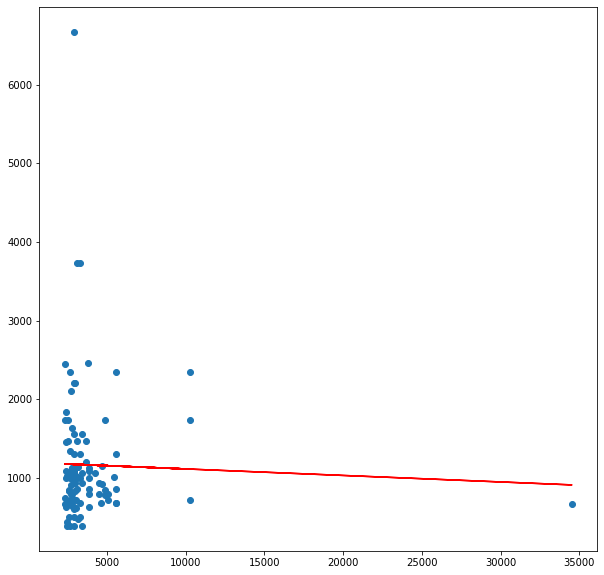

The corelation between twobuilding is:  0.09925383404026186
Current Charges: 


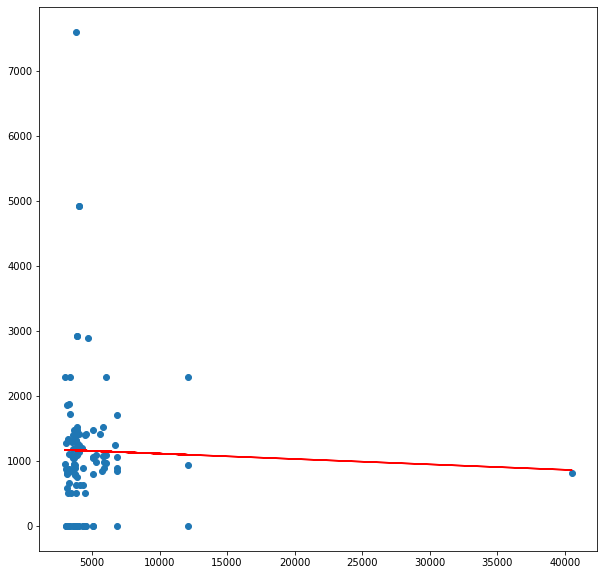

The corelation between two building is:  0.06283519454262619
----------------------------------------------------------------------------------------------------
For Meter Number:  K14164112 and  K94606993
Consumption: 


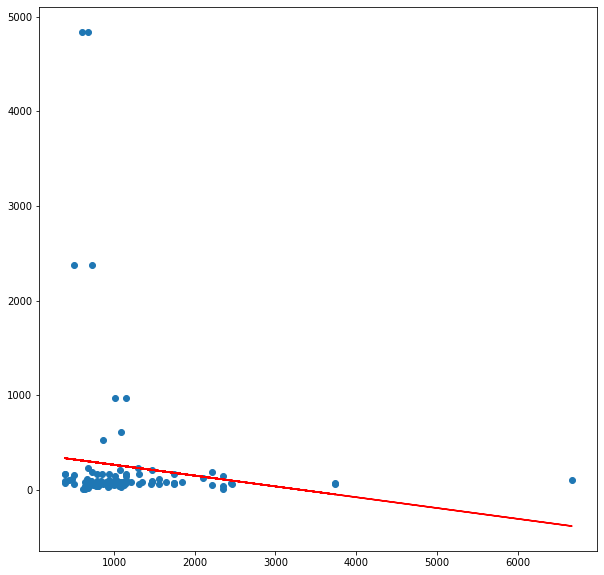

The corelation between twobuilding is:  -0.10561119291528326
Current Charges: 


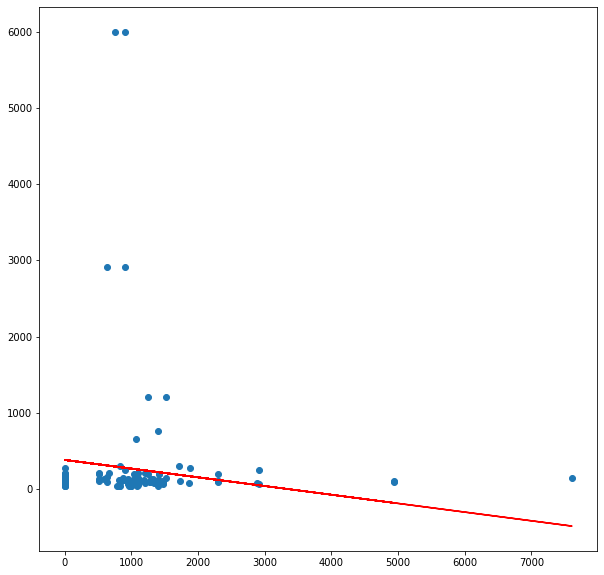

The corelation between two building is:  -0.06876972007409508
----------------------------------------------------------------------------------------------------
For Meter Number:  K94606993 and  H07052143
Consumption: 


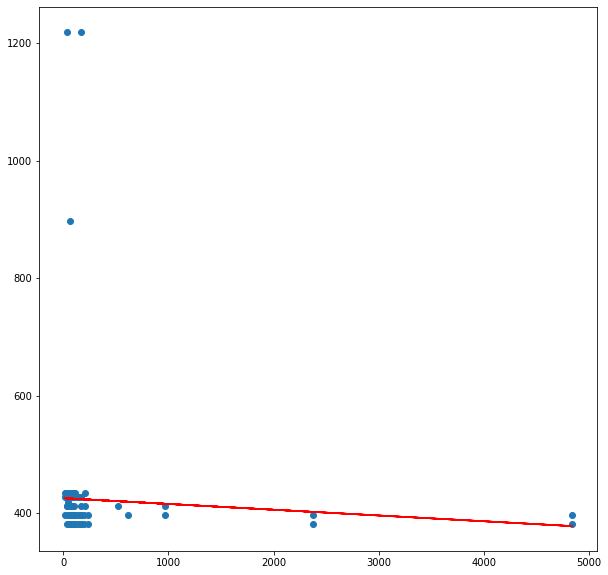

The corelation between twobuilding is:  -0.05203612761388811
Current Charges: 


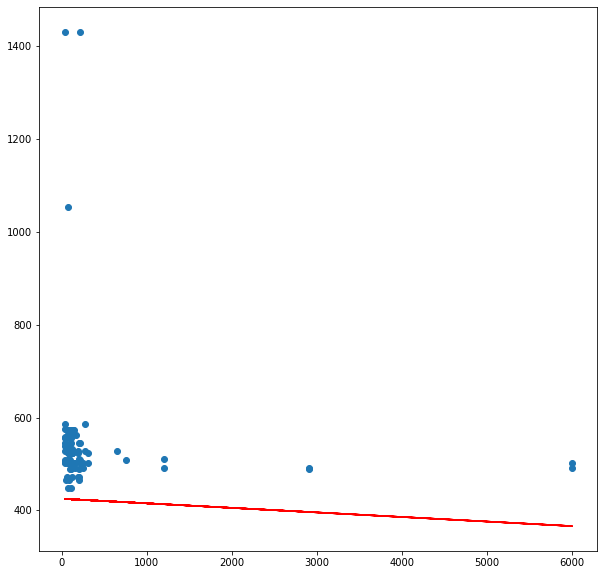

The corelation between two building is:  -0.06852828603805272
----------------------------------------------------------------------------------------------------
For Meter Number:  H07052143 and  E99343083
Consumption: 


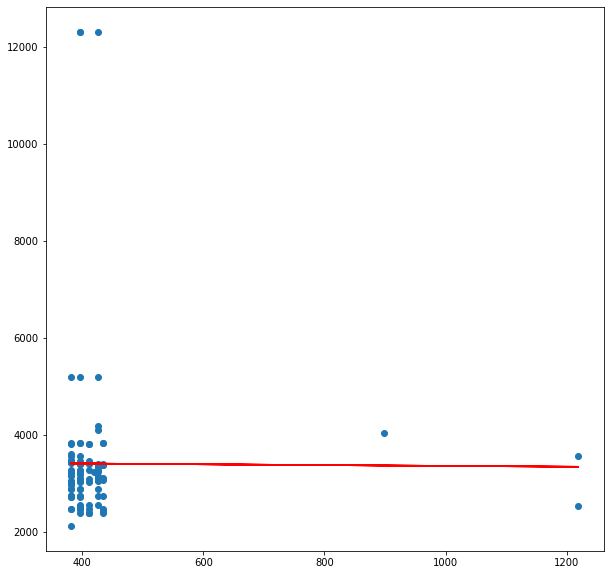

The corelation between twobuilding is:  0.3696903260773123
Current Charges: 


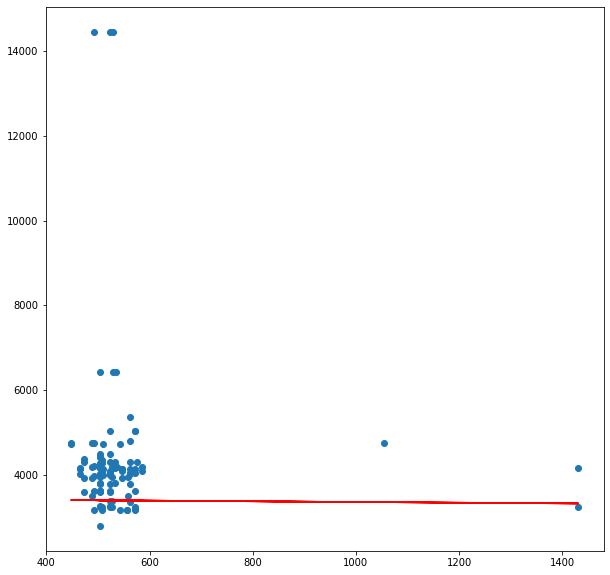

The corelation between two building is:  0.36544985097212696
----------------------------------------------------------------------------------------------------
For Meter Number:  E99343083 and  V84009581
Consumption: 


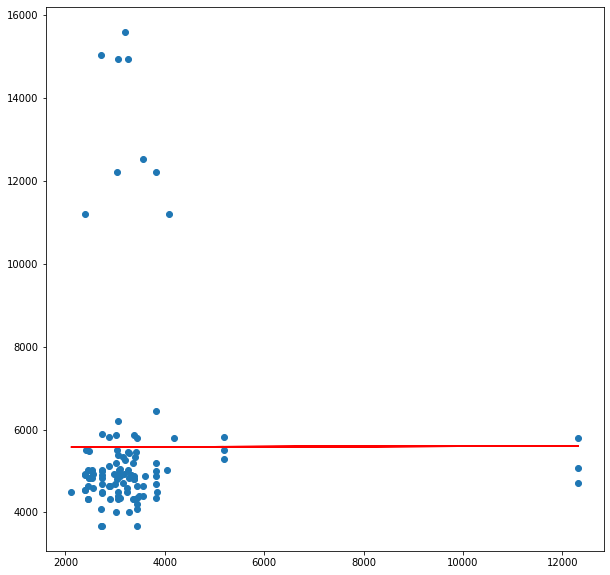

The corelation between twobuilding is:  0.01282961831787719
Current Charges: 


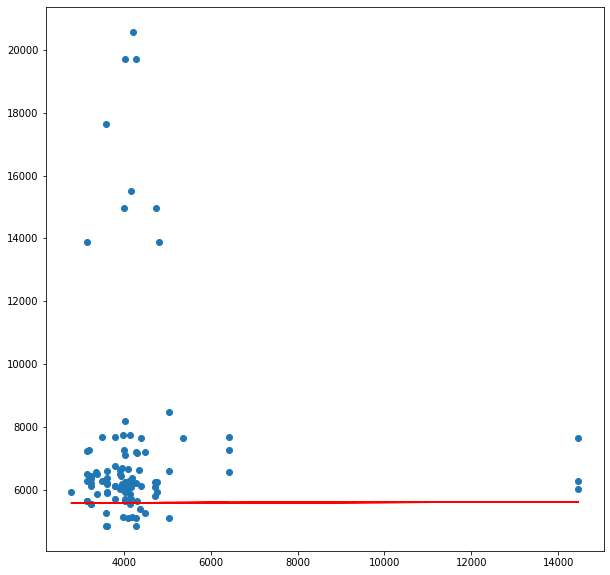

The corelation between two building is:  0.00630098802279954
----------------------------------------------------------------------------------------------------
For Meter Number:  V84009581 and  V84009832
Consumption: 


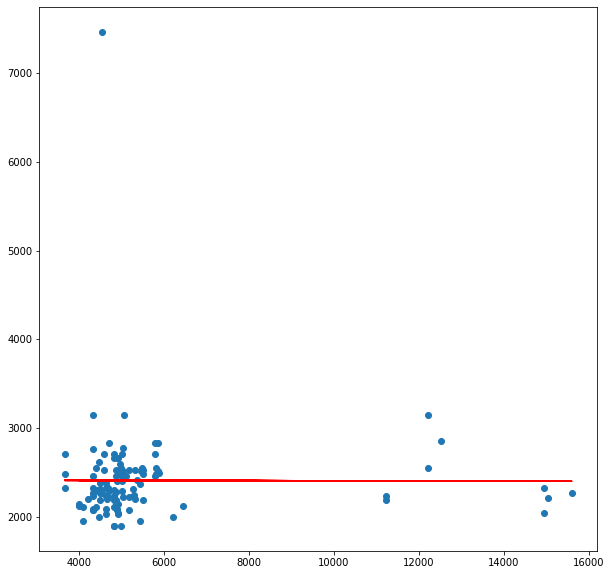

The corelation between twobuilding is:  0.021045982874389073
Current Charges: 


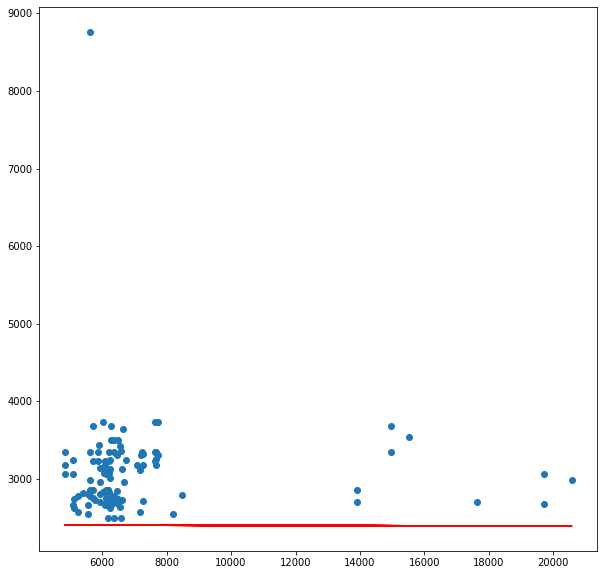

The corelation between two building is:  0.0007940154179799774
----------------------------------------------------------------------------------------------------
For Meter Number:  V84009832 and  E19238750
Consumption: 


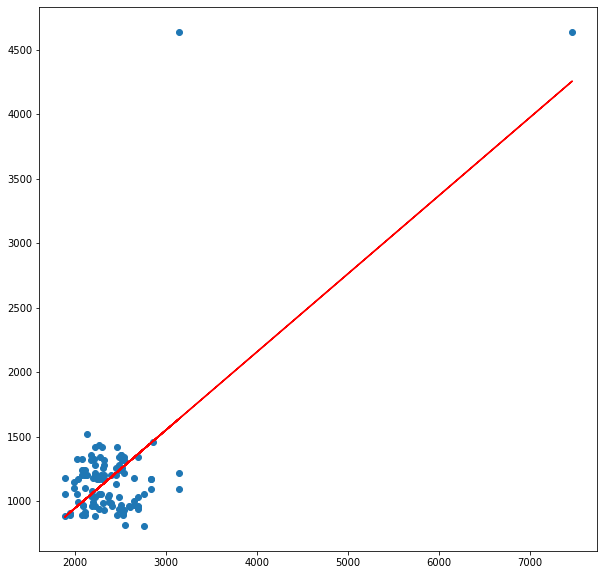

The corelation between twobuilding is:  0.18076400065867407
Current Charges: 


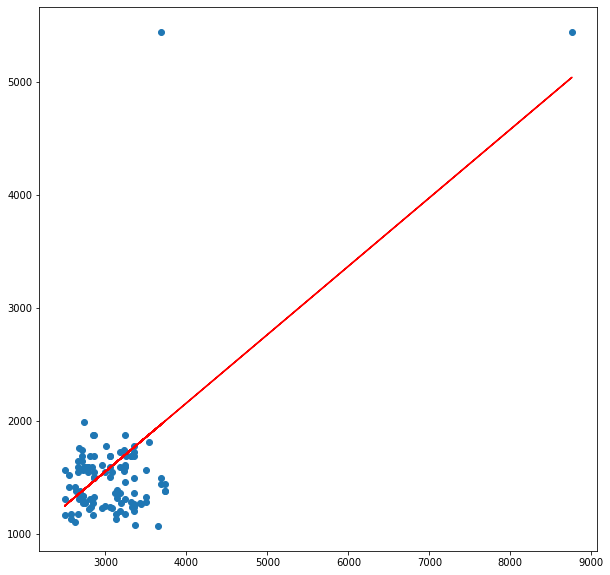

The corelation between two building is:  0.12660689183654733
----------------------------------------------------------------------------------------------------
For Meter Number:  E19238750 and  O77816972
Consumption: 


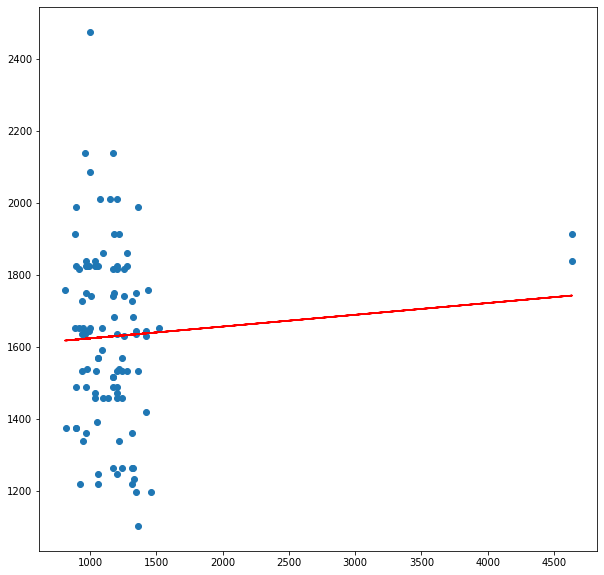

The corelation between twobuilding is:  -0.09117624998562164
Current Charges: 


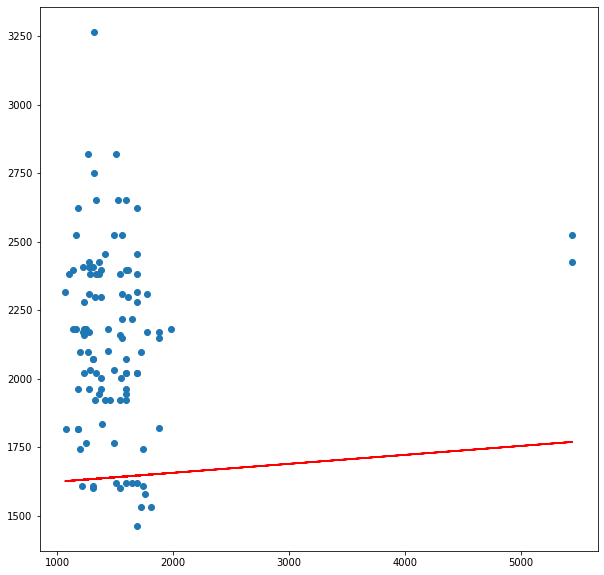

The corelation between two building is:  -0.09831813046117434
----------------------------------------------------------------------------------------------------
For Meter Number:  O77816972 and  I15001931
Consumption: 


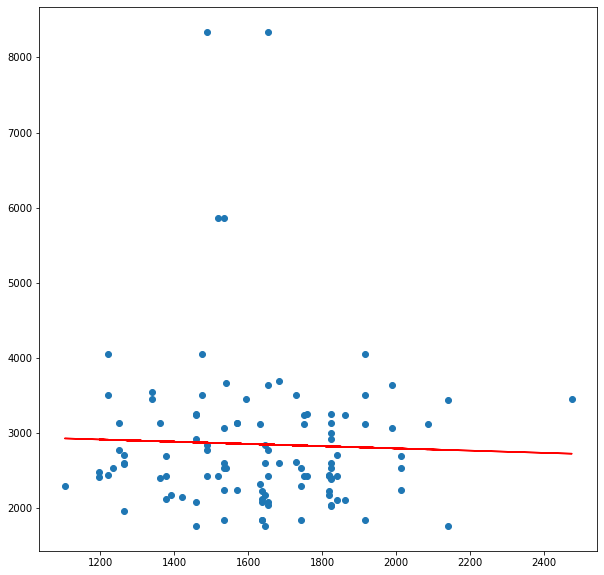

The corelation between twobuilding is:  0.15792500192346248
Current Charges: 


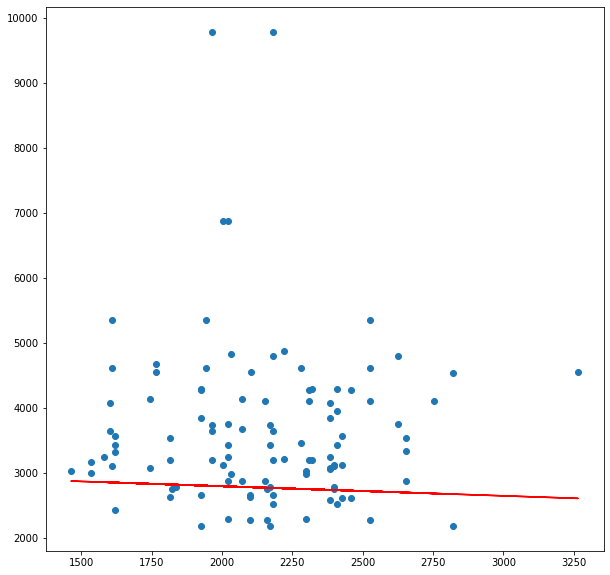

The corelation between two building is:  0.15134335171450944
----------------------------------------------------------------------------------------------------
For Meter Number:  I15001931 and  V83033257
Consumption: 


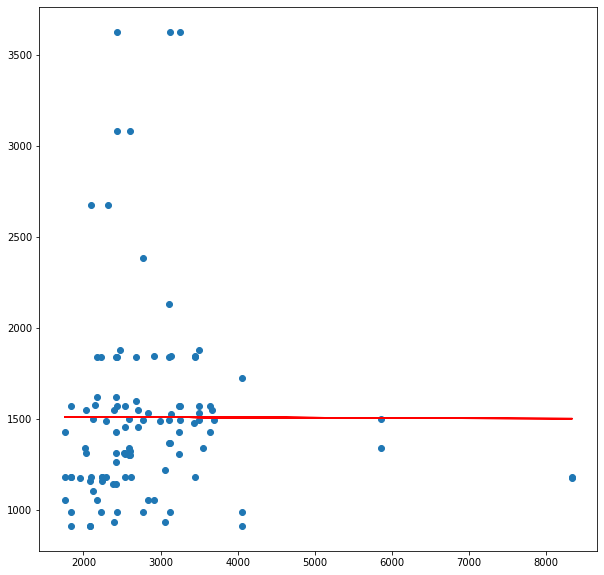

The corelation between twobuilding is:  0.023940631855163413
Current Charges: 


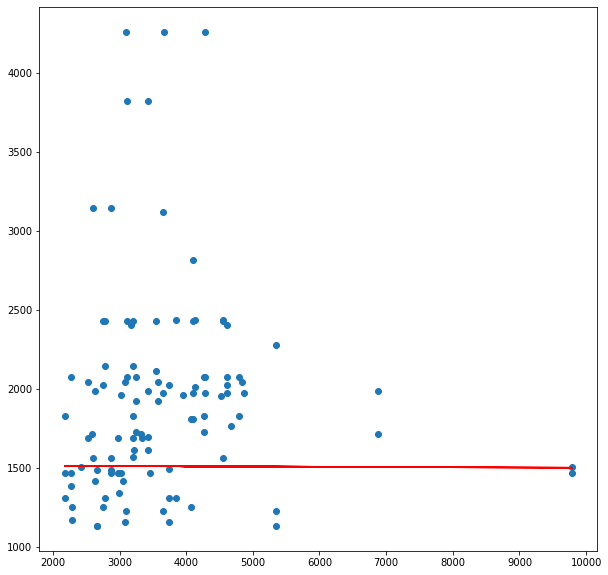

The corelation between two building is:  0.049230050761912864
----------------------------------------------------------------------------------------------------
For Meter Number:  V83033257 and  E20527605
Consumption: 


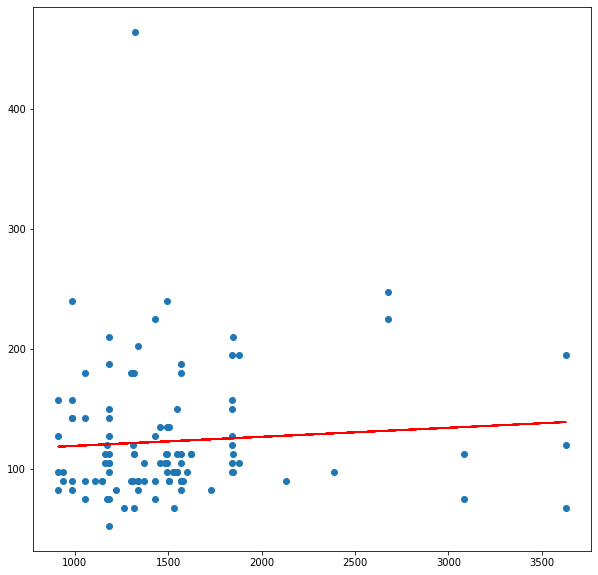

The corelation between twobuilding is:  0.05200784089633121
Current Charges: 


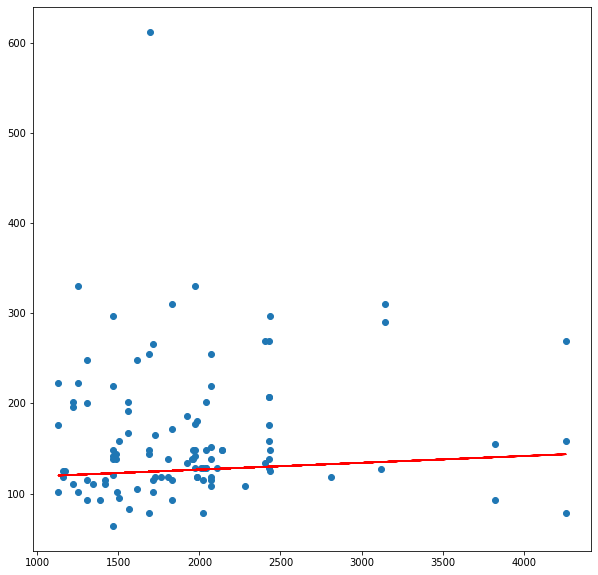

The corelation between two building is:  0.0697908102155983
----------------------------------------------------------------------------------------------------
For Meter Number:  E20527605 and  E20290493
Consumption: 


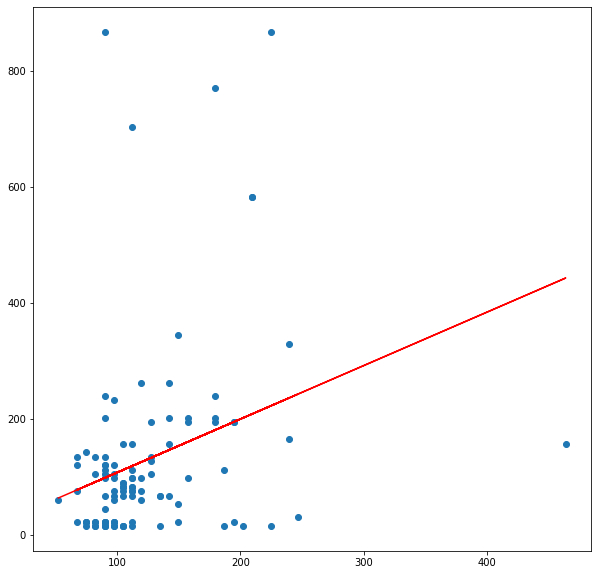

The corelation between twobuilding is:  0.177213333743556
Current Charges: 


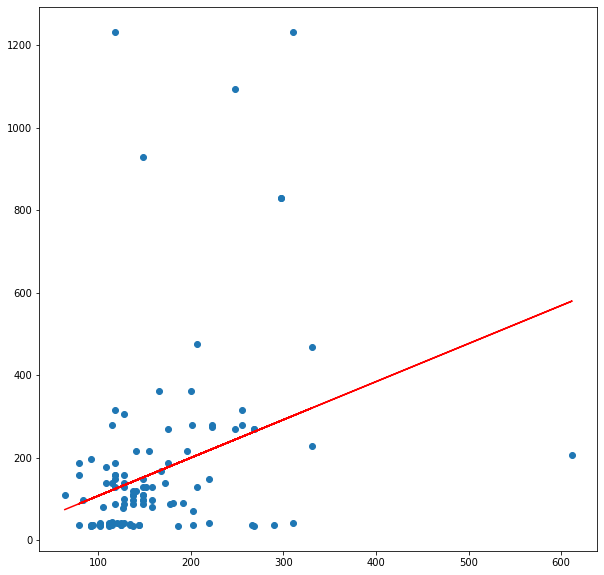

The corelation between two building is:  0.2217832613511313
----------------------------------------------------------------------------------------------------
For Meter Number:  E20290493 and  E22317869
Consumption: 


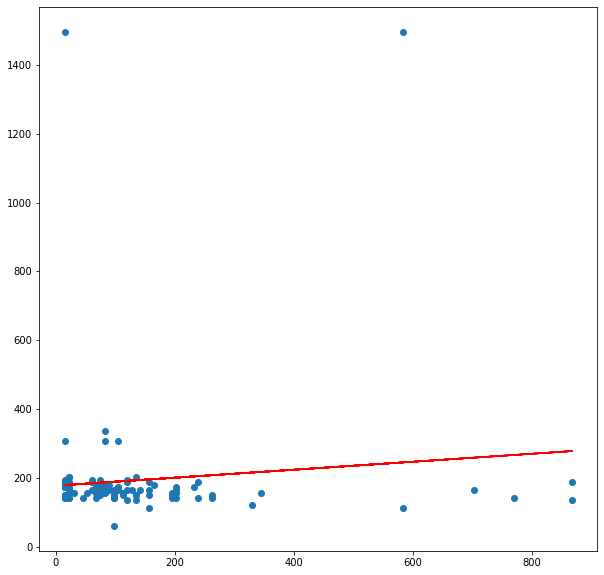

The corelation between twobuilding is:  0.0983348477156145
Current Charges: 


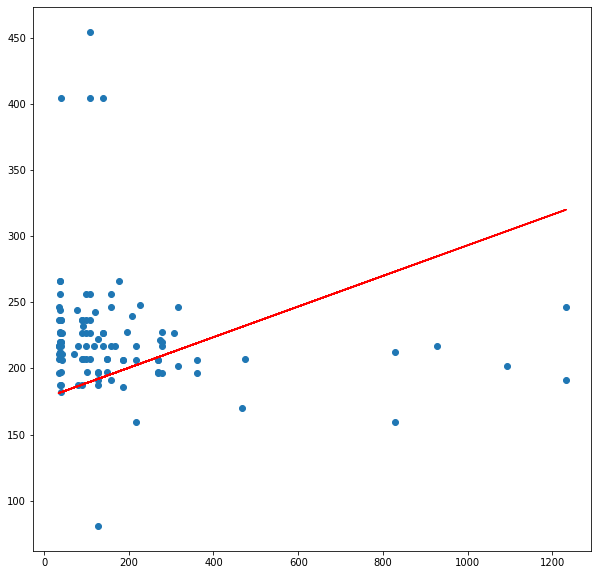

The corelation between two building is:  -0.17192536395013072
----------------------------------------------------------------------------------------------------
For Meter Number:  E22317869 and  E20372610
Consumption: 


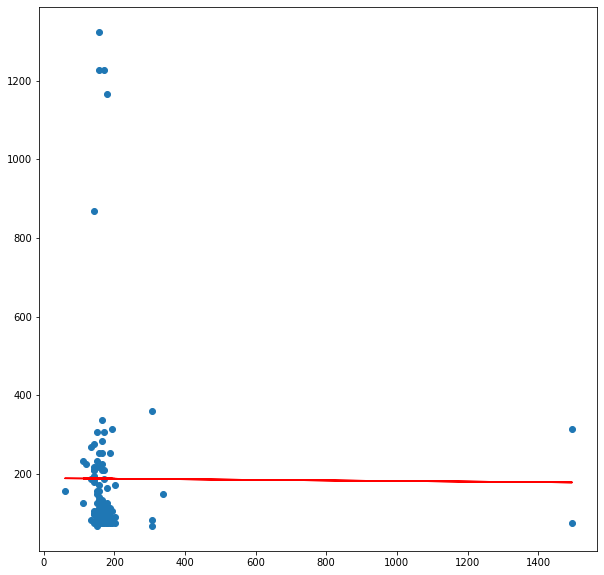

The corelation between twobuilding is:  -0.036115185322328054
Current Charges: 


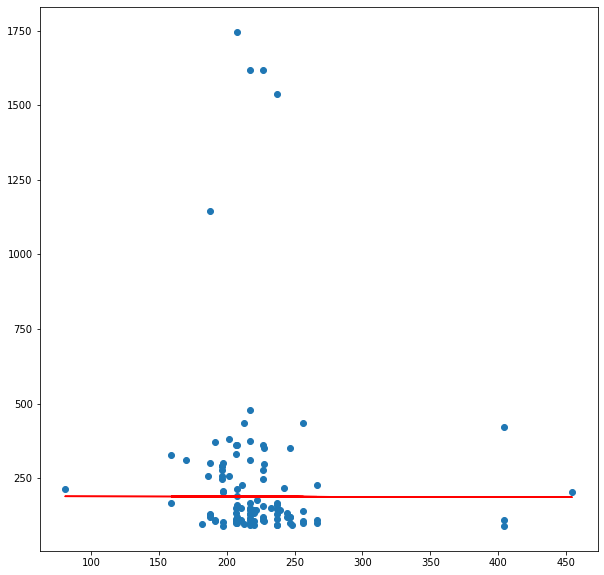

The corelation between two building is:  -0.059983620687044784
----------------------------------------------------------------------------------------------------
For Meter Number:  E20372610 and  E20290494
Consumption: 


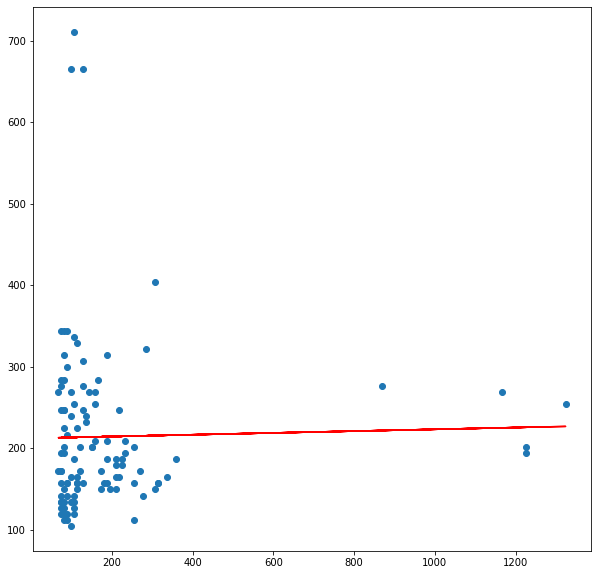

The corelation between twobuilding is:  0.09659910861505644
Current Charges: 


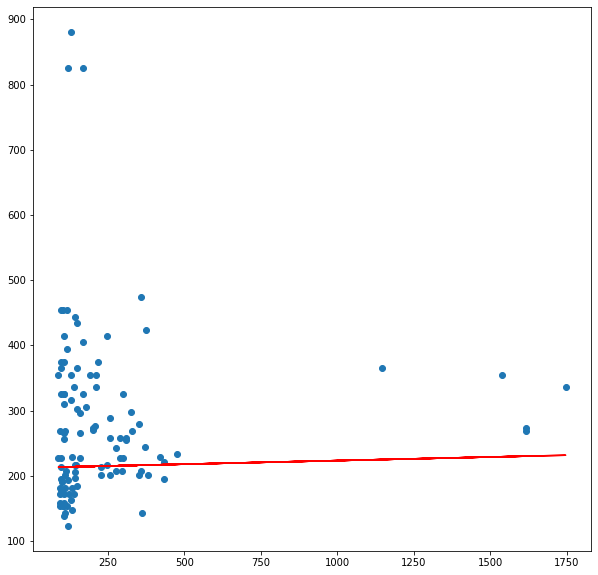

The corelation between two building is:  0.10972373919429752
----------------------------------------------------------------------------------------------------
For Meter Number:  E20290494 and  E20453242
Consumption: 


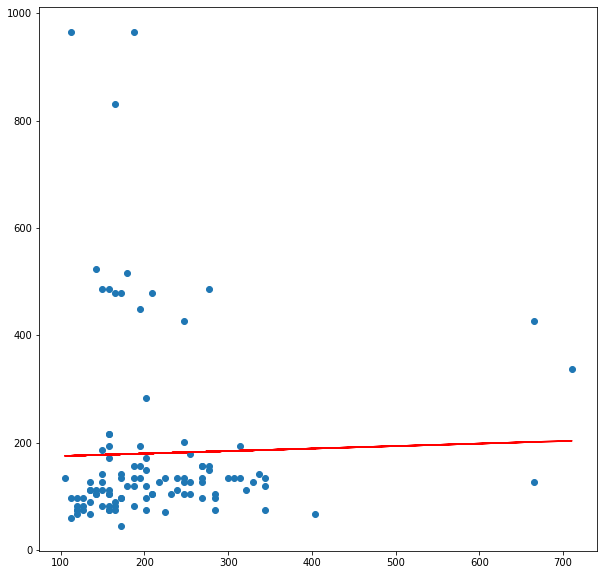

The corelation between twobuilding is:  -0.09134040861952936
Current Charges: 


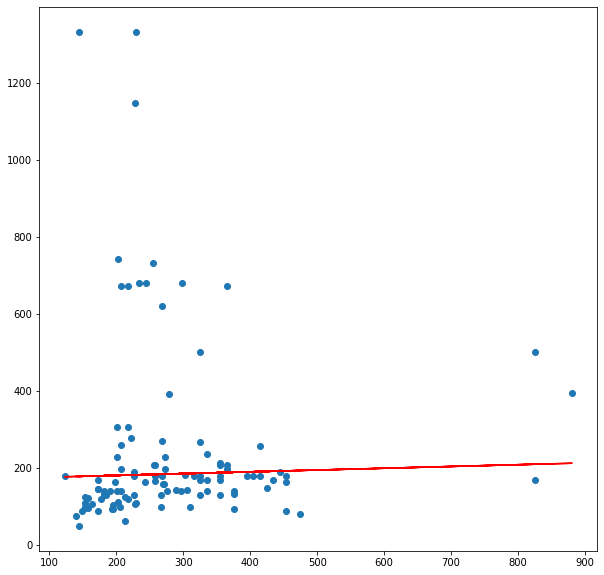

The corelation between two building is:  -0.07318279329965985
----------------------------------------------------------------------------------------------------
For Meter Number:  E20453242 and  E20291369
Consumption: 


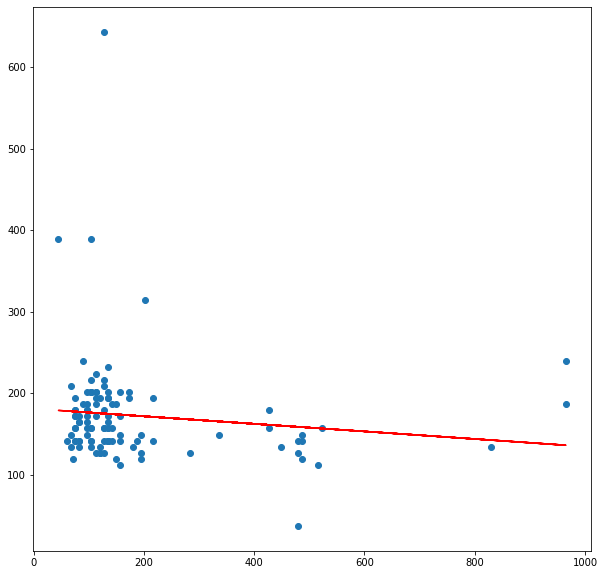

The corelation between twobuilding is:  -0.12180869965529412
Current Charges: 


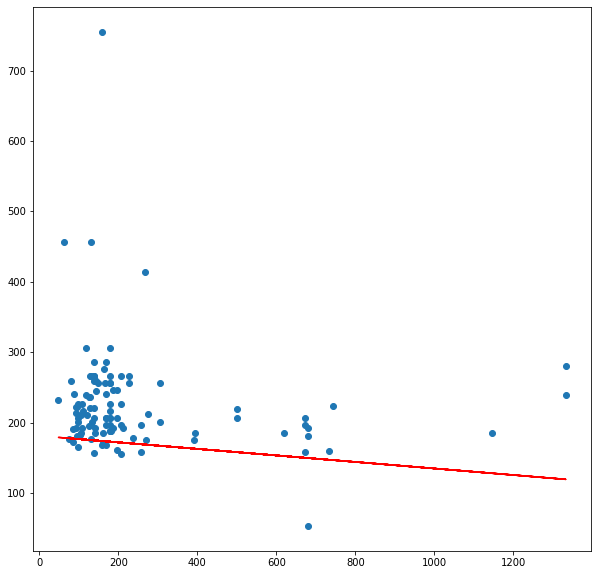

The corelation between two building is:  -0.11360107794432085
----------------------------------------------------------------------------------------------------
For Meter Number:  E20291369 and  E20290495
Consumption: 


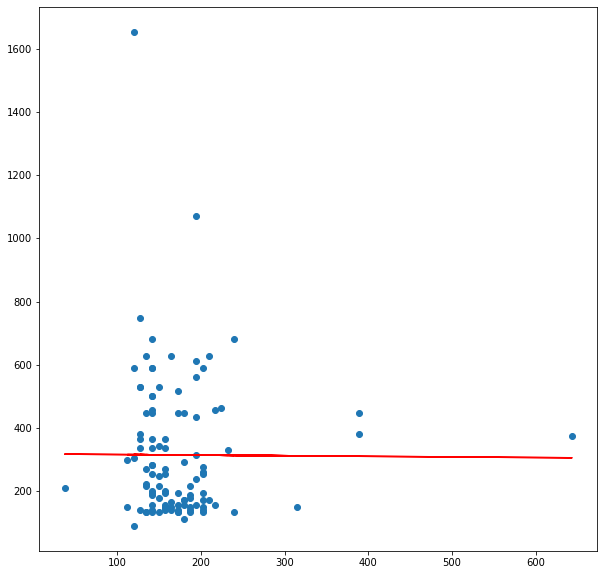

The corelation between twobuilding is:  0.11869960883130487
Current Charges: 


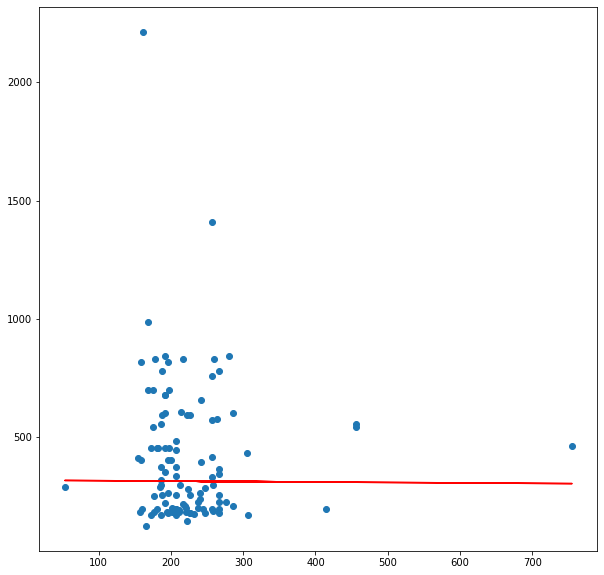

The corelation between two building is:  0.08312528697688361
----------------------------------------------------------------------------------------------------
For Meter Number:  E20290495 and  E20308398
Consumption: 


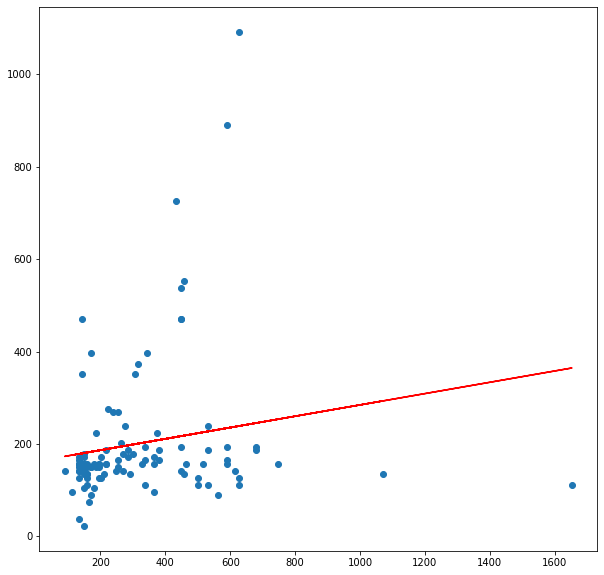

The corelation between twobuilding is:  0.10647473488042503
Current Charges: 


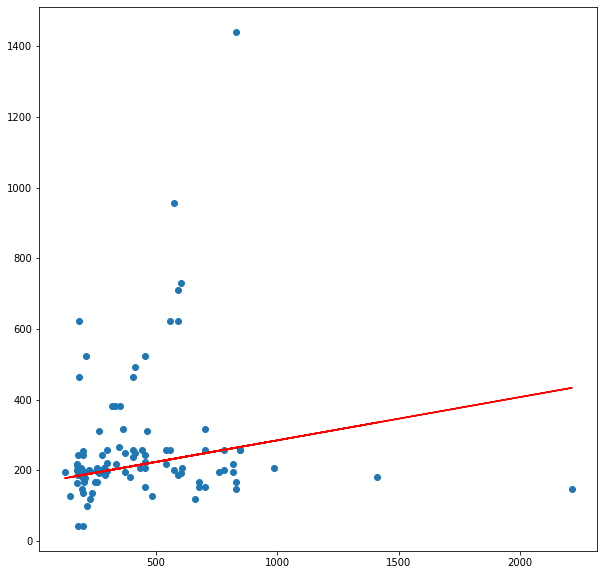

The corelation between two building is:  0.13994985308396926
----------------------------------------------------------------------------------------------------
For Meter Number:  E20308398 and  E20312472
Consumption: 


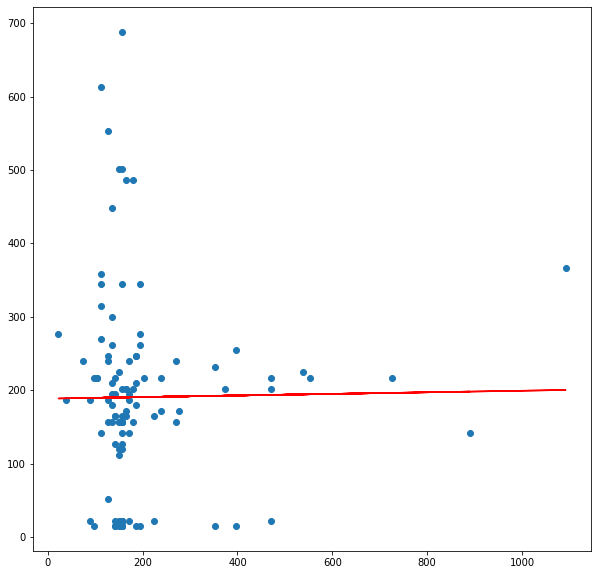

The corelation between twobuilding is:  0.08631784122481977
Current Charges: 


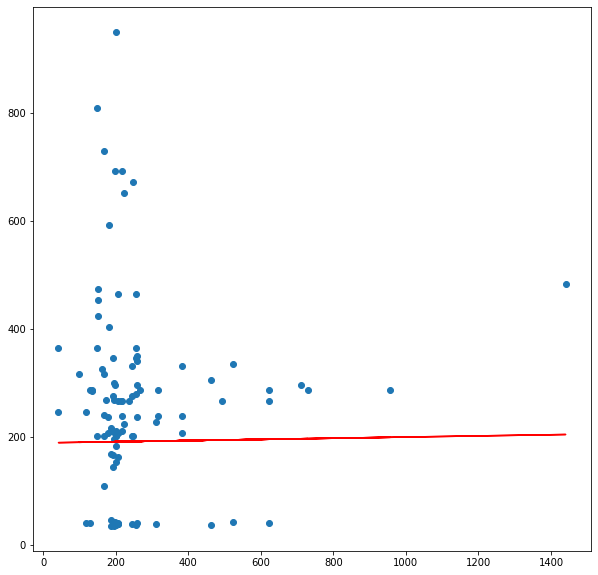

The corelation between two building is:  0.07975753424807377
----------------------------------------------------------------------------------------------------
For Meter Number:  E20312472 and  E20290492
Consumption: 


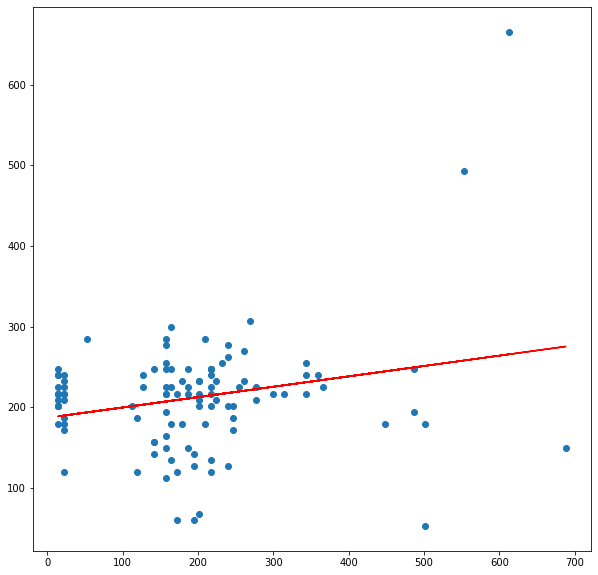

The corelation between twobuilding is:  0.07544946070085107
Current Charges: 


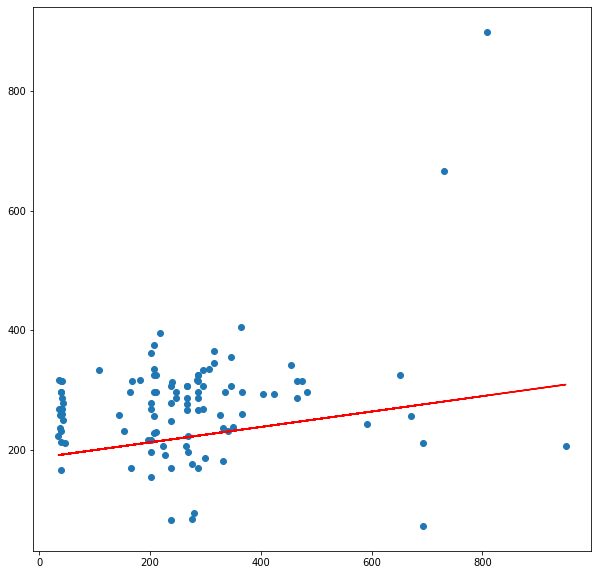

The corelation between two building is:  0.1218651423666153
----------------------------------------------------------------------------------------------------
For Meter Number:  E20290492 and  E20231894
Consumption: 


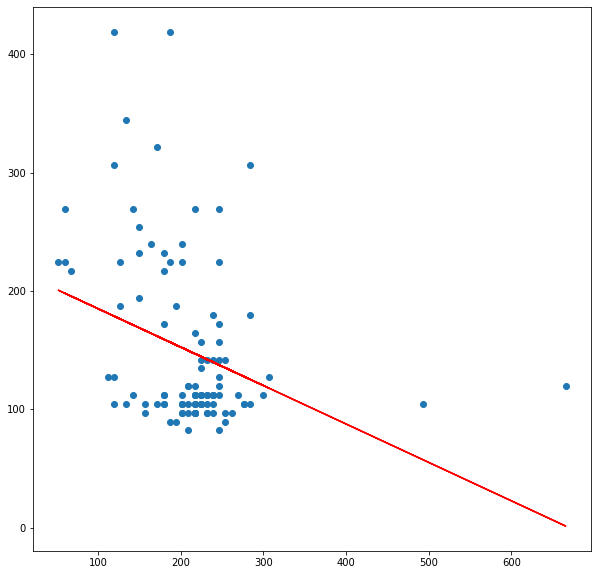

The corelation between twobuilding is:  -0.34108393037739415
Current Charges: 


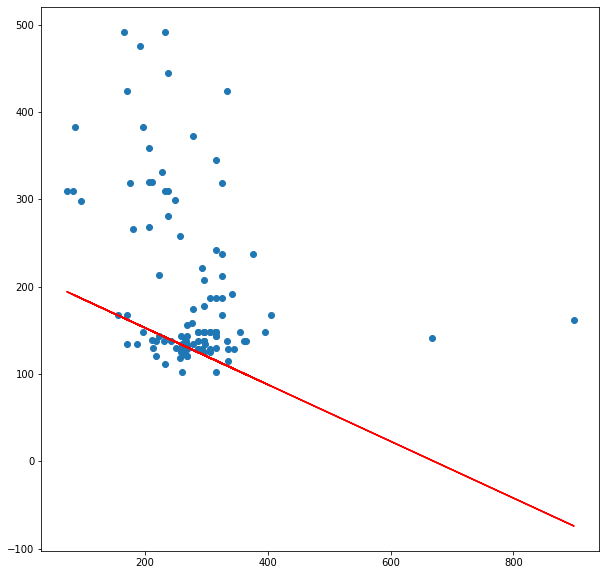

The corelation between two building is:  -0.32497013836187294
----------------------------------------------------------------------------------------------------
For Meter Number:  E20231894 and  E20179084
Consumption: 


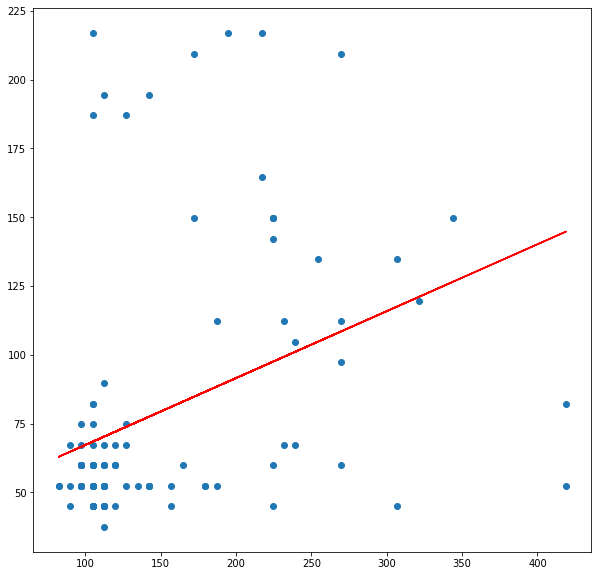

The corelation between twobuilding is:  0.6018060493756581
Current Charges: 


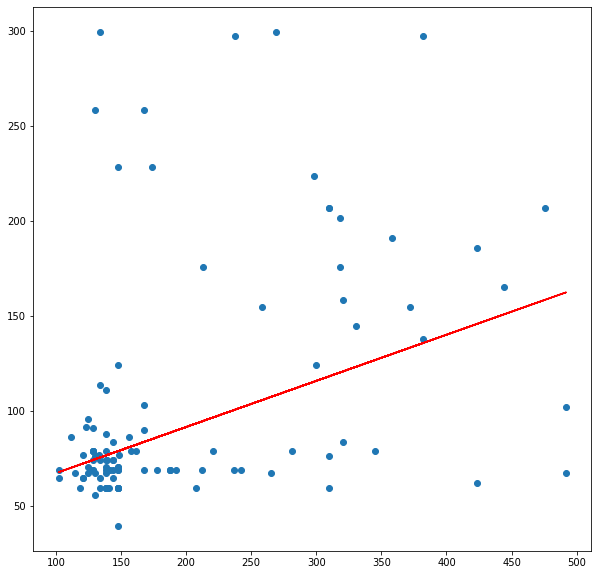

The corelation between two building is:  0.5827936216985385
----------------------------------------------------------------------------------------------------
For Meter Number:  E20179084 and  E20333760
Consumption: 


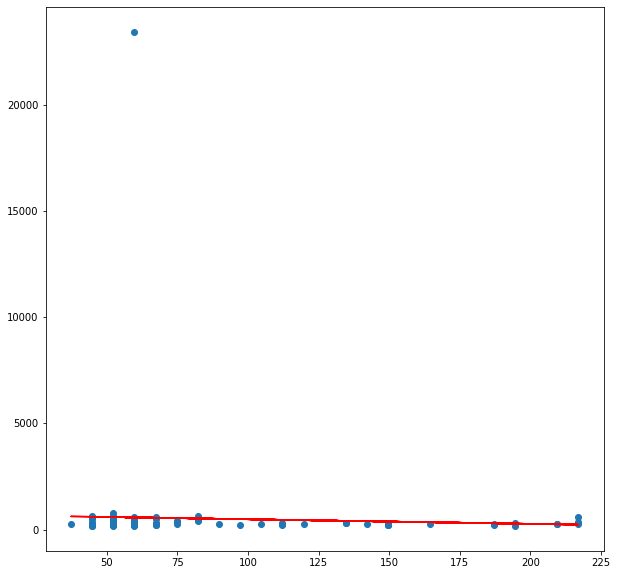

The corelation between twobuilding is:  -0.04061288706901237
Current Charges: 


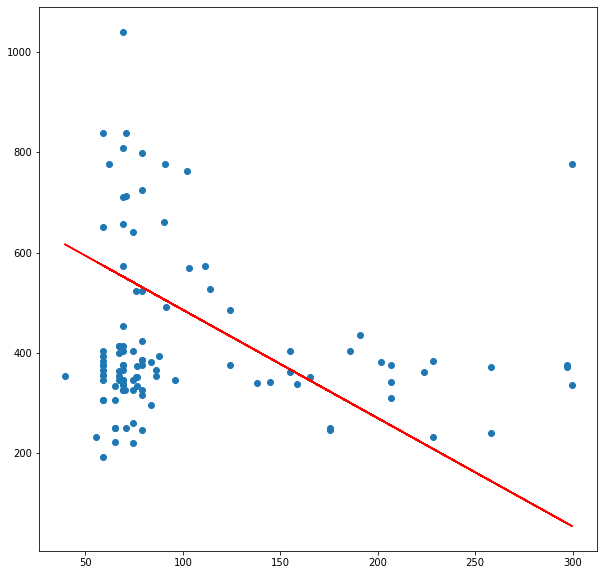

The corelation between two building is:  -0.0015785228702284461
----------------------------------------------------------------------------------------------------
For Meter Number:  E20333760 and  E21207684
Consumption: 


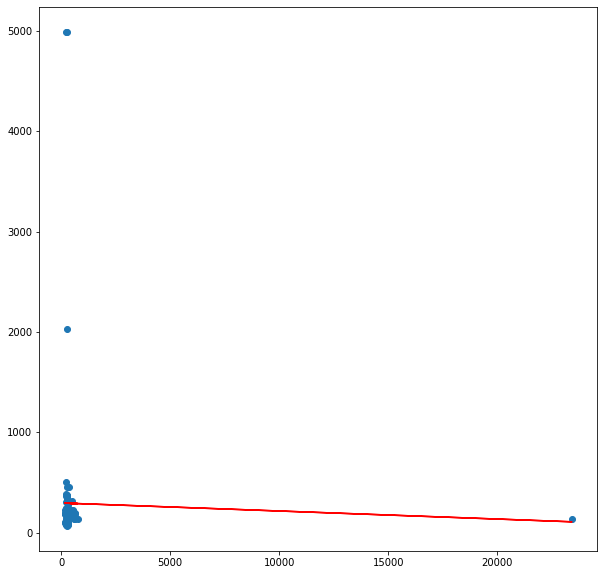

The corelation between twobuilding is:  -0.022949565952353486
Current Charges: 


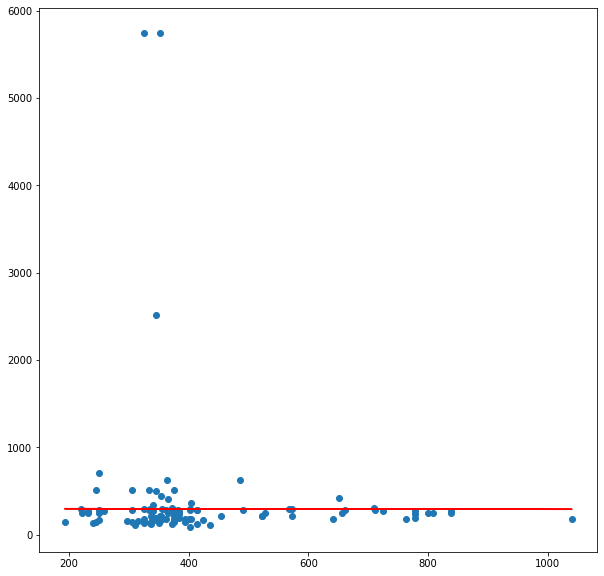

The corelation between two building is:  -0.10497269660149361
----------------------------------------------------------------------------------------------------
For Meter Number:  E21207684 and  E20290719
Consumption: 


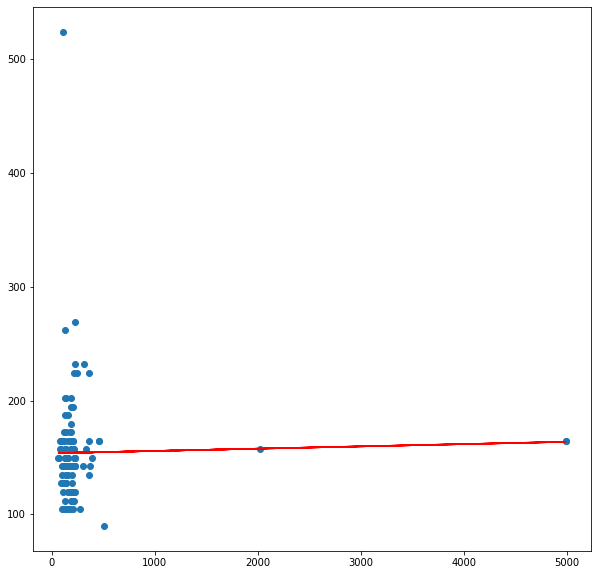

The corelation between twobuilding is:  0.03081922366108254
Current Charges: 


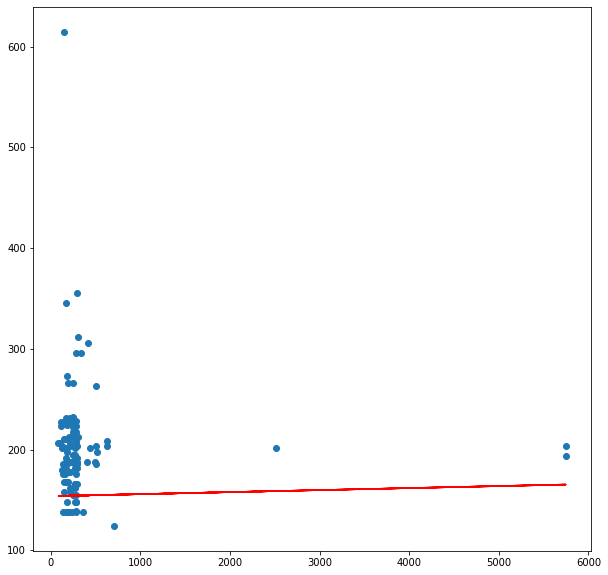

The corelation between two building is:  -0.010869360153373966
----------------------------------------------------------------------------------------------------
For Meter Number:  E20290719 and  E20453240
Consumption: 


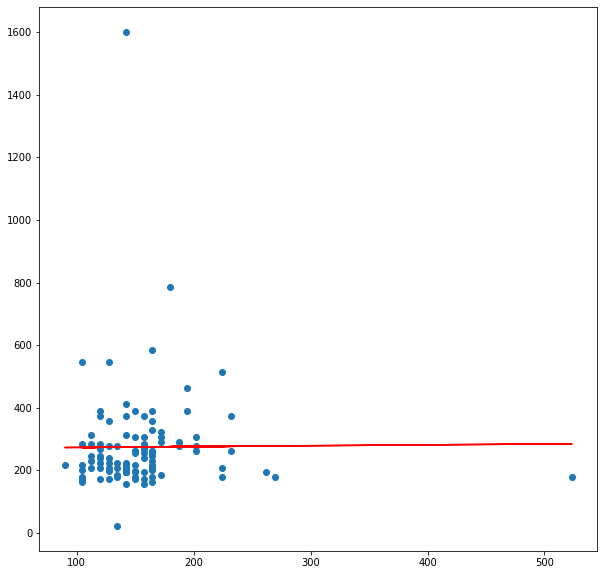

The corelation between twobuilding is:  0.019925102065325242
Current Charges: 


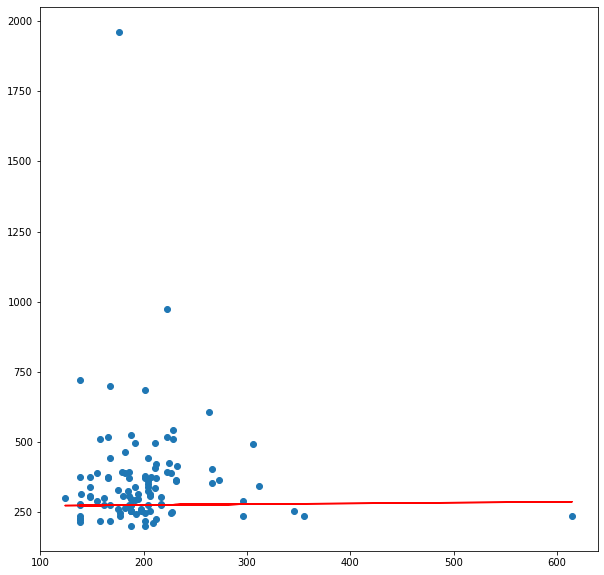

The corelation between two building is:  -0.023317384588057724
----------------------------------------------------------------------------------------------------
For Meter Number:  E20453240 and  E20527603
Consumption: 


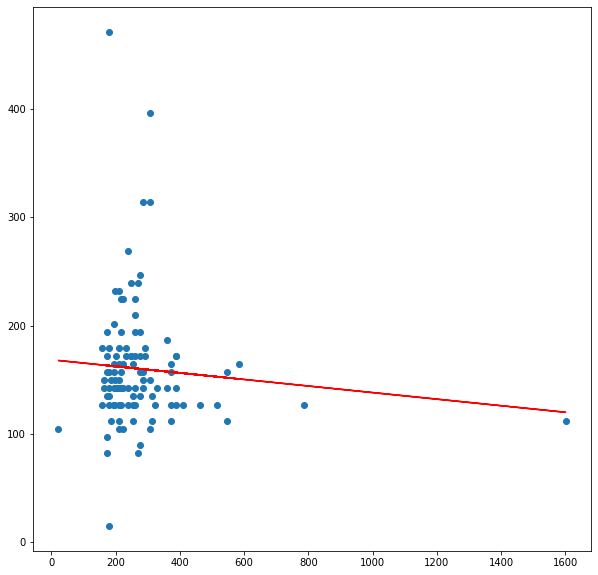

The corelation between twobuilding is:  0.04669645354819032
Current Charges: 


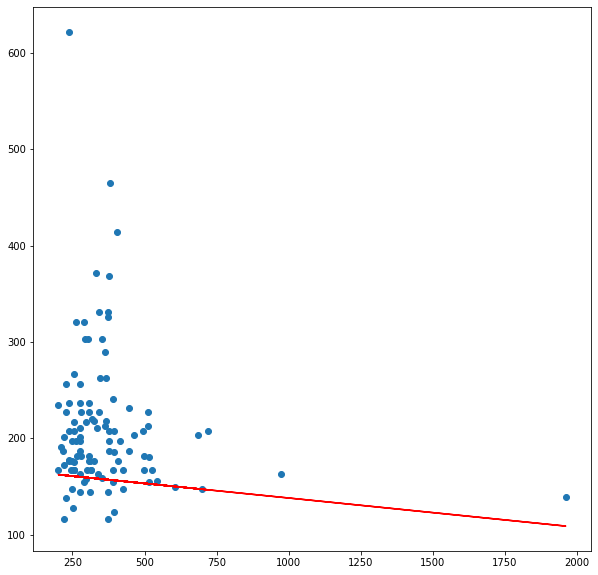

The corelation between two building is:  -0.047691730303191786
----------------------------------------------------------------------------------------------------
For Meter Number:  E20527603 and  E11310572
Consumption: 


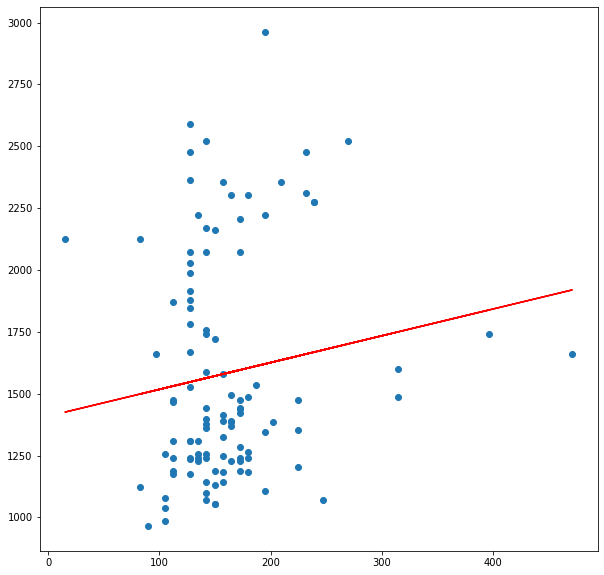

The corelation between twobuilding is:  0.08923886468021684
Current Charges: 


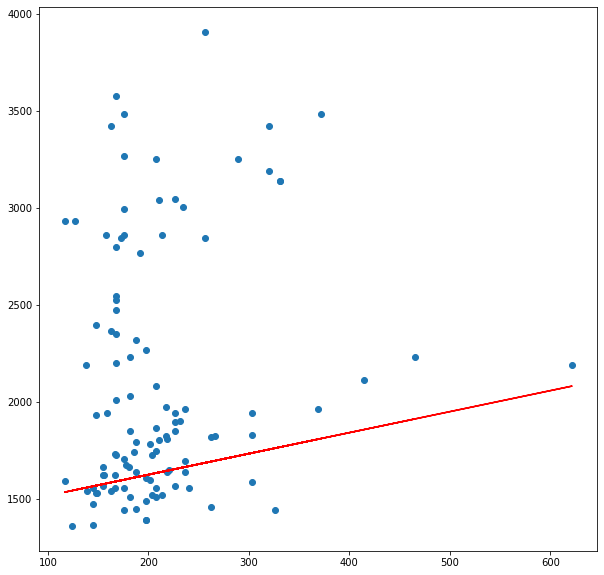

The corelation between two building is:  0.10754542733745007
----------------------------------------------------------------------------------------------------
For Meter Number:  E11310572 and  N31904087
Consumption: 


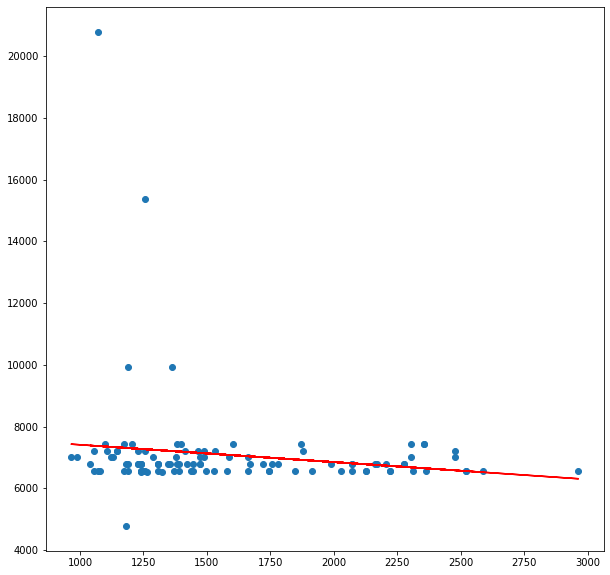

The corelation between twobuilding is:  -0.021322620165235336
Current Charges: 


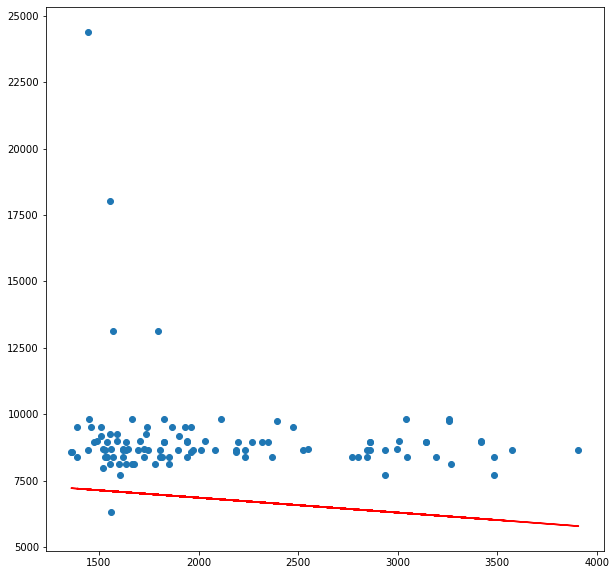

The corelation between two building is:  -0.01121655338394213
----------------------------------------------------------------------------------------------------
For Meter Number:  N31904087 and  O78590128
Consumption: 


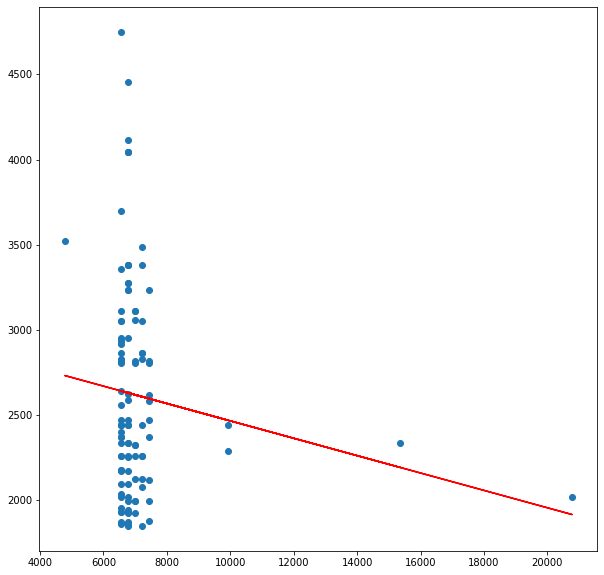

The corelation between twobuilding is:  -0.07541762861397028
Current Charges: 


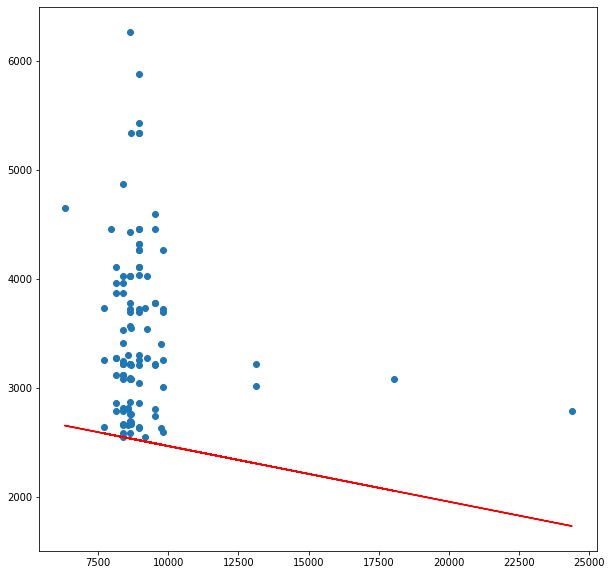

The corelation between two building is:  -0.04581522641983356
----------------------------------------------------------------------------------------------------
For Meter Number:  O78590128 and  K16805260
Consumption: 


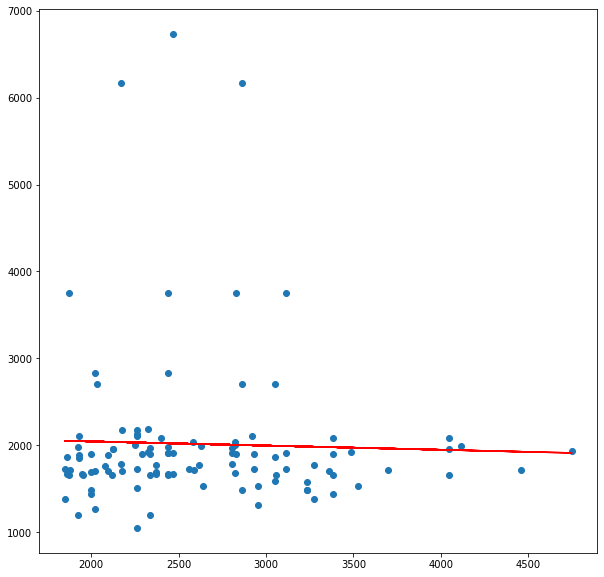

The corelation between twobuilding is:  -0.12609764126784412
Current Charges: 


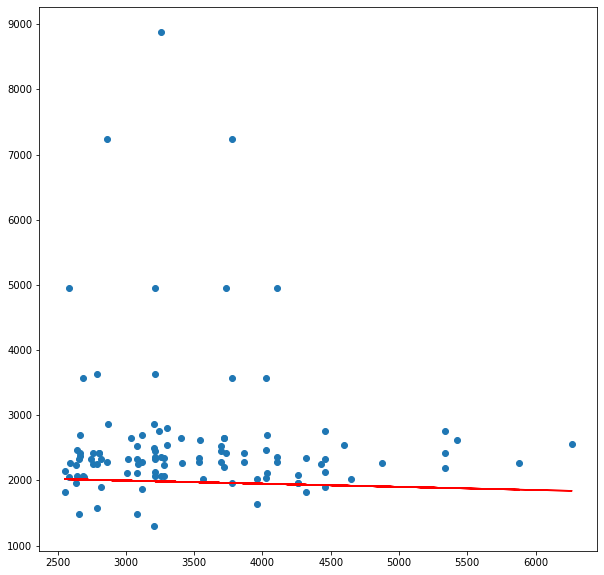

The corelation between two building is:  -0.0958824691521345
----------------------------------------------------------------------------------------------------
For Meter Number:  K16805260 and  O78777952
Consumption: 


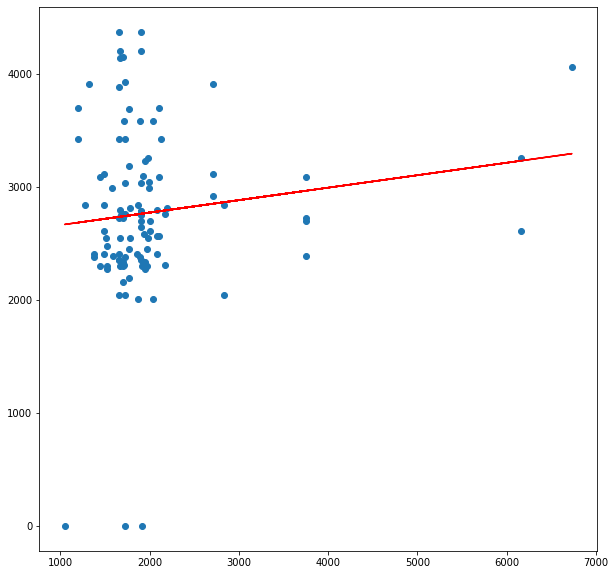

The corelation between twobuilding is:  -0.12272623867601744
Current Charges: 


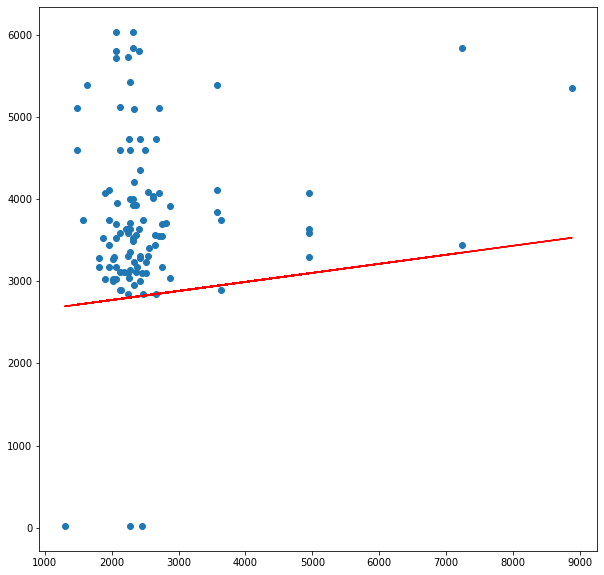

The corelation between two building is:  -0.1351913238217098
----------------------------------------------------------------------------------------------------
For Meter Number:  O78777952 and  E19234608
Consumption: 


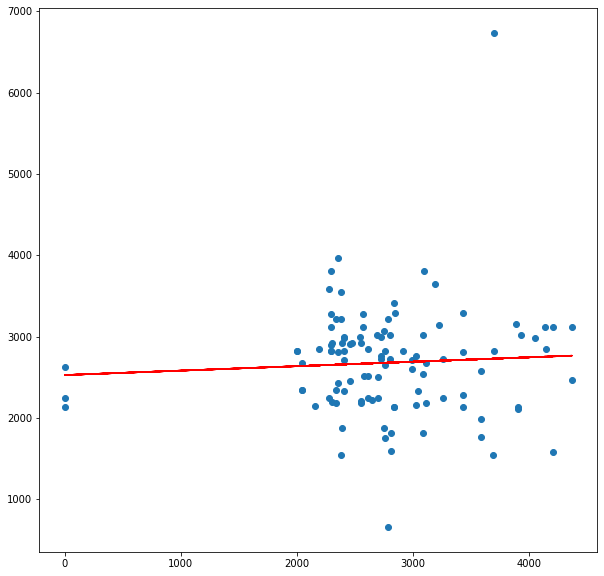

The corelation between twobuilding is:  -0.030900662842397356
Current Charges: 


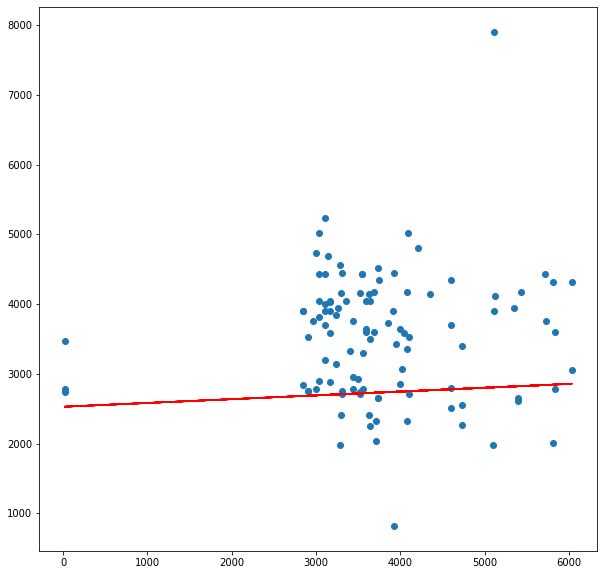

The corelation between two building is:  -0.017881366969329522
----------------------------------------------------------------------------------------------------
For Meter Number:  E19234608 and  I15002044
Consumption: 


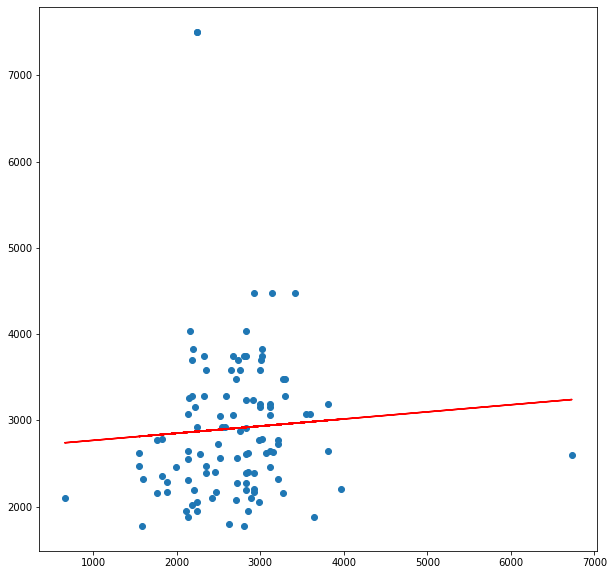

The corelation between twobuilding is:  0.4576607275739075
Current Charges: 


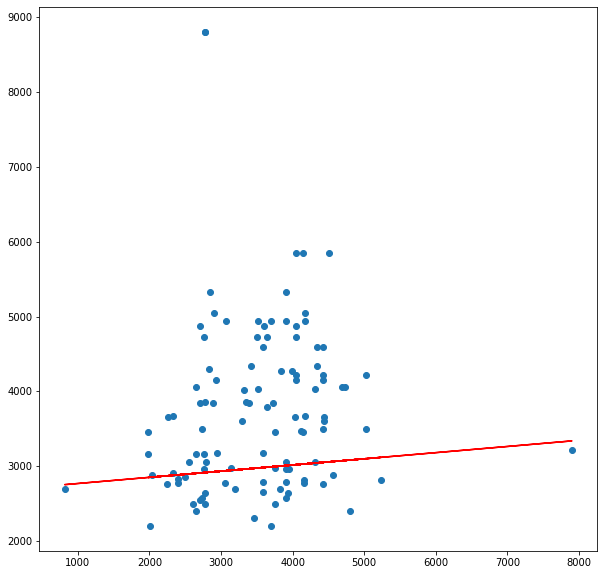

The corelation between two building is:  0.4351185480870383
----------------------------------------------------------------------------------------------------
For Meter Number:  I15002044 and  I15002043
Consumption: 


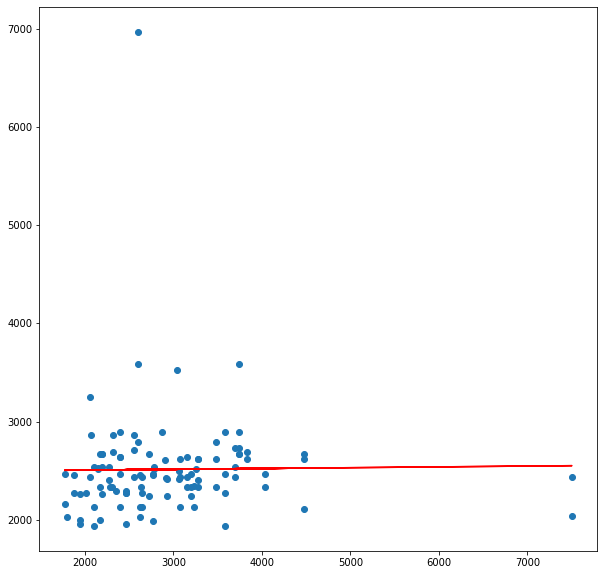

The corelation between twobuilding is:  0.5076969404929872
Current Charges: 


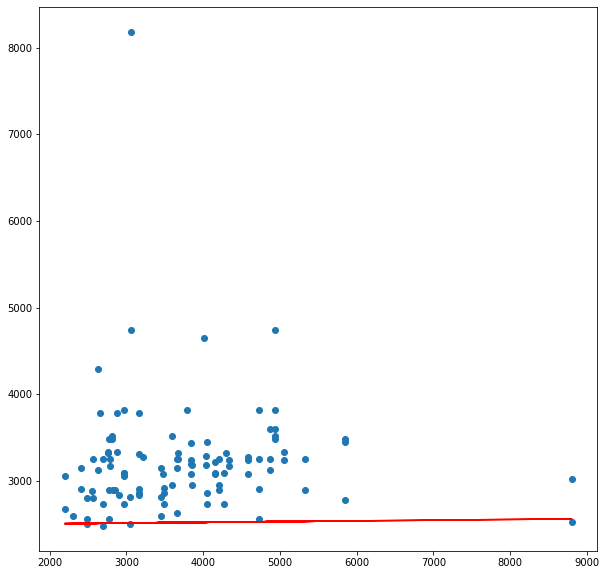

The corelation between two building is:  0.4890769673026939
----------------------------------------------------------------------------------------------------
For Meter Number:  I15002043 and  D60034850
Consumption: 


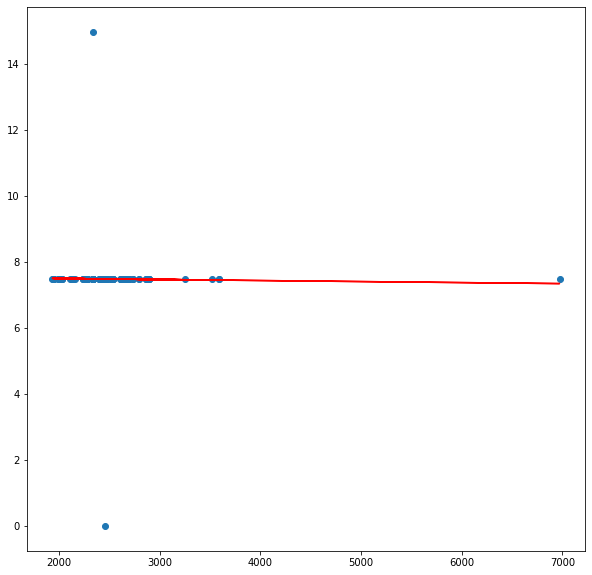

The corelation between twobuilding is:  -0.08129743365042809
Current Charges: 


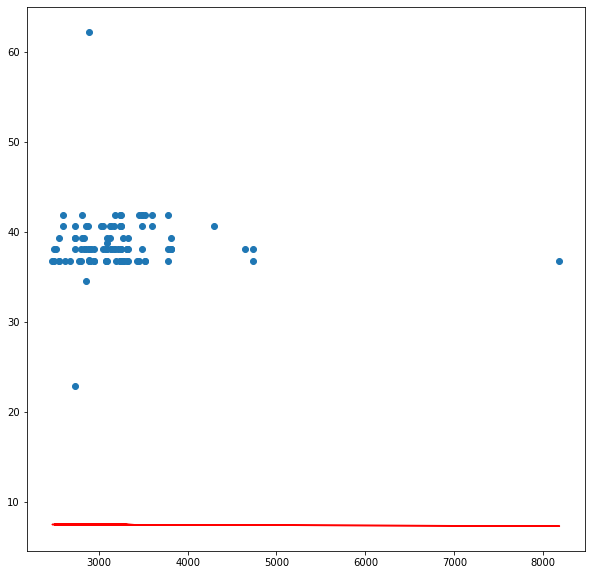

The corelation between two building is:  0.003190060237406731
----------------------------------------------------------------------------------------------------
For Meter Number:  D60034850 and  E14262604
Consumption: 


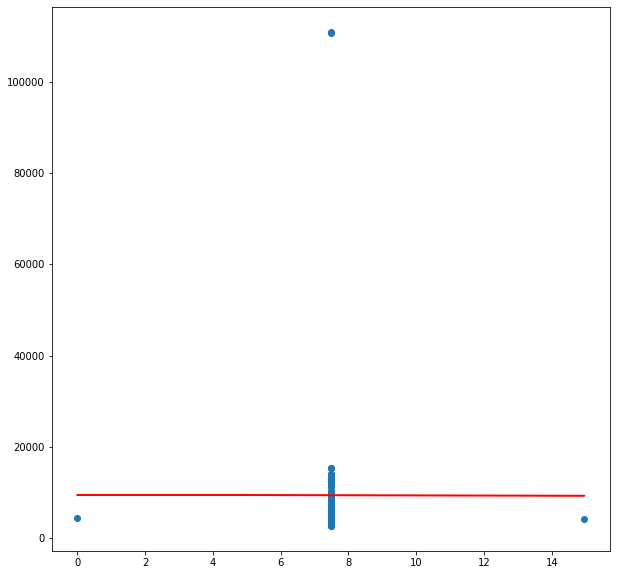

The corelation between twobuilding is:  -0.0006046735415040513
Current Charges: 


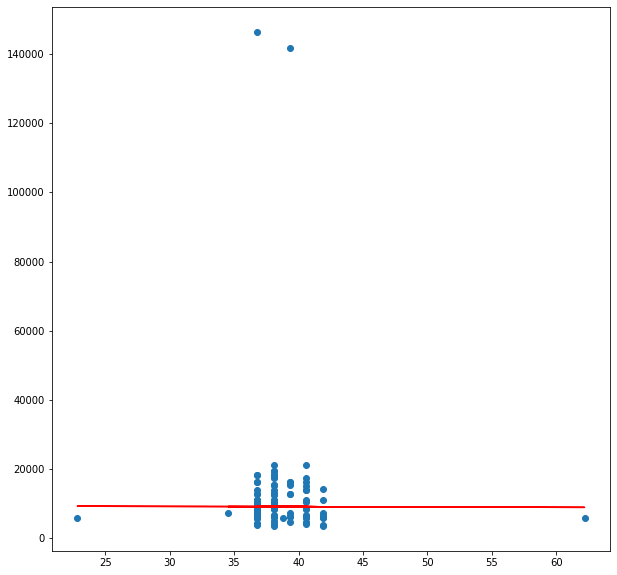

The corelation between two building is:  -0.11692016353308037
----------------------------------------------------------------------------------------------------
For Meter Number:  E14262604 and  V83028864
Consumption: 


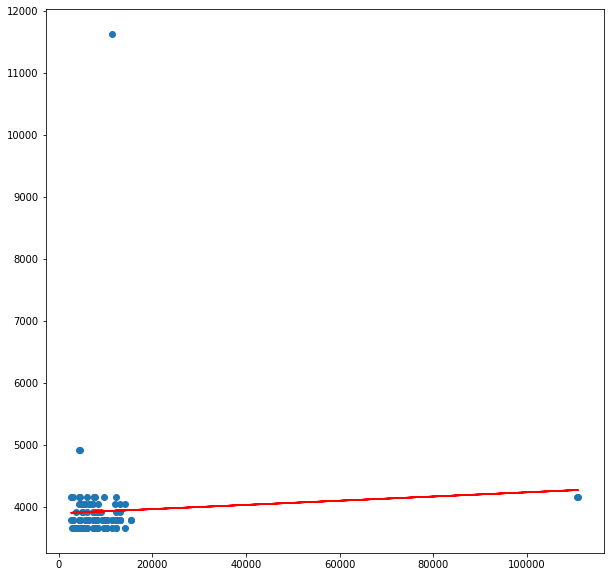

The corelation between twobuilding is:  -0.012432455605699574
Current Charges: 


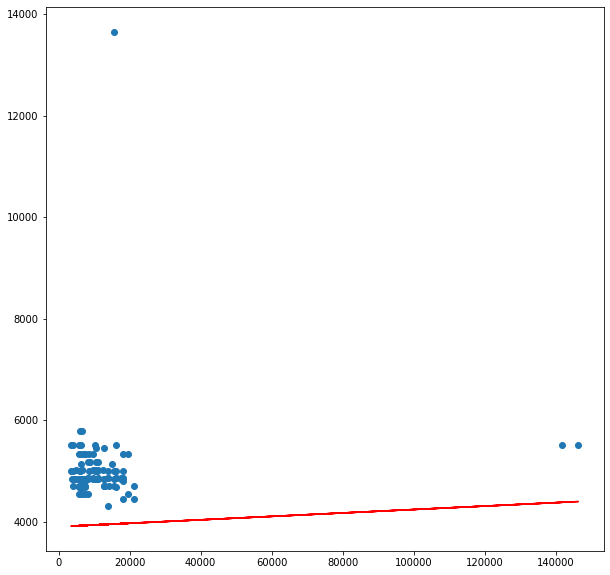

The corelation between two building is:  -0.014123923615623165
----------------------------------------------------------------------------------------------------
For Meter Number:  V83028864 and  V84010220
Consumption: 


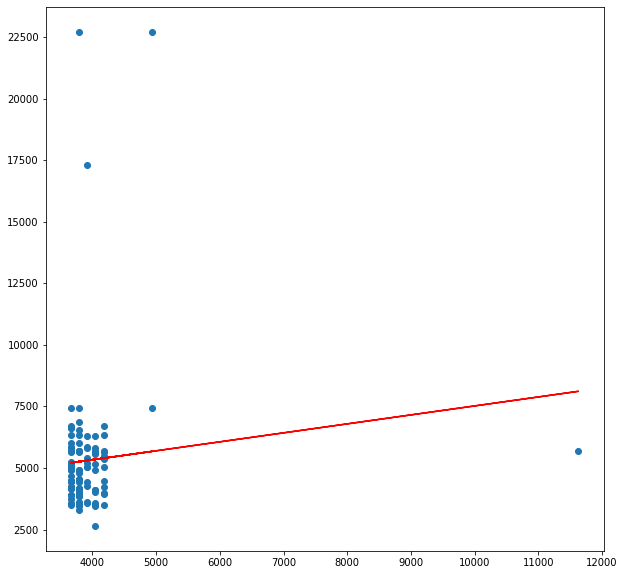

The corelation between twobuilding is:  0.6561331992115077
Current Charges: 


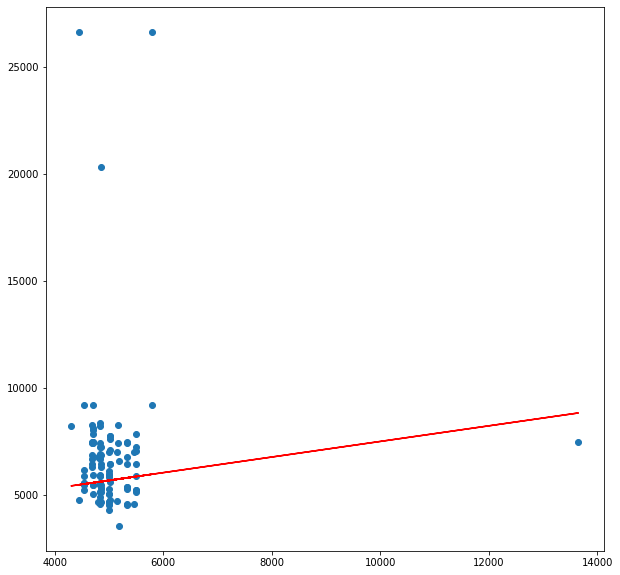

The corelation between two building is:  0.6225465200698129
----------------------------------------------------------------------------------------------------
For Meter Number:  V84010220 and  V84003315
Consumption: 


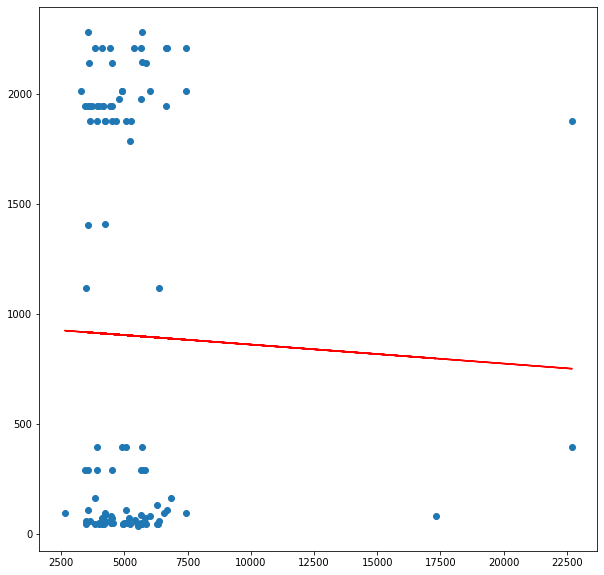

The corelation between twobuilding is:  -0.011813804458545669
Current Charges: 


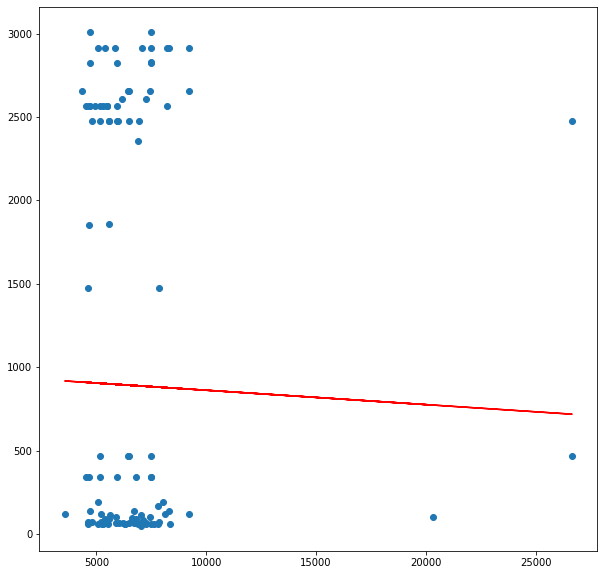

The corelation between two building is:  0.002536273058114151
----------------------------------------------------------------------------------------------------
For Meter Number:  V84003315 and  N84003201
Consumption: 


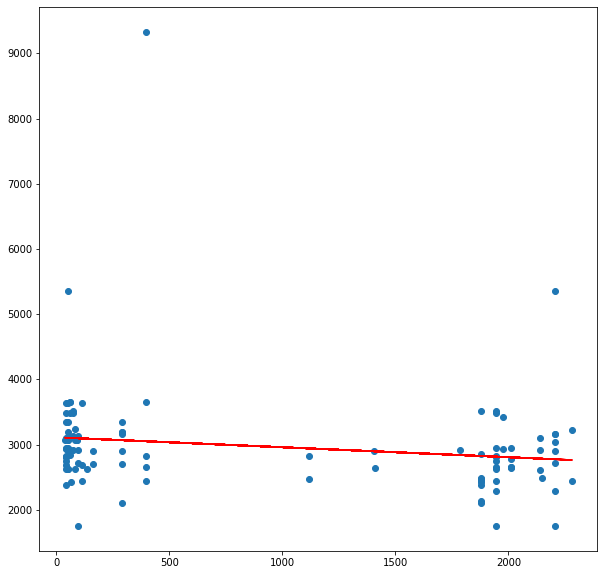

The corelation between twobuilding is:  -0.06980213523878781
Current Charges: 


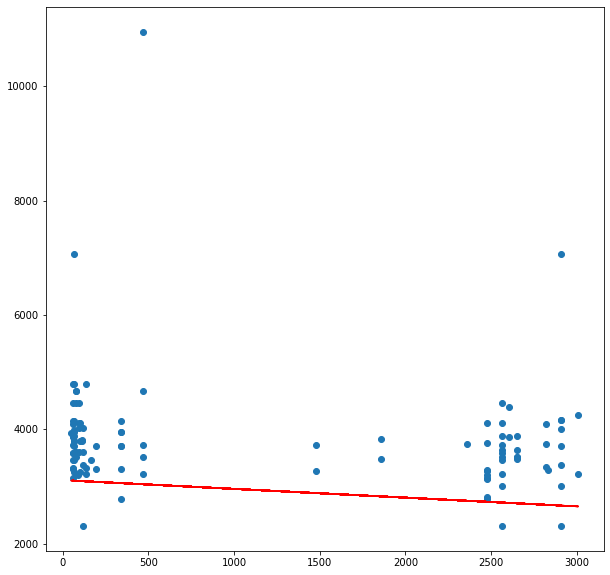

The corelation between two building is:  -0.0484426239375498
----------------------------------------------------------------------------------------------------
For Meter Number:  N84003201 and  V83033049
Consumption: 


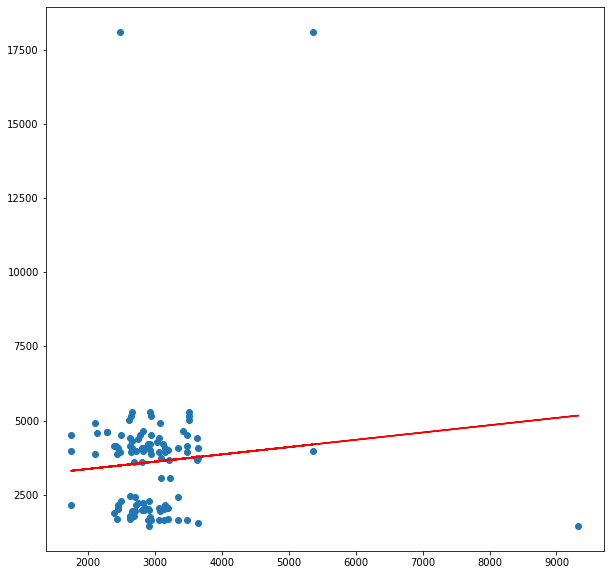

The corelation between twobuilding is:  -0.12992779218142622
Current Charges: 


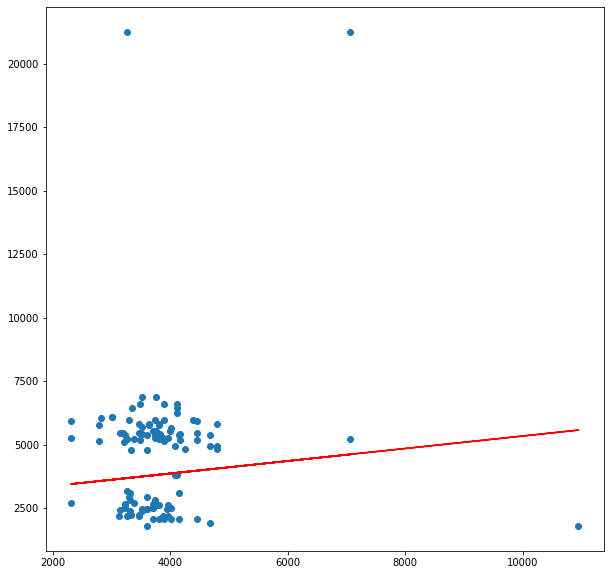

The corelation between two building is:  -0.12073430494958488
----------------------------------------------------------------------------------------------------
For Meter Number:  V83033049 and  V84005705
Consumption: 


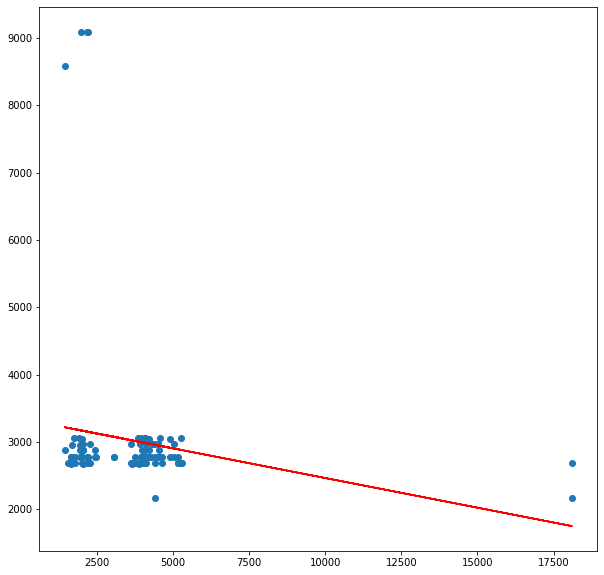

The corelation between twobuilding is:  0.3224807987432652
Current Charges: 


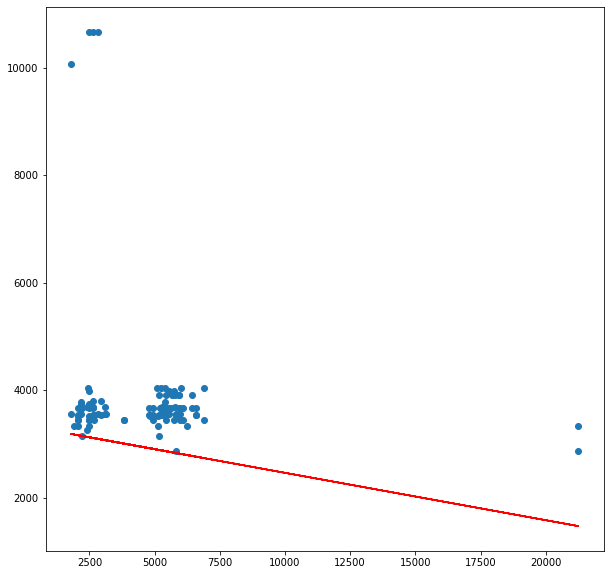

The corelation between two building is:  0.3279058378413499
----------------------------------------------------------------------------------------------------
For Meter Number:  V84005705 and  V83029959
Consumption: 


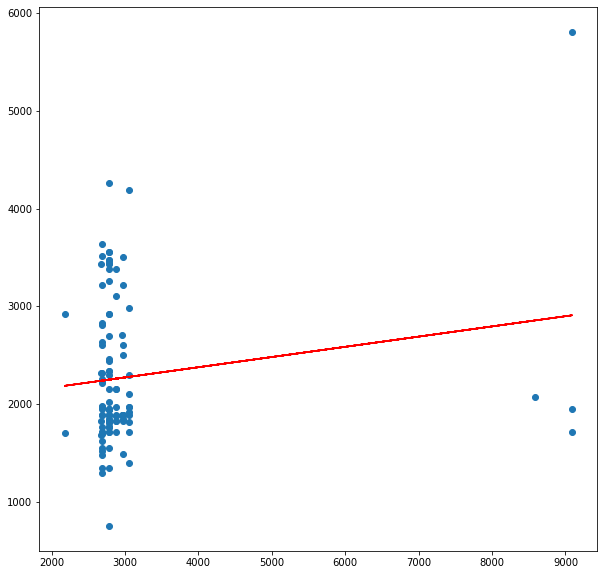

The corelation between twobuilding is:  -0.005167288523270534
Current Charges: 


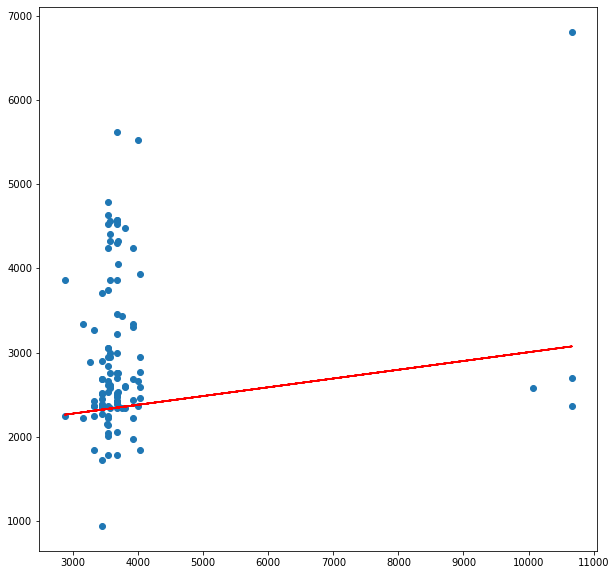

The corelation between two building is:  0.005038274128879935
----------------------------------------------------------------------------------------------------
For Meter Number:  V83029959 and  V84008562
Consumption: 


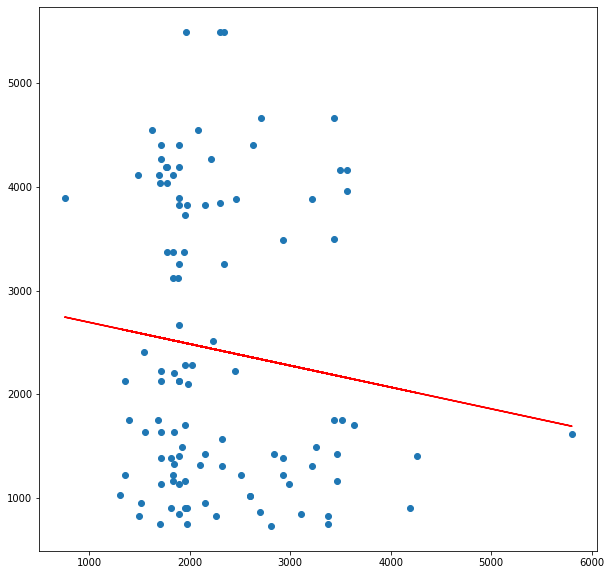

The corelation between twobuilding is:  -0.11570744961921536
Current Charges: 


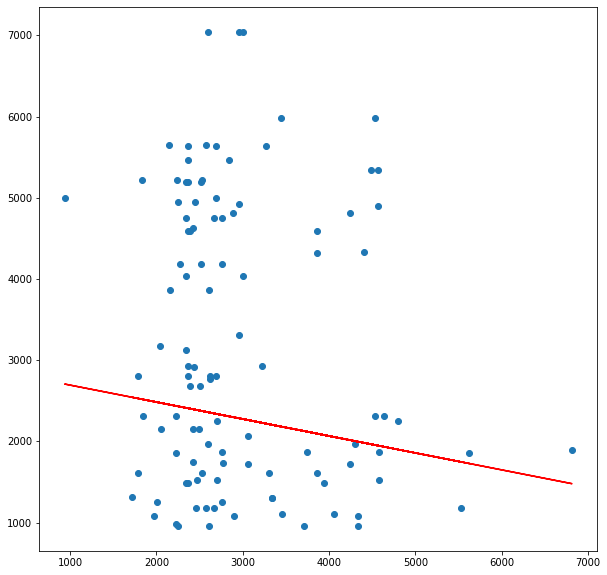

The corelation between two building is:  -0.15401133210503573
----------------------------------------------------------------------------------------------------
For Meter Number:  V84008562 and  V83020691
Consumption: 


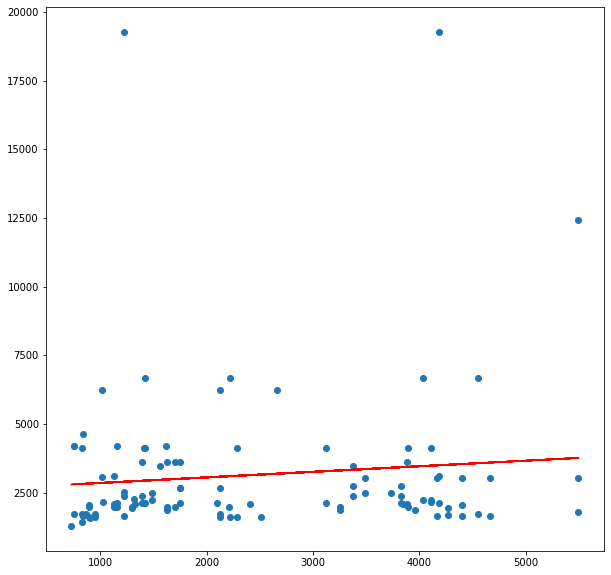

The corelation between twobuilding is:  -0.029655224070841063
Current Charges: 


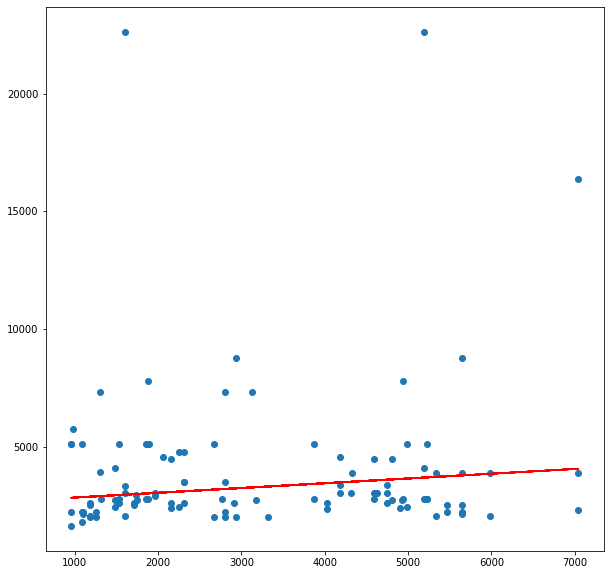

The corelation between two building is:  -0.021633201829061803
----------------------------------------------------------------------------------------------------
For Meter Number:  V83020691 and  K98974961
Consumption: 


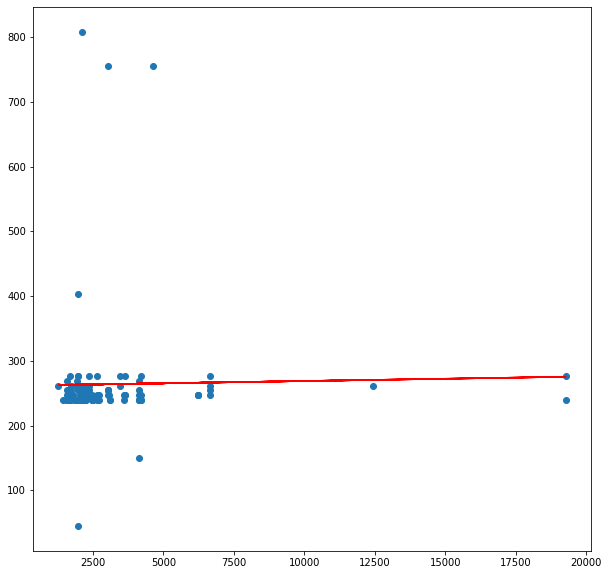

The corelation between twobuilding is:  0.2884843644326667
Current Charges: 


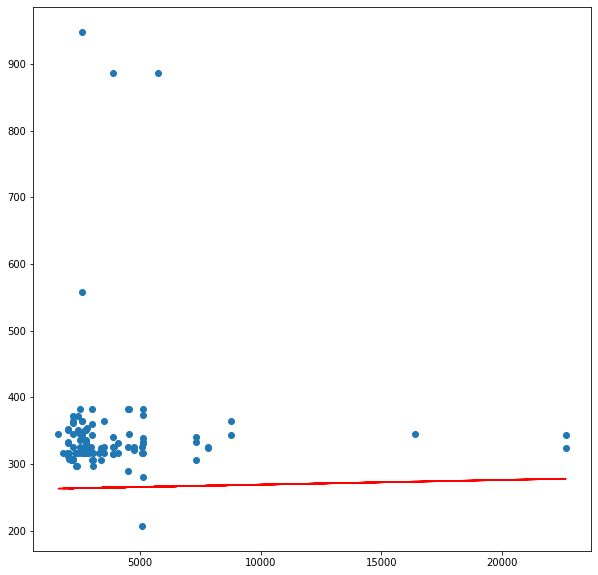

The corelation between two building is:  0.28454976598246023
----------------------------------------------------------------------------------------------------
For Meter Number:  K98974961 and  E17792841
Consumption: 


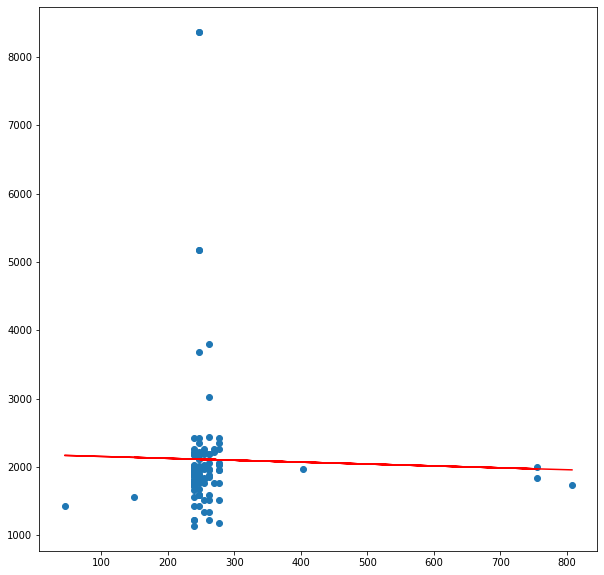

The corelation between twobuilding is:  0.15417592681275638
Current Charges: 


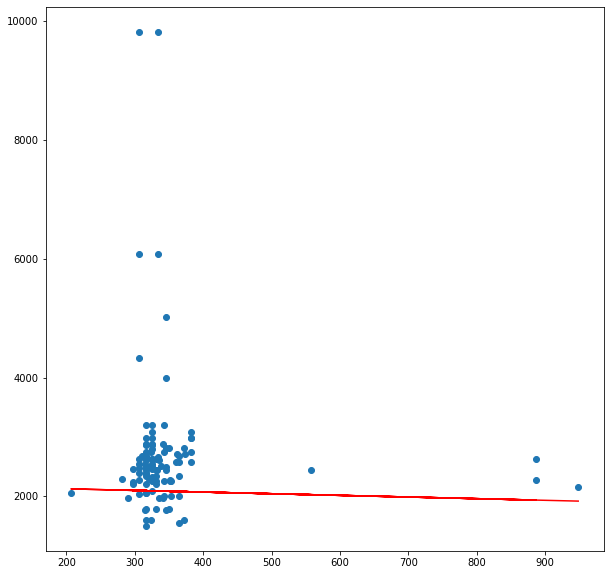

The corelation between two building is:  0.15294998213964858
----------------------------------------------------------------------------------------------------
For Meter Number:  E17792841 and  I13013828
Consumption: 


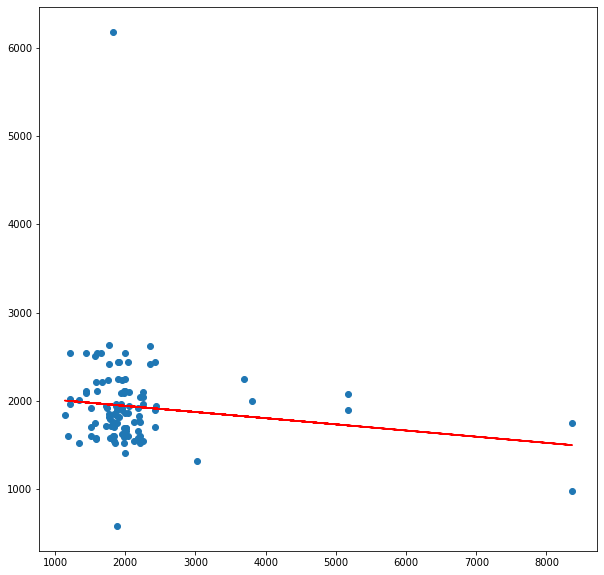

The corelation between twobuilding is:  0.1799286231906955
Current Charges: 


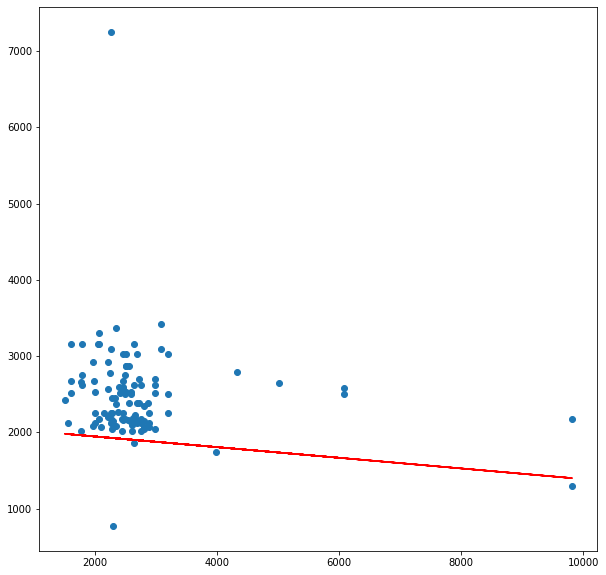

The corelation between two building is:  0.16736149859484542
----------------------------------------------------------------------------------------------------
For Meter Number:  I13013828 and  I13013834
Consumption: 


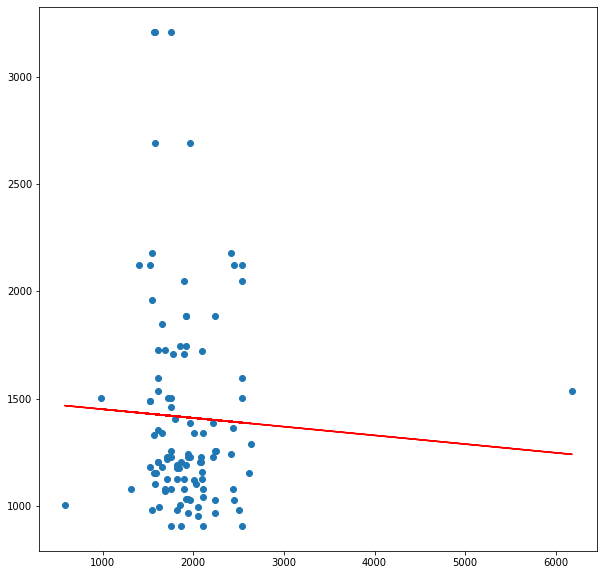

The corelation between twobuilding is:  0.1278325315469788
Current Charges: 


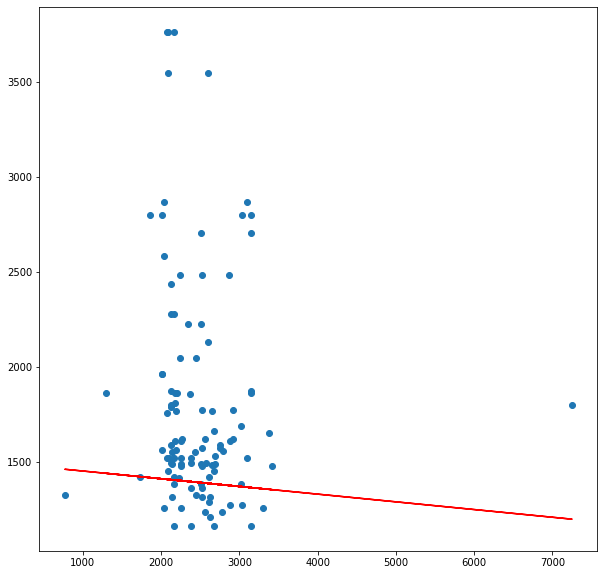

The corelation between two building is:  0.13103873690517923
----------------------------------------------------------------------------------------------------
For Meter Number:  I13013834 and  E12092566
Consumption: 


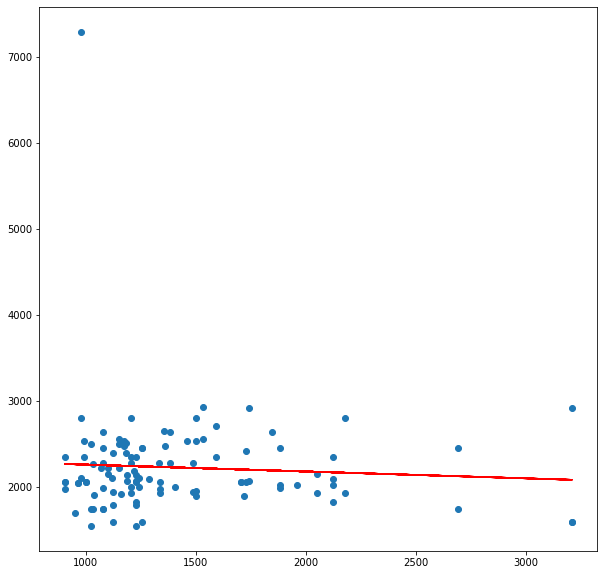

The corelation between twobuilding is:  0.011989334939871282
Current Charges: 


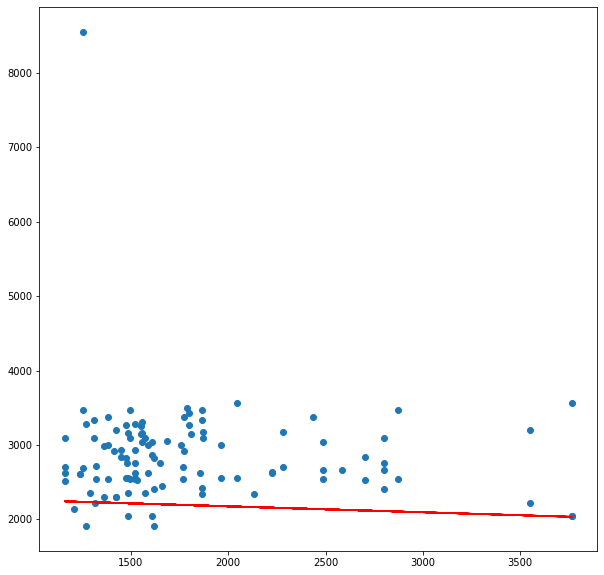

The corelation between two building is:  -0.016151664978581833
----------------------------------------------------------------------------------------------------
For Meter Number:  E12092566 and  K17791618
Consumption: 


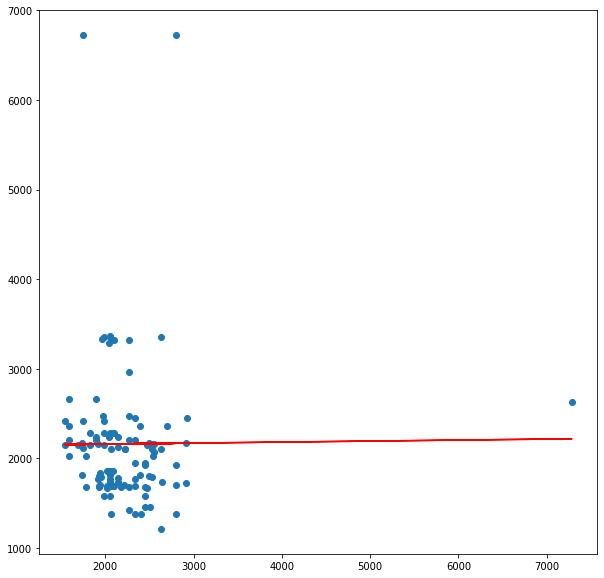

The corelation between twobuilding is:  0.4448314115690568
Current Charges: 


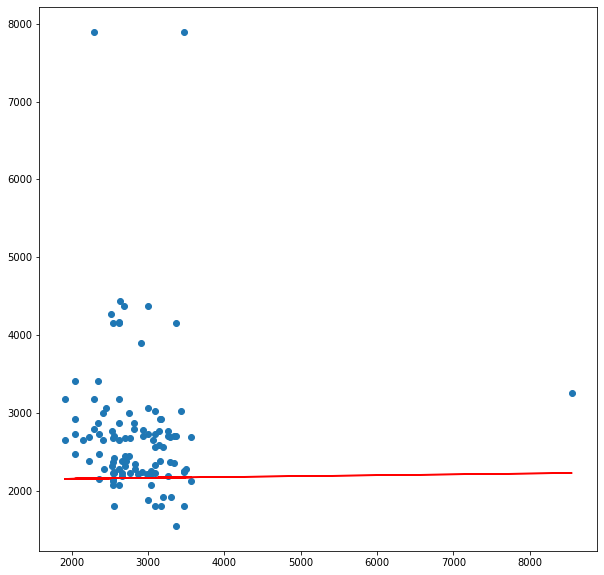

The corelation between two building is:  0.3985313199648809
----------------------------------------------------------------------------------------------------
For Meter Number:  K17791618 and  N31655214
Consumption: 


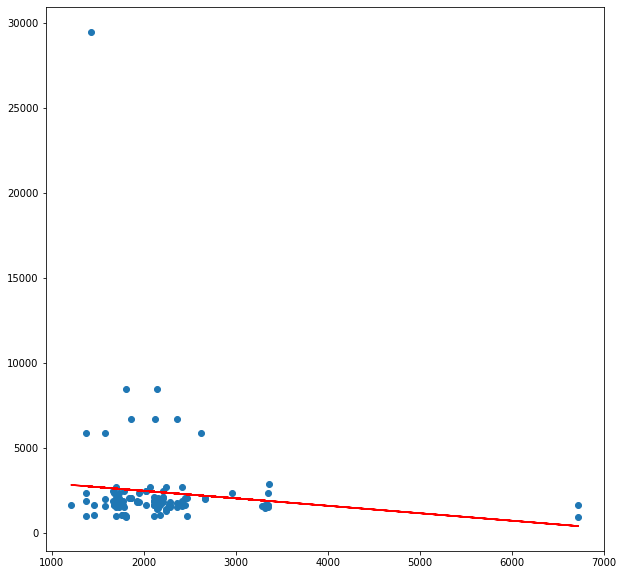

The corelation between twobuilding is:  -0.019346533336829192
Current Charges: 


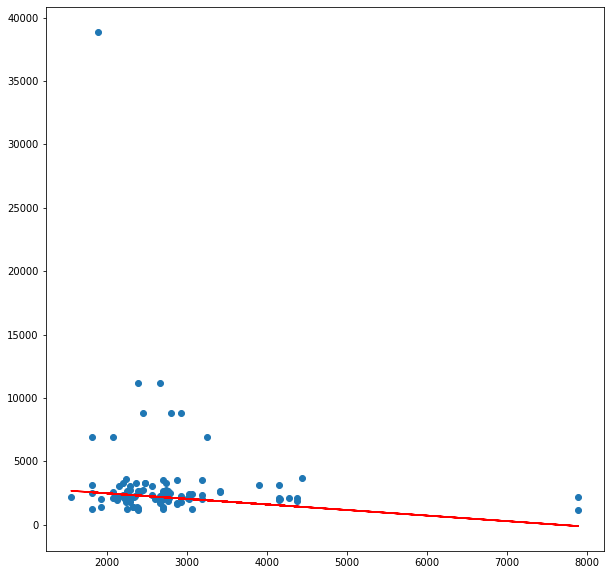

The corelation between two building is:  -0.03290782808563521
----------------------------------------------------------------------------------------------------
For Meter Number:  N31655214 and  I13006127
Consumption: 


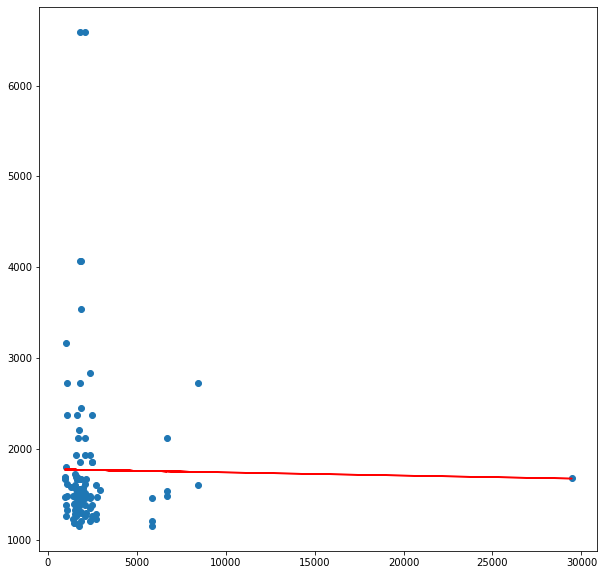

The corelation between twobuilding is:  0.06958058805279568
Current Charges: 


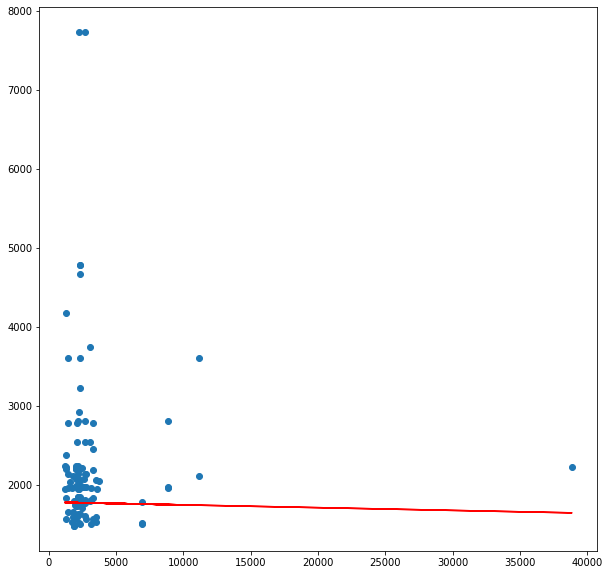

The corelation between two building is:  0.08451029462918683
----------------------------------------------------------------------------------------------------
For Meter Number:  I13006127 and  I13014299
Consumption: 


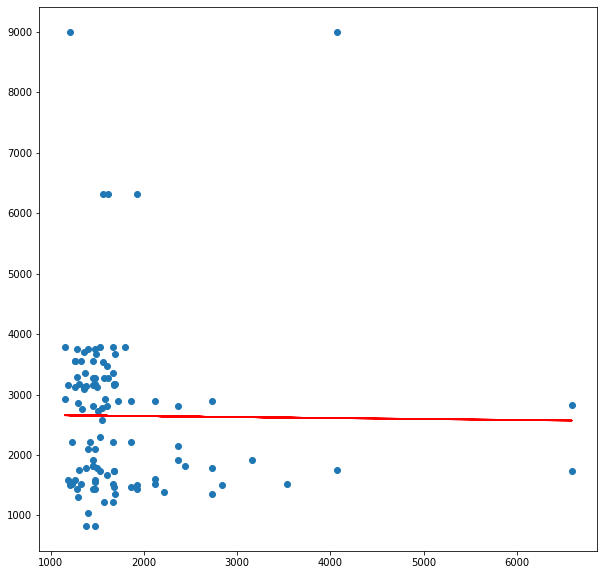

The corelation between twobuilding is:  0.1299096735496829
Current Charges: 


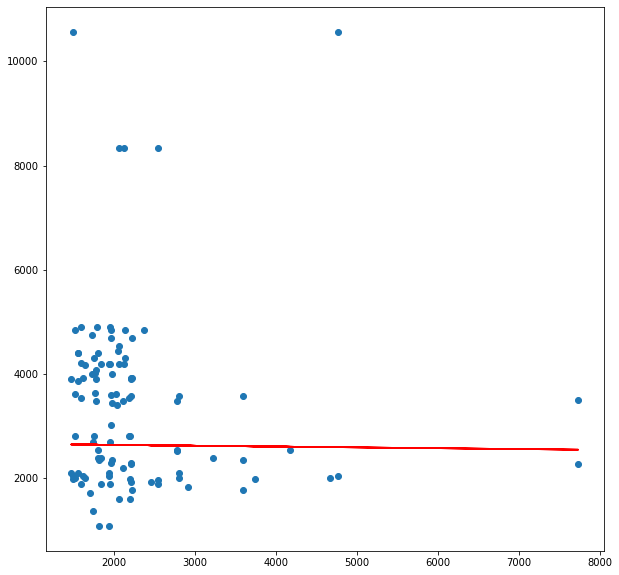

The corelation between two building is:  0.09565341427317335
----------------------------------------------------------------------------------------------------
For Meter Number:  I13014299 and  O78590242
Consumption: 


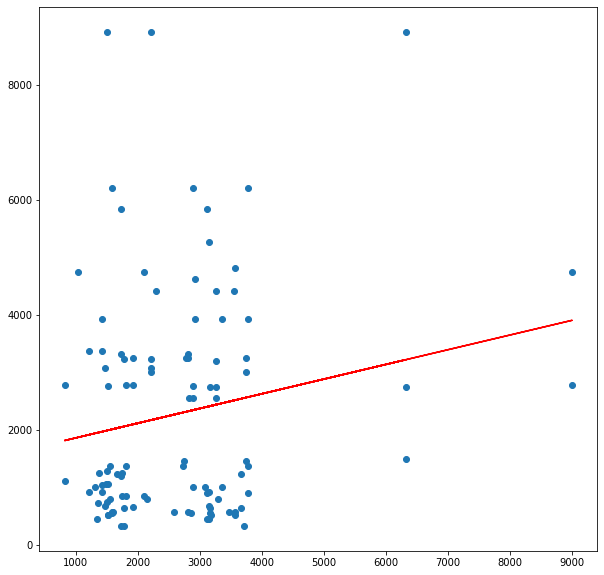

The corelation between twobuilding is:  -0.11146737761594765
Current Charges: 


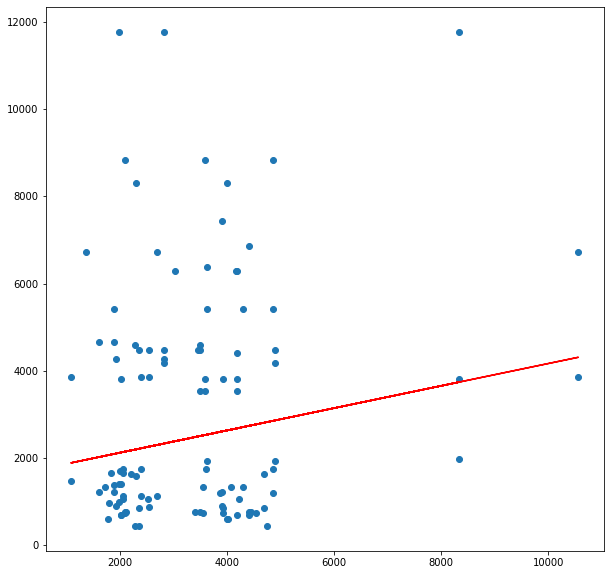

The corelation between two building is:  -0.11843337548525776
----------------------------------------------------------------------------------------------------
For Meter Number:  O78590242 and  O78778150
Consumption: 


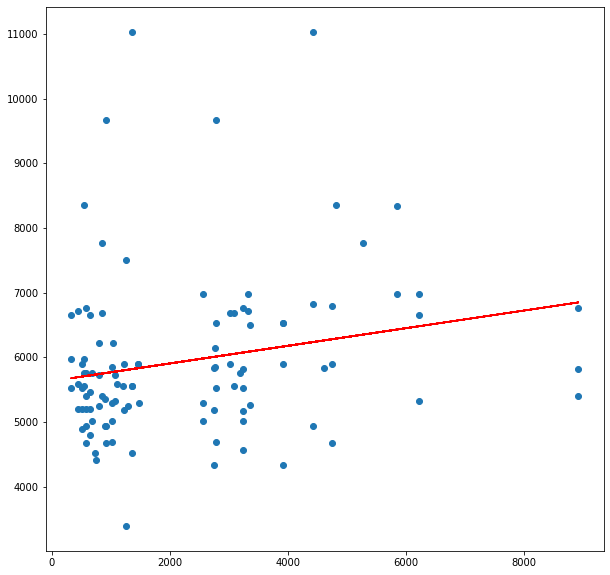

The corelation between twobuilding is:  0.22286388633160678
Current Charges: 


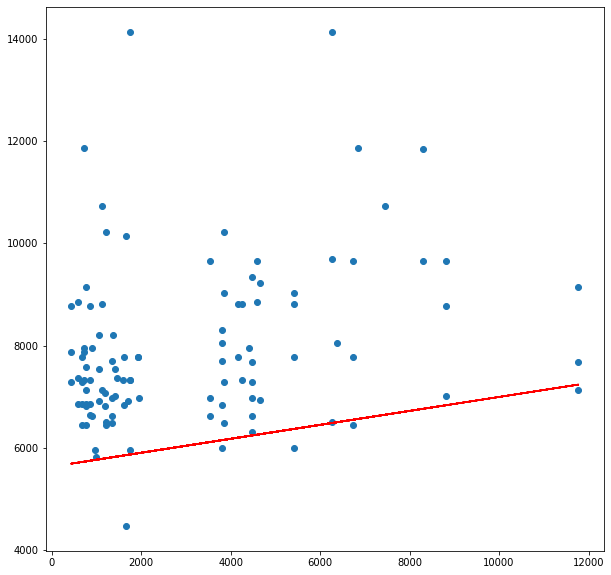

The corelation between two building is:  0.274799966752826
----------------------------------------------------------------------------------------------------
For Meter Number:  O78778150 and  K14211089
Consumption: 


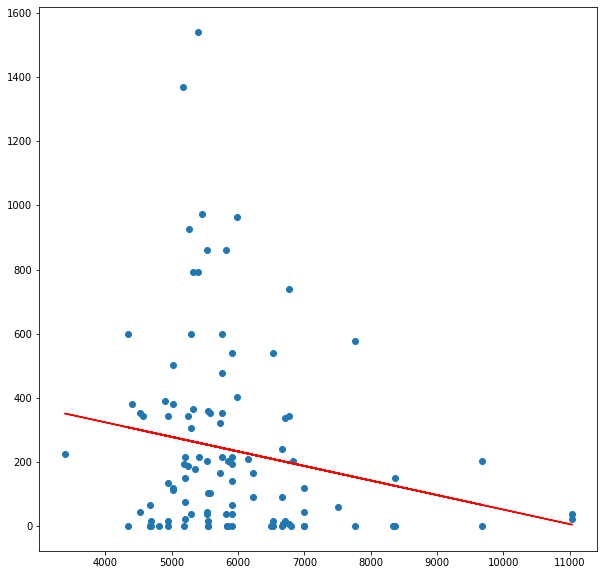

The corelation between twobuilding is:  -0.06585839512979823
Current Charges: 


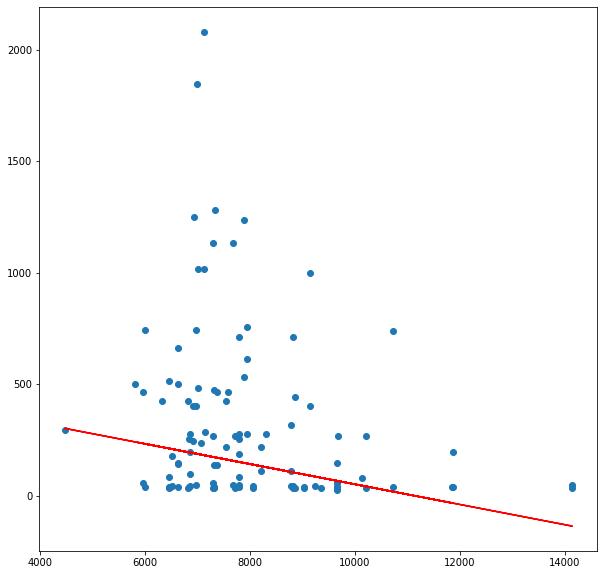

The corelation between two building is:  -0.06009555997253401
----------------------------------------------------------------------------------------------------
For Meter Number:  K14211089 and  K10916574
Consumption: 


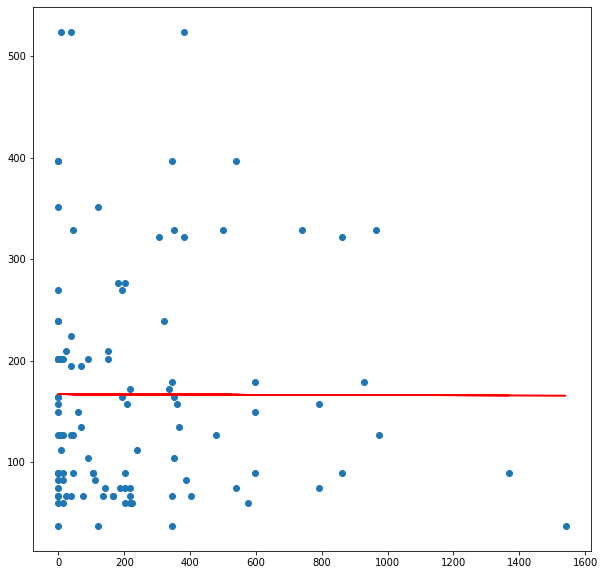

The corelation between twobuilding is:  -0.03413999372506972
Current Charges: 


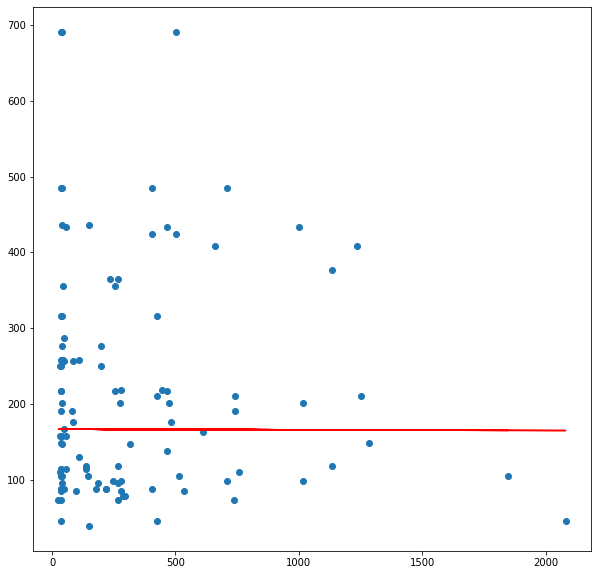

The corelation between two building is:  -0.02898087136439133
----------------------------------------------------------------------------------------------------
For Meter Number:  K10916574 and  V52268797
Consumption: 


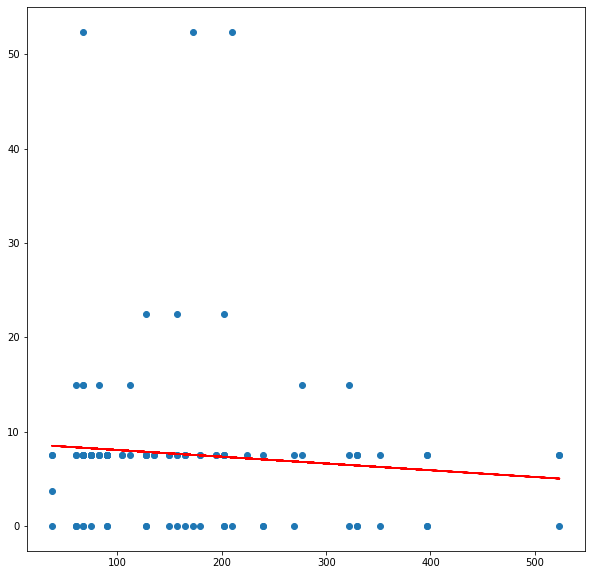

The corelation between twobuilding is:  -0.02274558091925193
Current Charges: 


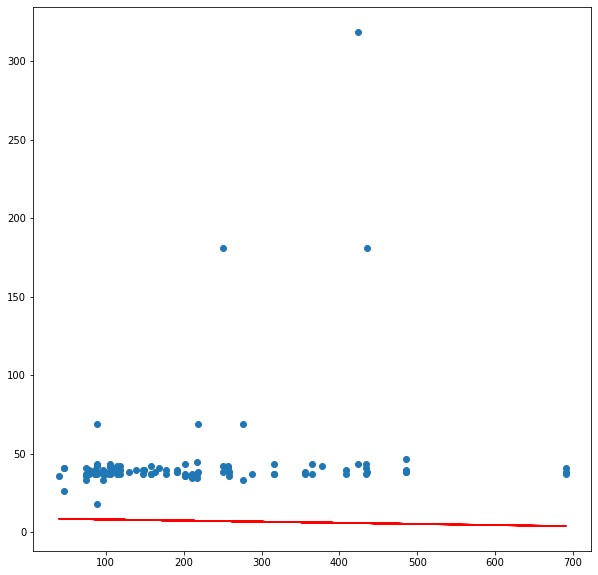

The corelation between two building is:  0.208139552127486
----------------------------------------------------------------------------------------------------


In [42]:
count1 =0
count2=0
for i in range(len(uniqueMeterNumbers_f)):
    if(i==len(uniqueMeterNumbers_f)-1):
        break;
    plt.rcParams['figure.figsize'] = (10, 10)
    print('For Meter Number: ',uniqueMeterNumbers_f[i], 'and ', uniqueMeterNumbers_f[i+1])
    a1 = brooklyn_imp_df_h.loc[brooklyn_imp_df_h['Meter Number']==uniqueMeterNumbers_f[i]]
    a2 = brooklyn_imp_df_h.loc[brooklyn_imp_df_h['Meter Number']==uniqueMeterNumbers_f[i+1]]
    
    #For Current Charge
    X = a1.iloc[:, 2].values.reshape(-1, 1)  # iloc[:, 1] is the column of X
    Y = a2.iloc[:, 2].values.reshape(-1, 1)  # df.iloc[:, 4] is the column of Y
    #For Consumption 
    M = a1.iloc[:, 3].values.reshape(-1, 1)  # iloc[:, 1] is the column of X
    N = a2.iloc[:, 3].values.reshape(-1, 1)  # df.iloc[:, 4] is the column of Y
    
    linear_regressor = LinearRegression()
    
    linear_regressor.fit(X, Y)
    linear_regressor.fit(M, N)
    
    Y_pred = linear_regressor.predict(X)
    N_pred = linear_regressor.predict(M)
    
    print('Consumption: ')
    plt.scatter(M, N)
    plt.plot(M, N_pred, color='red')
    plt.show()
    
    column_1 = a1["Consumption (H gallons)"]
    column_2 = a2["Consumption (H gallons)"]
    correlation = column_1.corr(column_2)
    print('The corelation between twobuilding is: ',correlation)
    if(correlation>0):
        count1 += 1
 
    print('Current Charges: ')
    plt.scatter(X, Y)
    plt.plot(X, Y_pred, color='red')
    plt.show()
    
    column_1 = a1["Current Charges"]
    column_2 = a2["Current Charges"]
    correlation = column_1.corr(column_2)
    print('The corelation between two building is: ',correlation)

    if(correlation>0):
        count2 += 1
    
    print('-'*100)

In [43]:
print(count1)
print(count2)


34
33


In [44]:
# count1
len(uniqueMeterNumbers_f)

63

In [45]:
brooklyn_imp_df_h

,Meter Number,Revenue Month,Current Charges,Consumption (H gallons),Normal Consumption,Normal Charges,month,year
0,V31959109,2013-01-01,1706.080000,1376.415584,-2.756366e-01,-0.282739,1,2013
6,I15002043,2013-07-01,3313.540000,2707.948052,2.668839e-01,0.108105,7,2013
5,I15002043,2013-06-01,3090.600000,2633.142857,1.605942e-01,-0.160122,6,2013
5,E99343083,2013-06-01,4741.250000,4039.480519,5.228718e-01,0.322711,6,2013
10,O78590242,2013-11-01,1134.810000,860.259740,-8.174023e-01,-0.822534,11,2013
11,E20308398,2013-12-01,118.410000,89.766234,-6.938727e-01,-0.733553,12,2013
4,I15002043,2013-05-01,2853.530000,2431.168831,-1.263882e-01,-0.445350,5,2013
0,E20312472,2013-01-01,39.340000,22.441558,-1.278889e+00,-1.261306,1,2013
3,I15002043,2013-04-01,3274.980000,2790.233766,3.838026e-01,0.061712,4,2013
2,I15002043,2013-03-01,2892.930000,2333.922078,-2.645649e-01,-0.397946,3,2013


In [46]:
# # V31987647
# # E20437524
# building_df = manhattan_imp_df_h.loc[manhattan_imp_df_h['Meter Number']=='E20437524']
# building_df



**O. Compound Risk Analysis**

**O-i) Extreme Consumption**

For Meter number:  V31959109


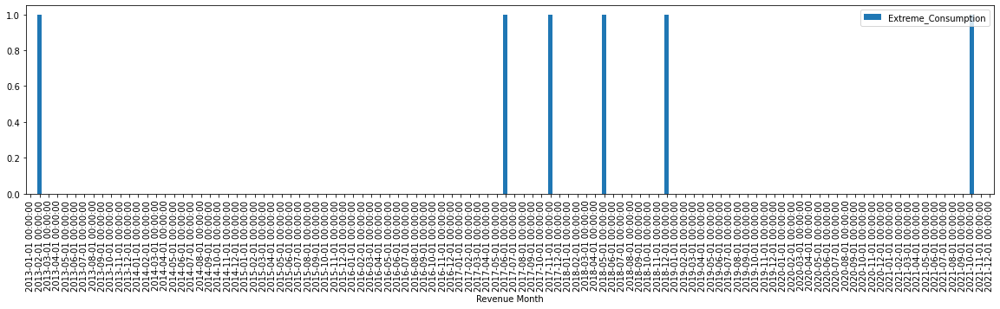

For Meter number:  V31960320


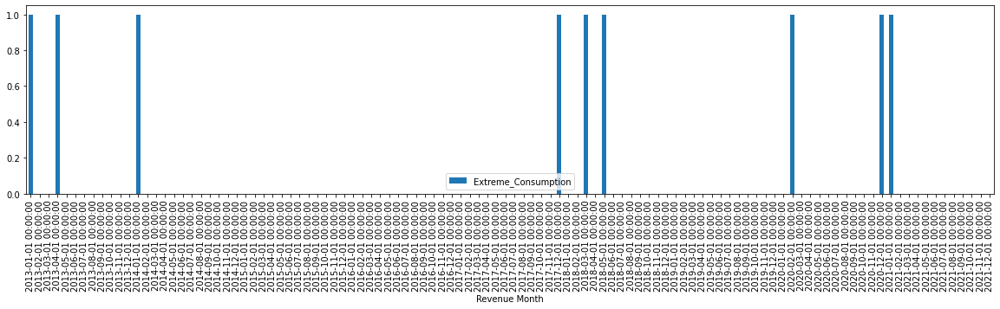

For Meter number:  K14164112


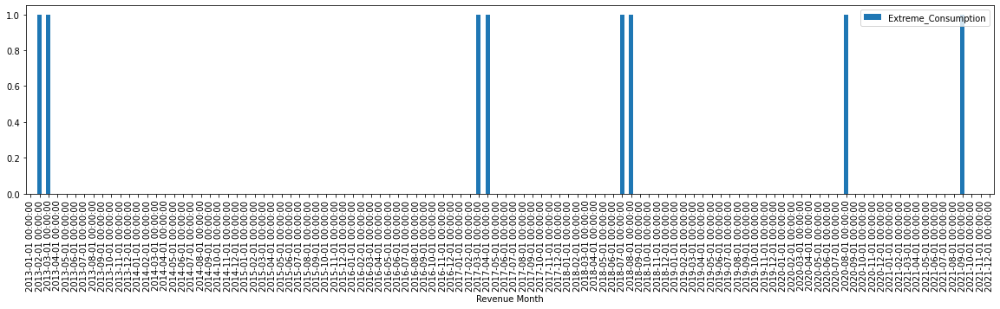

For Meter number:  K94606993


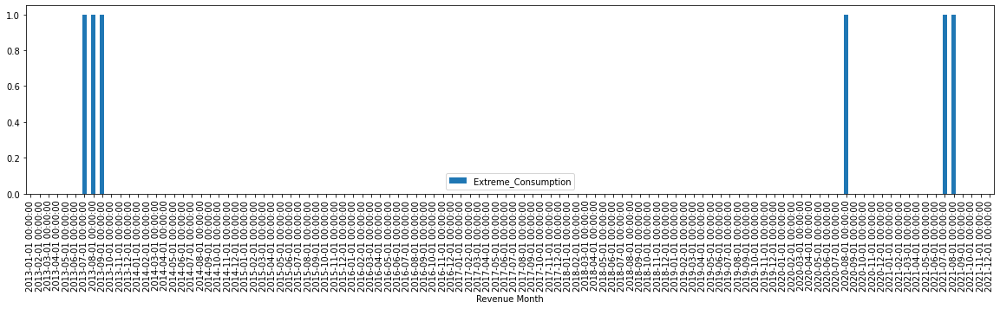

For Meter number:  H07052143


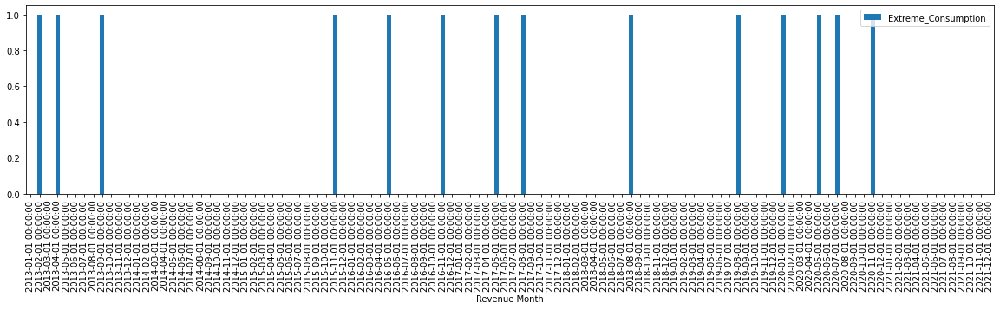

For Meter number:  E99343083


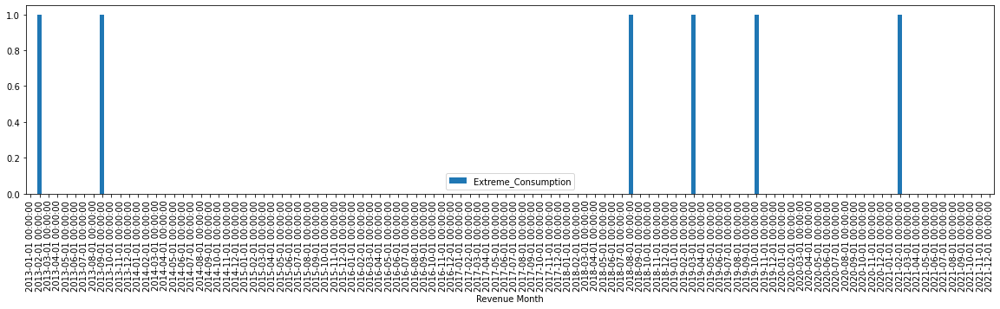

For Meter number:  V84009581


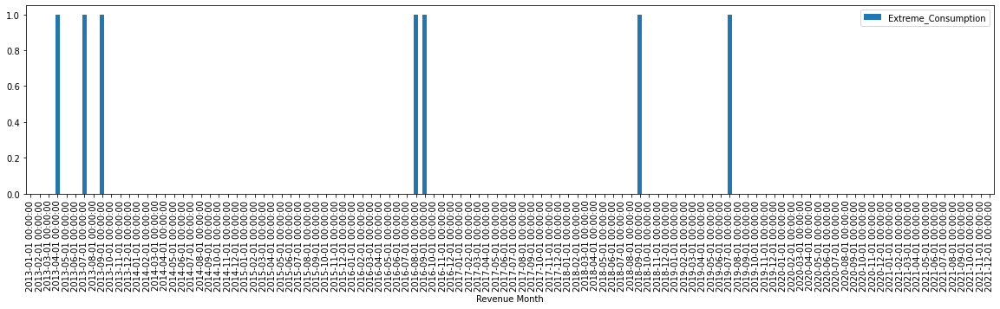

For Meter number:  V84009832


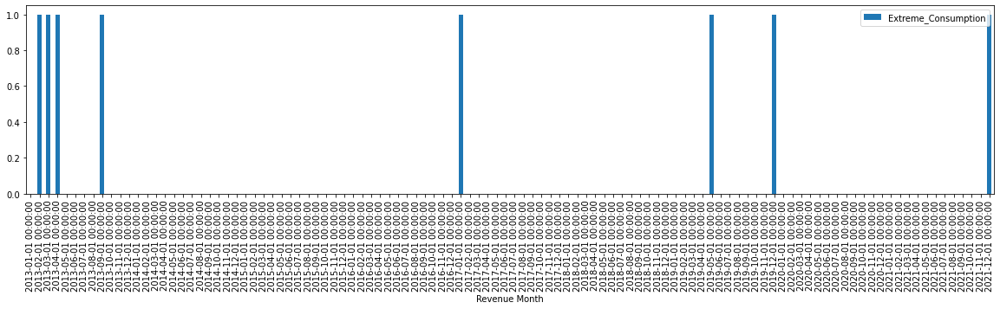

For Meter number:  E19238750


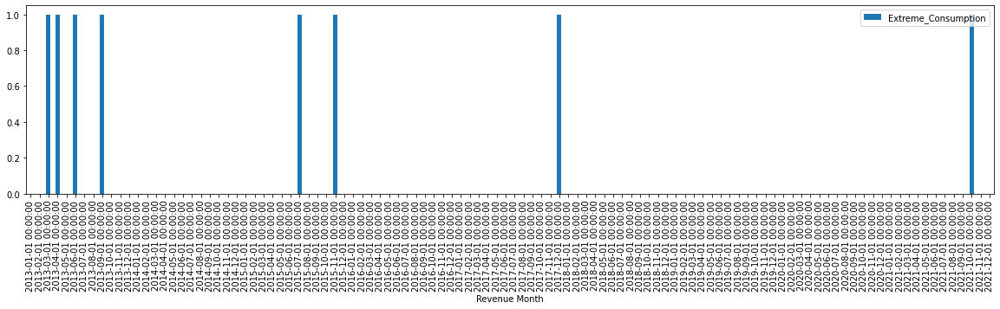

For Meter number:  O77816972


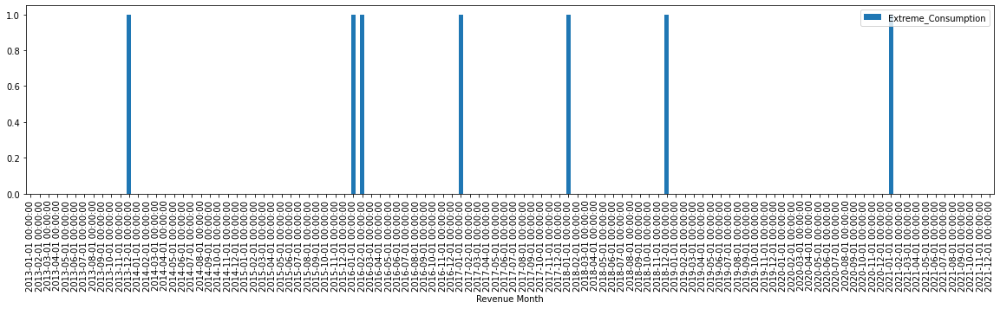

For Meter number:  I15001931


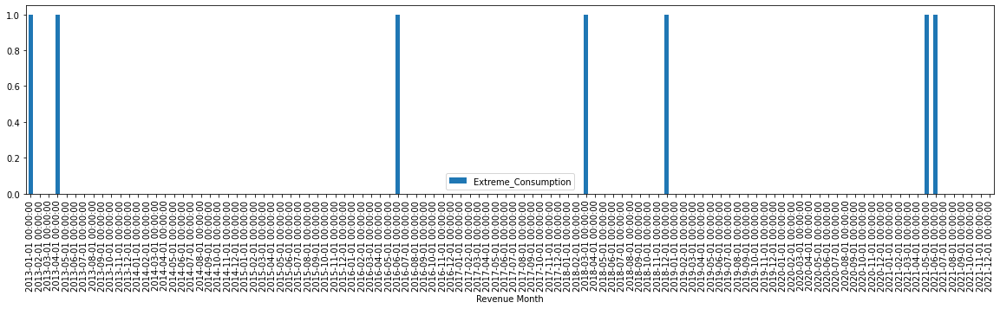

For Meter number:  V83033257


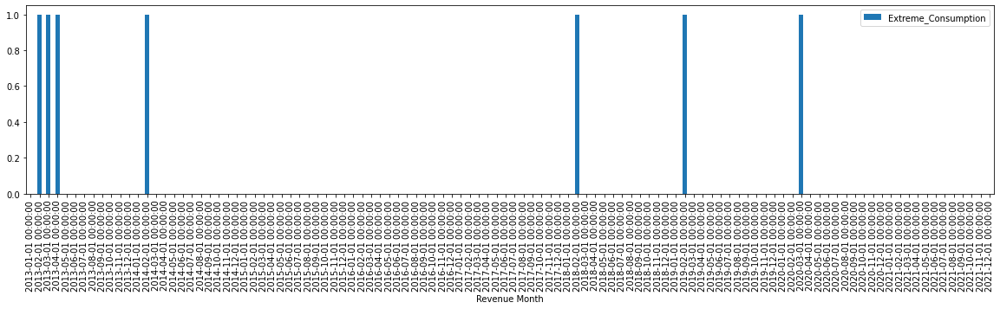

For Meter number:  E20527605


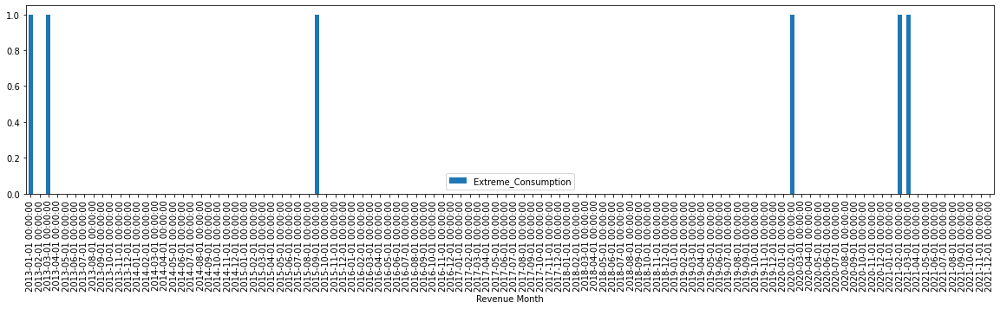

For Meter number:  E20290493


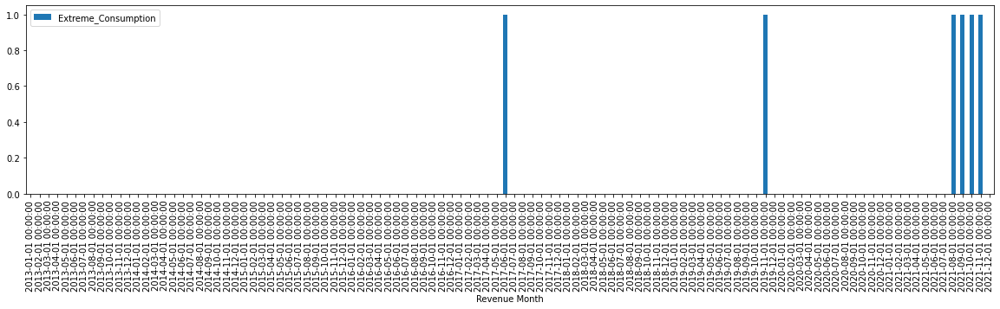

For Meter number:  E22317869


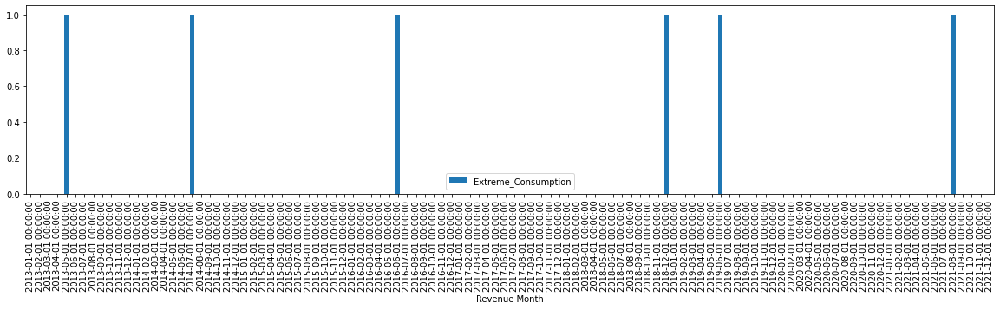

For Meter number:  E20372610


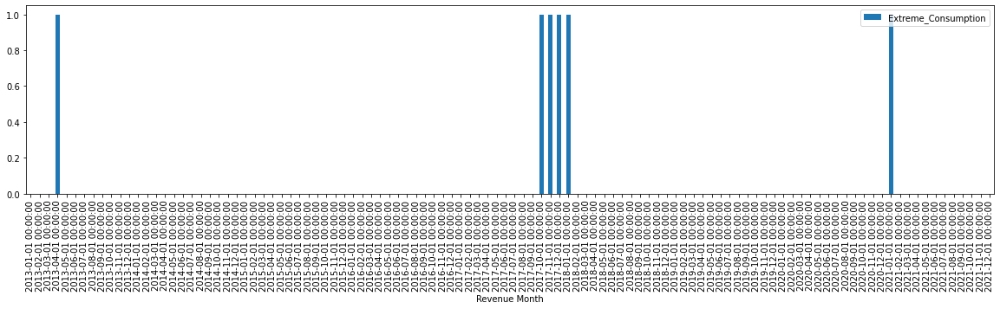

For Meter number:  E20290494


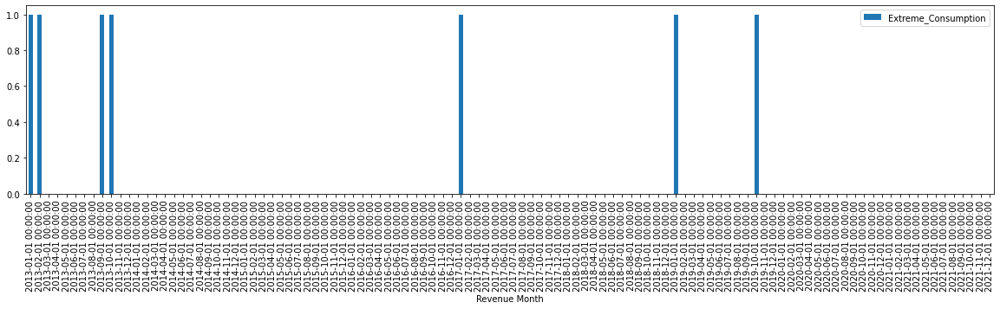

For Meter number:  E20453242


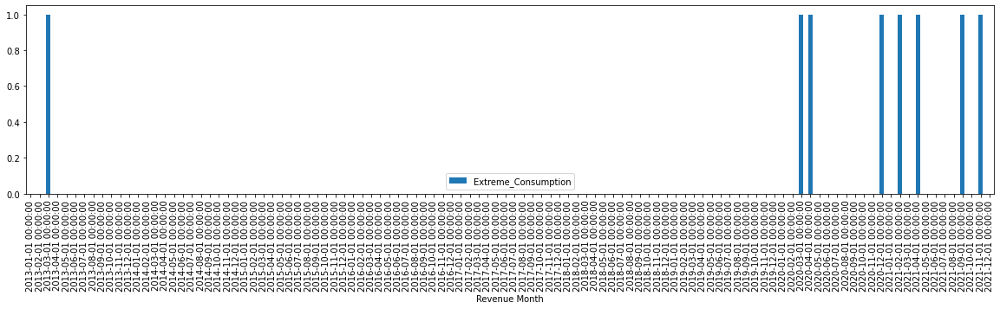

For Meter number:  E20291369


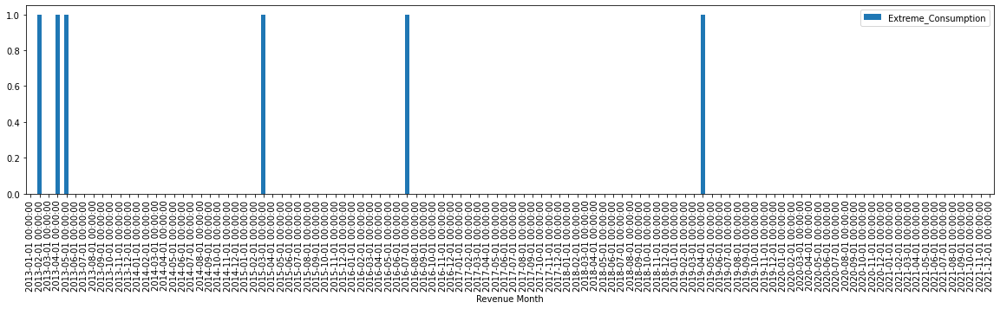

For Meter number:  E20290495


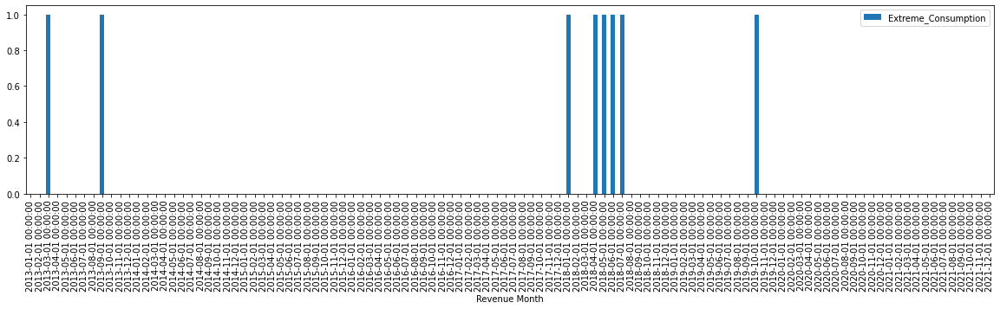

For Meter number:  E20308398


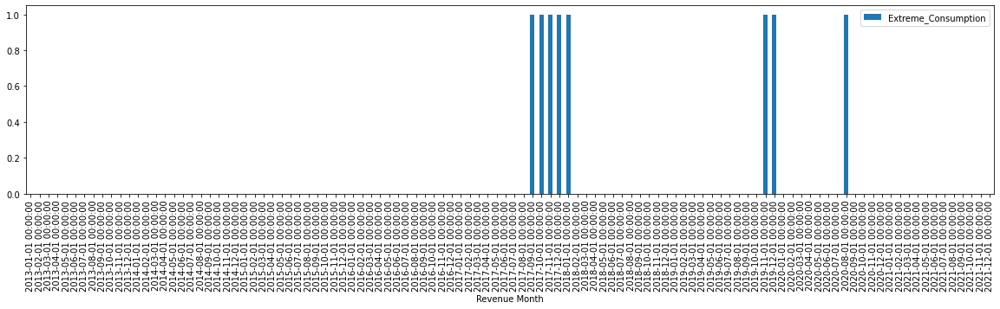

For Meter number:  E20312472


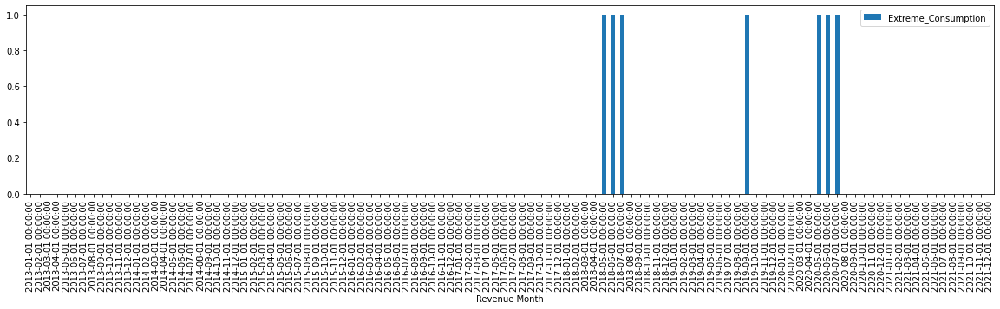

For Meter number:  E20290492


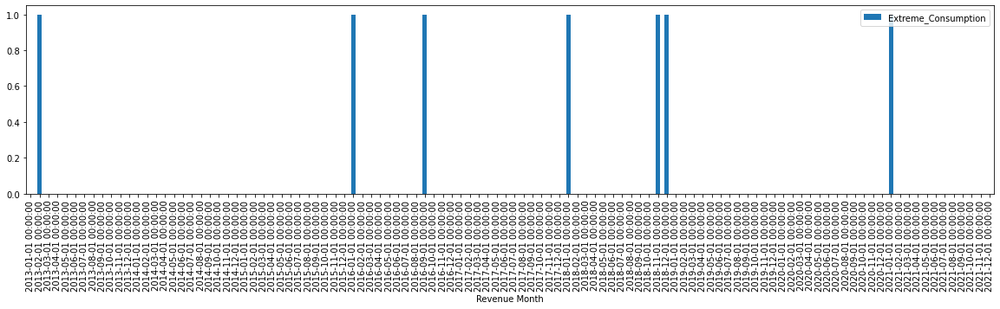

For Meter number:  E20231894


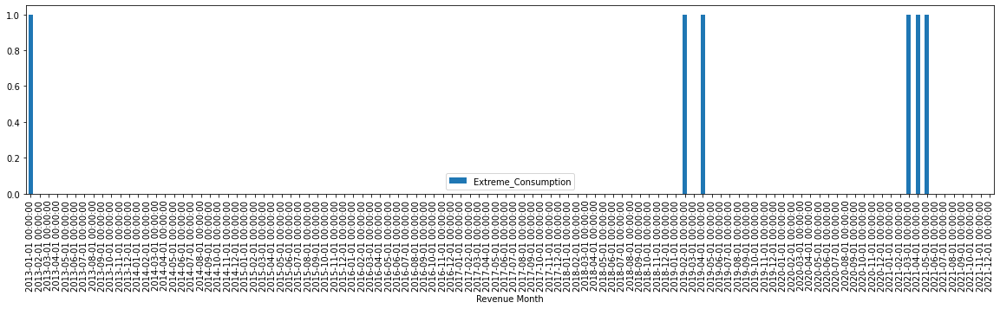

For Meter number:  E20179084


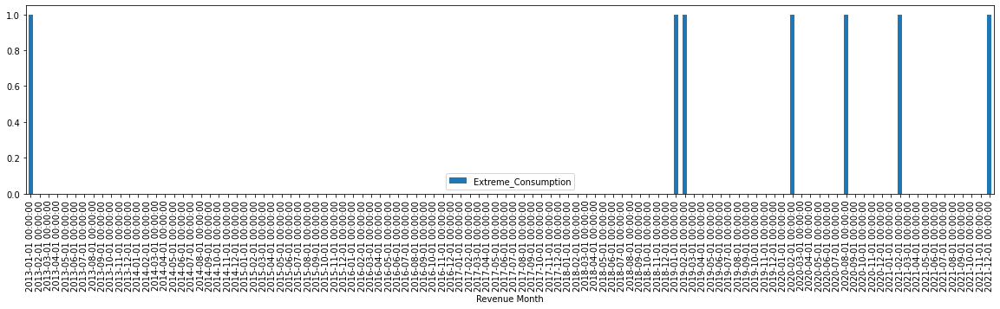

For Meter number:  E20333760


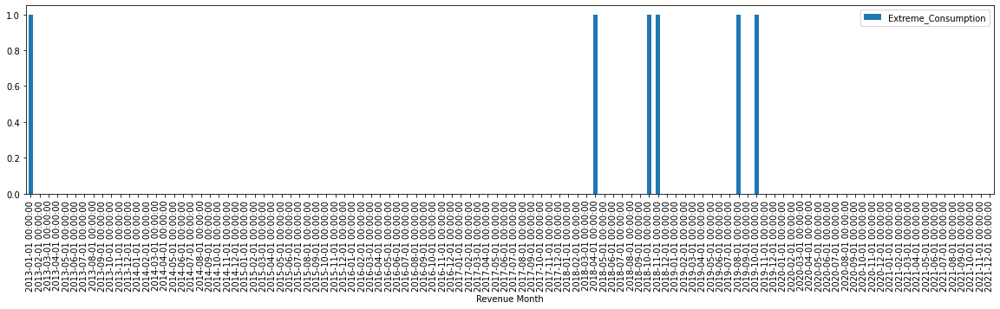

For Meter number:  E21207684


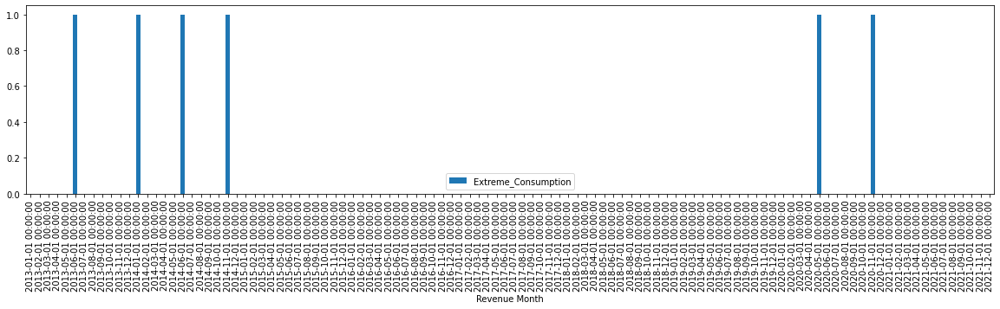

For Meter number:  E20290719


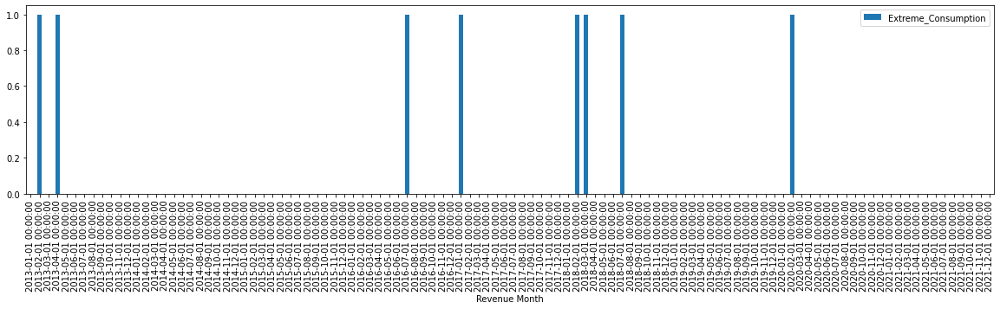

For Meter number:  E20453240


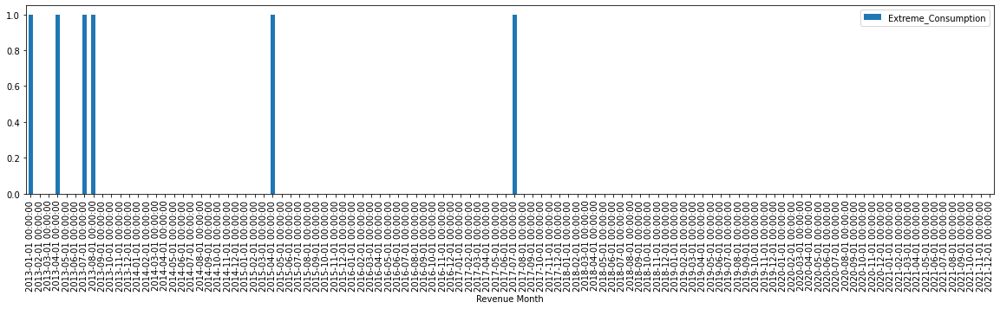

For Meter number:  E20527603


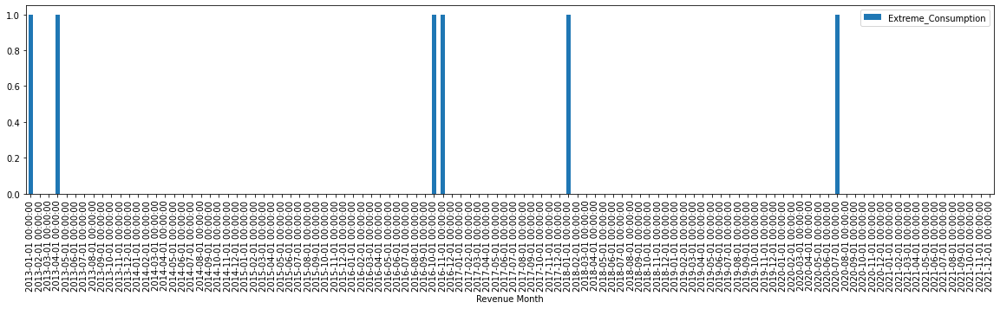

For Meter number:  E11310572


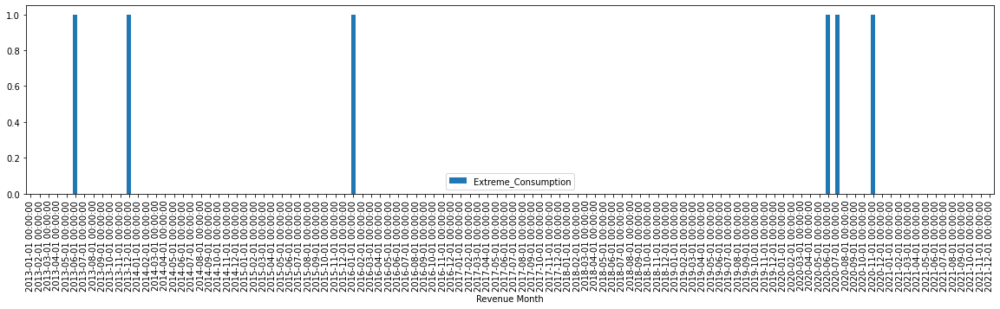

For Meter number:  N31904087


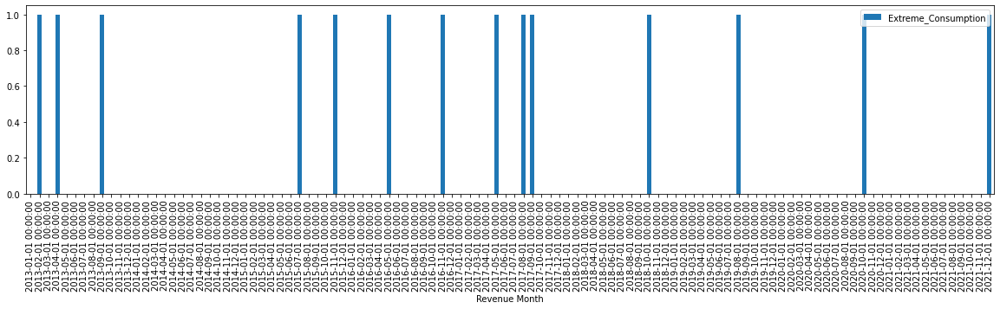

For Meter number:  O78590128


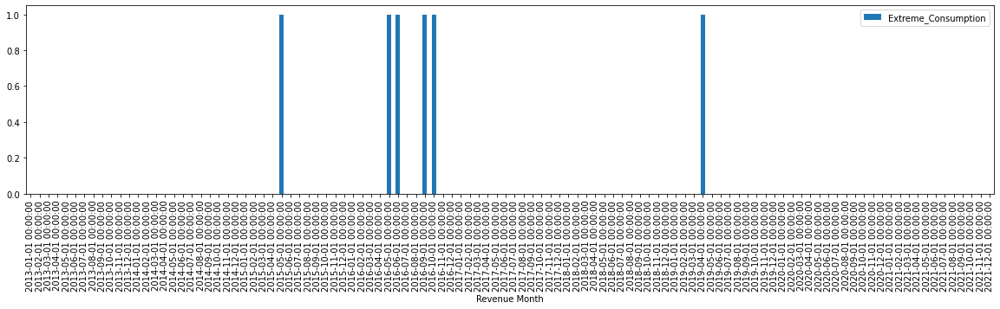

For Meter number:  K16805260


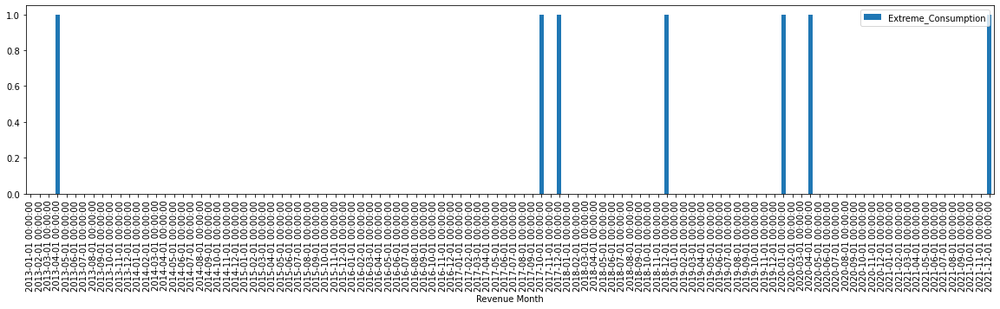

For Meter number:  O78777952


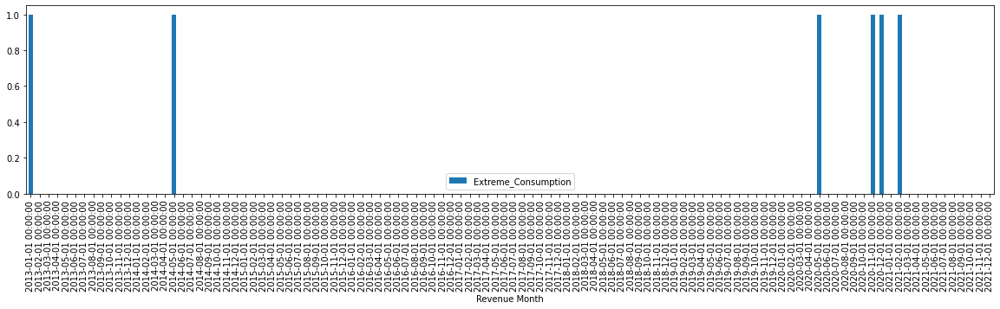

For Meter number:  E19234608


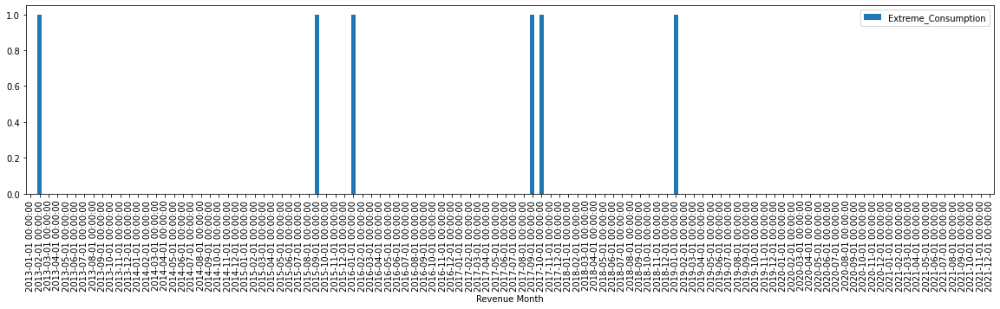

For Meter number:  I15002044


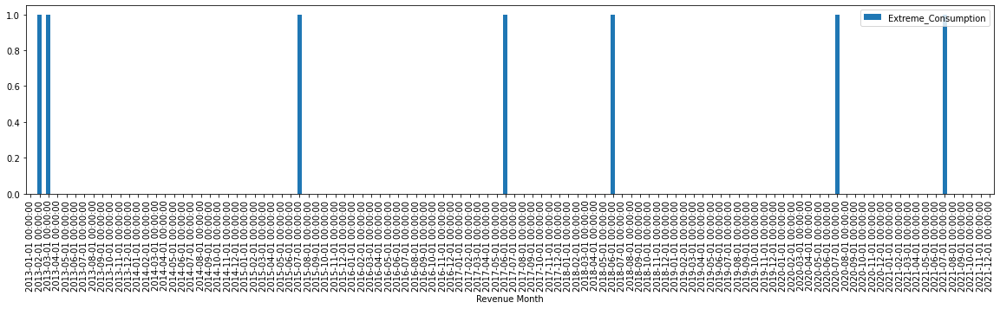

For Meter number:  I15002043


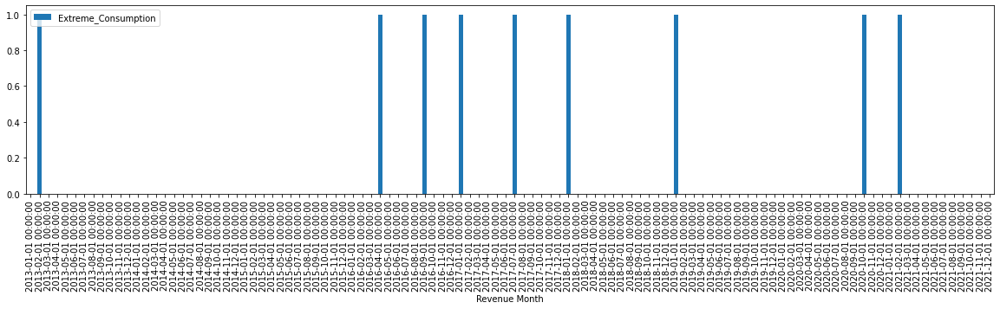

For Meter number:  D60034850


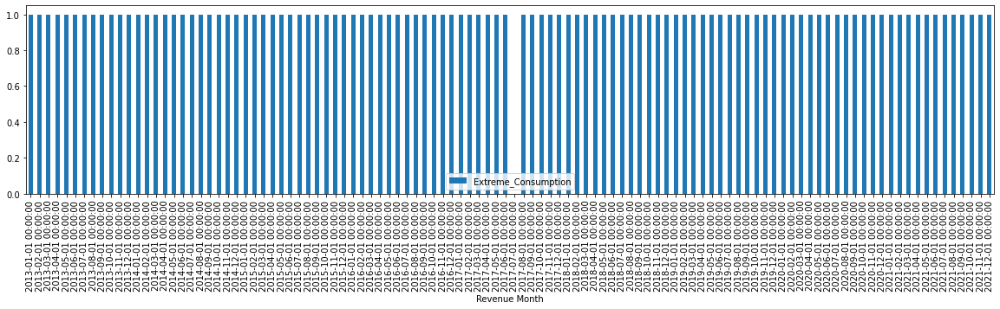

For Meter number:  E14262604


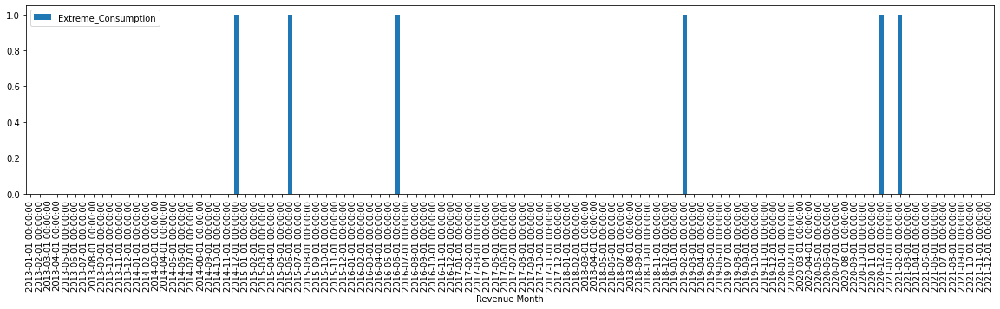

For Meter number:  V83028864


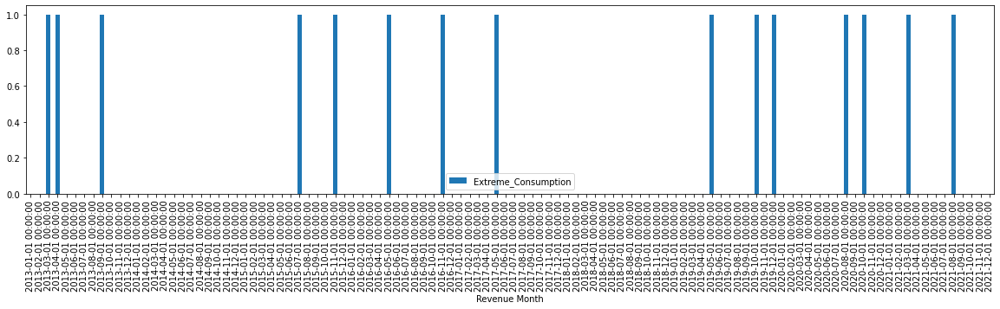

For Meter number:  V84010220


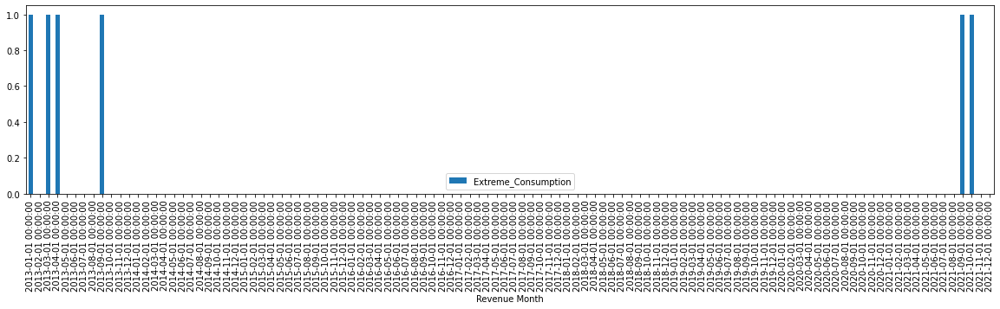

For Meter number:  V84003315


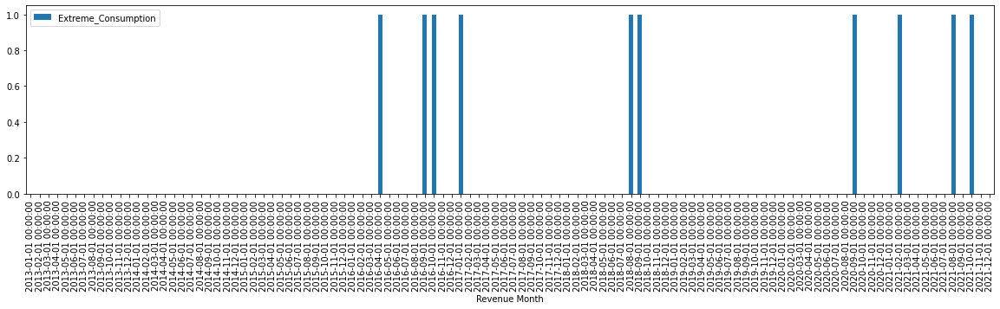

For Meter number:  N84003201


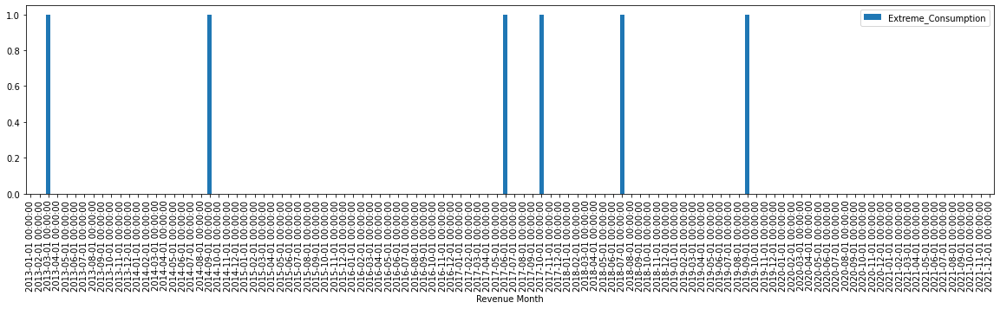

For Meter number:  V83033049


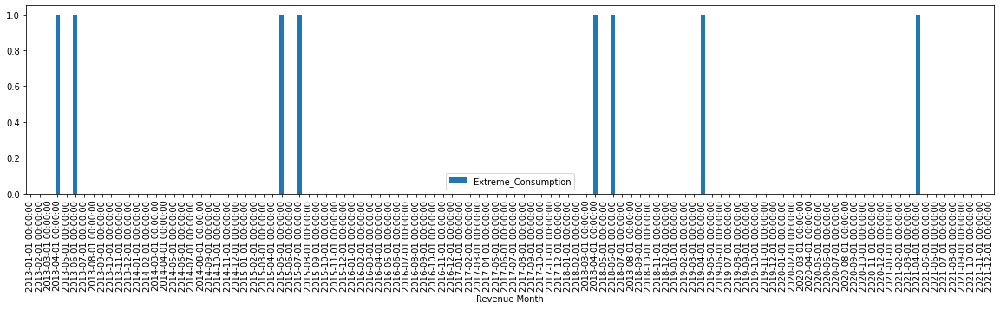

For Meter number:  V84005705


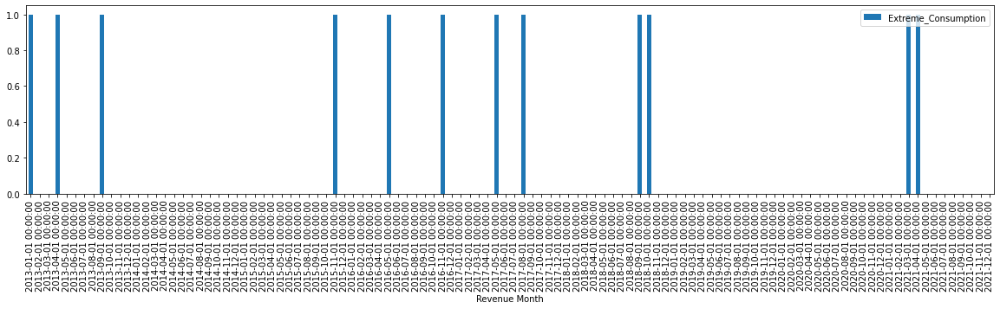

For Meter number:  V83029959


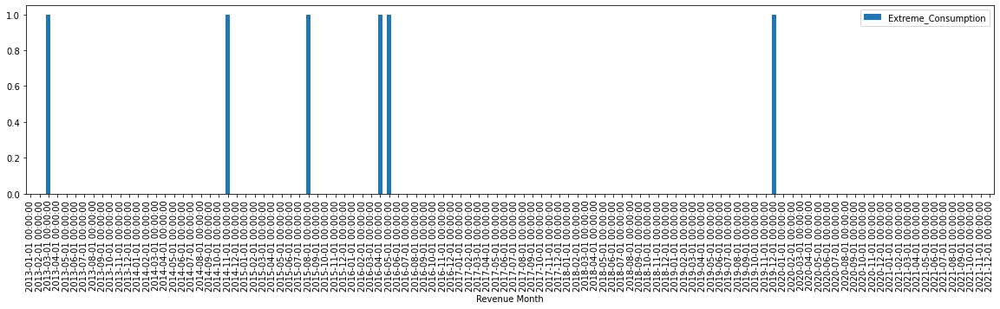

For Meter number:  V84008562


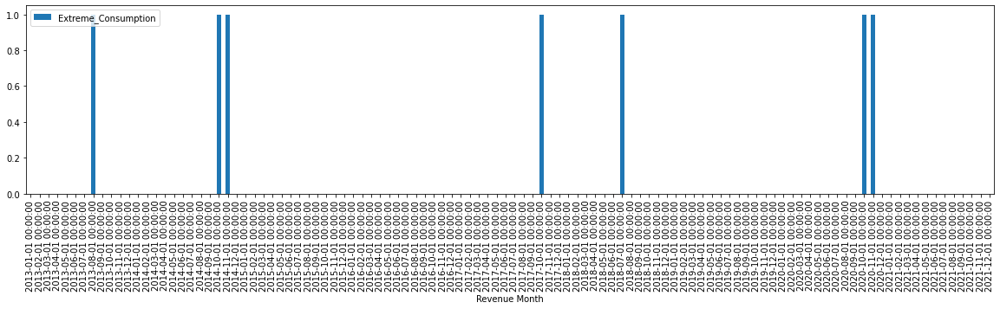

For Meter number:  V83020691


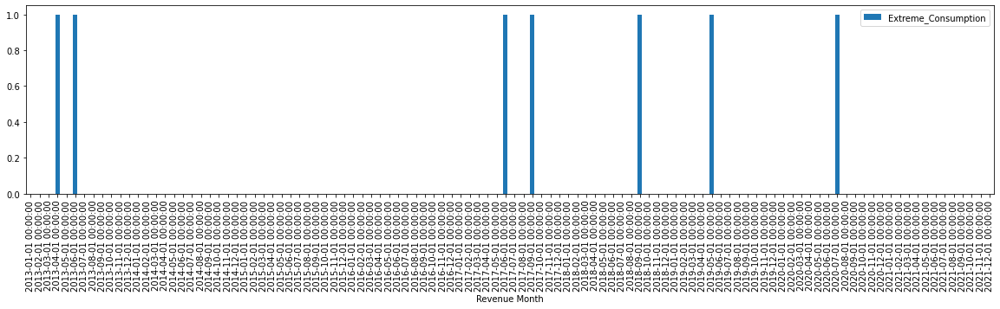

For Meter number:  K98974961


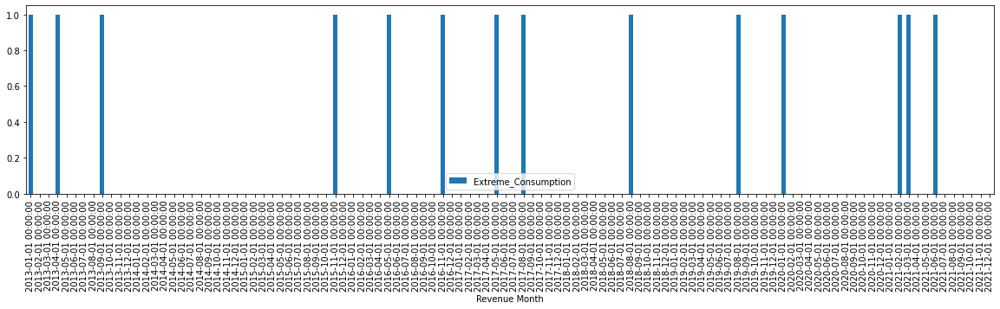

For Meter number:  E17792841


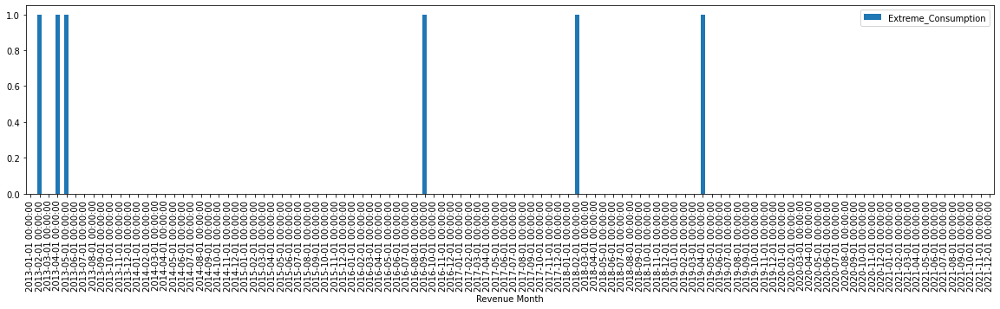

For Meter number:  I13013828


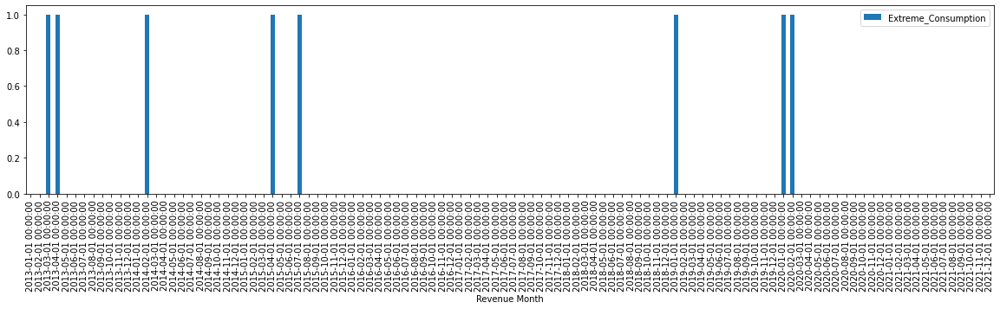

For Meter number:  I13013834


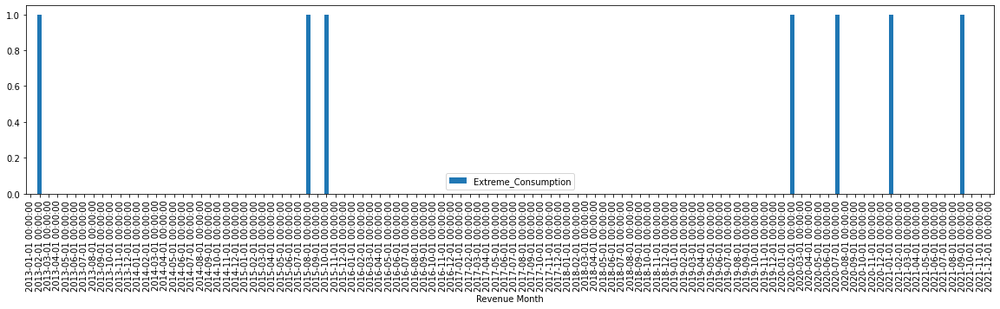

For Meter number:  E12092566


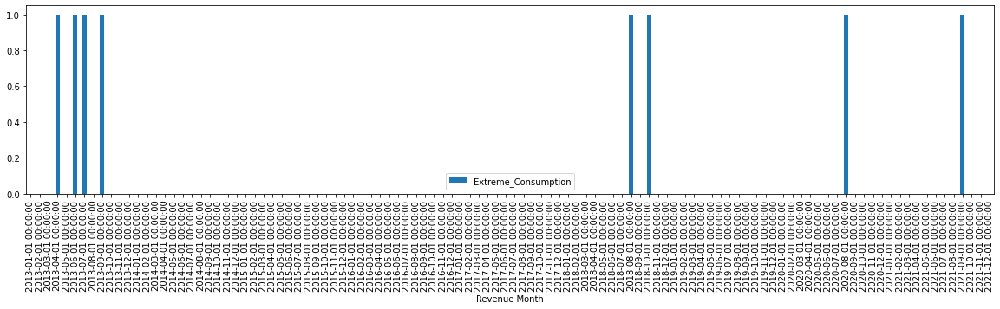

For Meter number:  K17791618


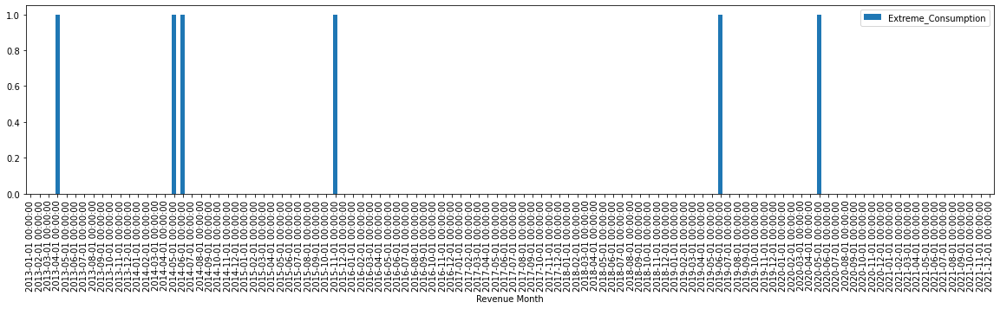

For Meter number:  N31655214


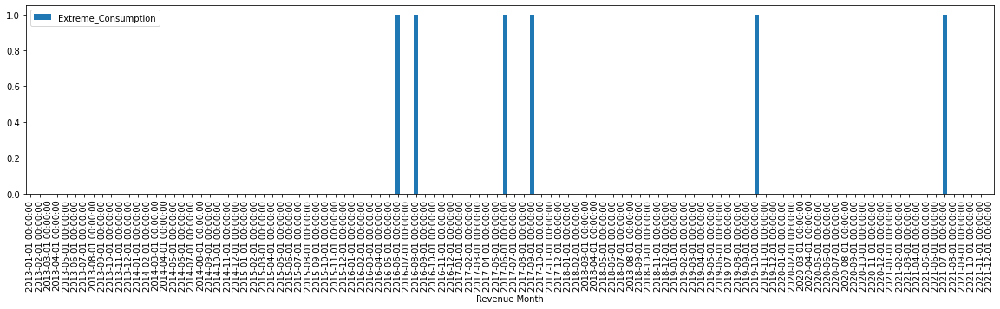

For Meter number:  I13006127


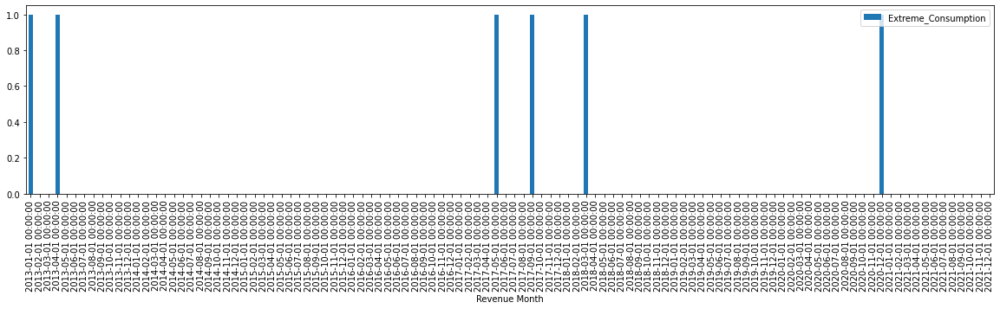

For Meter number:  I13014299


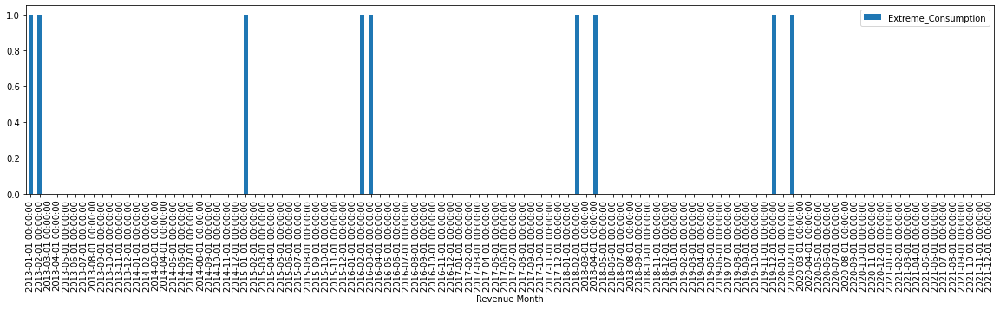

For Meter number:  O78590242


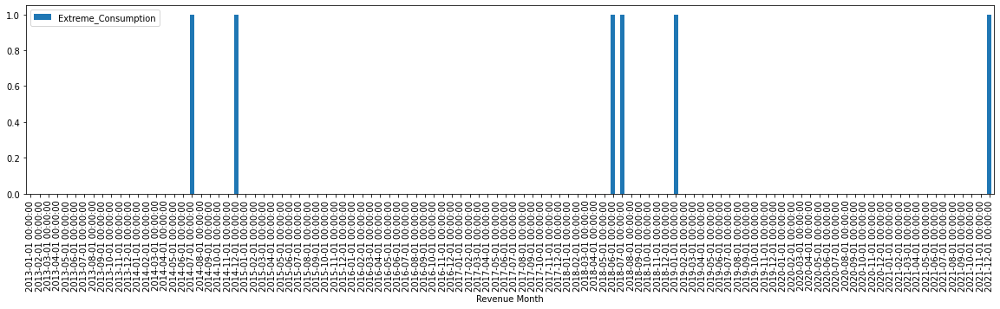

For Meter number:  O78778150


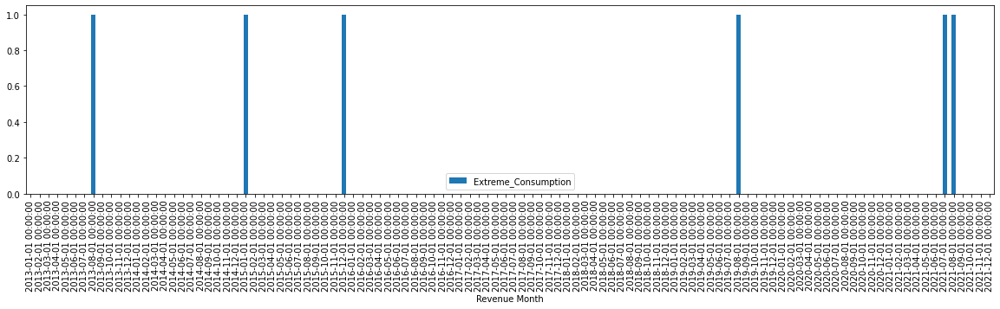

For Meter number:  K14211089


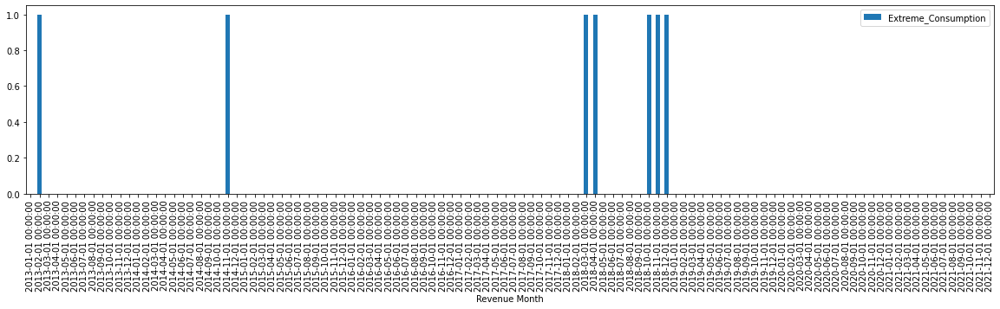

For Meter number:  K10916574


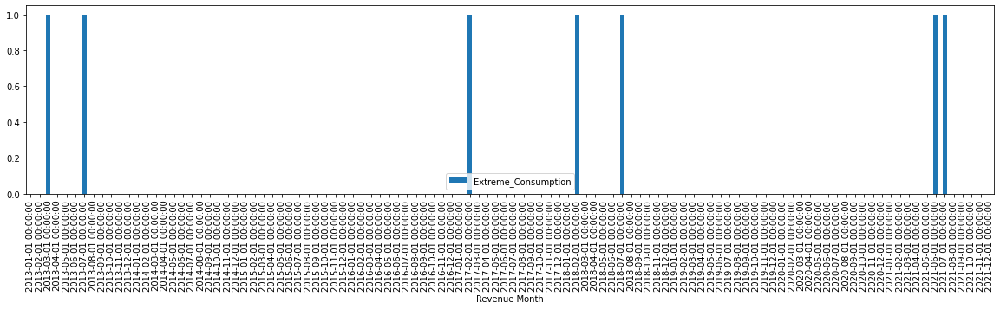

For Meter number:  V52268797


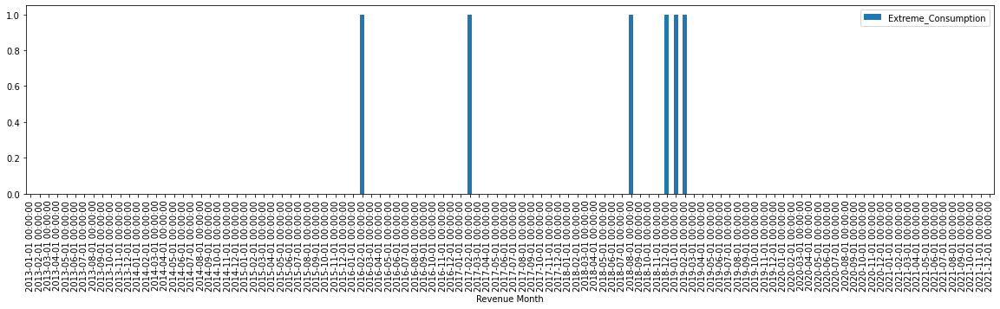

In [47]:
brooklyn_imp_df_O = pd.DataFrame()
count = 0;
plt.rcParams['figure.figsize'] = (20, 4)
brooklyn_imp_df_h['Extreme_Consumption'] = 0
for i in range(len(uniqueMeterNumbers_f)):
    print('For Meter number: ',uniqueMeterNumbers_f[i])
    building_df = brooklyn_imp_df_h.loc[brooklyn_imp_df_h['Meter Number']==uniqueMeterNumbers_f[i]]
    building_val = building_df['Consumption (H gallons)'].quantile(0.95)   
    building_df = building_df.sort_values(by=['Consumption (H gallons)'])
    for j in range(len(building_df)):
        if(building_df['Consumption (H gallons)'].iat[j] >= building_val):
            building_df['Extreme_Consumption'].iat[j]= 1 
            count += 1
    x='Revenue Month'
    y= 'Extreme_Consumption'
    building_df = building_df.sort_values(by=['Revenue Month'])
    building_df.plot.bar(x,y)
    plt.show()
    brooklyn_imp_df_O = brooklyn_imp_df_O.append(building_df)

**P. Extrem Percentile of whole data set**

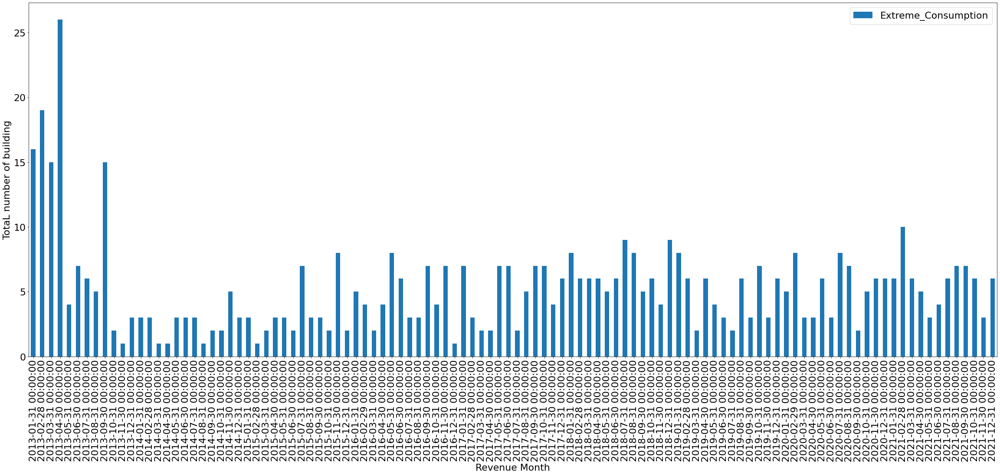

In [87]:
#Taking the average of two rows if they have same date entery values in the data set. 
brooklyn_average_df_P = brooklyn_imp_df_O.set_index('Revenue Month').groupby(pd.Grouper(freq='M')).sum()
brooklyn_average_df_P['Revenue Month'] = brooklyn_average_df_P.index
index=pd.RangeIndex(start=1, name='index')
plt.rcParams['figure.figsize'] = (40, 15)
brooklyn_average_df_P.plot.bar(x="Revenue Month", y="Extreme_Consumption")
plt.ylabel("TotaL number of building")
plt.show() # Graphing show of Current Charges
# brooklyn_average_df_P


In [49]:
Total_building = brooklyn_imp_df_O['Meter Number'].unique()
len(Total_building)


63

**Note** Extreme percentile is method of finding the extreme values of each buildings. Here we set our percentile to be 90% and we find out 90 percentile of the each buildings and analayze that in which year there was maximum extreme consumption. Why is that month have maximum etreme consumption. 

**R. Giving Unique Marks**

**Highest**

In [90]:
brooklyn_imp_df_O['Flag'] = 0
brooklyn_imp_df_O['Temperature']= 0

highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2013-04-01')]
highest = highest.loc[(highest['Extreme_Consumption']== 1)]
highest['Flag'] = 12 
highest['Temperature']= 52
# highest

second_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2013-02-01')]
second_highest = second_highest.loc[(second_highest['Extreme_Consumption']== 1)]
second_highest['Flag'] = 11
second_highest['Temperature']= 34
# second_highest

third_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2013-01-01')]
third_highest = third_highest.loc[(third_highest['Extreme_Consumption']== 1)]
third_highest['Flag'] = 10
third_highest['Temperature']= 35
# third_highest

fourth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2013-09-01')]
fourth_highest = fourth_highest.loc[(fourth_highest['Extreme_Consumption']== 1)]
fourth_highest['Flag'] = 9
fourth_highest['Temperature']= 67
# fourth_highest

fifth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2021-12-01')]
fifth_highest = fifth_highest.loc[(fifth_highest['Extreme_Consumption']== 1)]
fifth_highest['Flag'] = 8
fifth_highest['Temperature']= 44
# fifth_highest

sixth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2021-02-01')]
sixth_highest = sixth_highest.loc[(sixth_highest['Extreme_Consumption']== 1)]
sixth_highest['Flag'] = 7
sixth_highest['Temperature']= 34
# sixth_highest


seventh_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2018-07-01')]
seventh_highest = seventh_highest.loc[(seventh_highest['Extreme_Consumption']== 1)]
seventh_highest['Flag'] = 6
seventh_highest['Temperature']= 77
# seventh_highest

eighth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2019-09-01')]
eighth_highest = eighth_highest.loc[(eighth_highest['Extreme_Consumption']== 1)]
eighth_highest['Flag'] = 5 
eighth_highest['Temperature']= 70
# eighth_highest


ninth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2018-12-01')]
ninth_highest = ninth_highest.loc[(ninth_highest['Extreme_Consumption']== 1)]
ninth_highest['Flag'] = 4
ninth_highest['Temperature']= 42
# ninth_highest

tenth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2017-06-01')]
tenth_highest = tenth_highest.loc[(tenth_highest['Extreme_Consumption']== 1)]
tenth_highest['Flag'] = 3
tenth_highest['Temperature']= 72
# tenth_highest     

eleventh_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2016-05-01')]
eleventh_highest = eleventh_highest.loc[(eleventh_highest['Extreme_Consumption']== 1)]
eleventh_highest['Flag'] = 2
eleventh_highest['Temperature']= 62
# eleventh_highest

twelfth_highest = brooklyn_imp_df_O.loc[(brooklyn_imp_df_O['Revenue Month']== '2013-03-01')]
twelfth_highest = twelfth_highest.loc[(twelfth_highest['Extreme_Consumption']== 1)]
twelfth_highest['Flag'] = 1
twelfth_highest['Temperature']= 40
# twelfth_highest



Note: Here, we are selecting top twwleve extreme month manually and inserting their temperature. We are also giving the flag value to identify them in a such a way that we will able able to see where they are located. 

In [91]:
brooklyn_highest_df_R = pd.DataFrame()
brooklyn_highest_df_R=brooklyn_highest_df_R.append(highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(second_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(third_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(fourth_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(fifth_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(sixth_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(seventh_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(eighth_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(ninth_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(tenth_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(eleventh_highest)
brooklyn_highest_df_R=brooklyn_highest_df_R.append(twelfth_highest)

Note: After getting each of the extreme months and their values, we are combining them to same data set from which we can analze different asspects of extreme consumption. 

In [92]:
len(brooklyn_highest_df_R)

143

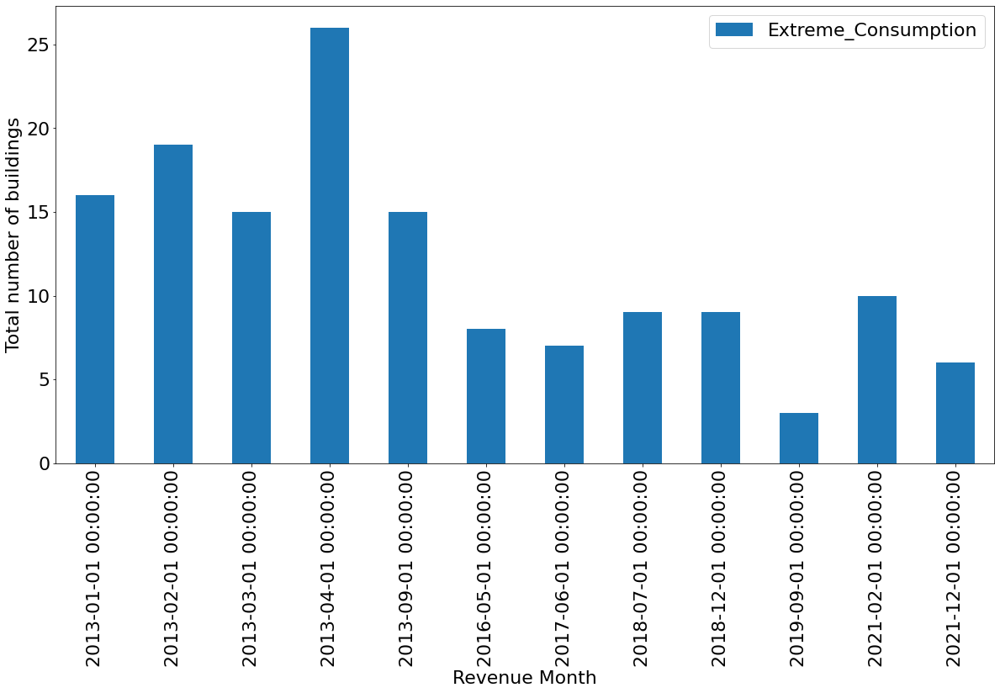

In [93]:
bb = brooklyn_highest_df_R.groupby('Revenue Month').count()
bb.reset_index(inplace=True)
plt.rcParams['figure.figsize'] = (20, 10)
bb.plot.bar(x='Revenue Month', y = 'Extreme_Consumption')
plt.ylabel("Total number of buildings")
plt.show()

In [94]:
uniqueMeterNumbers_R = brooklyn_highest_df_R['Meter Number'].unique()
print(len(uniqueMeterNumbers_R))
uniqueMeterNumbers_R

59


array(['V31960320', 'H07052143', 'V84009581', 'V84009832', 'E19238750',
       'I15001931', 'V83033257', 'E20372610', 'E20291369', 'E20290719',
       'E20453240', 'E20527603', 'N31904087', 'K16805260', 'D60034850',
       'V83028864', 'V84010220', 'V83033049', 'V84005705', 'V83020691',
       'K98974961', 'E17792841', 'I13013828', 'E12092566', 'K17791618',
       'I13006127', 'V31959109', 'K14164112', 'E99343083', 'E20290494',
       'E20290492', 'E19234608', 'I15002044', 'I15002043', 'I13013834',
       'I13014299', 'K14211089', 'E20527605', 'E20231894', 'E20179084',
       'E20333760', 'O78777952', 'K94606993', 'E20290495', 'O78590242',
       'E20453242', 'E14262604', 'V84003315', 'E20312472', 'N84003201',
       'V84008562', 'K10916574', 'O77816972', 'E22317869', 'V52268797',
       'E20290493', 'N31655214', 'O78590128', 'V83029959'], dtype=object)

Note: Here, we are finding the probality of their occurance in 12 extreme months.  

In [95]:
# manhattan_Temp_Extreme = manhattan_Temp_Extreme.sort_values(by=['Temperature'])
# manhattan_Temp_Extreme

In [96]:
# # building = manhattan_Extreme_df.loc[manhattan_Extreme_df['Consumption Grade']== 'Low']
# building = manhattan_Temp_Extreme.loc[manhattan_Temp_Extreme['Meter Number']== 'V31625176']
# building

In [97]:
brooklyn_Extreme_df = pd.DataFrame(columns=(['Meter Number', 'Total Occurance', 'Consumption Grade', 'Temp', 'Avg_temp', 'Prob']))
manhattan_Extreme_df1 = pd.DataFrame()
for i in range(len(uniqueMeterNumbers_R)):
    meter_number1 = uniqueMeterNumbers_R[i]
    building = brooklyn_highest_df_R.loc[brooklyn_highest_df_R['Meter Number']== meter_number1]
    length = len(building)
    probVal = 'Grade'
    prob = length/12
    if(prob<0.25):
        probVal='Low'
    elif(prob>=0.25 and prob<0.5):
        probVal = 'Moderate'
    elif(prob>=0.5 and prob<0.75):
        probVal = 'High'
    elif(prob>=0.5 and prob<0.75):
        probVal = ''
    elif(prob>=0.75 and prob<=1):
        probVal = 'Serve' 
        
        
    list_of_temp = building['Temperature'].to_list()
    
    Avg_temp = sum(list_of_temp)/len(list_of_temp)
    brooklyn_Extreme_df = brooklyn_Extreme_df.append({'Meter Number': meter_number1, 'Total Occurance':  length, 'Consumption Grade': probVal, 'Temp':list_of_temp, 'Avg_temp':Avg_temp, 'Prob': prob}, ignore_index=True)




In [98]:
# manhattan_Temp_Extreme = pd.DataFrame();
# for i in range(len(uniqueMeterNumbers_R)):
#     meter_number = uniqueMeterNumbers_R[i]
#     building = manhattan_highest_df_R.loc[manhattan_highest_df_R['Meter Number']== meter_number]
#     length = len(building)
#     probVal = 'Grade'
#     prob = length/12
#     if(prob<0.25):
#         probVal='Low'
#     elif(prob>=0.25 and prob<0.5):
#         probVal = 'Moderate'
#     elif(prob>=0.5 and prob<0.75):
#         probVal = 'High'
#     elif(prob>=0.5 and prob<0.75):
#         probVal = ''
#     elif(prob>=0.75 and prob<=1):
#         probVal = 'Serve'
#     building['Consumption Grade']= probVal
#     manhattan_Temp_Extreme = manhattan_Temp_Extreme.append(building)
    

In [99]:
Total_building = brooklyn_imp_df_O['Meter Number'].unique()
present_brooklyn_building = brooklyn_Extreme_df['Meter Number'].unique()

print(len(Total_building))
print(len(present_brooklyn_building))

missing_meters = set(Total_building).difference(present_brooklyn_building)
print(missing_meters)

#Remove these two lines to see missing meters 
brooklyn_Extreme_df = brooklyn_Extreme_df.append({'Meter Number': 'E11310572', 'Total Occurance':  0, 'Consumption Grade': 0, 'Temp': 50, 'Avg_temp':50, 'Prob': 0}, ignore_index=True)
brooklyn_Extreme_df = brooklyn_Extreme_df.append({'Meter Number': 'E20308398', 'Total Occurance':  0, 'Consumption Grade': 0, 'Temp':50, 'Avg_temp':50, 'Prob': 0}, ignore_index=True)
brooklyn_Extreme_df = brooklyn_Extreme_df.append({'Meter Number': 'O77816972', 'Total Occurance':  0, 'Consumption Grade': 0, 'Temp': 50, 'Avg_temp':50, 'Prob': 0}, ignore_index=True)
brooklyn_Extreme_df = brooklyn_Extreme_df.append({'Meter Number': 'V84008562', 'Total Occurance':  0, 'Consumption Grade': 0, 'Temp':50, 'Avg_temp':50, 'Prob': 0}, ignore_index=True)


# len(manhattan_Extreme_df)


present_brooklyn_Extreme_df = brooklyn_Extreme_df.sort_values(by=['Total Occurance'])

print(len(present_brooklyn_Extreme_df))

# brooklyn_Extreme_df

63
59
{'E21207684', 'E11310572', 'O78778150', 'E20308398'}
63


In [100]:
present_brooklyn_building = brooklyn_Extreme_df['Meter Number'].unique()
present_brooklyn_building
len(present_brooklyn_building)



61

In [101]:
present_brooklyn_Extreme_df

,Meter Number,Total Occurance,Consumption Grade,Temp,Avg_temp,Prob
62,V84008562,0,0,50,50.000000,0.000000
60,E20308398,0,0,50,50.000000,0.000000
59,E11310572,0,0,50,50.000000,0.000000
61,O77816972,0,0,50,50.000000,0.000000
34,I13013834,1,Low,[34],34.000000,0.083333
38,E20231894,1,Low,[35],35.000000,0.083333
40,E20333760,1,Low,[35],35.000000,0.083333
42,K94606993,1,Low,[67],67.000000,0.083333
46,E14262604,1,Low,[34],34.000000,0.083333
47,V84003315,1,Low,[34],34.000000,0.083333


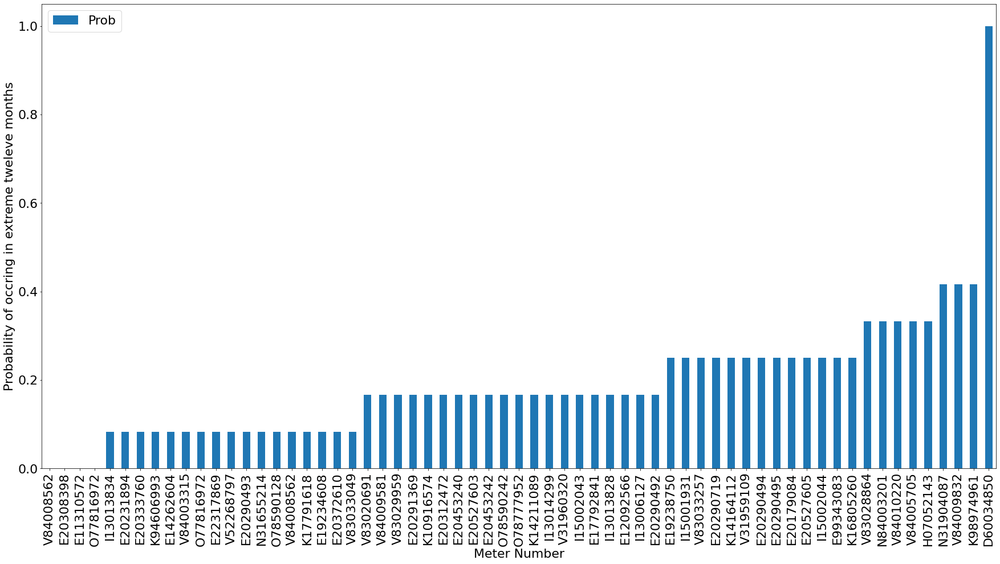

In [116]:
plt.rcParams['figure.figsize'] = (30, 15)
present_brooklyn_Extreme_df.plot.bar(y="Prob", x="Meter Number")
plt.ylabel("Probability of occring in extreme tweleve months")
plt.show() 

Prob
0.000000     4
0.083333    17
0.166667    20
0.250000    13
0.333333     5
0.416667     3
1.000000     1
Name: Prob, dtype: int64


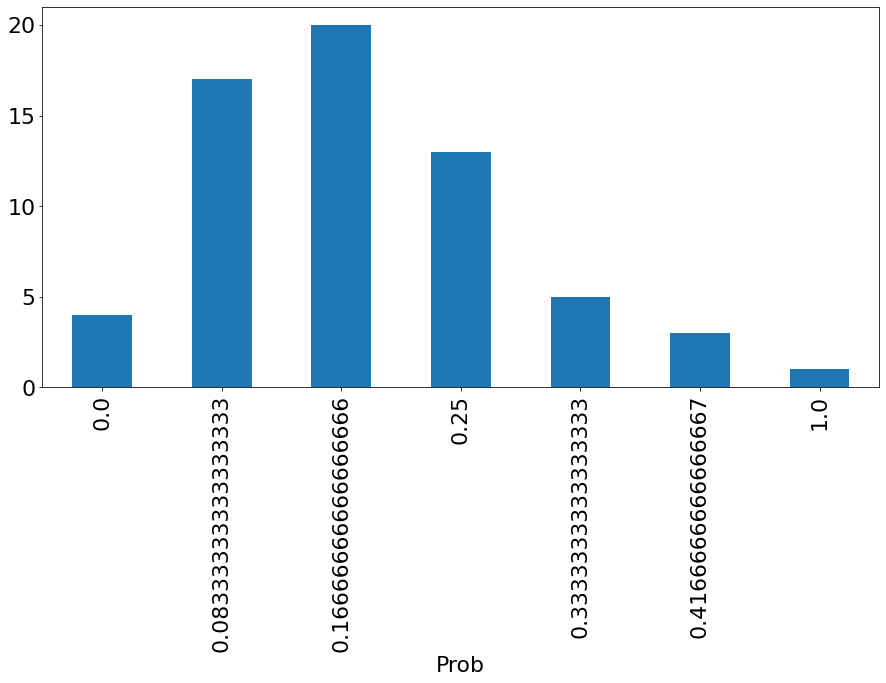

In [103]:
prob_count = present_brooklyn_Extreme_df.groupby(['Prob'])['Prob'].count()
print(prob_count)
22
prob_count.plot.bar(x="Prob", y="count")
plt.show()

<AxesSubplot:>

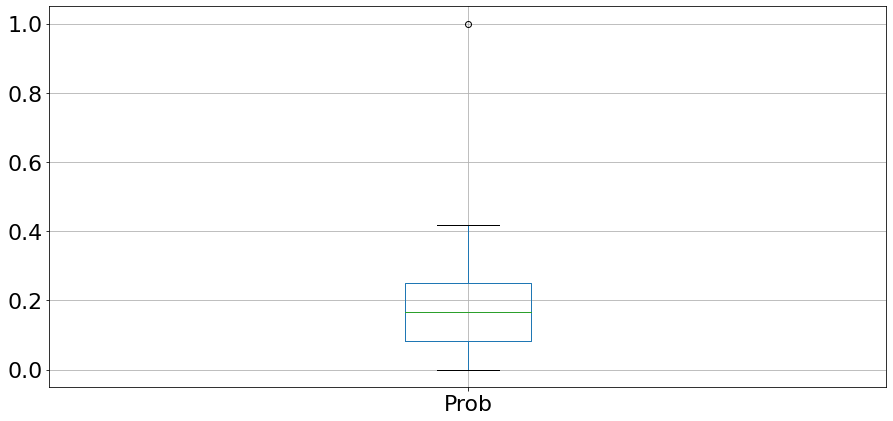

In [104]:


present_brooklyn_Extreme_df["Prob"]=present_brooklyn_Extreme_df["Prob"].astype(float)

# present_manhattan_Extreme_df["Avg_temp"]=present_manhattan_Extreme_df["Avg_temp"].astype(float)


present_brooklyn_Extreme_df.boxplot(column=["Prob"])

# present_manhattan_Extreme_df['Avg_temp']
# present_manhattan_Extreme_df["Prob"]


# plt.show()

In [105]:
print(len(present_brooklyn_Extreme_df['Meter Number'].unique()))
present_brooklyn_Extreme_df['Meter Number'].unique()



61


array(['V84008562', 'E20308398', 'E11310572', 'O77816972', 'I13013834',
       'E20231894', 'E20333760', 'K94606993', 'E14262604', 'V84003315',
       'E22317869', 'V52268797', 'E20290493', 'N31655214', 'O78590128',
       'K17791618', 'E19234608', 'E20372610', 'V83033049', 'V83020691',
       'V84009581', 'V83029959', 'E20291369', 'K10916574', 'E20312472',
       'E20453240', 'E20527603', 'E20453242', 'O78590242', 'O78777952',
       'K14211089', 'I13014299', 'V31960320', 'I15002043', 'E17792841',
       'I13013828', 'E12092566', 'I13006127', 'E20290492', 'E19238750',
       'I15001931', 'V83033257', 'E20290719', 'K14164112', 'V31959109',
       'E20290494', 'E20290495', 'E20179084', 'E20527605', 'I15002044',
       'E99343083', 'K16805260', 'V83028864', 'N84003201', 'V84010220',
       'V84005705', 'H07052143', 'N31904087', 'V84009832', 'K98974961',
       'D60034850'], dtype=object)

In [106]:
present_brooklyn_Extreme_df['Zip_code'] = 'null'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V84008562', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20308398', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E11310572', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='O77816972', 'Zip_code'] = '11233'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20290719', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I15002043', 'Zip_code'] = '11233'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I13014299', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K14211089', 'Zip_code'] = '11206'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20333760', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20290495', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V84003315', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K14164112', 'Zip_code'] = '11207'


present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='O78590242', 'Zip_code'] = '11221'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='O78777952', 'Zip_code'] = '11233'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E22317869', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20312472', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E21207684', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20290493', 'Zip_code'] = '11203'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='N84003201', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V83029959', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20290492', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K10916574', 'Zip_code'] = '11206'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20453242', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K94606993', 'Zip_code'] = '11221'


present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20453240', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V52268797', 'Zip_code'] = '11206'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='N31655214', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I15002044', 'Zip_code'] = '11233'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E19234608', 'Zip_code'] = '11233'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E14262604', 'Zip_code'] = '11223'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V31960320', 'Zip_code'] = '11211'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V31959109', 'Zip_code'] = '11211'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20372610', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K17791618', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I13013828', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K16805260', 'Zip_code'] = '11233'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V83033049', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V83033257', 'Zip_code'] = '11208'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20291369', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20527603', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='O78590128', 'Zip_code'] = '11233'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V84009832', 'Zip_code'] = '11233'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20290494', 'Zip_code'] = '11203'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V84010220', 'Zip_code'] = '11233'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='O78778150', 'Zip_code'] = '11221'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V83020691', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E99343083', 'Zip_code'] = '11237'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E17792841', 'Zip_code'] = '11213'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E12092566', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I13006127', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V84009581', 'Zip_code'] = '11237'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I15001931', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20527605', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E19238750', 'Zip_code'] = '11233'


present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='I13013834', 'Zip_code'] = '11213'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='H07052143', 'Zip_code'] = '11237'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20179084', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V84005705', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='E20231894', 'Zip_code'] = '11225'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='K98974961', 'Zip_code'] = '11231'

present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='N31904087', 'Zip_code'] = '11212'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='V83028864', 'Zip_code'] = '11229'
present_brooklyn_Extreme_df.loc[present_brooklyn_Extreme_df['Meter Number']=='D60034850', 'Zip_code'] = '11201'
present_brooklyn_Extreme_df

,Meter Number,Total Occurance,Consumption Grade,Temp,Avg_temp,Prob,Zip_code
62,V84008562,0,0,50,50.000000,0.000000,11212
60,E20308398,0,0,50,50.000000,0.000000,11225
59,E11310572,0,0,50,50.000000,0.000000,11212
61,O77816972,0,0,50,50.000000,0.000000,11233
34,I13013834,1,Low,[34],34.000000,0.083333,11213
38,E20231894,1,Low,[35],35.000000,0.083333,11225
40,E20333760,1,Low,[35],35.000000,0.083333,11203
42,K94606993,1,Low,[67],67.000000,0.083333,11221
46,E14262604,1,Low,[34],34.000000,0.083333,11223
47,V84003315,1,Low,[34],34.000000,0.083333,11213


In [107]:
# present_brooklyn_Extreme_df["Zip_code"]

   Zip_code      Prob   Avg_temp
0     11201  1.000000  52.416667
1     11203  0.166667  47.150000
2     11206  0.138889  46.166667
3     11207  0.250000  50.333333
4     11208  0.250000  42.000000
5     11211  0.208333  46.416667
6     11212  0.166667  54.533333
7     11213  0.150000  48.325000
8     11221  0.125000  63.750000
9     11223  0.083333  34.000000
10    11225  0.142857  46.857143
11    11229  0.333333  55.250000
12    11231  0.416667  50.000000
13    11233  0.189394  45.460606
14    11237  0.250000  52.750000


<AxesSubplot:xlabel='Zip_code', ylabel='[Avg_temp]'>

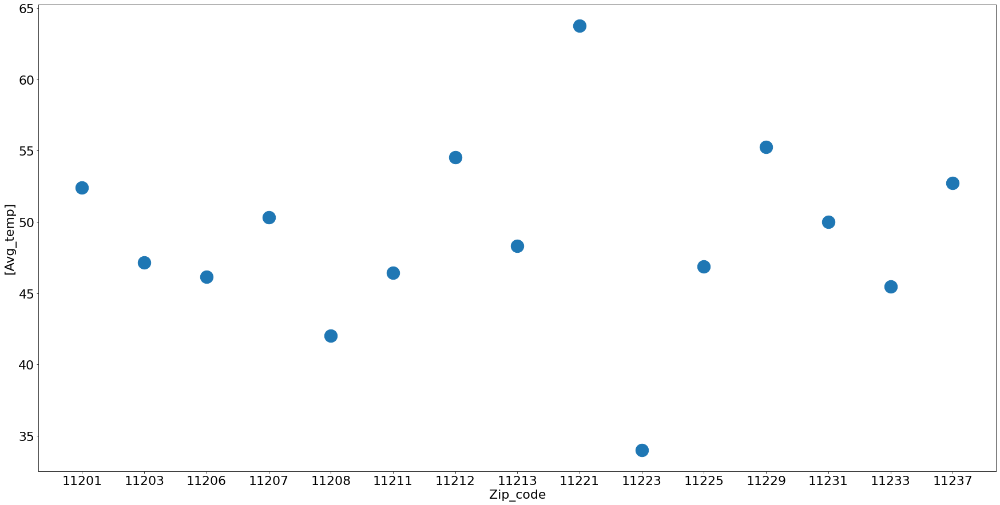

In [125]:
aa = present_brooklyn_Extreme_df.groupby('Zip_code')['Prob', 'Avg_temp'].agg('mean')
aa.reset_index(inplace=True)
print(aa)
aa.plot.scatter(y=["Avg_temp"], x="Zip_code", s=500)

   Zip_code  Prob  Avg_temp
0     11201     1         1
1     11203    10        10
2     11206     3         3
3     11207     1         1
4     11208     1         1
5     11211     2         2
6     11212     9         9
7     11213    10        10
8     11221     2         2
9     11223     1         1
10    11225     7         7
11    11229     1         1
12    11231     1         1
13    11233    11        11
14    11237     3         3


Text(0, 0.5, 'Total number of building')

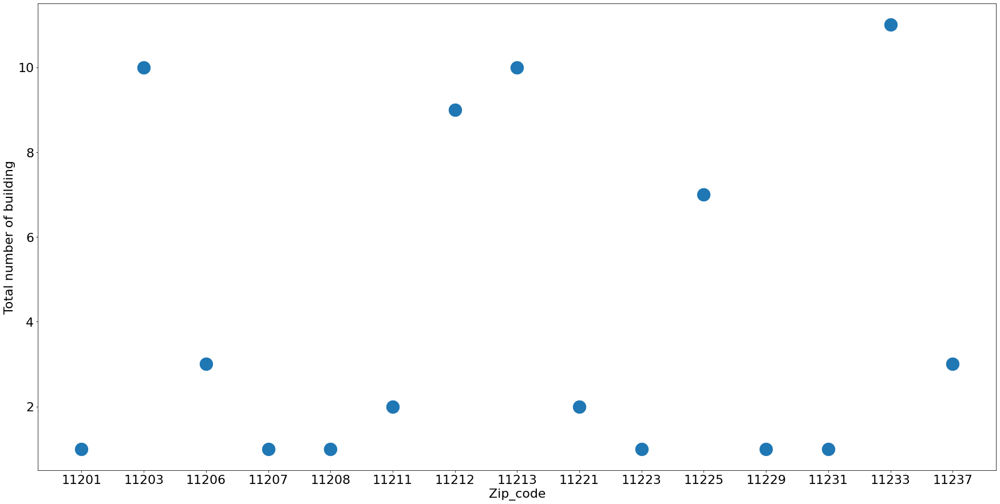

In [123]:
aa = present_brooklyn_Extreme_df.groupby('Zip_code')['Prob', 'Avg_temp'].count()
aa.reset_index(inplace=True)
plt.rcParams['figure.figsize'] = (30, 15)
print(aa)
aa.plot.scatter(y=["Prob"], x="Zip_code", s=500)
plt.ylabel("Total number of building")

In [110]:
# plt.rcParams['figure.figsize'] = (30, 15)
# present_manhattan_Extreme_df.plot.scatter(y="Prob", x="Zip_code", s=500)
# # plt.yticks(fontsize=24)
# # plt.xticks(fontsize=24)

# font = {'family' : 'normal',
#         'size'   : 24}
# plt.rc('font', **font)

# plt.show()

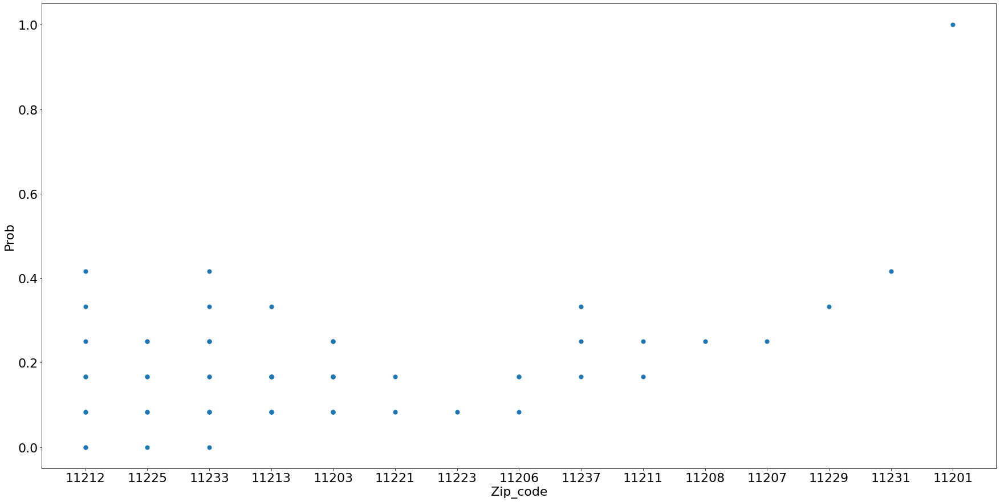

In [111]:
plt.rcParams['figure.figsize'] = (30, 15)
present_brooklyn_Extreme_df.plot.scatter(y="Prob", x="Zip_code", s=50)
# plt.yticks(fontsize=24)
# plt.xticks(fontsize=24)

font = {'family' : 'normal',
        'size'   : 24}
plt.rc('font', **font)

plt.show()

**S. Trend Analysis**

In [112]:
count = 0
count1 = 0
count2  = 0
import seaborn
pos_sig = 0
sig =0
neg_sig =0 
no_sig =0
brooklyn_Trend_df = pd.DataFrame(columns=(['Meter Number', 'Significance', 'slope_coefficient']))


from datetime import date
for i in range(len(uniqueMeterNumbers_f)):
    meter_number1 = uniqueMeterNumbers_f[i]
    
    building = brooklyn_imp_df_h.loc[brooklyn_imp_df_h['Meter Number']==meter_number1]
    building = building[['Revenue Month','Consumption (H gallons)']]
    building = building.sort_values(by='Revenue Month')
    
    #To draw the regration graph 
    
#     building['date_ordinal'] = pd.to_datetime(building['Revenue Month']).apply(lambda date: date.toordinal())

#     ax = seaborn.regplot(
#     data=building,
#     x='date_ordinal',
#     y='Consumption (H gallons)',
#     )
#     # Tighten up the axes for prettiness
#     ax.set_xlim(building['date_ordinal'].min() - 1, building['date_ordinal'].max() + 1)
#     ax.set_ylim(0, building['Consumption (H gallons)'].max() + 1)
    
#     ax.set_xlabel('Revenue Month')
#     new_labels = [date.fromordinal(int(item)) for item in ax.get_xticks()]
#     ax.set_xticklabels(new_labels)
#     plt.show()
    
    #To calculate the regresssion 
    
    y=np.array(building['Consumption (H gallons)'].dropna().values, dtype=float)
    x=np.array(pd.to_datetime(building['Consumption (H gallons)'].dropna()).index.values, dtype=float)
    slope, intercept, r_value, p_value, std_err =sp.linregress(x,y)
    xf = np.linspace(min(x),max(x),100)
    xf1 = xf.copy()
    xf1 = pd.to_datetime(xf1)
    yf = (slope*xf)+intercept
#     print('slope =',slope, 'r = ', r_value, '\n', 'p = ', p_value, '\n', 's = ', std_err)
    
    
#     if (r_value > 0):
#         count += 1
#     elif(r_value==0):
#         count1 += 1
#     else: 
#         count2 += 1
                                      
    if(p_value<0.05):
#         Significant = 'Significant'
        if(r_value>0):
            Significant = 'Positive Significant'
            pos_sig +=1
        elif(r_value<0):
            Significant = 'Negative Significant'
            neg_sig +=1
        else:
            Significant = 'Neutral'
            sig +=1 
            
    else:
        if(r_value>0):
                Significant = 'No_Significant(Positive)'
        else:
            Significant = 'No_Significant(Negative)'
            
#         no_sig +=1
    
    
    brooklyn_Trend_df = brooklyn_Trend_df.append({'Meter Number': meter_number1, 'Significance': Significant, 'slope_coefficient': r_value}, ignore_index=True)



In [113]:
brooklyn_Trend_df
present_brooklyn_Extreme_df
brooklyn_final = pd.merge(present_brooklyn_Extreme_df.reset_index(), brooklyn_Trend_df.reset_index(), how='inner', on=['Meter Number'])




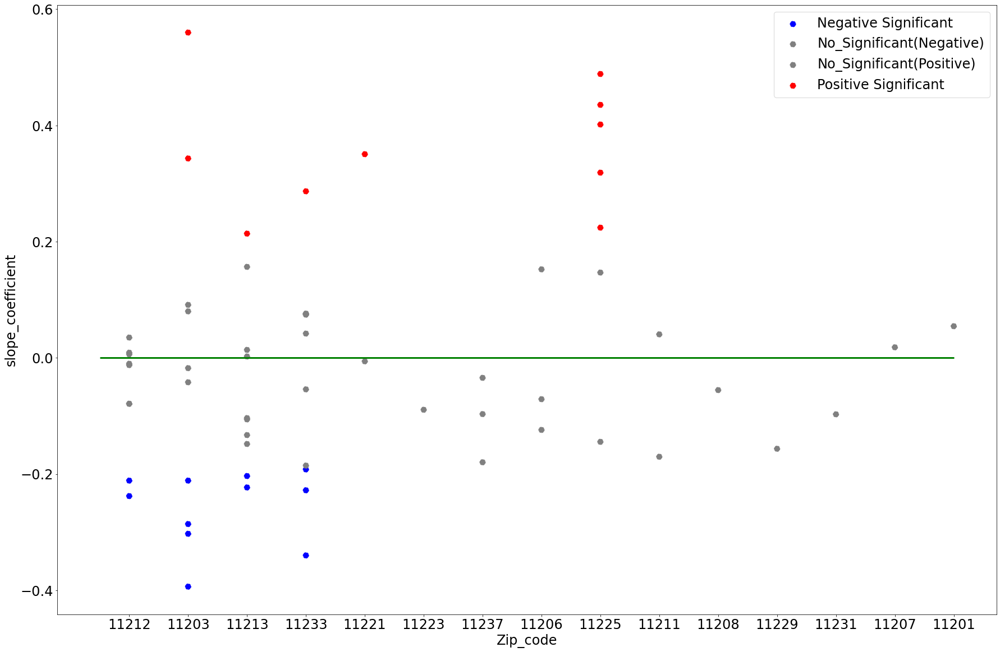

In [114]:
plt.rcParams['figure.figsize'] = (30, 20)

fig, ax = plt.subplots()

colors = {'No_Significant(Positive)':'grey','No_Significant(Negative)':'grey', 'Positive Significant':'red', 'Negative Significant':'blue'}

grouped = brooklyn_final.groupby('Significance')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='Zip_code', y='slope_coefficient', label=key, color=colors[key], s = 100, linestyle='--')
plt.hlines(y=0, xmin=-0.5, xmax= 14, colors='green', linestyles='-', lw=3)
plt.show()

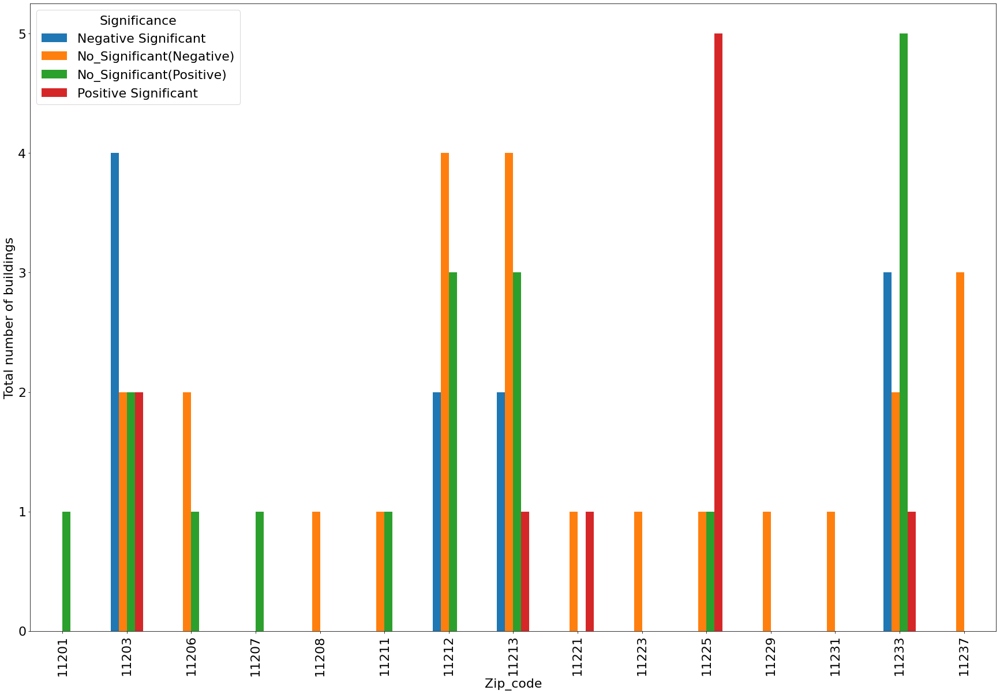

In [126]:
fig, ax = plt.subplots(figsize=(30,20))
brooklyn_final.groupby(['Zip_code','Significance']).count()['Total Occurance'].unstack().plot.bar(ax=ax)
font = {'family' : 'normal','weight' : 'normal', 'size'   : 22}  
plt.rc('font', **font)  
plt.ylabel("Total number of buildings")
plt.show()

